<a href="https://colab.research.google.com/github/ManuelaAndreaBeyer/ANNsPerformingCognitiveTasksUnderStress/blob/main/GSKM_analysis_plan_complete_colab_2026SEP24.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# GSKM stress-regulation analysis — analysis-plan aligned Colab notebook

This notebook replaces the earlier exploratory notebook with a workflow that follows the current analysis plan consistently.

## Models retained

1. **1-node Amygdala model** — methodological GSKM introduction only.
2. **2-node Amygdala–mPFC model (A–P)** — primary/core model.
3. **2-region + cortisol model (A–P–C)** — minimal explicit stress/HPA extension; mathematically a 3-state model.
4. **3-node Amygdala–mPFC–Hippocampus model (A–P–H)** — alternative neural context/safety extension.
5. **4-state Amygdala–mPFC–Hippocampus–cortisol model (A–P–H–C)** — later combined extension.

## Deliberately removed from the main analysis

- hand-designed **“resilience-biased”** parameter regimes;
- Kuramoto analysis;
- LC/NE as a default third node;
- treating a large E/I-RNN neuron-by-neuron as a GSKM;
- interpreting `P(stable)` alone as biological resilience.

The notebook instead asks which **structures, generalized parameters, and parameter combinations** support local stability, recovery, and resistance to persistent perturbation.

## Main outputs

Every major intermediate analysis produces a figure and, where applicable, a numerical/statistical table. Figures are saved automatically as:

- `.png`
- `.svg`
- `.pdf`

Tables are saved as `.csv`.

By default, all outputs are written to the **current working directory (`Path.cwd()`)**. In Colab, if you mount Google Drive and `chdir()` into a Drive folder first, the files are therefore written directly into Drive.

> Important GSKM limitation: a generalized model does not provide full nonlinear trajectories because the process functions are unspecified. The notebook therefore performs **local steady-state, eigenvalue, perturbation, stability-boundary, and local bifurcation analyses**. It does not fabricate nonlinear time-series.

## 0. Colab / output setup

### Saving directly to Google Drive

In Google Colab you can uncomment the Drive cell below and choose a folder. Once `os.chdir(...)` points into that folder, `Path.cwd()` is that Drive directory. Every CSV, PNG, SVG, and PDF created by this notebook will then persist in Drive.

For a later Git repository, the same notebook can simply be run after changing the working directory to the repository folder.

In [1]:
# OPTIONAL COLAB DRIVE SETUP
# Uncomment in Google Colab:
#
# from google.colab import drive
# drive.mount('/content/drive')
#
# import os
# os.makedirs('/content/drive/MyDrive/GSKM_analysis', exist_ok=True)
# os.chdir('/content/drive/MyDrive/GSKM_analysis')
#
# print("Working directory:", os.getcwd())

In [2]:
# Core imports
import os
import json
import warnings
from pathlib import Path
from dataclasses import dataclass
from typing import Dict, List, Tuple, Optional, Callable

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy import linalg, stats, optimize
from scipy.spatial.distance import cdist

# Optional but useful statistical models
try:
    import statsmodels.api as sm
    HAVE_STATSMODELS = True
except Exception:
    HAVE_STATSMODELS = False

SEED = 42
rng = np.random.default_rng(SEED)

# Current working directory = output directory.
OUTPUT_DIR = Path.cwd()
FIG_FORMATS = ("png", "svg", "pdf")
DPI = 300

# Fast defaults for interactive Colab use.
# Increase MAIN_N to 200_000 or more for final Monte Carlo runs.
MAIN_N = 50_000
SWEEP_N = 2_000
MAP_N = 500
BOOT_N = 1_000

print("OUTPUT_DIR:", OUTPUT_DIR.resolve())
print("statsmodels available:", HAVE_STATSMODELS)

OUTPUT_DIR: /content
statsmodels available: True


## 1. Reproducible export helpers

Every figure is exported in three formats. Every numerical result that is used for inference or plotting is also exported as a CSV table.

The helper `save_figure(name)` saves the currently active Matplotlib figure. `save_table(df, name)` saves a DataFrame without its index unless requested otherwise.

In [3]:
def safe_name(name: str) -> str:
    keep = []
    for ch in name:
        keep.append(ch if ch.isalnum() or ch in "-_." else "_")
    return "".join(keep)

def save_figure(name: str, fig=None):
    if fig is None:
        fig = plt.gcf()
    stem = safe_name(name)
    for ext in FIG_FORMATS:
        fig.savefig(OUTPUT_DIR / f"{stem}.{ext}", dpi=DPI, bbox_inches="tight")
    print(f"Saved figure: {stem}.[png/svg/pdf]")

def save_table(df: pd.DataFrame, name: str, index: bool=False):
    path = OUTPUT_DIR / f"{safe_name(name)}.csv"
    df.to_csv(path, index=index)
    print("Saved table:", path.name)

def save_json(obj, name: str):
    path = OUTPUT_DIR / f"{safe_name(name)}.json"
    with open(path, "w", encoding="utf-8") as f:
        json.dump(obj, f, indent=2)
    print("Saved JSON:", path.name)

def finish_plot(name: str, fig=None):
    if fig is None:
        fig = plt.gcf()
    fig.tight_layout()
    save_figure(name, fig)
    plt.show()

# 2. Mathematical framework

For a dynamical system

\[
\dot{\mathbf X}=\mathbf F(\mathbf X),
\]

GSKM considers an unspecified positive steady state \(\mathbf X^*\). Each state is normalized by

\[
x_i=\frac{X_i}{X_i^*},
\]

so that the steady state is located at

\[
\mathbf x^*=\mathbf 1.
\]

Positive gain and loss processes are normalized in the same way. Their local derivatives at the normalized steady state are represented by **elasticities**:

\[
\epsilon_{P,x}
=
\left.
\frac{\partial \ln P}{\partial \ln x}
\right|_{\mathbf x=\mathbf 1}.
\]

An elasticity therefore measures the local fractional sensitivity of a process \(P\) to a fractional change in a state variable \(x\). For example, an elasticity of 1 corresponds locally to a linear dependence; values above 1 indicate locally stronger-than-linear sensitivity.

A **turnover parameter** \(\alpha_i\) gives the characteristic rate at which state \(i\) is renewed or lost at the steady state.

When several processes contribute to the total gain or loss of one state, **branching fractions** \(\rho\) specify their relative steady-state contributions and satisfy a sum-to-one constraint.

The resulting Jacobian

\[
J_{ij}
=
\left.
\frac{\partial \dot x_i}{\partial x_j}
\right|_{\mathbf x=\mathbf 1}
\]

contains only turnover parameters, branching fractions, and elasticities.

A steady state is locally asymptotically stable when every eigenvalue of \(J\) has a negative real part:

\[
\lambda_{\max}
=
\max_i \operatorname{Re}(\lambda_i)
<0.
\]

The continuous quantity \(\lambda_{\max}\) is retained because it gives more information than the stable/unstable binary label. For a stable system, values closer to zero imply slower asymptotic decay of the dominant local mode.

## 2.1 What can and cannot be called a “complete bifurcation analysis” in GSKM

A local bifurcation of a steady state is detected when eigenvalues cross the imaginary axis.

### Zero-eigenvalue boundary

A real eigenvalue reaches

\[
\lambda=0.
\]

This identifies a **steady-state stability boundary**. From the Jacobian alone, however, one generally cannot distinguish whether the nonlinear system undergoes a saddle-node, transcritical, or pitchfork bifurcation. That distinction requires higher-order nonlinear information that an unspecified-function GSKM does not automatically contain.

### Hopf boundary

A complex-conjugate pair reaches

\[
\lambda_{1,2}=\pm i\omega,
\qquad \omega>0.
\]

This is a local Hopf candidate. The corresponding small-amplitude linear oscillation period at the boundary is

\[
T=\frac{2\pi}{\omega}.
\]

Again, the Jacobian alone does not determine whether the Hopf bifurcation is supercritical or subcritical; that requires nonlinear terms / Lyapunov-coefficient information.

Accordingly, this notebook implements the **maximal local bifurcation analysis justified by the generalized Jacobian**:

- one-parameter eigenvalue continuation;
- exact numerical crossing detection;
- zero-eigenvalue boundary detection;
- Hopf-candidate detection;
- Hopf frequency and period;
- transversality estimate from the eigenvalue crossing slope;
- two-parameter stability/bifurcation maps;
- approximate codimension-2 intersections of local stability boundaries;
- eigenvector/participation analysis at criticality;
- distance-to-boundary estimates;
- stability probability conditional on a swept parameter.

It explicitly does **not** assign saddle-node/transcritical/pitchfork or supercritical/subcritical Hopf labels without additional nonlinear assumptions.

# 3. Model definitions

## 3.1 One-node Amygdala model

The methodological one-node model is

\[
\dot A = G(A)-L(A).
\]

After normalization,

\[
\dot a=\alpha_A[g(a)-l(a)].
\]

Its Jacobian is

\[
J
=
\alpha_A
\left(
\epsilon_G-\epsilon_L
\right).
\]

Because \(\alpha_A>0\), local stability requires

\[
\epsilon_L>\epsilon_G.
\]

This model is retained only to verify and illustrate the generalized-model logic.

Saved figure: 01_one_node_eigenvalue_map.[png/svg/pdf]


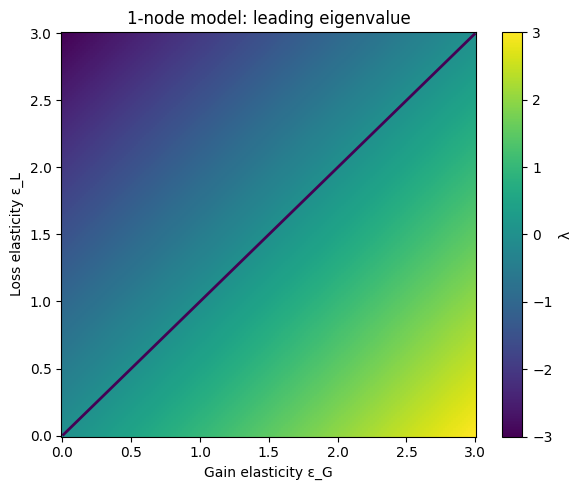

Saved table: 01_one_node_analytic_stability.csv


,criterion,condition
0,stable,eps_loss > eps_gain
1,boundary,eps_loss = eps_gain
2,unstable,eps_loss < eps_gain


In [4]:
def jacobian_1node(alpha_A, eps_gain, eps_loss):
    return np.asarray(alpha_A) * (np.asarray(eps_gain) - np.asarray(eps_loss))

# Demonstration grid
eps_gain_grid = np.linspace(0, 3, 200)
eps_loss_grid = np.linspace(0, 3, 200)
EG, EL = np.meshgrid(eps_gain_grid, eps_loss_grid)
LAM = jacobian_1node(1.0, EG, EL)

fig, ax = plt.subplots(figsize=(6, 5))
im = ax.pcolormesh(EG, EL, LAM, shading="auto")
ax.contour(EG, EL, LAM, levels=[0], linewidths=2)
ax.set_xlabel("Gain elasticity ε_G")
ax.set_ylabel("Loss elasticity ε_L")
ax.set_title("1-node model: leading eigenvalue")
fig.colorbar(im, ax=ax, label="λ")
finish_plot("01_one_node_eigenvalue_map", fig)

one_node_summary = pd.DataFrame({
    "criterion": ["stable", "boundary", "unstable"],
    "condition": ["eps_loss > eps_gain", "eps_loss = eps_gain", "eps_loss < eps_gain"]
})
save_table(one_node_summary, "01_one_node_analytic_stability")
one_node_summary

## 3.2 Core two-node Amygdala–mPFC model

Let \(A\) denote Amygdala/threat-related activity and \(P\) denote mPFC/top-down regulatory activity.

We use positive process rates:

\[
\dot A
=
G_A(A)
-
L_{A,0}(A)
-
L_{A,P}(A,P),
\]

\[
\dot P
=
G_P(P)
-
L_{P,0}(P)
-
L_{P,A}(P,A).
\]

The inhibitory biological action of mPFC on Amygdala is represented by the **positive loss process** \(L_{A,P}\). The process itself remains positive; its contribution to \(\dot A\) is negative.

For Amygdala loss, define

\[
\rho_{AP}
=
\frac{L_{A,P}^*}
{L_{A,0}^*+L_{A,P}^*},
\qquad
1-\rho_{AP}
=
\frac{L_{A,0}^*}
{L_{A,0}^*+L_{A,P}^*}.
\]

Analogously, \(\rho_{PA}\) is the fraction of mPFC loss attributable to the Amygdala-dependent burden process.

The normalized equations are

\[
\dot a
=
\alpha_A
\left[
g_A(a)
-
(1-\rho_{AP})l_{A0}(a)
-
\rho_{AP}l_{AP}(a,p)
\right],
\]

\[
\dot p
=
\alpha_P
\left[
g_P(p)
-
(1-\rho_{PA})l_{P0}(p)
-
\rho_{PA}l_{PA}(p,a)
\right].
\]

The Jacobian entries are obtained by differentiating these normalized processes at \(a=p=1\).

For a \(2\times2\) Jacobian,

\[
J=
\begin{pmatrix}
J_{AA}&J_{AP}\\
J_{PA}&J_{PP}
\end{pmatrix},
\]

local asymptotic stability is equivalent to

\[
\operatorname{tr}(J)<0
\]

and

\[
\det(J)>0.
\]

This gives an analytical cross-check of the numerical eigenvalue classification.

In [5]:
MODEL_STATES = {
    "AP": ["A", "P"],
    "APC": ["A", "P", "C"],
    "APH": ["A", "P", "H"],
    "APHC": ["A", "P", "H", "C"],
}

def build_J_AP(p: Dict[str, np.ndarray]) -> np.ndarray:
    # Broadcasted parameters, shape (N,)
    aA, aP = p["alpha_A"], p["alpha_P"]
    rAP, rPA = p["rho_AP"], p["rho_PA"]

    JAA = aA * (p["e_GA_A"] - (1-rAP)*p["e_LA0_A"] - rAP*p["e_LAP_A"])
    JAP = -aA * rAP * p["e_LAP_P"]

    JPA = -aP * rPA * p["e_LPA_A"]
    JPP = aP * (p["e_GP_P"] - (1-rPA)*p["e_LP0_P"] - rPA*p["e_LPA_P"])

    return np.stack([
        np.stack([JAA, JAP], axis=-1),
        np.stack([JPA, JPP], axis=-1)
    ], axis=-2)

## 3.3 A–P–C: two brain regions + cortisol/HPA-related state

This model introduces \(C\), an endocrine/HPA-related stress state.

The architecture contains:

- \(P\)-mediated regulation of \(A\);
- \(P\)-mediated regulation of \(C\);
- \(A\)-dependent activation of \(C\);
- \(C\)-dependent activation/burden of \(A\);
- \(A\)- and \(C\)-dependent burden on \(P\).

A key destabilizing motif is therefore

\[
A\rightarrow C\rightarrow A.
\]

For each state, separate loss pathways are represented by branching fractions. This avoids conflating **how much a pathway contributes** (\(\rho\)) with **how nonlinear/sensitive it is locally** (\(\epsilon\)).

In [6]:
def build_J_APC(p: Dict[str, np.ndarray]) -> np.ndarray:
    aA, aP, aC = p["alpha_A"], p["alpha_P"], p["alpha_C"]

    # A losses: intrinsic + P regulation
    rAP = p["rho_AP"]
    JAA = aA*(p["e_GA_A"] + p["e_GA_C"]
              - (1-rAP)*p["e_LA0_A"] - rAP*p["e_LAP_A"])
    JAP = -aA*rAP*p["e_LAP_P"]
    JAC = aA*p["e_GA_C"]

    # P losses: intrinsic + A burden + C burden
    rPA, rPC = p["rho_PA"], p["rho_PC"]
    rP0 = 1-rPA-rPC
    JPA = -aP*rPA*p["e_LPA_A"]
    JPP = aP*(p["e_GP_P"] - rP0*p["e_LP0_P"]
              - rPA*p["e_LPA_P"] - rPC*p["e_LPC_P"])
    JPC = -aP*rPC*p["e_LPC_C"]

    # C losses: intrinsic + P regulation; gains depend on A and C
    rCP = p["rho_CP"]
    JCA = aC*p["e_GC_A"]
    JCP = -aC*rCP*p["e_LCP_P"]
    JCC = aC*(p["e_GC_C"] - (1-rCP)*p["e_LC0_C"] - rCP*p["e_LCP_C"])

    return np.stack([
        np.stack([JAA, JAP, JAC], axis=-1),
        np.stack([JPA, JPP, JPC], axis=-1),
        np.stack([JCA, JCP, JCC], axis=-1)
    ], axis=-2)

## 3.4 A–P–H: alternative three-node neural circuit

The \(A-P-H\) model asks a different question from \(A-P-C\).

Here \(H\) denotes hippocampal context/safety-related processing. The model separates:

- threat-related Amygdala activity \(A\);
- top-down mPFC regulation \(P\);
- contextual/safety processing \(H\).

The architecture allows \(P\) and \(H\) to regulate Amygdala activity through separate loss branches, while Amygdala activity can burden both regulatory nodes. A positive \(P\leftrightarrow H\) support motif can also be represented through gain elasticities.

In [7]:
def build_J_APH(p: Dict[str, np.ndarray]) -> np.ndarray:
    aA, aP, aH = p["alpha_A"], p["alpha_P"], p["alpha_H"]

    # A losses: intrinsic + P regulation + H regulation
    rAP, rAH = p["rho_AP"], p["rho_AH"]
    rA0 = 1-rAP-rAH
    JAA = aA*(p["e_GA_A"] - rA0*p["e_LA0_A"]
              - rAP*p["e_LAP_A"] - rAH*p["e_LAH_A"])
    JAP = -aA*rAP*p["e_LAP_P"]
    JAH = -aA*rAH*p["e_LAH_H"]

    # P: intrinsic/support gain includes H; loss includes A burden
    rPA = p["rho_PA"]
    JPA = -aP*rPA*p["e_LPA_A"]
    JPP = aP*(p["e_GP_P"] - (1-rPA)*p["e_LP0_P"] - rPA*p["e_LPA_P"])
    JPH = aP*p["e_GP_H"]

    # H: support gain includes P; loss includes A burden
    rHA = p["rho_HA"]
    JHA = -aH*rHA*p["e_LHA_A"]
    JHP = aH*p["e_GH_P"]
    JHH = aH*(p["e_GH_H"] - (1-rHA)*p["e_LH0_H"] - rHA*p["e_LHA_H"])

    return np.stack([
        np.stack([JAA, JAP, JAH], axis=-1),
        np.stack([JPA, JPP, JPH], axis=-1),
        np.stack([JHA, JHP, JHH], axis=-1)
    ], axis=-2)

## 3.5 A–P–H–C: combined four-state extension

The combined model contains both context/safety regulation and endocrine stress regulation.

This model is retained as a **later extension**, not as the starting point. Its larger parameter space makes it especially important to report sensitivity to sampling assumptions and to avoid interpreting a small stable fraction as direct evidence of biological vulnerability.

In [8]:
def build_J_APHC(p: Dict[str, np.ndarray]) -> np.ndarray:
    aA, aP, aH, aC = p["alpha_A"], p["alpha_P"], p["alpha_H"], p["alpha_C"]

    # A: intrinsic loss + P regulation + H regulation; cortisol can increase gain
    rAP, rAH = p["rho_AP"], p["rho_AH"]
    rA0 = 1-rAP-rAH
    JAA = aA*(p["e_GA_A"] + p["e_GA_C"]
              - rA0*p["e_LA0_A"] - rAP*p["e_LAP_A"] - rAH*p["e_LAH_A"])
    JAP = -aA*rAP*p["e_LAP_P"]
    JAH = -aA*rAH*p["e_LAH_H"]
    JAC = aA*p["e_GA_C"]

    # P: intrinsic loss + A burden + C burden; H supports P gain
    rPA, rPC = p["rho_PA"], p["rho_PC"]
    rP0 = 1-rPA-rPC
    JPA = -aP*rPA*p["e_LPA_A"]
    JPP = aP*(p["e_GP_P"] - rP0*p["e_LP0_P"]
              - rPA*p["e_LPA_P"] - rPC*p["e_LPC_P"])
    JPH = aP*p["e_GP_H"]
    JPC = -aP*rPC*p["e_LPC_C"]

    # H: intrinsic loss + A burden + C burden; P supports H gain
    rHA, rHC = p["rho_HA"], p["rho_HC"]
    rH0 = 1-rHA-rHC
    JHA = -aH*rHA*p["e_LHA_A"]
    JHP = aH*p["e_GH_P"]
    JHH = aH*(p["e_GH_H"] - rH0*p["e_LH0_H"]
              - rHA*p["e_LHA_H"] - rHC*p["e_LHC_H"])
    JHC = -aH*rHC*p["e_LHC_C"]

    # C: gain driven by A; loss regulated independently by P and H
    rCP, rCH = p["rho_CP"], p["rho_CH"]
    rC0 = 1-rCP-rCH
    JCA = aC*p["e_GC_A"]
    JCP = -aC*rCP*p["e_LCP_P"]
    JCH = -aC*rCH*p["e_LCH_H"]
    JCC = aC*(p["e_GC_C"] - rC0*p["e_LC0_C"]
              - rCP*p["e_LCP_C"] - rCH*p["e_LCH_C"])

    return np.stack([
        np.stack([JAA, JAP, JAH, JAC], axis=-1),
        np.stack([JPA, JPP, JPH, JPC], axis=-1),
        np.stack([JHA, JHP, JHH, JHC], axis=-1),
        np.stack([JCA, JCP, JCH, JCC], axis=-1)
    ], axis=-2)

BUILDERS = {
    "AP": build_J_AP,
    "APC": build_J_APC,
    "APH": build_J_APH,
    "APHC": build_J_APHC,
}

# 4. Generalized-parameter priors

The ranges below are **exploratory priors**, not empirical parameter estimates.

Their purpose is to span qualitatively plausible local responses while preserving sign/topology assumptions. Because stability frequencies and parameter–stability associations depend on the chosen sampling distribution, every final analysis should report these ranges explicitly and should later include a prior-sensitivity analysis.

Turnover parameters are sampled log-uniformly because relative timescale differences are naturally multiplicative. Elasticities and branching fractions are sampled uniformly over the stated exploratory ranges.

Branching fractions with more than two loss branches are sampled from a Dirichlet distribution so that they are non-negative and automatically sum to one.

In [9]:
def log_uniform(rng, low, high, n):
    return np.exp(rng.uniform(np.log(low), np.log(high), n))

def dirichlet_branches(rng, n, k):
    return rng.dirichlet(np.ones(k), size=n)

def sample_params(model: str, n: int, seed: int=SEED) -> Dict[str, np.ndarray]:
    r = np.random.default_rng(seed)
    p = {}

    # Relative turnover rates; one could later fix one rate to 1 by time rescaling.
    p["alpha_A"] = log_uniform(r, 0.5, 5.0, n)
    p["alpha_P"] = log_uniform(r, 0.25, 3.0, n)
    if "H" in MODEL_STATES[model]:
        p["alpha_H"] = log_uniform(r, 0.25, 3.0, n)
    if "C" in MODEL_STATES[model]:
        p["alpha_C"] = np.ones(n)

    # Generic self gains/losses
    p["e_GA_A"] = r.uniform(0.0, 1.5, n)
    p["e_LA0_A"] = r.uniform(0.5, 2.0, n)
    p["e_GP_P"] = r.uniform(0.0, 1.2, n)
    p["e_LP0_P"] = r.uniform(0.5, 2.0, n)

    if model == "AP":
        p["rho_AP"] = r.uniform(0.05, 0.95, n)
        p["rho_PA"] = r.uniform(0.05, 0.95, n)
        p["e_LAP_A"] = r.uniform(0.0, 1.5, n)
        p["e_LAP_P"] = r.uniform(0.1, 2.0, n)
        p["e_LPA_A"] = r.uniform(0.1, 2.0, n)
        p["e_LPA_P"] = r.uniform(0.0, 1.5, n)

    elif model == "APC":
        p["rho_AP"] = r.uniform(0.05, 0.95, n)
        br = dirichlet_branches(r, n, 3)  # P0, PA, PC
        p["rho_PA"], p["rho_PC"] = br[:,1], br[:,2]
        p["rho_CP"] = r.uniform(0.05, 0.95, n)

        for k in ["e_LAP_A","e_LPA_P","e_LPC_P","e_LCP_C"]:
            p[k] = r.uniform(0.0, 1.5, n)
        for k in ["e_LAP_P","e_LPA_A","e_LPC_C","e_LCP_P"]:
            p[k] = r.uniform(0.1, 2.0, n)

        p["e_GA_C"] = r.uniform(0.0, 2.0, n)
        p["e_GC_A"] = r.uniform(0.0, 2.0, n)
        p["e_GC_C"] = r.uniform(0.0, 1.2, n)
        p["e_LC0_C"] = r.uniform(0.5, 2.0, n)

    elif model == "APH":
        br = dirichlet_branches(r, n, 3)  # A0, AP, AH
        p["rho_AP"], p["rho_AH"] = br[:,1], br[:,2]
        p["rho_PA"] = r.uniform(0.05, 0.95, n)
        p["rho_HA"] = r.uniform(0.05, 0.95, n)

        for k in ["e_LAP_A","e_LAH_A","e_LPA_P","e_LHA_H"]:
            p[k] = r.uniform(0.0, 1.5, n)
        for k in ["e_LAP_P","e_LAH_H","e_LPA_A","e_LHA_A"]:
            p[k] = r.uniform(0.1, 2.0, n)

        p["e_GP_H"] = r.uniform(0.0, 1.5, n)
        p["e_GH_P"] = r.uniform(0.0, 1.5, n)
        p["e_GH_H"] = r.uniform(0.0, 1.2, n)
        p["e_LH0_H"] = r.uniform(0.5, 2.0, n)

    elif model == "APHC":
        brA = dirichlet_branches(r, n, 3)
        p["rho_AP"], p["rho_AH"] = brA[:,1], brA[:,2]
        brP = dirichlet_branches(r, n, 3)
        p["rho_PA"], p["rho_PC"] = brP[:,1], brP[:,2]
        brH = dirichlet_branches(r, n, 3)
        p["rho_HA"], p["rho_HC"] = brH[:,1], brH[:,2]
        brC = dirichlet_branches(r, n, 3)
        p["rho_CP"], p["rho_CH"] = brC[:,1], brC[:,2]

        for k in ["e_LAP_A","e_LAH_A","e_LPA_P","e_LPC_P",
                  "e_LHA_H","e_LHC_H","e_LCP_C","e_LCH_C"]:
            p[k] = r.uniform(0.0, 1.5, n)
        for k in ["e_LAP_P","e_LAH_H","e_LPA_A","e_LPC_C",
                  "e_LHA_A","e_LHC_C","e_LCP_P","e_LCH_H"]:
            p[k] = r.uniform(0.1, 2.0, n)

        p["e_GA_C"] = r.uniform(0.0, 2.0, n)
        p["e_GP_H"] = r.uniform(0.0, 1.5, n)
        p["e_GH_P"] = r.uniform(0.0, 1.5, n)
        p["e_GH_H"] = r.uniform(0.0, 1.2, n)
        p["e_GC_A"] = r.uniform(0.0, 2.0, n)
        p["e_GC_C"] = r.uniform(0.0, 1.2, n)
        p["e_LH0_H"] = r.uniform(0.5, 2.0, n)
        p["e_LC0_C"] = r.uniform(0.5, 2.0, n)
    else:
        raise ValueError(model)

    return p

def params_to_frame(p):
    return pd.DataFrame({k: np.asarray(v) for k,v in p.items()})

## 4.1 Prior-distribution diagnostic plots

Before interpreting stability results, inspect what was actually sampled. This is an essential intermediate step because parameter–stability associations are conditional on the prior ranges and distributions.

For each model the notebook plots all sampled parameter distributions and exports their descriptive statistics.

Saved figure: 02_AP_parameter_priors.[png/svg/pdf]


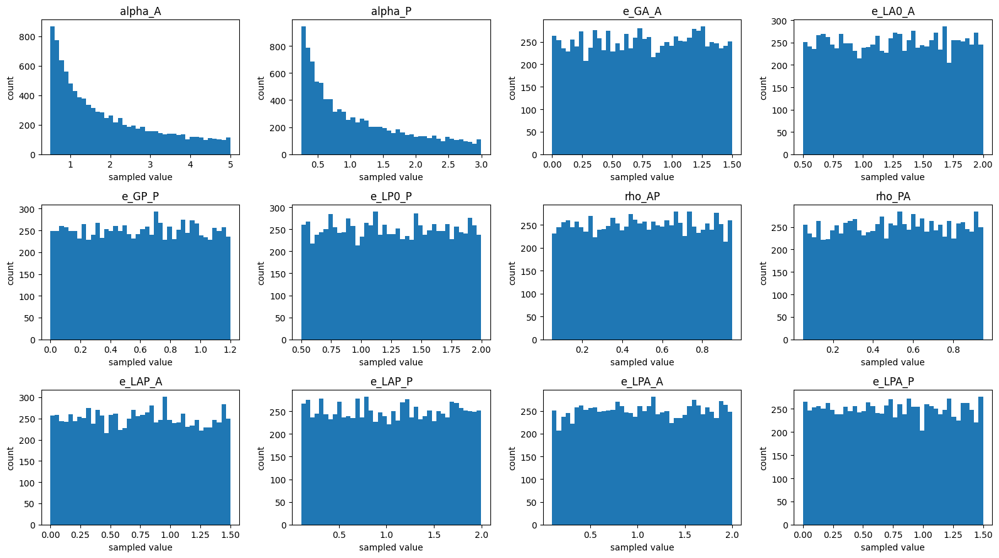

Saved table: 02_AP_parameter_prior_summary.csv
Saved figure: 02_APC_parameter_priors.[png/svg/pdf]


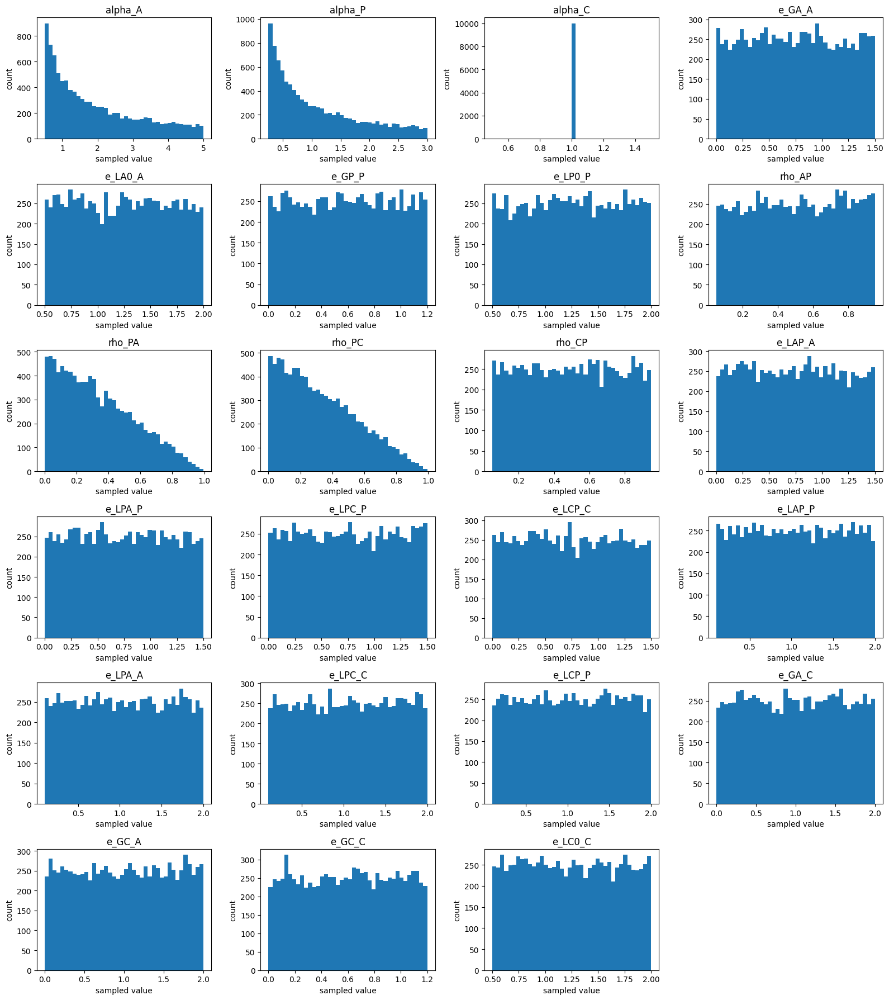

Saved table: 02_APC_parameter_prior_summary.csv
Saved figure: 02_APH_parameter_priors.[png/svg/pdf]


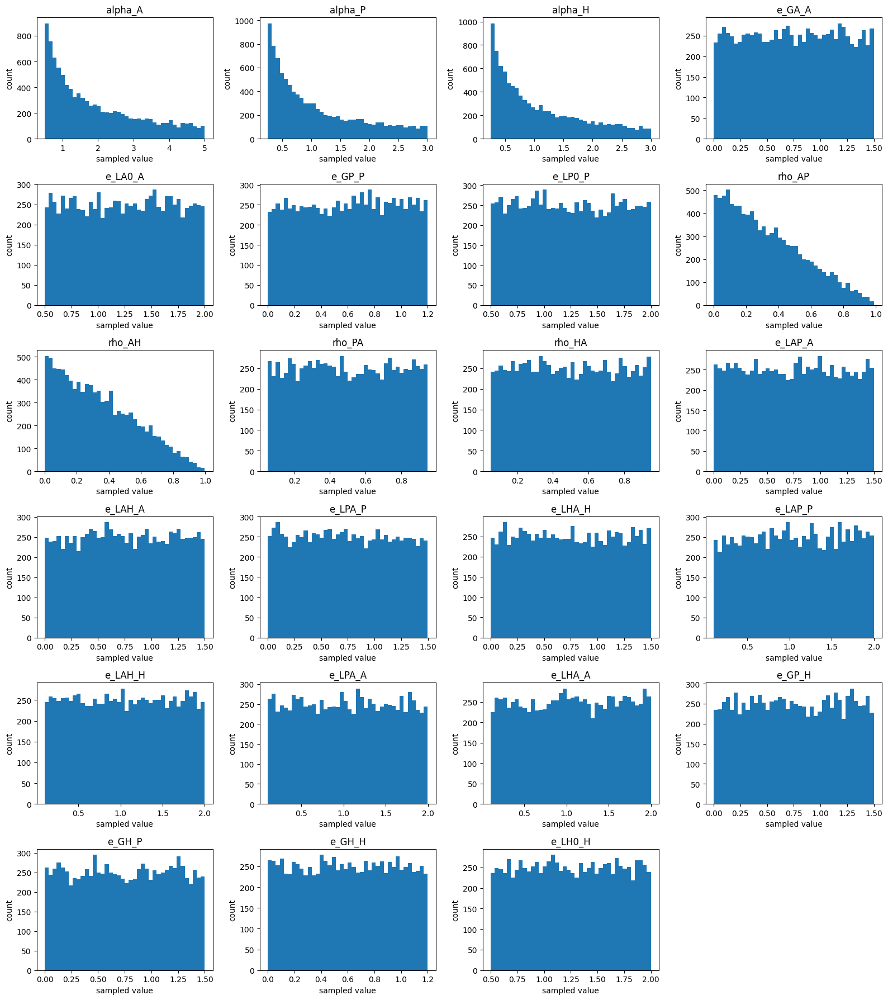

Saved table: 02_APH_parameter_prior_summary.csv
Saved figure: 02_APHC_parameter_priors.[png/svg/pdf]


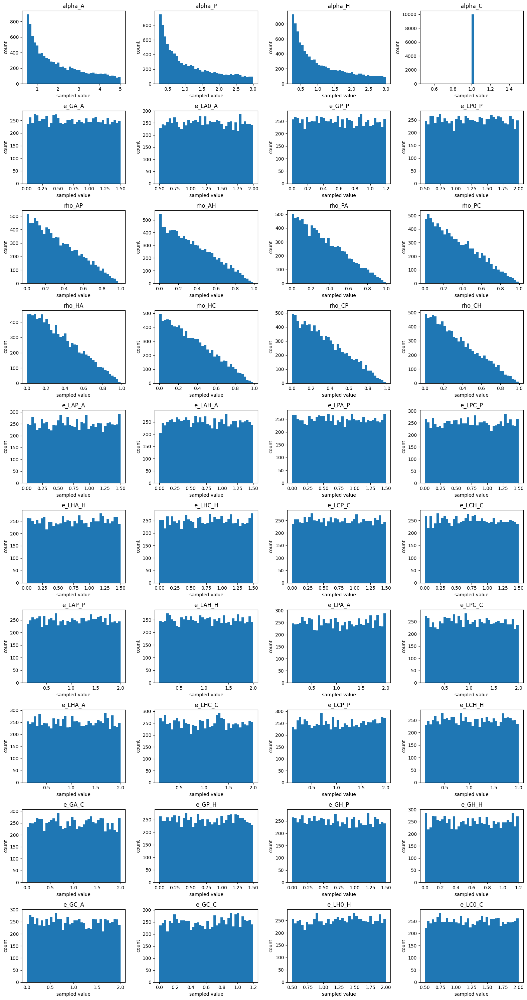

Saved table: 02_APHC_parameter_prior_summary.csv


In [10]:
def plot_parameter_priors(params: Dict[str,np.ndarray], model: str, max_cols=4):
    df = params_to_frame(params)
    n = len(df.columns)
    cols = min(max_cols, n)
    rows = int(np.ceil(n/cols))
    fig, axes = plt.subplots(rows, cols, figsize=(4*cols, 3*rows))
    axes = np.atleast_1d(axes).ravel()
    for ax, col in zip(axes, df.columns):
        ax.hist(df[col].dropna(), bins=40)
        ax.set_title(col)
        ax.set_xlabel("sampled value")
        ax.set_ylabel("count")
    for ax in axes[n:]:
        ax.axis("off")
    finish_plot(f"02_{model}_parameter_priors", fig)
    desc = df.describe().T.reset_index().rename(columns={"index":"parameter"})
    save_table(desc, f"02_{model}_parameter_prior_summary")
    return desc

# Small diagnostic samples
prior_samples = {m: sample_params(m, 10_000, SEED+i) for i,m in enumerate(BUILDERS)}
for m,p in prior_samples.items():
    plot_parameter_priors(p, m)

# 5. Core local stability metrics

For each sampled Jacobian we calculate:

1. all eigenvalues;
2. the leading real part
   \[
   \lambda_{\max}=\max_i\Re(\lambda_i);
   \]
3. the binary local-stability label;
4. the spectral abscissa \(\lambda_{\max}\);
5. the spectral radius
   \[
   \rho(J)=\max_i|\lambda_i|.
   \]

The **spectral radius is not the continuous-time stability criterion**. It is included only as a descriptive spectral quantity.

For stable systems we additionally define an approximate dominant asymptotic recovery time

\[
\tau_{\mathrm{dom}}
=
-\frac{1}{\lambda_{\max}}.
\]

This is meaningful only when \(\lambda_{\max}<0\). It is a local asymptotic timescale, not a complete nonlinear recovery trajectory.

In [11]:
def analyze_jacobians(J: np.ndarray) -> Dict[str,np.ndarray]:
    eig = np.linalg.eigvals(J)
    leading_real = eig.real.max(axis=1)
    stable = leading_real < 0
    spectral_radius = np.abs(eig).max(axis=1)
    recovery_time = np.full(len(J), np.nan)
    recovery_time[stable] = -1.0 / leading_real[stable]
    return {
        "eigvals": eig,
        "leading_real": leading_real,
        "stable": stable,
        "spectral_radius": spectral_radius,
        "recovery_time": recovery_time,
    }

def wilson_ci(k, n, alpha=0.05):
    if n == 0:
        return np.nan, np.nan
    z = stats.norm.ppf(1-alpha/2)
    phat = k/n
    den = 1+z*z/n
    center = (phat + z*z/(2*n))/den
    half = z*np.sqrt(phat*(1-phat)/n + z*z/(4*n*n))/den
    return center-half, center+half

def run_ensemble(model: str, n=MAIN_N, seed=SEED):
    p = sample_params(model, n, seed)
    J = BUILDERS[model](p)
    res = analyze_jacobians(J)
    return p, J, res

# 6. Monte Carlo ensemble screen

The ensemble screen estimates how much of the **chosen exploratory generalized-parameter space** is locally stable.

\[
\widehat P_{\mathrm{stable}}
=
\frac{N_{\mathrm{stable}}}{N}.
\]

A Wilson binomial confidence interval is reported for this Monte Carlo proportion.

This quantity is **not** interpreted as the probability that a biological brain circuit is resilient. It is conditional on the model topology and the specified sampling distribution.

In [12]:
ensembles = {}
summary_rows = []

for i, model in enumerate(BUILDERS):
    p, J, res = run_ensemble(model, MAIN_N, SEED + 100*i)
    ensembles[model] = {"params":p, "J":J, "res":res}
    k = int(res["stable"].sum())
    n = len(res["stable"])
    lo, hi = wilson_ci(k,n)
    summary_rows.append({
        "model": model,
        "n_states": len(MODEL_STATES[model]),
        "N": n,
        "N_stable": k,
        "P_stable": k/n,
        "CI95_low": lo,
        "CI95_high": hi,
        "median_lambda_max": np.median(res["leading_real"]),
        "median_spectral_radius": np.median(res["spectral_radius"]),
        "median_recovery_time_stable": np.nanmedian(res["recovery_time"]),
    })

ensemble_summary = pd.DataFrame(summary_rows)
save_table(ensemble_summary, "03_ensemble_stability_summary")
ensemble_summary

Saved table: 03_ensemble_stability_summary.csv


,model,n_states,N,N_stable,P_stable,CI95_low,CI95_high,median_lambda_max,median_spectral_radius,median_recovery_time_stable
0,AP,2,50000,15328,0.30656,0.302534,0.310616,0.256126,1.249713,4.261338
1,APC,3,50000,597,0.01194,0.011025,0.012930,1.885528,2.132199,8.535746
2,APH,3,50000,1889,0.03778,0.036144,0.039487,0.804106,1.660139,9.598187
3,APHC,4,50000,19,0.00038,0.000243,0.000593,2.210712,2.445155,12.967455


Saved figure: 03_ensemble_stability_fraction.[png/svg/pdf]


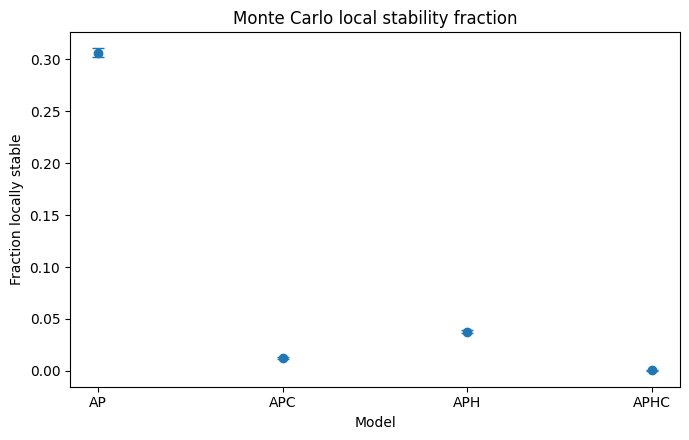

In [13]:
# Plot P(stable) with Wilson confidence intervals
fig, ax = plt.subplots(figsize=(7,4.5))
x = np.arange(len(ensemble_summary))
y = ensemble_summary["P_stable"].to_numpy()
yerr = np.vstack([
    y-ensemble_summary["CI95_low"].to_numpy(),
    ensemble_summary["CI95_high"].to_numpy()-y
])
ax.errorbar(x, y, yerr=yerr, fmt="o", capsize=4)
ax.set_xticks(x, ensemble_summary["model"])
ax.set_ylabel("Fraction locally stable")
ax.set_xlabel("Model")
ax.set_title("Monte Carlo local stability fraction")
finish_plot("03_ensemble_stability_fraction", fig)

Saved figure: 04_leading_eigenvalue_distributions.[png/svg/pdf]


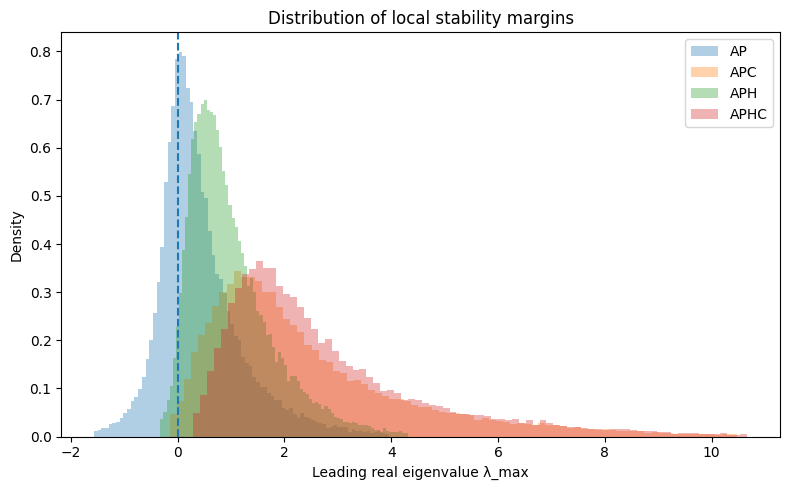

Saved table: 04_AP_spectral_metrics.csv
Saved table: 04_APC_spectral_metrics.csv
Saved table: 04_APH_spectral_metrics.csv
Saved table: 04_APHC_spectral_metrics.csv


In [14]:
# Leading-eigenvalue distributions
fig, ax = plt.subplots(figsize=(8,5))
for model, d in ensembles.items():
    vals = d["res"]["leading_real"]
    # clip only for display if extreme; raw data remain unchanged
    lo, hi = np.quantile(vals, [0.005, 0.995])
    ax.hist(vals[(vals>=lo)&(vals<=hi)], bins=80, alpha=0.35, density=True, label=model)
ax.axvline(0, linestyle="--")
ax.set_xlabel("Leading real eigenvalue λ_max")
ax.set_ylabel("Density")
ax.set_title("Distribution of local stability margins")
ax.legend()
finish_plot("04_leading_eigenvalue_distributions", fig)

for model,d in ensembles.items():
    eig_df = pd.DataFrame({
        "leading_real": d["res"]["leading_real"],
        "stable": d["res"]["stable"].astype(int),
        "spectral_radius": d["res"]["spectral_radius"],
        "recovery_time": d["res"]["recovery_time"],
    })
    save_table(eig_df, f"04_{model}_spectral_metrics")

# 7. Exact two-node analytical stability cross-check

For the A–P model,

\[
\lambda^2-\operatorname{tr}(J)\lambda+\det(J)=0.
\]

The Routh–Hurwitz conditions for a two-dimensional continuous-time system are exactly

\[
\operatorname{tr}(J)<0
\quad\text{and}\quad
\det(J)>0.
\]

The following analysis verifies that this analytical criterion agrees with the eigenvalue calculation for every sampled A–P realization.

Saved table: 05_AP_trace_determinant_Routh_Hurwitz.csv
Routh-Hurwitz / eigenvalue agreement: 1.0
Saved figure: 05_AP_trace_determinant_stability.[png/svg/pdf]


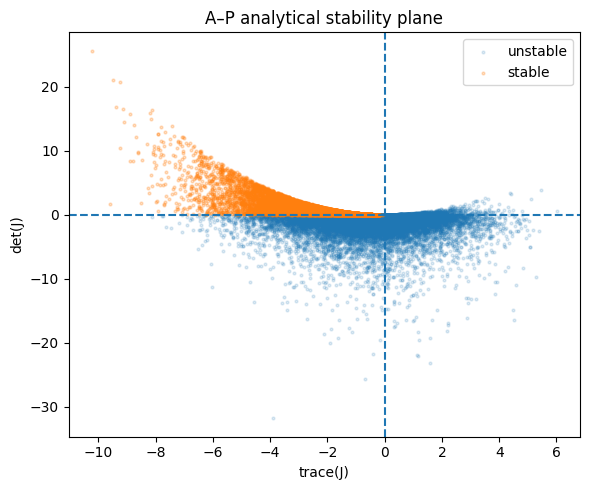

In [15]:
J = ensembles["AP"]["J"]
tr = np.trace(J, axis1=1, axis2=2)
det = np.linalg.det(J)
stable_rh = (tr < 0) & (det > 0)
stable_eig = ensembles["AP"]["res"]["stable"]
agreement = np.mean(stable_rh == stable_eig)

rh_table = pd.DataFrame({
    "trace": tr,
    "determinant": det,
    "stable_Routh_Hurwitz": stable_rh.astype(int),
    "stable_eigenvalue": stable_eig.astype(int),
})
save_table(rh_table, "05_AP_trace_determinant_Routh_Hurwitz")
print("Routh-Hurwitz / eigenvalue agreement:", agreement)

fig, ax = plt.subplots(figsize=(6,5))
ax.scatter(tr[~stable_eig], det[~stable_eig], s=4, alpha=0.15, label="unstable")
ax.scatter(tr[stable_eig], det[stable_eig], s=4, alpha=0.25, label="stable")
ax.axvline(0, linestyle="--")
ax.axhline(0, linestyle="--")
ax.set_xlabel("trace(J)")
ax.set_ylabel("det(J)")
ax.set_title("A–P analytical stability plane")
ax.legend()
finish_plot("05_AP_trace_determinant_stability", fig)

# 8. Parameter–stability associations

The binary stability variable is

\[
s_m=
\begin{cases}
1,&\lambda_{\max,m}<0\\
0,&\text{otherwise}.
\end{cases}
\]

For each generalized parameter \(p_i\), the notebook computes:

- point-biserial/Pearson correlation with the binary stability label;
- standardized mean difference between stable and unstable samples;
- Mann–Whitney \(U\) test comparing stable and unstable parameter distributions;
- Benjamini–Hochberg FDR correction across parameters;
- optional multivariable logistic regression when `statsmodels` is available.

These analyses are **associations under the chosen sampling distribution**, not causal effects.

Saved table: 06_AP_parameter_stability_associations.csv
Saved figure: 06_AP_parameter_stability_associations.[png/svg/pdf]


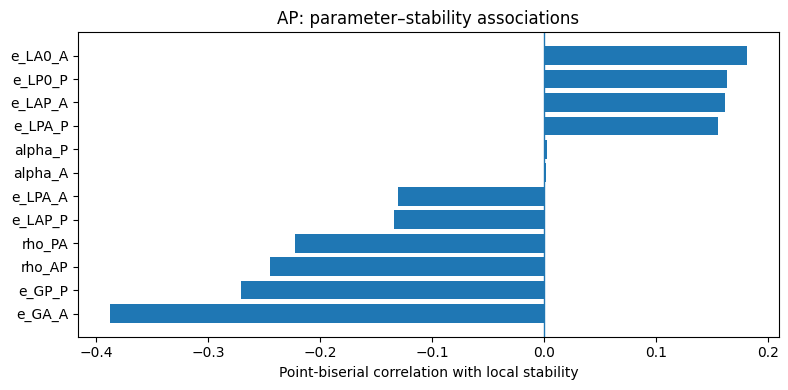

Saved table: 06_APC_parameter_stability_associations.csv
Saved figure: 06_APC_parameter_stability_associations.[png/svg/pdf]


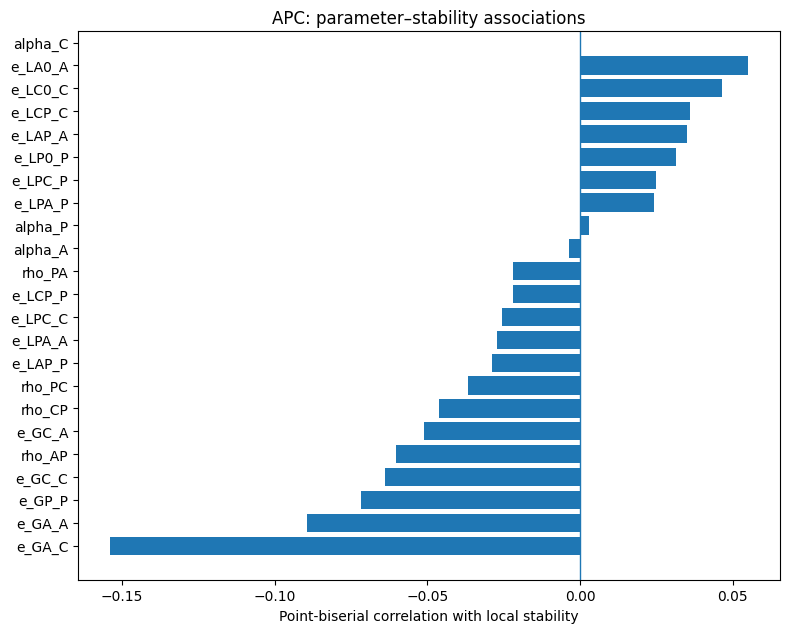

Saved table: 06_APH_parameter_stability_associations.csv
Saved figure: 06_APH_parameter_stability_associations.[png/svg/pdf]


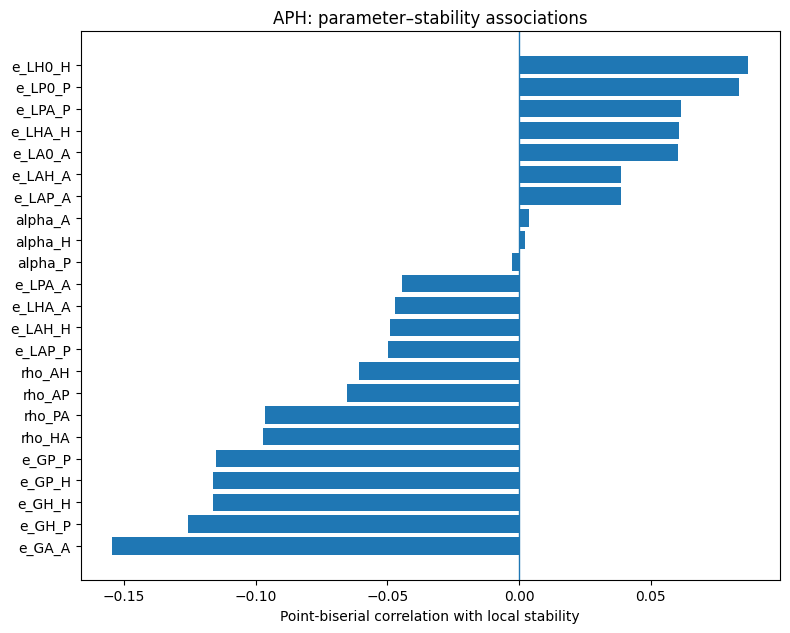

Saved table: 06_APHC_parameter_stability_associations.csv
Saved figure: 06_APHC_parameter_stability_associations.[png/svg/pdf]


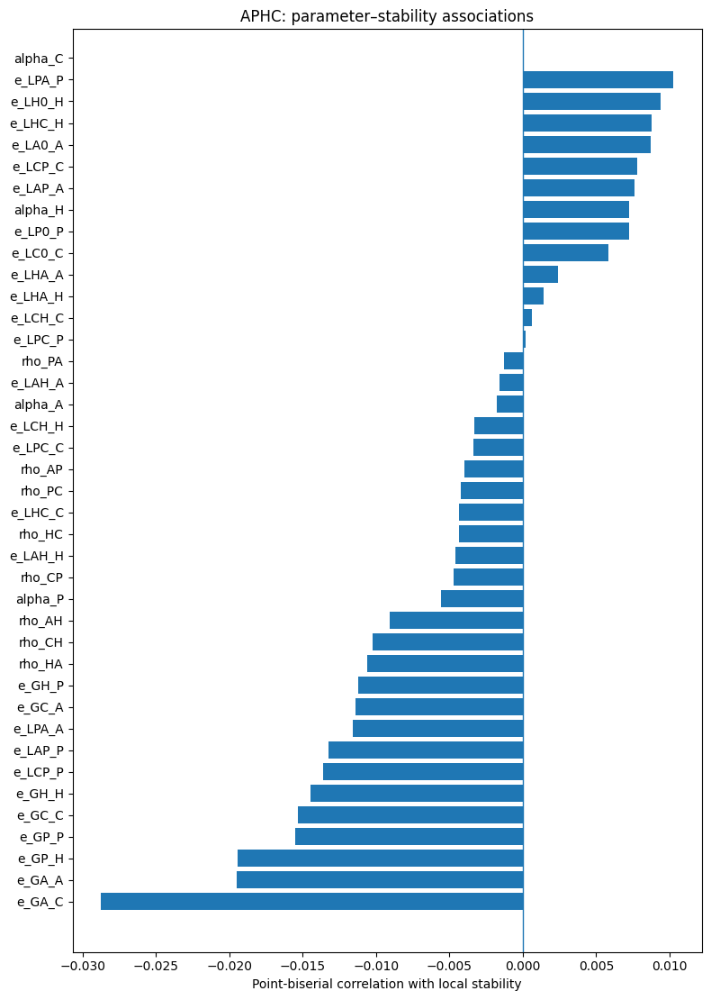

In [16]:
def fdr_bh(pvals):
    p = np.asarray(pvals, float)
    n = len(p)
    order = np.argsort(p)
    ranked = p[order]
    q = ranked*n/np.arange(1,n+1)
    q = np.minimum.accumulate(q[::-1])[::-1]
    q = np.clip(q,0,1)
    out = np.empty(n)
    out[order]=q
    return out

def parameter_associations(params, stable):
    rows=[]
    y=stable.astype(int)
    for name,x in params.items():
        x=np.asarray(x)
        if np.std(x)==0:
            r=np.nan; p_corr=np.nan
        else:
            r,p_corr=stats.pointbiserialr(y,x)
        xs=x[stable]; xu=x[~stable]
        pooled=np.sqrt((np.var(xs,ddof=1)+np.var(xu,ddof=1))/2) if len(xs)>1 and len(xu)>1 else np.nan
        smd=(np.mean(xs)-np.mean(xu))/pooled if pooled and pooled>0 else np.nan
        if len(xs)>0 and len(xu)>0:
            U,p_u=stats.mannwhitneyu(xs,xu,alternative="two-sided")
        else:
            U,p_u=np.nan,np.nan
        rows.append({
            "parameter":name,
            "point_biserial_r":r,
            "corr_p":p_corr,
            "mean_stable":np.mean(xs) if len(xs) else np.nan,
            "mean_unstable":np.mean(xu) if len(xu) else np.nan,
            "standardized_mean_difference":smd,
            "mannwhitney_U":U,
            "mannwhitney_p":p_u,
        })
    df=pd.DataFrame(rows)
    df["mannwhitney_q_BH"]=fdr_bh(df["mannwhitney_p"].fillna(1).to_numpy())
    return df.sort_values("point_biserial_r", key=lambda s: s.abs(), ascending=False)

association_tables={}
for model,d in ensembles.items():
    tab=parameter_associations(d["params"], d["res"]["stable"])
    association_tables[model]=tab
    save_table(tab, f"06_{model}_parameter_stability_associations")

    fig, ax = plt.subplots(figsize=(8, max(4,0.28*len(tab))))
    plot_tab=tab.sort_values("point_biserial_r")
    ax.barh(plot_tab["parameter"], plot_tab["point_biserial_r"])
    ax.axvline(0, linewidth=1)
    ax.set_xlabel("Point-biserial correlation with local stability")
    ax.set_title(f"{model}: parameter–stability associations")
    finish_plot(f"06_{model}_parameter_stability_associations", fig)

Saved table: 07_AP_multivariable_logistic_stability.csv
Saved figure: 07_AP_logistic_stability_coefficients.[png/svg/pdf]


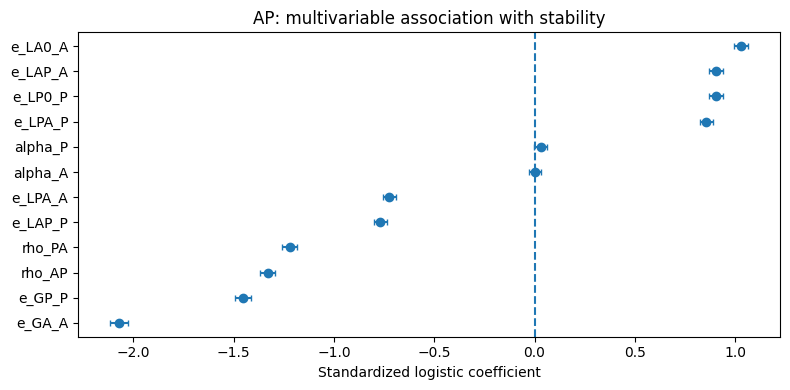

Saved table: 07_APC_multivariable_logistic_stability.csv
Saved figure: 07_APC_logistic_stability_coefficients.[png/svg/pdf]


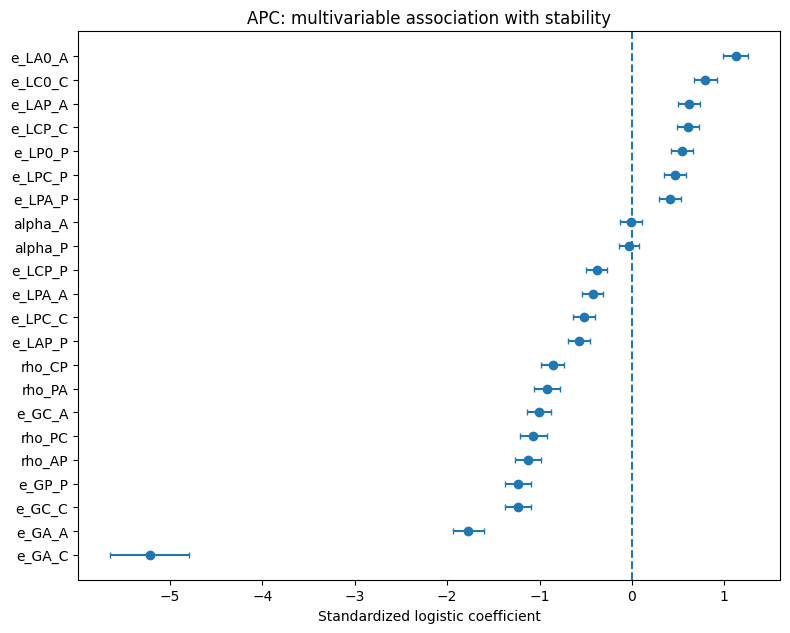

Saved table: 07_APH_multivariable_logistic_stability.csv
Saved figure: 07_APH_logistic_stability_coefficients.[png/svg/pdf]


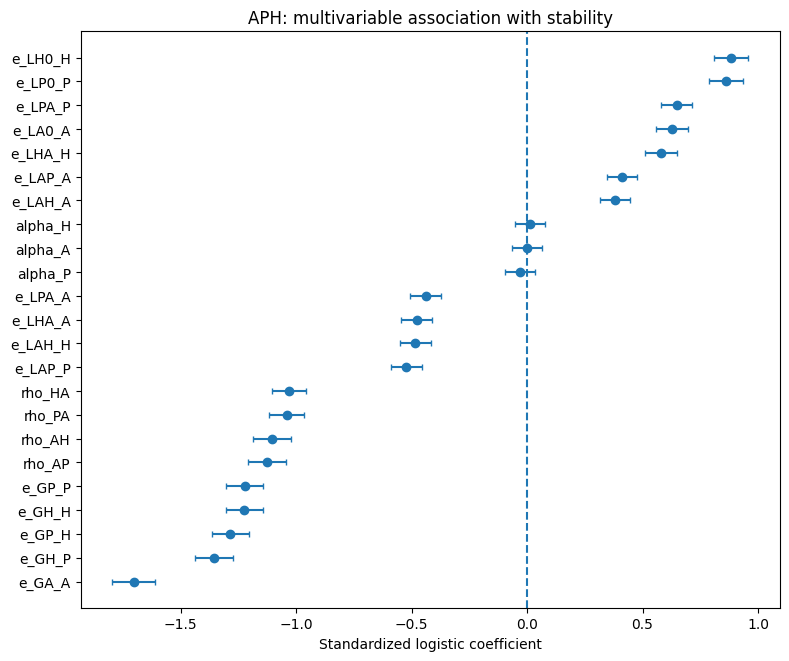

Saved table: 07_APHC_multivariable_logistic_stability.csv
Saved figure: 07_APHC_logistic_stability_coefficients.[png/svg/pdf]


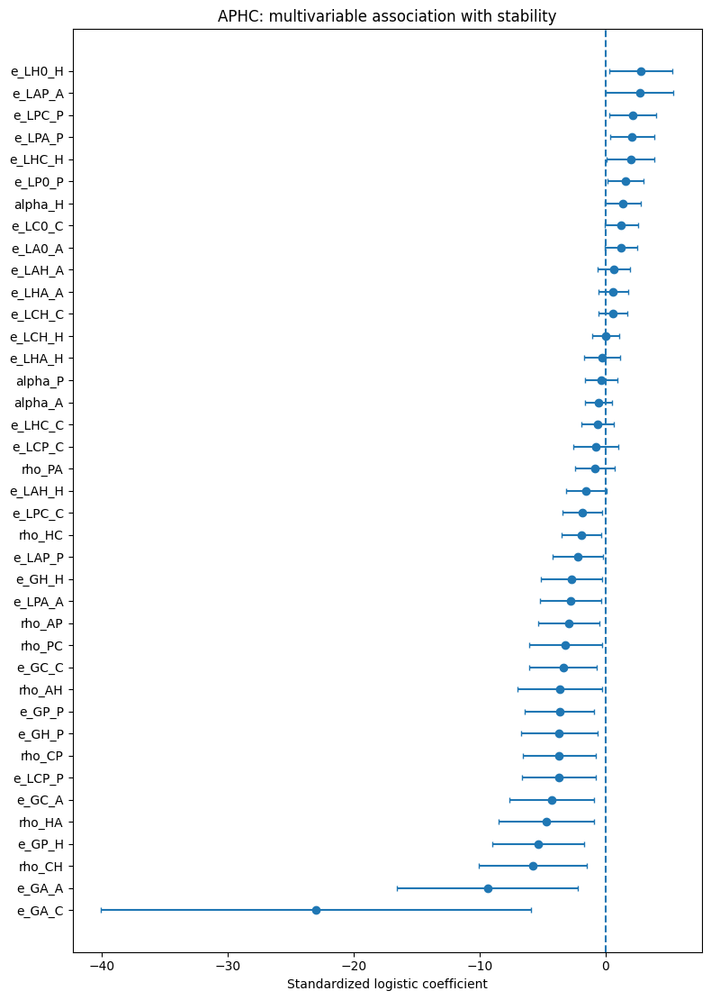

In [17]:
def logistic_stability_model(params, stable, model):
    if not HAVE_STATSMODELS:
        print("statsmodels unavailable; skipping multivariable logistic regression.")
        return None
    X = params_to_frame(params).copy()
    # Remove constants and standardize.
    X = X.loc[:, X.std() > 0]
    Xz = (X-X.mean())/X.std()
    Xz = sm.add_constant(Xz)
    y = stable.astype(int)
    try:
        fit = sm.Logit(y, Xz).fit(disp=False, maxiter=200)
        ci = fit.conf_int()
        tab = pd.DataFrame({
            "term": fit.params.index,
            "coef_log_odds": fit.params.values,
            "SE": fit.bse.values,
            "p": fit.pvalues.values,
            "CI95_low": ci[0].values,
            "CI95_high": ci[1].values,
        })
        tab["q_BH"] = fdr_bh(tab["p"].to_numpy())
        save_table(tab, f"07_{model}_multivariable_logistic_stability")
        fig, ax = plt.subplots(figsize=(8,max(4,0.28*len(tab))))
        t=tab[tab["term"]!="const"].sort_values("coef_log_odds")
        ax.errorbar(t["coef_log_odds"], t["term"],
                    xerr=np.vstack([t["coef_log_odds"]-t["CI95_low"],
                                    t["CI95_high"]-t["coef_log_odds"]]),
                    fmt="o", capsize=2)
        ax.axvline(0, linestyle="--")
        ax.set_xlabel("Standardized logistic coefficient")
        ax.set_title(f"{model}: multivariable association with stability")
        finish_plot(f"07_{model}_logistic_stability_coefficients", fig)
        return fit
    except Exception as e:
        print(f"{model}: logistic regression skipped:", e)
        return None

logit_fits={}
for model,d in ensembles.items():
    logit_fits[model]=logistic_stability_model(d["params"], d["res"]["stable"], model)

# 9. Stable-versus-unstable parameter distributions

Correlation coefficients compress the distributions into one number. For the most strongly associated parameters, the notebook also plots the complete stable and unstable distributions.

A Mann–Whitney test is already reported above. The plots are descriptive and should be interpreted together with effect size and FDR-adjusted statistics.

Saved figure: 08_AP_top_parameter_distributions.[png/svg/pdf]


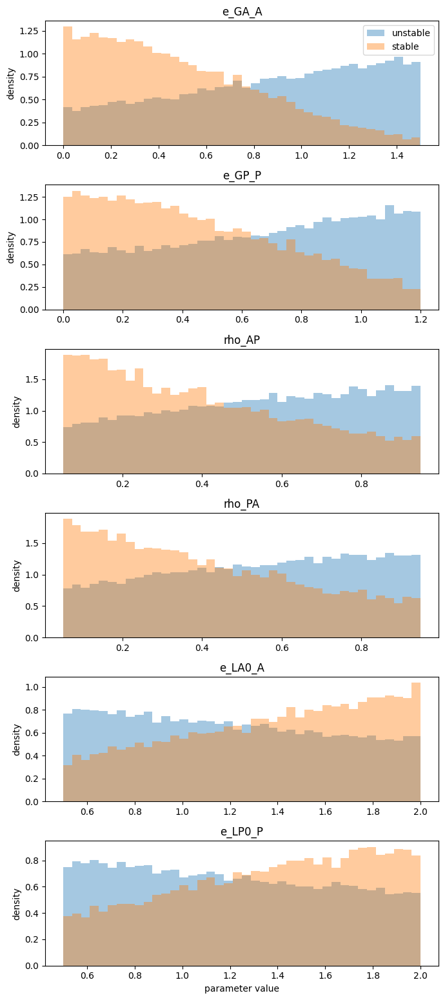

Saved figure: 08_APC_top_parameter_distributions.[png/svg/pdf]


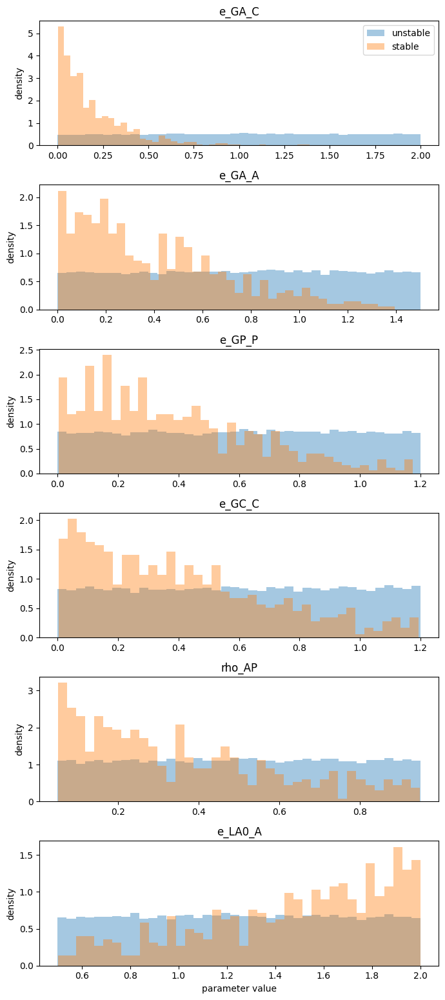

Saved figure: 08_APH_top_parameter_distributions.[png/svg/pdf]


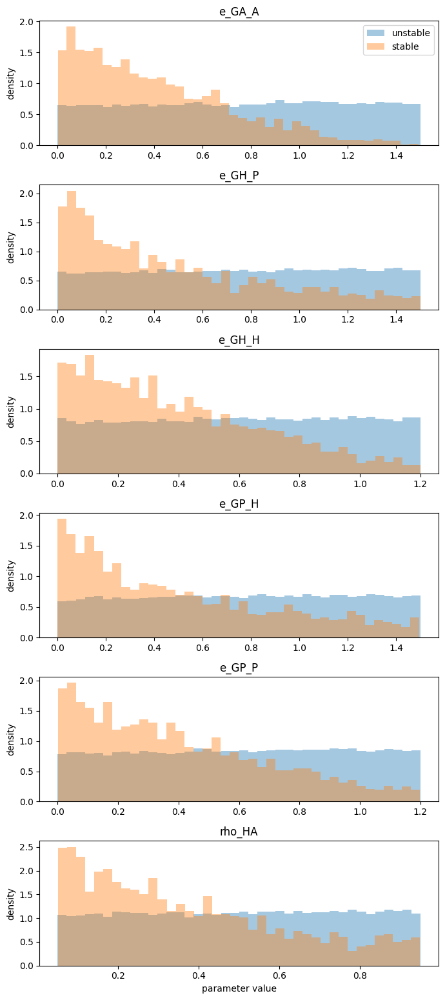

Saved figure: 08_APHC_top_parameter_distributions.[png/svg/pdf]


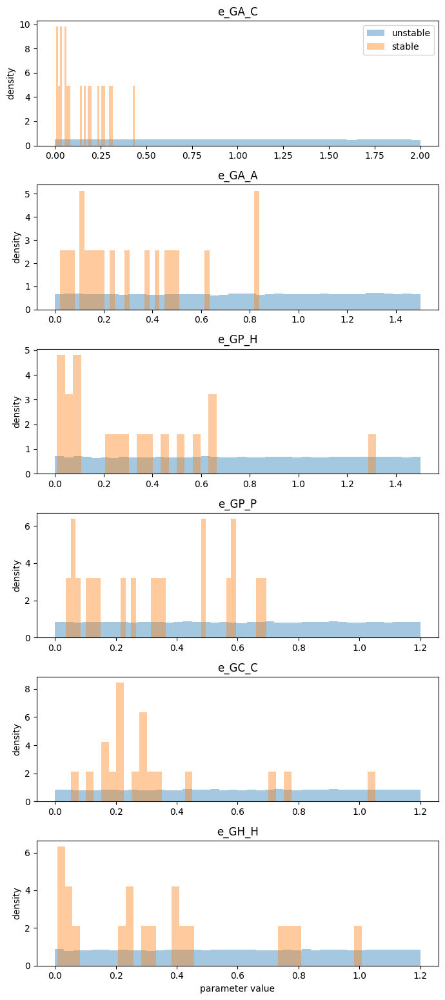

In [18]:
def plot_top_parameter_distributions(model, top_n=6):
    d=ensembles[model]
    tab=association_tables[model].head(top_n)
    stable=d["res"]["stable"]
    fig, axes=plt.subplots(top_n,1,figsize=(7,2.6*top_n))
    axes=np.atleast_1d(axes)
    for ax,par in zip(axes,tab["parameter"]):
        x=d["params"][par]
        ax.hist(x[~stable],bins=40,density=True,alpha=.4,label="unstable")
        ax.hist(x[stable],bins=40,density=True,alpha=.4,label="stable")
        ax.set_title(par)
        ax.set_ylabel("density")
    axes[0].legend()
    axes[-1].set_xlabel("parameter value")
    finish_plot(f"08_{model}_top_parameter_distributions",fig)

for model in BUILDERS:
    plot_top_parameter_distributions(model)

# 10. One-parameter conditional stability sweeps

A parameter \(x\) is fixed systematically while all other generalized parameters are resampled.

At every \(x\),

\[
\widehat P_{\mathrm{stable}}(x)
=
\frac{N_{\mathrm{stable}}(x)}{N(x)}.
\]

This produces a conditional stability curve and a binomial confidence interval. It is more informative than a single global stable fraction because it shows how the stable region changes along a selected generalized parameter.

Saved table: 09_AP_e_GA_A_conditional_stability_sweep.csv
Saved figure: 09_AP_e_GA_A_conditional_stability.[png/svg/pdf]


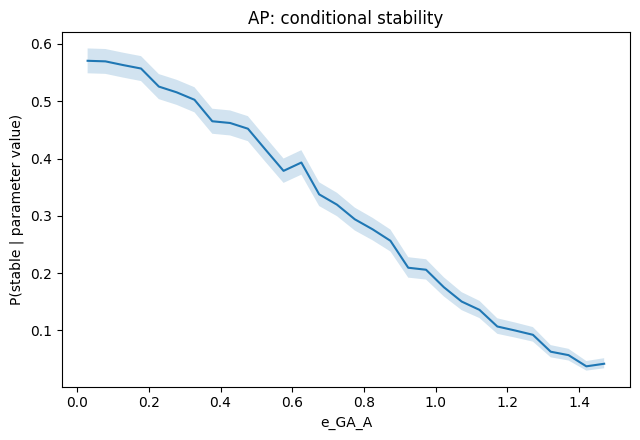

Saved figure: 10_AP_e_GA_A_lambda_margin_sweep.[png/svg/pdf]


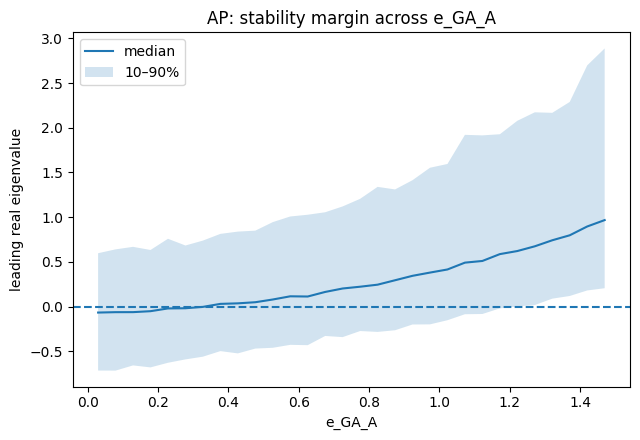

Saved table: 09_AP_e_GP_P_conditional_stability_sweep.csv
Saved figure: 09_AP_e_GP_P_conditional_stability.[png/svg/pdf]


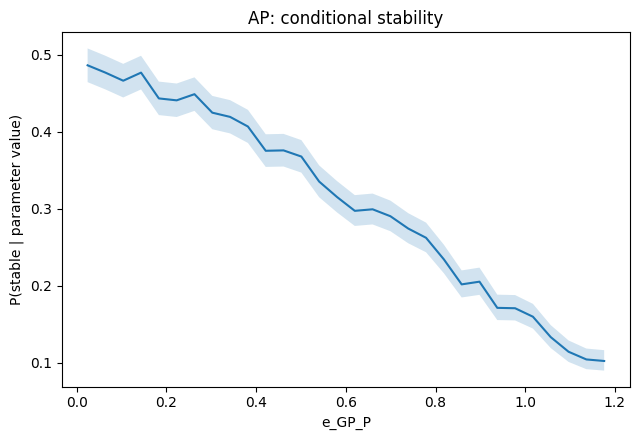

Saved figure: 10_AP_e_GP_P_lambda_margin_sweep.[png/svg/pdf]


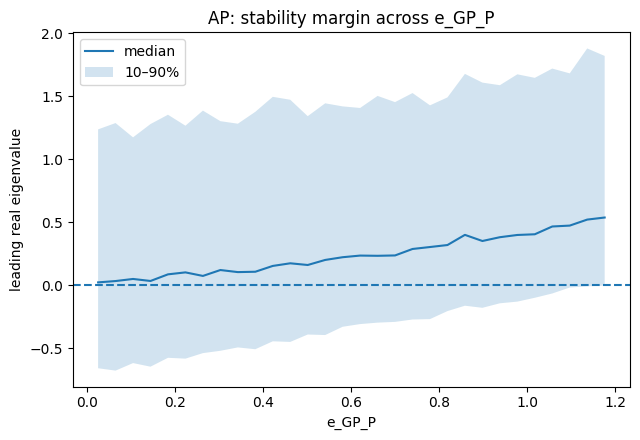

Saved table: 09_AP_rho_AP_conditional_stability_sweep.csv
Saved figure: 09_AP_rho_AP_conditional_stability.[png/svg/pdf]


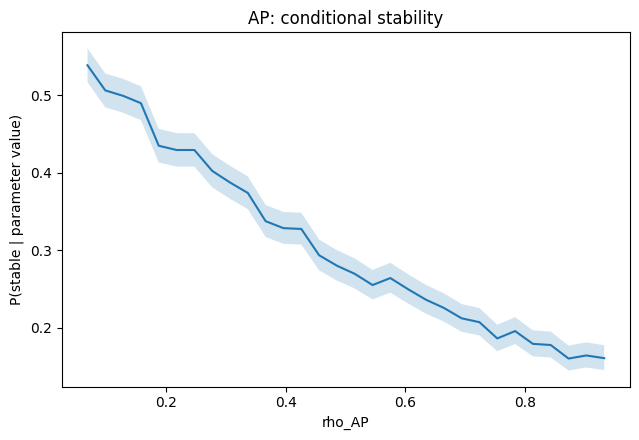

Saved figure: 10_AP_rho_AP_lambda_margin_sweep.[png/svg/pdf]


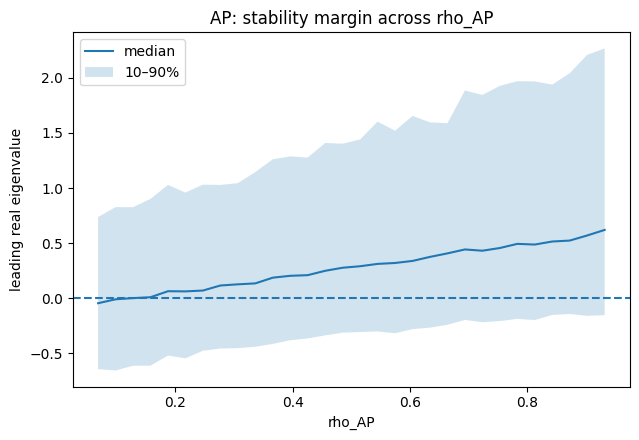

Saved table: 09_APC_e_GA_C_conditional_stability_sweep.csv
Saved figure: 09_APC_e_GA_C_conditional_stability.[png/svg/pdf]


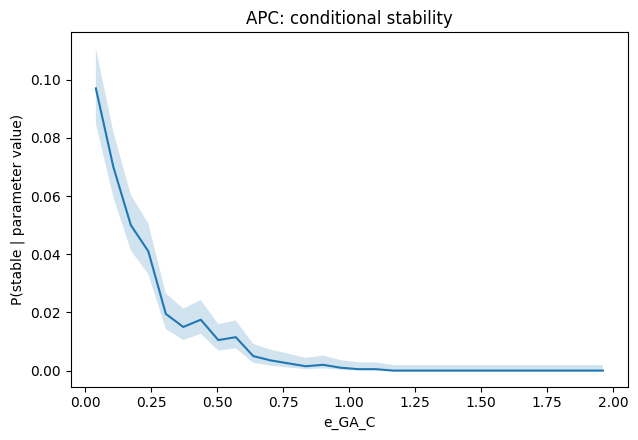

Saved figure: 10_APC_e_GA_C_lambda_margin_sweep.[png/svg/pdf]


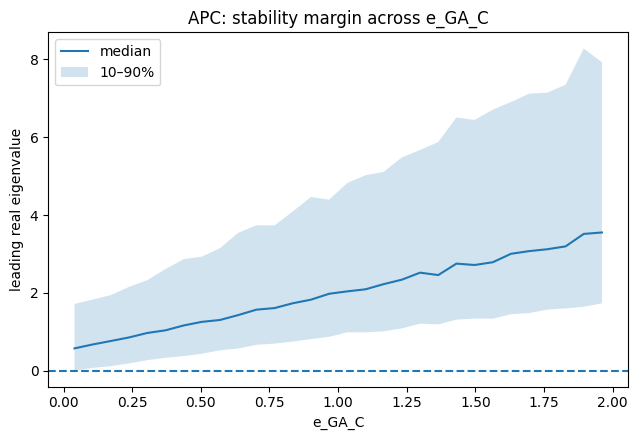

Saved table: 09_APC_e_GA_A_conditional_stability_sweep.csv
Saved figure: 09_APC_e_GA_A_conditional_stability.[png/svg/pdf]


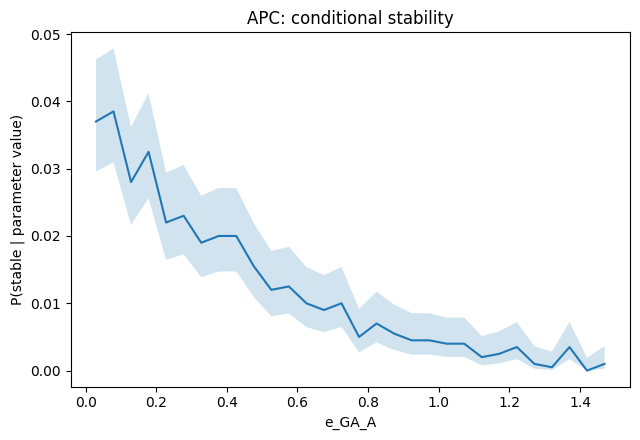

Saved figure: 10_APC_e_GA_A_lambda_margin_sweep.[png/svg/pdf]


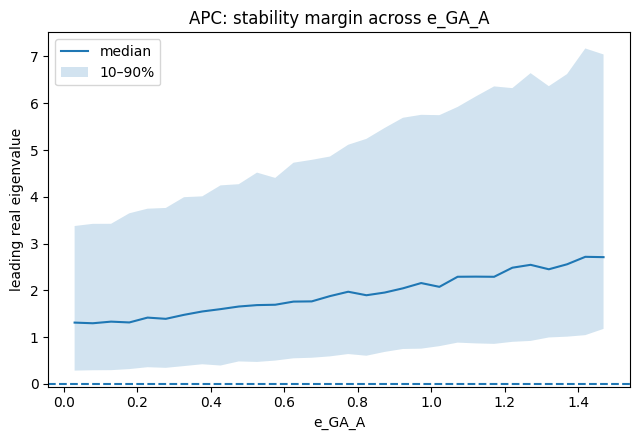

Saved table: 09_APC_e_GP_P_conditional_stability_sweep.csv
Saved figure: 09_APC_e_GP_P_conditional_stability.[png/svg/pdf]


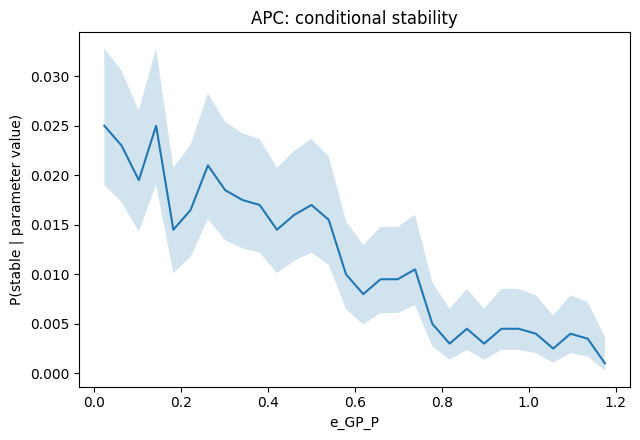

Saved figure: 10_APC_e_GP_P_lambda_margin_sweep.[png/svg/pdf]


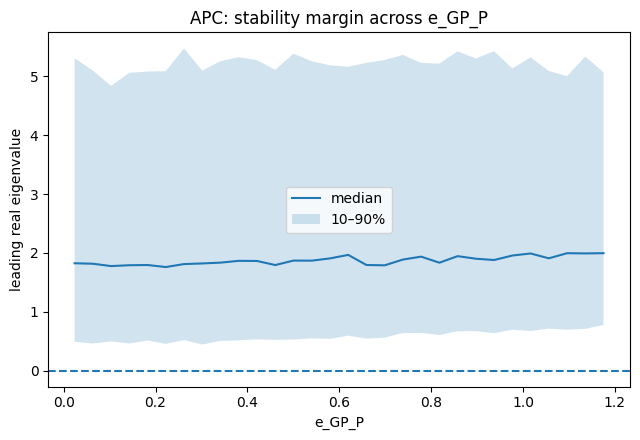

Saved table: 09_APH_e_GA_A_conditional_stability_sweep.csv
Saved figure: 09_APH_e_GA_A_conditional_stability.[png/svg/pdf]


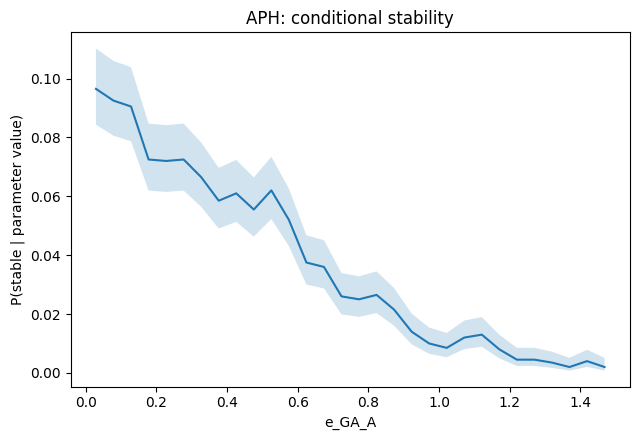

Saved figure: 10_APH_e_GA_A_lambda_margin_sweep.[png/svg/pdf]


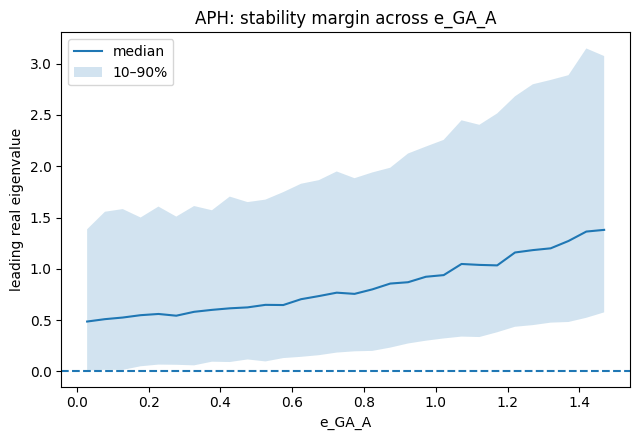

Saved table: 09_APH_e_GH_P_conditional_stability_sweep.csv
Saved figure: 09_APH_e_GH_P_conditional_stability.[png/svg/pdf]


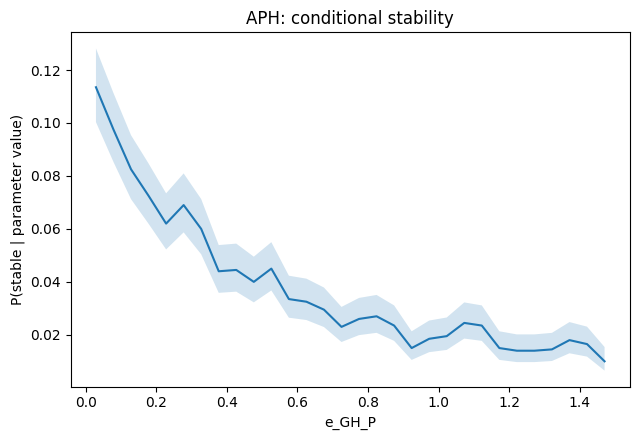

Saved figure: 10_APH_e_GH_P_lambda_margin_sweep.[png/svg/pdf]


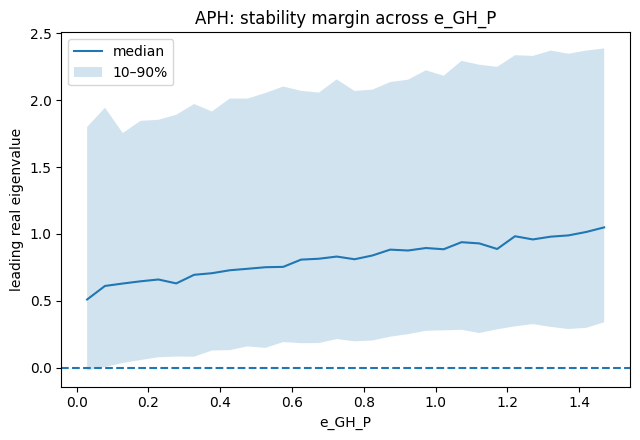

Saved table: 09_APH_e_GH_H_conditional_stability_sweep.csv
Saved figure: 09_APH_e_GH_H_conditional_stability.[png/svg/pdf]


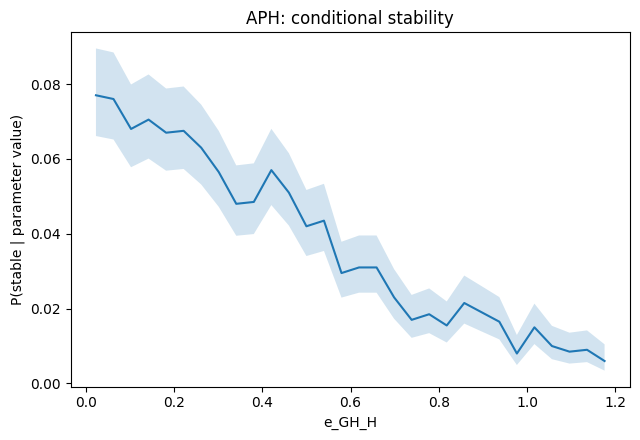

Saved figure: 10_APH_e_GH_H_lambda_margin_sweep.[png/svg/pdf]


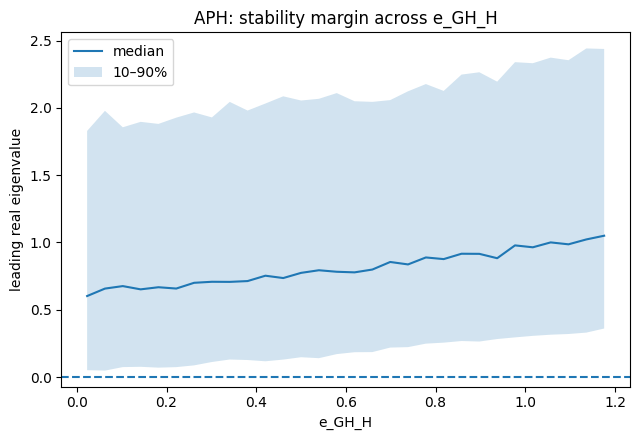

Saved table: 09_APHC_e_GA_C_conditional_stability_sweep.csv
Saved figure: 09_APHC_e_GA_C_conditional_stability.[png/svg/pdf]


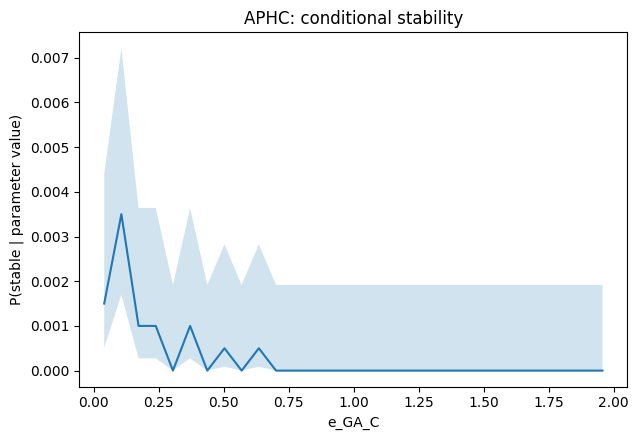

Saved figure: 10_APHC_e_GA_C_lambda_margin_sweep.[png/svg/pdf]


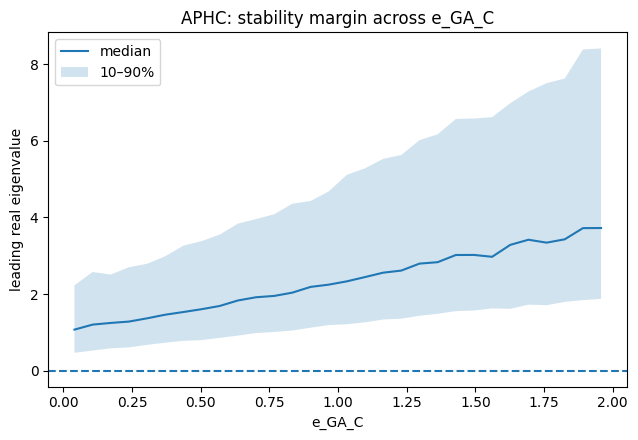

Saved table: 09_APHC_e_GA_A_conditional_stability_sweep.csv
Saved figure: 09_APHC_e_GA_A_conditional_stability.[png/svg/pdf]


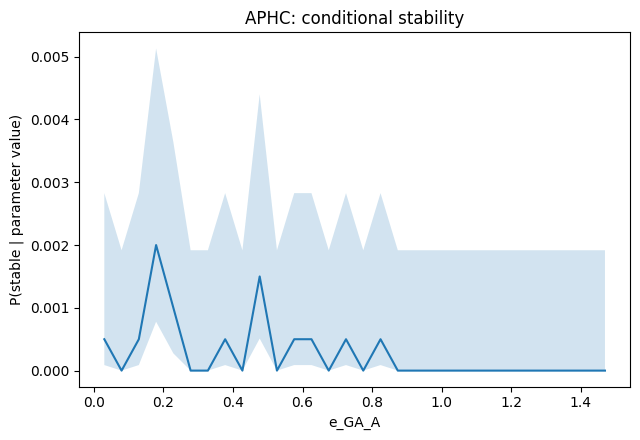

Saved figure: 10_APHC_e_GA_A_lambda_margin_sweep.[png/svg/pdf]


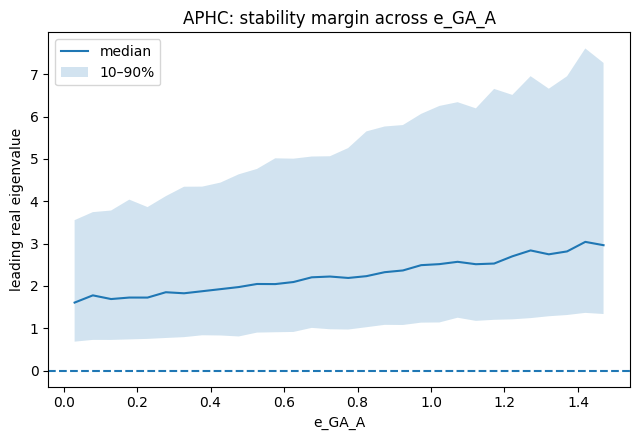

Saved table: 09_APHC_e_GP_H_conditional_stability_sweep.csv
Saved figure: 09_APHC_e_GP_H_conditional_stability.[png/svg/pdf]


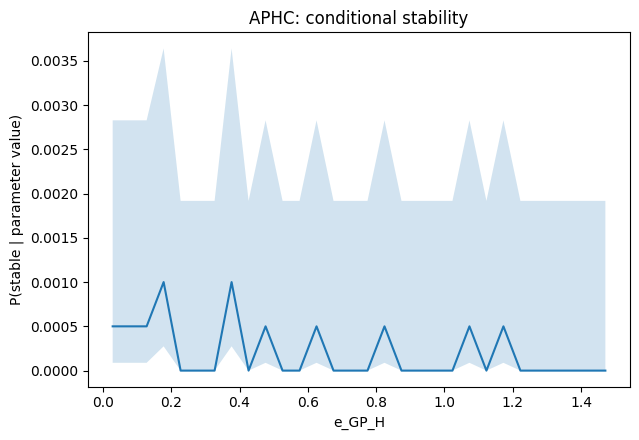

Saved figure: 10_APHC_e_GP_H_lambda_margin_sweep.[png/svg/pdf]


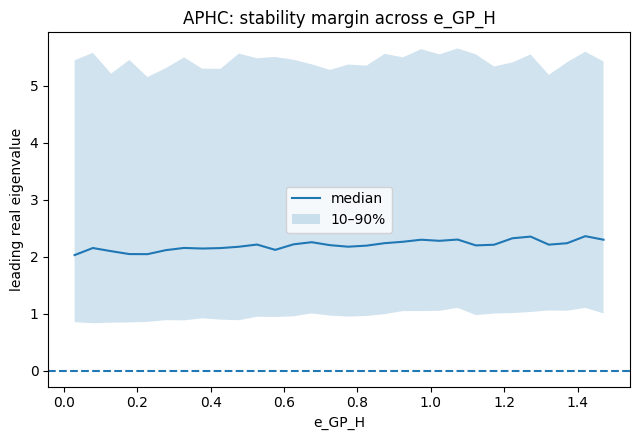

In [19]:
def override_param(p, name, value):
    q={k:np.array(v,copy=True) for k,v in p.items()}
    if name not in q:
        raise KeyError(name)
    q[name][:]=value
    return q

def one_parameter_probability_sweep(model, param, grid, n_per=SWEEP_N, seed=123):
    rows=[]
    for i,val in enumerate(grid):
        p=sample_params(model,n_per,seed+i)
        p=override_param(p,param,val)
        res=analyze_jacobians(BUILDERS[model](p))
        k=int(res["stable"].sum()); n=len(res["stable"])
        lo,hi=wilson_ci(k,n)
        rows.append({
            "parameter":param,"value":val,"N":n,"N_stable":k,
            "P_stable":k/n,"CI95_low":lo,"CI95_high":hi,
            "median_lambda_max":np.median(res["leading_real"]),
            "q10_lambda_max":np.quantile(res["leading_real"],.1),
            "q90_lambda_max":np.quantile(res["leading_real"],.9),
        })
    return pd.DataFrame(rows)

# Automatically sweep the top 3 associated parameters of each model
oneD_sweeps={}
for model in BUILDERS:
    top=association_tables[model]["parameter"].head(3).tolist()
    for par in top:
        vals=ensembles[model]["params"][par]
        grid=np.linspace(np.quantile(vals,.02),np.quantile(vals,.98),30)
        df=one_parameter_probability_sweep(model,par,grid)
        oneD_sweeps[(model,par)]=df
        save_table(df,f"09_{model}_{par}_conditional_stability_sweep")

        fig,ax=plt.subplots(figsize=(6.5,4.5))
        ax.plot(df["value"],df["P_stable"])
        ax.fill_between(df["value"],df["CI95_low"],df["CI95_high"],alpha=.2)
        ax.set_xlabel(par)
        ax.set_ylabel("P(stable | parameter value)")
        ax.set_title(f"{model}: conditional stability")
        finish_plot(f"09_{model}_{par}_conditional_stability",fig)

        fig,ax=plt.subplots(figsize=(6.5,4.5))
        ax.plot(df["value"],df["median_lambda_max"],label="median")
        ax.fill_between(df["value"],df["q10_lambda_max"],df["q90_lambda_max"],alpha=.2,label="10–90%")
        ax.axhline(0,linestyle="--")
        ax.set_xlabel(par)
        ax.set_ylabel("leading real eigenvalue")
        ax.set_title(f"{model}: stability margin across {par}")
        ax.legend()
        finish_plot(f"10_{model}_{par}_lambda_margin_sweep",fig)

# 11. Two-parameter stability maps

Two generalized parameters are fixed on a grid while all remaining parameters are resampled. For every grid cell the notebook estimates:

\[
P_{\mathrm{stable}}(x,y).
\]

It also stores the median leading real eigenvalue. These maps reveal interactions and compensatory parameter combinations that cannot be seen in one-dimensional sweeps.

Saved table: 11_AP_e_GA_A_x_e_GP_P_stability_map.csv
Saved figure: 11_AP_e_GA_A_x_e_GP_P_Pstable_map.[png/svg/pdf]


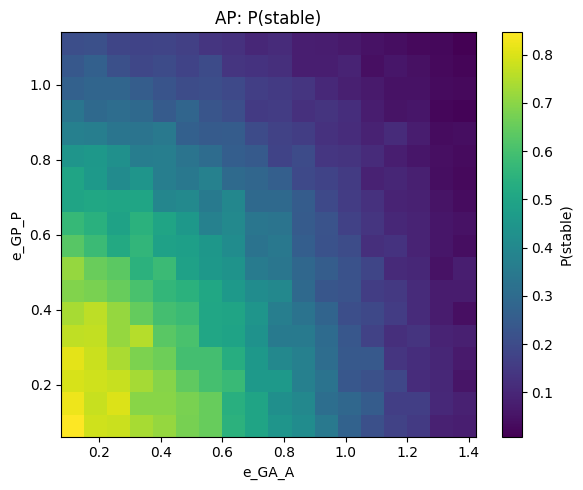

Saved figure: 12_AP_e_GA_A_x_e_GP_P_lambda_map.[png/svg/pdf]


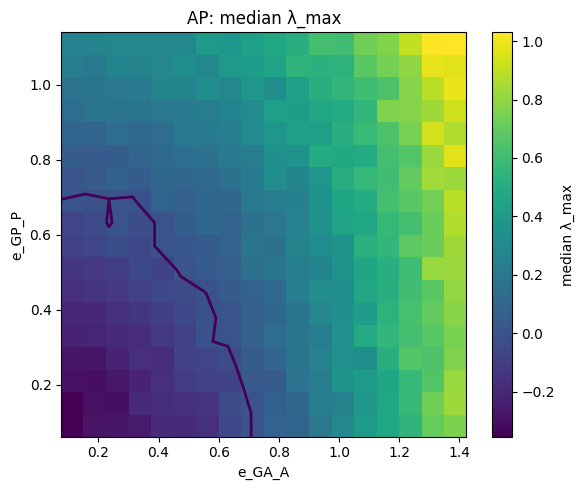

Saved table: 11_APC_e_GA_C_x_e_GA_A_stability_map.csv
Saved figure: 11_APC_e_GA_C_x_e_GA_A_Pstable_map.[png/svg/pdf]


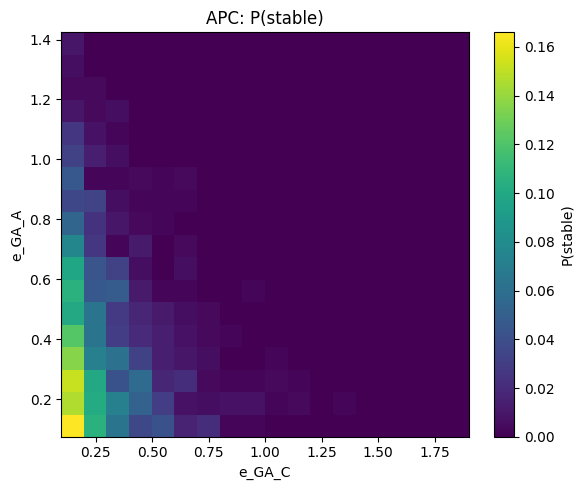

Saved figure: 12_APC_e_GA_C_x_e_GA_A_lambda_map.[png/svg/pdf]


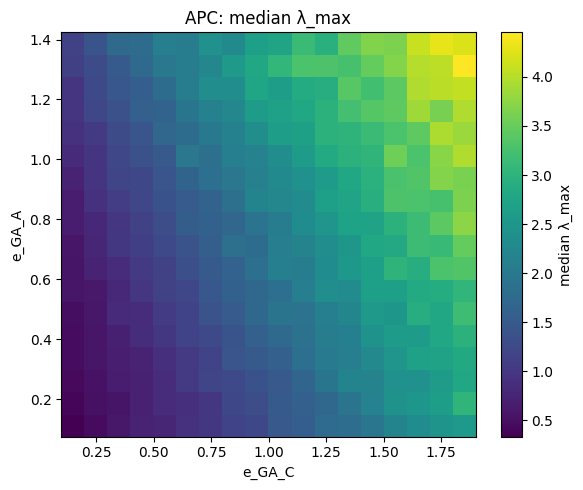

Saved table: 11_APH_e_GA_A_x_e_GH_P_stability_map.csv
Saved figure: 11_APH_e_GA_A_x_e_GH_P_Pstable_map.[png/svg/pdf]


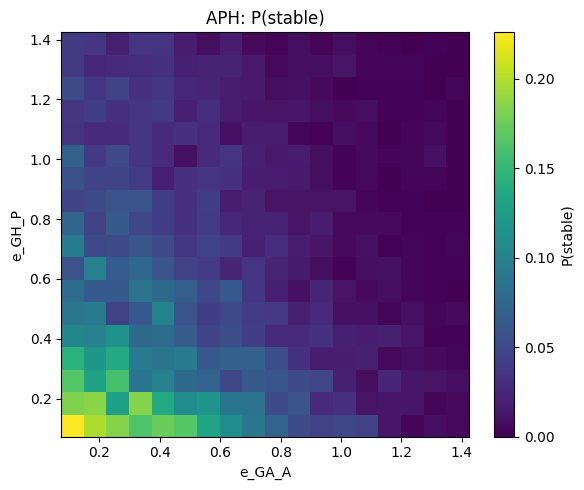

Saved figure: 12_APH_e_GA_A_x_e_GH_P_lambda_map.[png/svg/pdf]


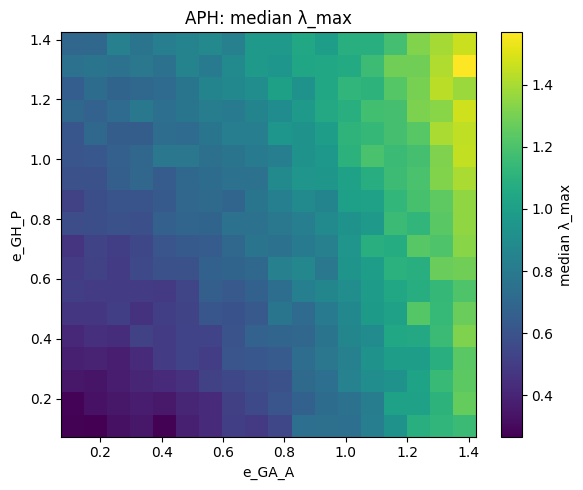

Saved table: 11_APHC_e_GA_C_x_e_GA_A_stability_map.csv
Saved figure: 11_APHC_e_GA_C_x_e_GA_A_Pstable_map.[png/svg/pdf]


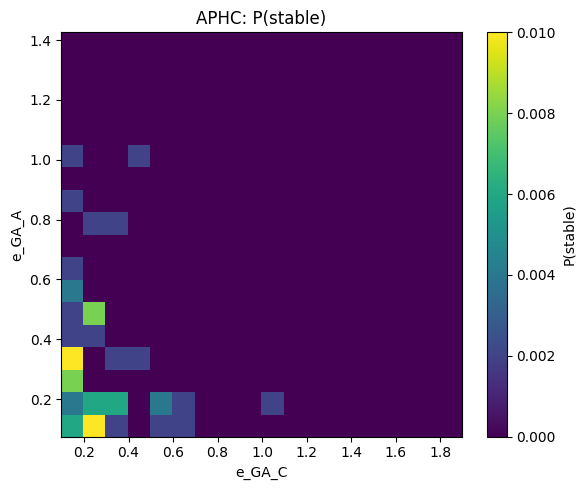

Saved figure: 12_APHC_e_GA_C_x_e_GA_A_lambda_map.[png/svg/pdf]


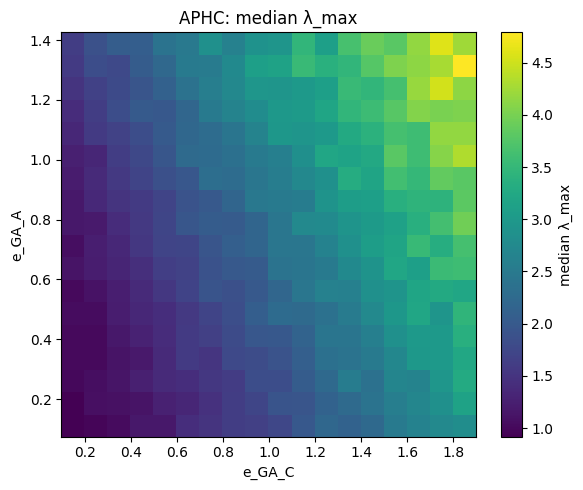

In [20]:
def two_parameter_probability_map(model, px, gx, py, gy, n_per=MAP_N, seed=777):
    rows=[]
    counter=0
    for y in gy:
        for x in gx:
            p=sample_params(model,n_per,seed+counter); counter+=1
            p=override_param(p,px,x)
            p=override_param(p,py,y)
            res=analyze_jacobians(BUILDERS[model](p))
            rows.append({
                px:x, py:y, "P_stable":res["stable"].mean(),
                "median_lambda_max":np.median(res["leading_real"]),
                "N":n_per
            })
    return pd.DataFrame(rows)

twoD_maps={}
for model in BUILDERS:
    top=association_tables[model]["parameter"].head(2).tolist()
    if len(top)<2: continue
    px,py=top
    vx=ensembles[model]["params"][px]; vy=ensembles[model]["params"][py]
    gx=np.linspace(np.quantile(vx,.05),np.quantile(vx,.95),18)
    gy=np.linspace(np.quantile(vy,.05),np.quantile(vy,.95),18)
    df=two_parameter_probability_map(model,px,gx,py,gy)
    twoD_maps[model]=(px,py,df)
    save_table(df,f"11_{model}_{px}_x_{py}_stability_map")

    pivot=df.pivot(index=py,columns=px,values="P_stable")
    fig,ax=plt.subplots(figsize=(6,5))
    im=ax.imshow(pivot.values,origin="lower",aspect="auto",
                 extent=[pivot.columns.min(),pivot.columns.max(),
                         pivot.index.min(),pivot.index.max()])
    ax.set_xlabel(px); ax.set_ylabel(py)
    ax.set_title(f"{model}: P(stable)")
    fig.colorbar(im,ax=ax,label="P(stable)")
    finish_plot(f"11_{model}_{px}_x_{py}_Pstable_map",fig)

    pivot2=df.pivot(index=py,columns=px,values="median_lambda_max")
    fig,ax=plt.subplots(figsize=(6,5))
    im=ax.imshow(pivot2.values,origin="lower",aspect="auto",
                 extent=[pivot2.columns.min(),pivot2.columns.max(),
                         pivot2.index.min(),pivot2.index.max()])
    ax.contour(pivot2.columns,pivot2.index,pivot2.values,levels=[0],linewidths=2)
    ax.set_xlabel(px); ax.set_ylabel(py)
    ax.set_title(f"{model}: median λ_max")
    fig.colorbar(im,ax=ax,label="median λ_max")
    finish_plot(f"12_{model}_{px}_x_{py}_lambda_map",fig)

# 12. Press perturbation analysis

For a sufficiently small persistent perturbation \(q\), the implicit-function theorem gives the local steady-state displacement

\[
\delta=-J^{-1}q.
\]

Here:

- \(J^{-1}\) propagates the perturbation through the local network;
- \(q\) contains the direct perturbation to each state equation;
- \(\delta_i\) is the predicted normalized steady-state shift of state \(i\).

For example, a perturbation applied directly to Amygdala drive is represented by

\[
q=(\varepsilon,0,\ldots,0)^\top.
\]

The norm

\[
\|\delta\|_2
\]

is used as a compact measure of local press sensitivity. This is distinct from local stability: two stable Jacobians can differ strongly in \(J^{-1}\) and therefore in their response to the same persistent perturbation.

Saved table: 13_AP_press_perturbation_responses.csv
Saved table: 13_AP_press_response_summary.csv
Saved figure: 13_AP_press_sensitivity.[png/svg/pdf]


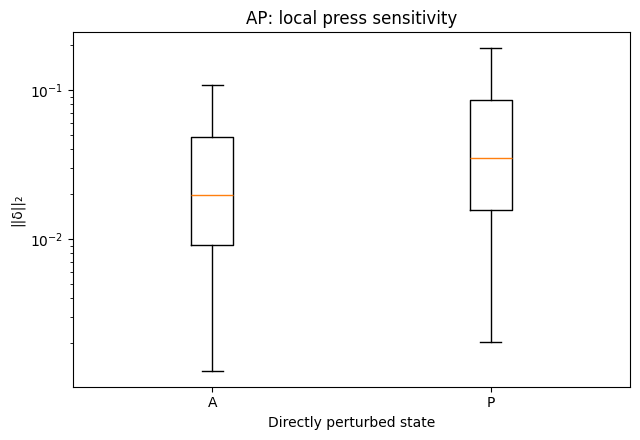

Saved table: 13_APC_press_perturbation_responses.csv
Saved table: 13_APC_press_response_summary.csv
Saved figure: 13_APC_press_sensitivity.[png/svg/pdf]


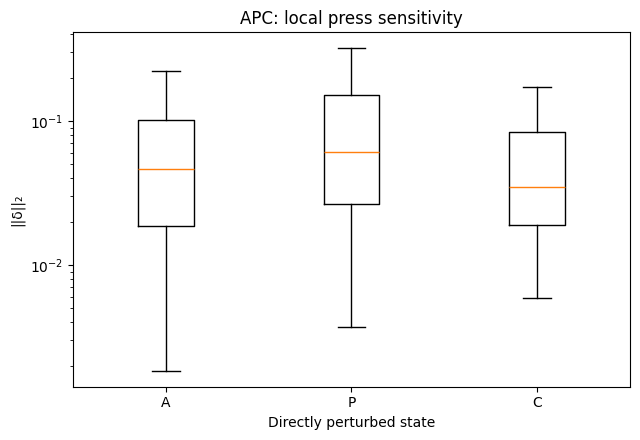

Saved table: 13_APH_press_perturbation_responses.csv
Saved table: 13_APH_press_response_summary.csv
Saved figure: 13_APH_press_sensitivity.[png/svg/pdf]


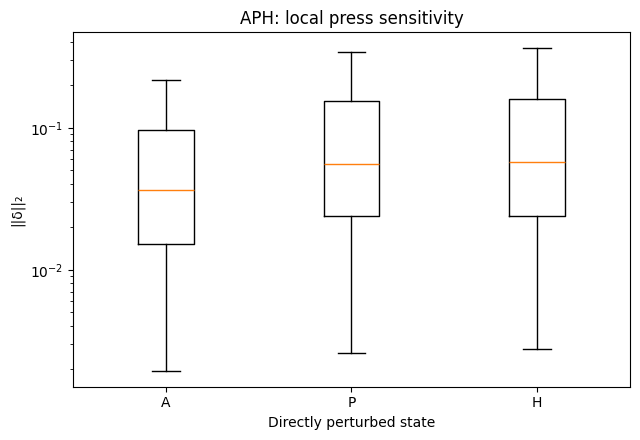

Saved table: 13_APHC_press_perturbation_responses.csv
Saved table: 13_APHC_press_response_summary.csv
Saved figure: 13_APHC_press_sensitivity.[png/svg/pdf]


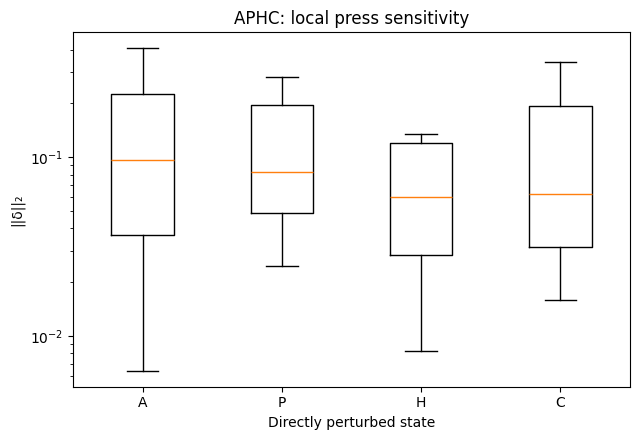

In [21]:
def press_response(J, state_index=0, epsilon=0.01):
    n=len(J)
    q=np.zeros(n); q[state_index]=epsilon
    try:
        delta=-np.linalg.solve(J,q)
        return delta
    except np.linalg.LinAlgError:
        return np.full(n,np.nan)

press_tables={}
for model,d in ensembles.items():
    states=MODEL_STATES[model]
    stable_idx=np.where(d["res"]["stable"])[0]
    # cap for convenient Colab execution
    stable_idx=stable_idx[:min(20_000,len(stable_idx))]
    rows=[]
    for idx in stable_idx:
        for target_i,target in enumerate(states):
            delta=press_response(d["J"][idx],target_i,epsilon=.01)
            row={"sample_index":idx,"perturbed_state":target,
                 "response_norm":np.linalg.norm(delta)}
            row.update({f"delta_{s}":delta[j] for j,s in enumerate(states)})
            rows.append(row)
    tab=pd.DataFrame(rows)
    press_tables[model]=tab
    save_table(tab,f"13_{model}_press_perturbation_responses")

    if len(tab):
        summary=tab.groupby("perturbed_state")["response_norm"].agg(
            ["count","mean","median","std"]).reset_index()
        save_table(summary,f"13_{model}_press_response_summary")
        fig,ax=plt.subplots(figsize=(6.5,4.5))
        groups=[tab.loc[tab["perturbed_state"]==s,"response_norm"].replace([np.inf],np.nan).dropna()
                for s in states]
        ax.boxplot(groups,tick_labels=states,showfliers=False)
        ax.set_yscale("log")
        ax.set_xlabel("Directly perturbed state")
        ax.set_ylabel("||δ||₂")
        ax.set_title(f"{model}: local press sensitivity")
        finish_plot(f"13_{model}_press_sensitivity",fig)

# 13. Press-response matrix / net-effects analysis

For a stable invertible Jacobian,

\[
R=-J^{-1}
\]

maps small persistent direct inputs to steady-state displacements:

\[
\delta=Rq.
\]

Element \(R_{ij}\) is therefore the local steady-state response of state \(i\) to a unit persistent perturbation applied to equation \(j\).

The notebook averages \(R\) over stable ensemble members and plots both signed and absolute mean responses.

Saved table: 14_AP_mean_press_response_matrix.csv
Saved figure: 14_AP_mean_signed_press_matrix.[png/svg/pdf]


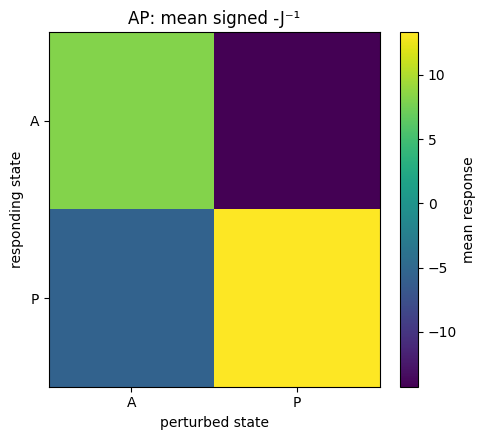

Saved figure: 15_AP_mean_absolute_press_matrix.[png/svg/pdf]


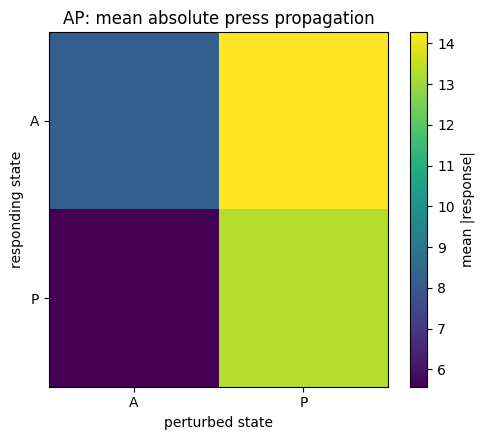

Saved table: 14_APC_mean_press_response_matrix.csv
Saved figure: 14_APC_mean_signed_press_matrix.[png/svg/pdf]


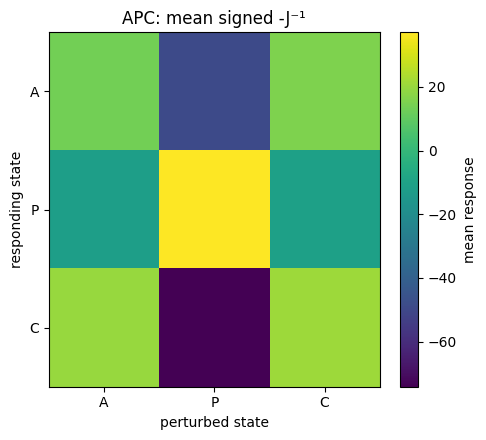

Saved figure: 15_APC_mean_absolute_press_matrix.[png/svg/pdf]


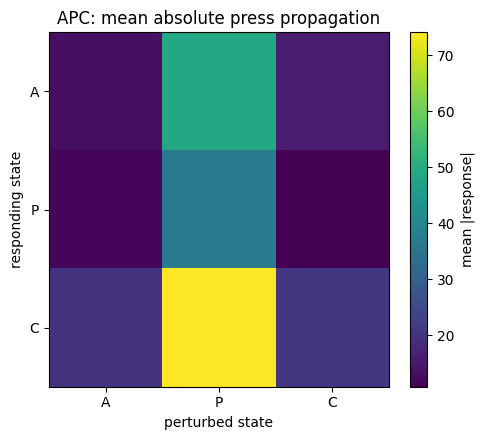

Saved table: 14_APH_mean_press_response_matrix.csv
Saved figure: 14_APH_mean_signed_press_matrix.[png/svg/pdf]


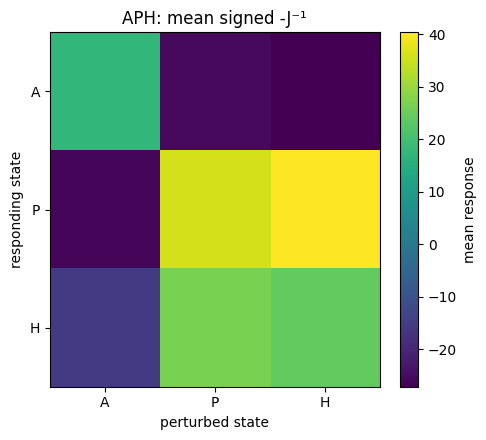

Saved figure: 15_APH_mean_absolute_press_matrix.[png/svg/pdf]


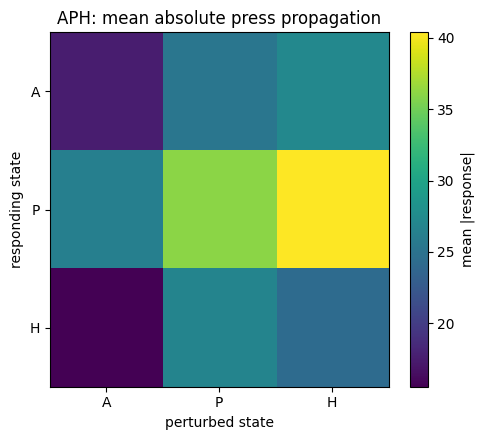

Saved table: 14_APHC_mean_press_response_matrix.csv
Saved figure: 14_APHC_mean_signed_press_matrix.[png/svg/pdf]


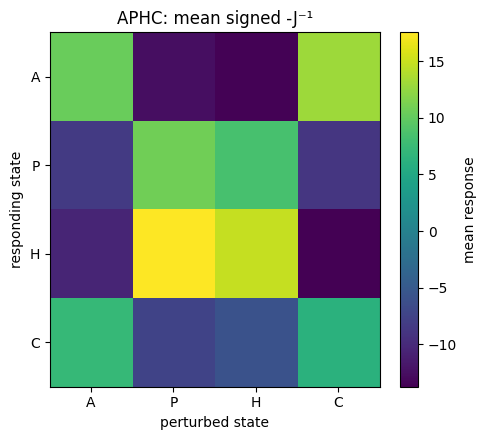

Saved figure: 15_APHC_mean_absolute_press_matrix.[png/svg/pdf]


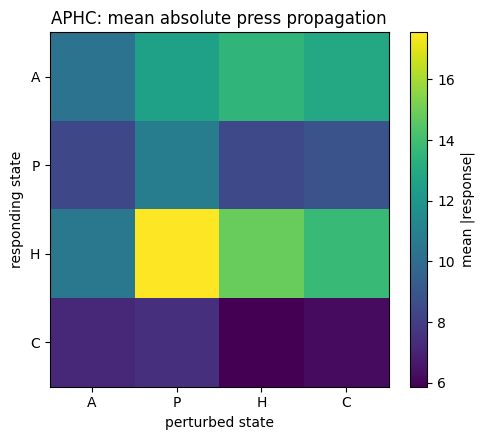

In [22]:
for model,d in ensembles.items():
    idx=np.where(d["res"]["stable"])[0][:10000]
    mats=[]
    for i in idx:
        try:
            mats.append(-np.linalg.inv(d["J"][i]))
        except np.linalg.LinAlgError:
            pass
    if not mats: continue
    R=np.stack(mats)
    meanR=np.mean(R,axis=0)
    meanAbs=np.mean(np.abs(R),axis=0)
    states=MODEL_STATES[model]

    tab=pd.DataFrame(meanR,index=states,columns=states)
    tab.index.name="responding_state"
    save_table(tab.reset_index(),f"14_{model}_mean_press_response_matrix")

    fig,ax=plt.subplots(figsize=(5,4.5))
    im=ax.imshow(meanR,aspect="auto")
    ax.set_xticks(range(len(states)),states)
    ax.set_yticks(range(len(states)),states)
    ax.set_xlabel("perturbed state")
    ax.set_ylabel("responding state")
    ax.set_title(f"{model}: mean signed -J⁻¹")
    fig.colorbar(im,ax=ax,label="mean response")
    finish_plot(f"14_{model}_mean_signed_press_matrix",fig)

    fig,ax=plt.subplots(figsize=(5,4.5))
    im=ax.imshow(meanAbs,aspect="auto")
    ax.set_xticks(range(len(states)),states)
    ax.set_yticks(range(len(states)),states)
    ax.set_xlabel("perturbed state")
    ax.set_ylabel("responding state")
    ax.set_title(f"{model}: mean absolute press propagation")
    fig.colorbar(im,ax=ax,label="mean |response|")
    finish_plot(f"15_{model}_mean_absolute_press_matrix",fig)

# 14. Sensitivity, influence, and modal participation

A complementary question is whether a state is especially involved in the dominant dynamical mode.

For an eigenvalue \(\lambda_k\), let \(v_k\) be the right eigenvector and \(w_k\) the left eigenvector. A simple normalized participation measure is based on

\[
|w_{ik}v_{ik}|.
\]

At a stability boundary this identifies which states contribute most strongly to the critical mode.

The notebook also computes press-based state summaries from \(-J^{-1}\):

- **response sensitivity** of state \(i\): mean absolute response of state \(i\) to perturbations applied across all nodes;
- **perturbation influence** of state \(j\): mean absolute propagation caused by perturbing state \(j\).

These are transparent inverse-Jacobian summaries. They are kept separate from any literature-specific eigenvector sensitivity/influence definition.

Saved table: 16_state_press_sensitivity_influence.csv
Saved figure: 16_state_sensitivity.[png/svg/pdf]


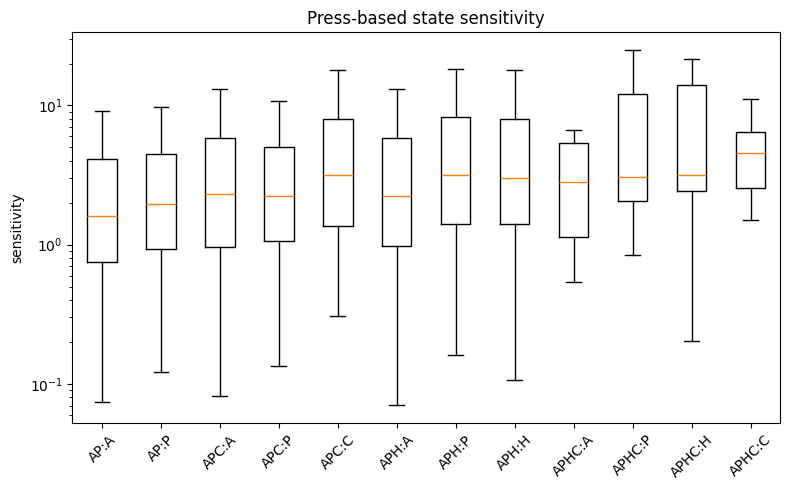

Saved figure: 16_state_influence.[png/svg/pdf]


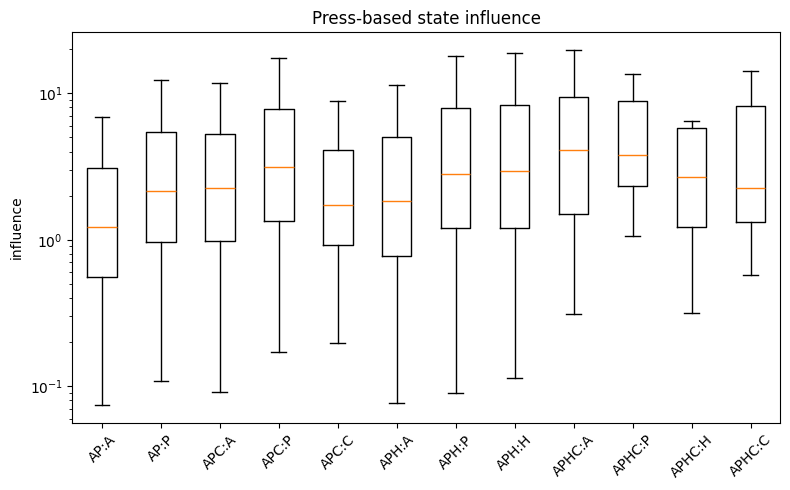

In [23]:
def inverse_jacobian_sensitivity_influence(J):
    R=-np.linalg.inv(J)
    sensitivity=np.mean(np.abs(R),axis=1)  # responding row
    influence=np.mean(np.abs(R),axis=0)    # perturbed column
    return sensitivity,influence

si_rows=[]
for model,d in ensembles.items():
    states=MODEL_STATES[model]
    idx=np.where(d["res"]["stable"])[0][:10000]
    for i in idx:
        try:
            se,inf=inverse_jacobian_sensitivity_influence(d["J"][i])
        except np.linalg.LinAlgError:
            continue
        for j,s in enumerate(states):
            si_rows.append({"model":model,"sample_index":i,"state":s,
                            "sensitivity":se[j],"influence":inf[j]})
si=pd.DataFrame(si_rows)
save_table(si,"16_state_press_sensitivity_influence")

for metric in ["sensitivity","influence"]:
    fig,ax=plt.subplots(figsize=(8,5))
    labels=[]; data=[]
    for model in BUILDERS:
        for s in MODEL_STATES[model]:
            vals=si.loc[(si.model==model)&(si.state==s),metric].replace([np.inf],np.nan).dropna()
            if len(vals):
                labels.append(f"{model}:{s}"); data.append(vals)
    ax.boxplot(data,tick_labels=labels,showfliers=False)
    ax.set_yscale("log")
    ax.tick_params(axis="x",rotation=45)
    ax.set_ylabel(metric)
    ax.set_title(f"Press-based state {metric}")
    finish_plot(f"16_state_{metric}",fig)

# 15. Non-normality and transient amplification

Eigenvalues determine asymptotic local stability, but a stable non-normal Jacobian can still show transient amplification.

The **numerical abscissa** is

\[
\omega(J)
=
\lambda_{\max}
\left(
\frac{J+J^\top}{2}
\right).
\]

If

\[
\omega(J)>0
\]

while

\[
\lambda_{\max}(J)<0,
\]

the system is asymptotically stable but permits instantaneous growth of some perturbation direction.

We also calculate a simple non-normality measure

\[
\|J^\top J-JJ^\top\|_F.
\]

These quantities add a useful distinction between asymptotic recovery and transient vulnerability.

Saved table: 17_AP_nonnormality_reactivity.csv
Saved figure: 17_AP_stability_vs_reactivity.[png/svg/pdf]


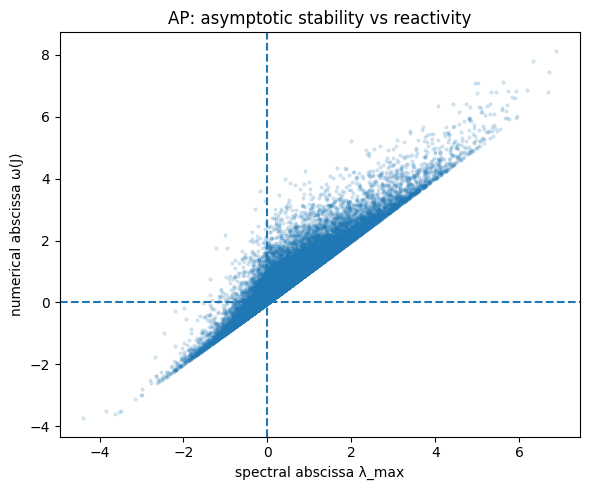

Saved table: 17_APC_nonnormality_reactivity.csv
Saved figure: 17_APC_stability_vs_reactivity.[png/svg/pdf]


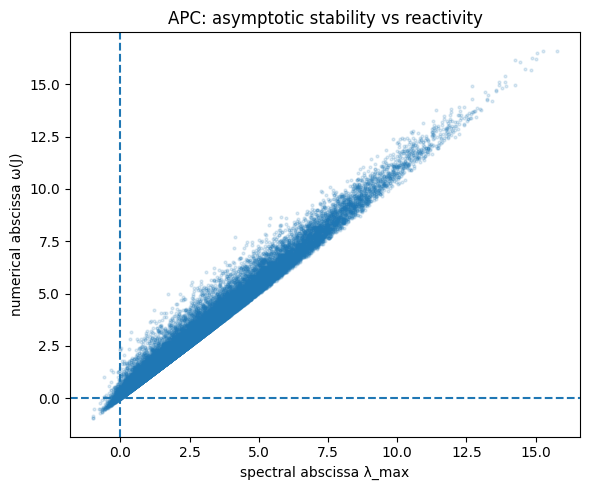

Saved table: 17_APH_nonnormality_reactivity.csv
Saved figure: 17_APH_stability_vs_reactivity.[png/svg/pdf]


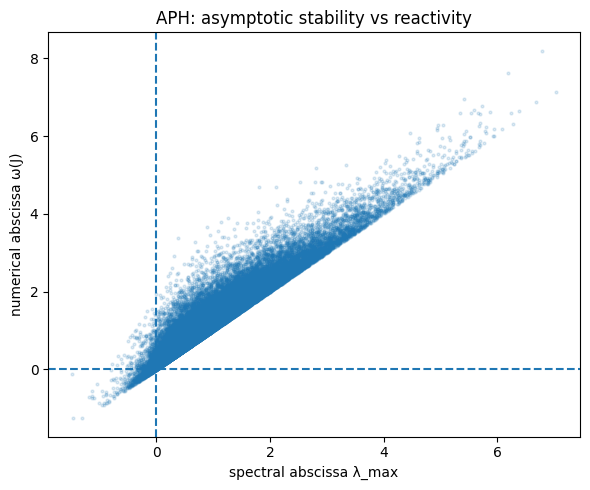

Saved table: 17_APHC_nonnormality_reactivity.csv
Saved figure: 17_APHC_stability_vs_reactivity.[png/svg/pdf]


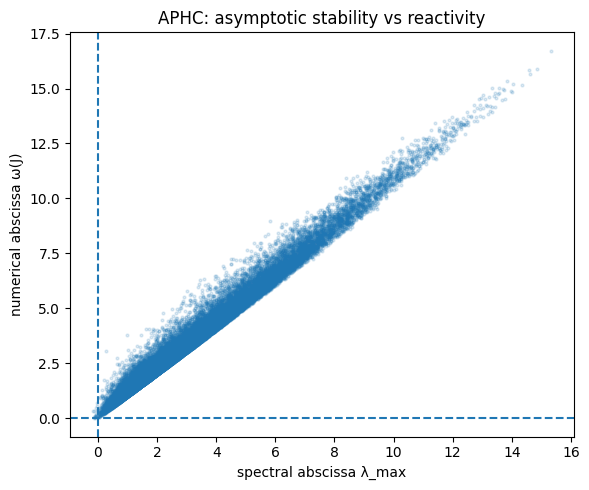

In [24]:
def nonnormal_metrics(Jstack):
    numerical_abscissa=[]
    departure=[]
    for J in Jstack:
        H=(J+J.T)/2
        numerical_abscissa.append(np.linalg.eigvalsh(H).max())
        departure.append(np.linalg.norm(J.T@J-J@J.T,ord="fro"))
    return np.asarray(numerical_abscissa),np.asarray(departure)

for model,d in ensembles.items():
    w,dep=nonnormal_metrics(d["J"])
    stable=d["res"]["stable"]
    tab=pd.DataFrame({
        "leading_real":d["res"]["leading_real"],
        "stable":stable.astype(int),
        "numerical_abscissa":w,
        "nonnormality_commutator_F":dep,
        "stable_but_reactive":(stable & (w>0)).astype(int)
    })
    save_table(tab,f"17_{model}_nonnormality_reactivity")

    fig,ax=plt.subplots(figsize=(6,5))
    ax.scatter(d["res"]["leading_real"],w,s=4,alpha=.15)
    ax.axvline(0,linestyle="--"); ax.axhline(0,linestyle="--")
    ax.set_xlabel("spectral abscissa λ_max")
    ax.set_ylabel("numerical abscissa ω(J)")
    ax.set_title(f"{model}: asymptotic stability vs reactivity")
    finish_plot(f"17_{model}_stability_vs_reactivity",fig)

# 16. Representative stable states for continuation

Bifurcation continuation requires a concrete generalized-parameter realization.

For each model, the notebook selects a stable sample near the median stable value of \(\lambda_{\max}\), rather than selecting the most stable or most unstable realization. This avoids deliberately choosing an extreme example.

The complete parameter vector of each selected realization is exported so that every continuation plot is reproducible.

In [25]:
def representative_stable(model):
    d=ensembles[model]
    idx=np.where(d["res"]["stable"])[0]
    if len(idx)==0:
        raise RuntimeError(f"No stable samples found for {model}. Increase N or revise priors.")
    vals=d["res"]["leading_real"][idx]
    target=np.median(vals)
    chosen=idx[np.argmin(np.abs(vals-target))]
    base={k:float(v[chosen]) for k,v in d["params"].items()}
    return chosen,base

representatives={}
for model in BUILDERS:
    idx,base=representative_stable(model)
    representatives[model]=base
    tab=pd.DataFrame({"parameter":list(base),"value":list(base.values())})
    save_table(tab,f"18_{model}_representative_stable_parameters")
    print(model,"sample",idx,"lambda_max",ensembles[model]["res"]["leading_real"][idx])

Saved table: 18_AP_representative_stable_parameters.csv
AP sample 47017 lambda_max -0.2346506840593353
Saved table: 18_APC_representative_stable_parameters.csv
APC sample 36525 lambda_max -0.117154370835716
Saved table: 18_APH_representative_stable_parameters.csv
APH sample 40636 lambda_max -0.10418633794383735
Saved table: 18_APHC_representative_stable_parameters.csv
APHC sample 29920 lambda_max -0.0771161335161972


# 17. One-parameter eigenvalue continuation

For a selected base parameter set, vary one generalized parameter \(x\) continuously while holding all others fixed.

For every value of \(x\), compute all eigenvalues of \(J(x)\). The plot shows both real and imaginary components.

A stability boundary is detected when the leading real part changes sign. Root finding then refines the crossing location by solving

\[
f(x)=\lambda_{\max}(x)=0.
\]

The critical eigenvalues determine whether the boundary is classified as:

- **zero-eigenvalue boundary** if the critical imaginary part is approximately zero;
- **Hopf candidate** if a conjugate pair has non-zero imaginary part.

The local crossing slope

\[
\frac{d\Re(\lambda_{\mathrm{crit}})}{dx}
\]

is estimated numerically. A non-zero slope supports a transversal crossing.

In [26]:
def single_param_dict_to_arrays(base, n=1):
    return {k:np.full(n,v,float) for k,v in base.items()}

def J_at(model, base, param, value):
    p=single_param_dict_to_arrays(base,1)
    p[param][:]=value
    return BUILDERS[model](p)[0]

def leading_real_at(model,base,param,value):
    return np.linalg.eigvals(J_at(model,base,param,value)).real.max()

def continuation(model,base,param,grid):
    rows=[]
    for x in grid:
        eig=np.linalg.eigvals(J_at(model,base,param,x))
        order=np.argsort(eig.real)[::-1]
        eig=eig[order]
        row={"parameter":param,"value":x,"leading_real":eig.real.max()}
        for k,z in enumerate(eig):
            row[f"eig{k}_real"]=z.real
            row[f"eig{k}_imag"]=z.imag
        rows.append(row)
    return pd.DataFrame(rows)

def refine_crossings(model,base,param,grid,tol_imag=1e-5):
    vals=np.array([leading_real_at(model,base,param,x) for x in grid])
    crossings=[]
    for i in range(len(grid)-1):
        if vals[i]==0 or vals[i]*vals[i+1]<0:
            a,b=grid[i],grid[i+1]
            try:
                root=optimize.brentq(lambda x:leading_real_at(model,base,param,x),a,b)
            except Exception:
                continue
            J=J_at(model,base,param,root)
            eig=np.linalg.eigvals(J)
            crit=eig[np.argmax(eig.real)]
            h=max(1e-6,abs(root)*1e-4)
            slope=(leading_real_at(model,base,param,root+h)-
                   leading_real_at(model,base,param,root-h))/(2*h)
            bif_type="Hopf_candidate" if abs(crit.imag)>tol_imag else "zero_eigenvalue_boundary"
            omega=abs(crit.imag)
            period=(2*np.pi/omega) if omega>tol_imag else np.nan
            crossings.append({
                "model":model,"parameter":param,"critical_value":root,
                "critical_real":crit.real,"critical_imag":crit.imag,
                "boundary_type":bif_type,
                "crossing_slope":slope,
                "hopf_omega":omega if bif_type=="Hopf_candidate" else np.nan,
                "hopf_period":period,
            })
    return pd.DataFrame(crossings)

def plot_continuation(df,model,param):
    eig_real=[c for c in df.columns if c.startswith("eig") and c.endswith("_real")]
    eig_imag=[c for c in df.columns if c.startswith("eig") and c.endswith("_imag")]

    fig,ax=plt.subplots(figsize=(7,4.5))
    for c in eig_real:
        ax.plot(df["value"],df[c],alpha=.8)
    ax.axhline(0,linestyle="--")
    ax.set_xlabel(param); ax.set_ylabel("Re(λ)")
    ax.set_title(f"{model}: eigenvalue continuation — real parts")
    finish_plot(f"19_{model}_{param}_continuation_real",fig)

    fig,ax=plt.subplots(figsize=(7,4.5))
    for c in eig_imag:
        ax.plot(df["value"],df[c],alpha=.8)
    ax.axhline(0,linestyle="--")
    ax.set_xlabel(param); ax.set_ylabel("Im(λ)")
    ax.set_title(f"{model}: eigenvalue continuation — imaginary parts")
    finish_plot(f"20_{model}_{param}_continuation_imag",fig)

## 17.1 Automated continuation across all generalized parameters

For each model and each non-constant sampled generalized parameter, the notebook spans the central 1st–99th percentile of its exploratory prior and performs local eigenvalue continuation from the representative stable realization.

This produces a systematic screen of all one-parameter local stability boundaries supported by the current model.

Saved table: 19_AP_alpha_A_continuation.csv
Saved figure: 19_AP_alpha_A_continuation_real.[png/svg/pdf]


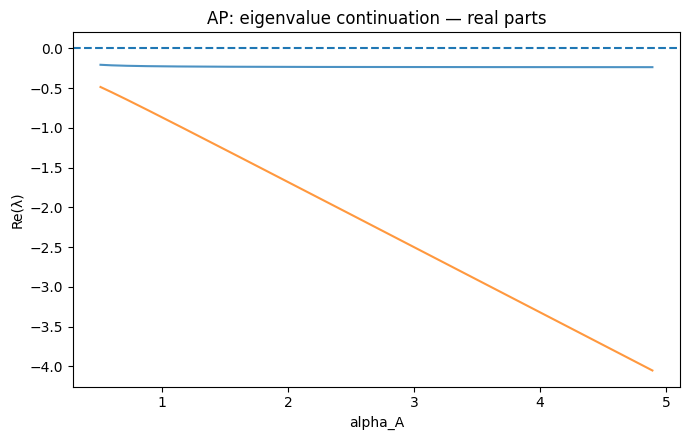

Saved figure: 20_AP_alpha_A_continuation_imag.[png/svg/pdf]


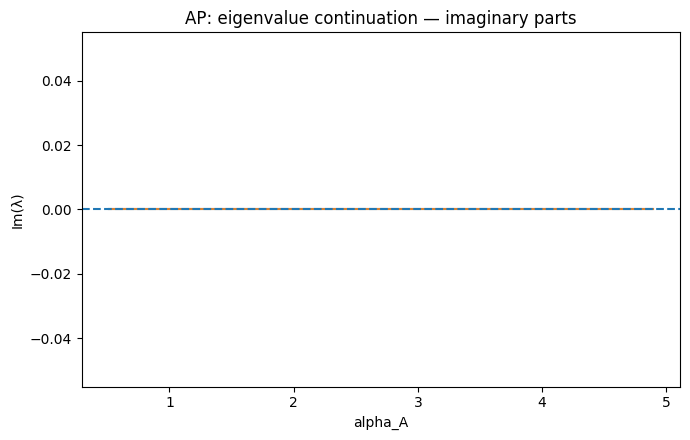

Saved table: 19_AP_alpha_P_continuation.csv
Saved figure: 19_AP_alpha_P_continuation_real.[png/svg/pdf]


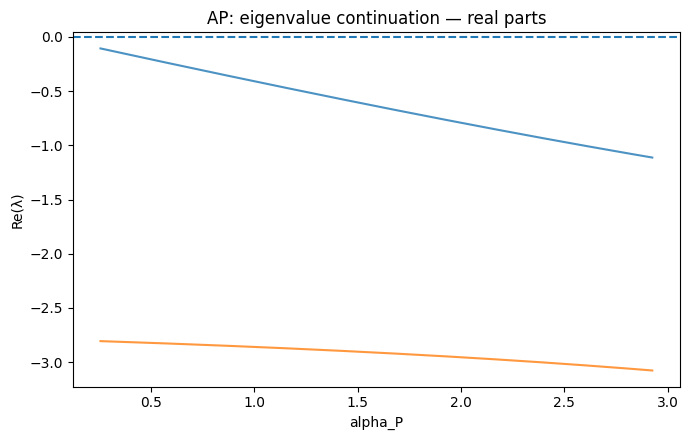

Saved figure: 20_AP_alpha_P_continuation_imag.[png/svg/pdf]


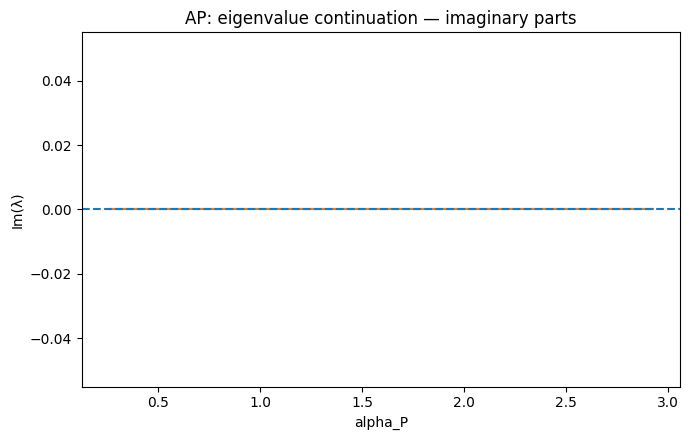

Saved table: 19_AP_e_GA_A_continuation.csv
Saved figure: 19_AP_e_GA_A_continuation_real.[png/svg/pdf]


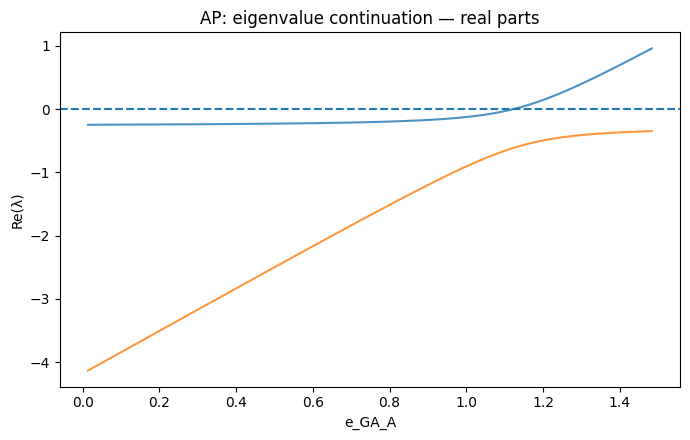

Saved figure: 20_AP_e_GA_A_continuation_imag.[png/svg/pdf]


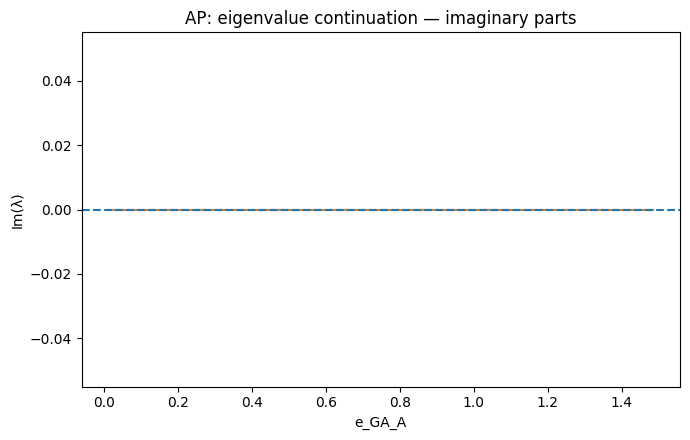

Saved table: 19_AP_e_LA0_A_continuation.csv
Saved figure: 19_AP_e_LA0_A_continuation_real.[png/svg/pdf]


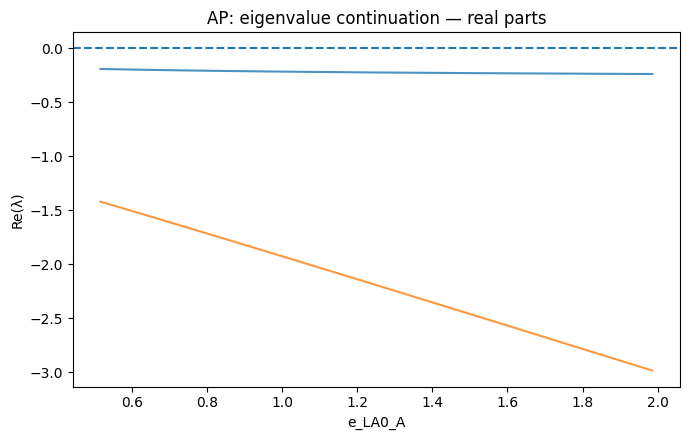

Saved figure: 20_AP_e_LA0_A_continuation_imag.[png/svg/pdf]


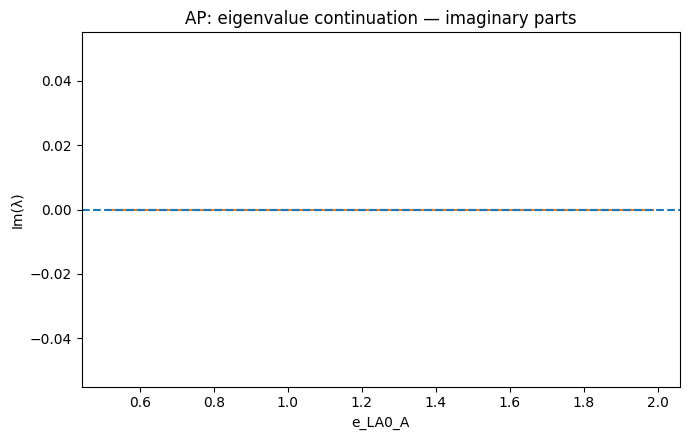

Saved table: 19_AP_e_GP_P_continuation.csv
Saved figure: 19_AP_e_GP_P_continuation_real.[png/svg/pdf]


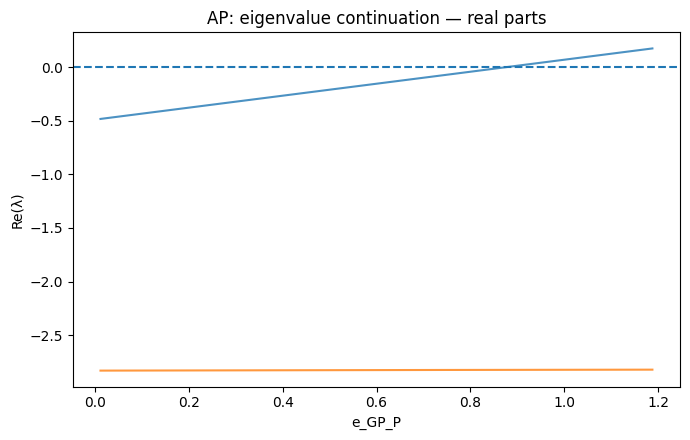

Saved figure: 20_AP_e_GP_P_continuation_imag.[png/svg/pdf]


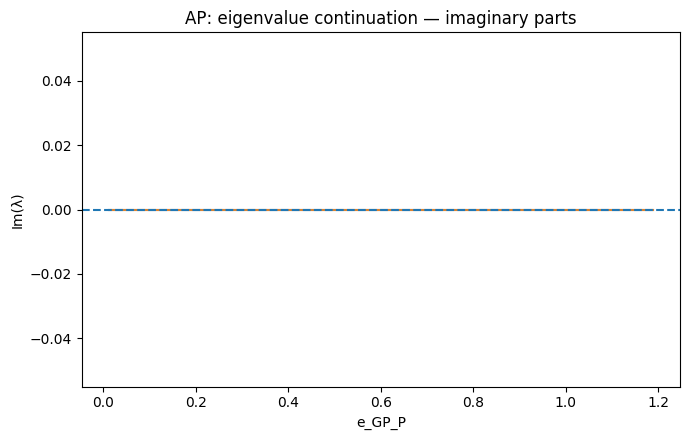

Saved table: 19_AP_e_LP0_P_continuation.csv
Saved figure: 19_AP_e_LP0_P_continuation_real.[png/svg/pdf]


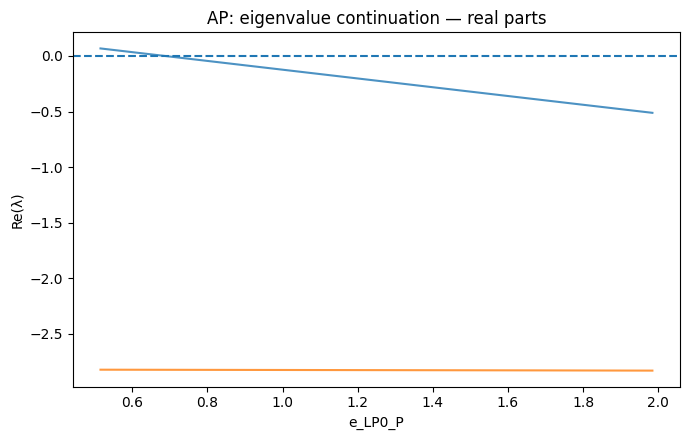

Saved figure: 20_AP_e_LP0_P_continuation_imag.[png/svg/pdf]


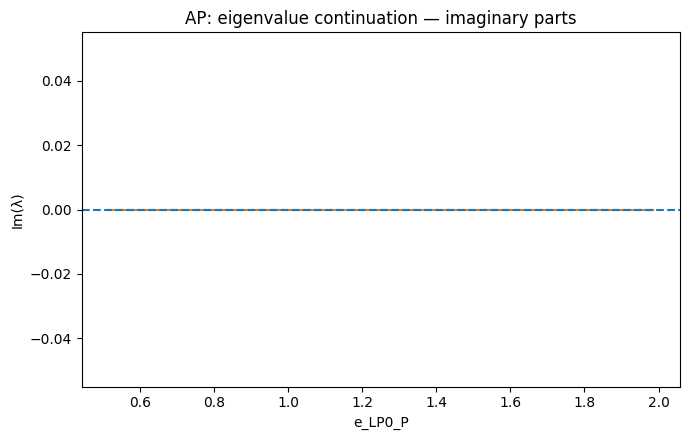

Saved table: 19_AP_rho_AP_continuation.csv
Saved figure: 19_AP_rho_AP_continuation_real.[png/svg/pdf]


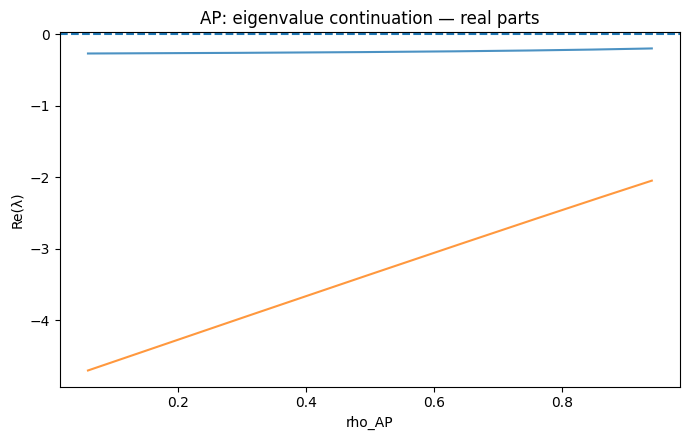

Saved figure: 20_AP_rho_AP_continuation_imag.[png/svg/pdf]


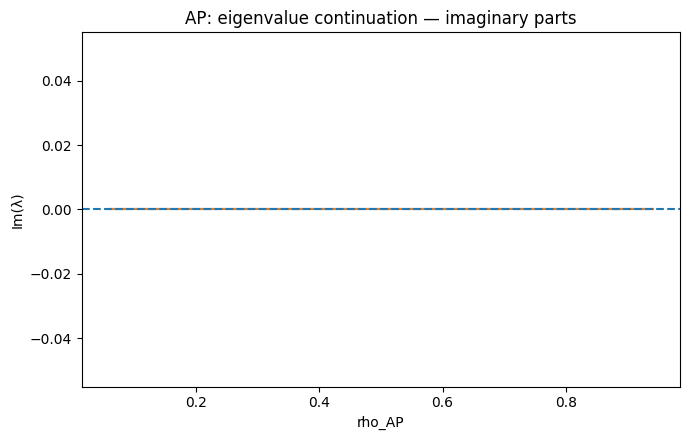

Saved table: 19_AP_rho_PA_continuation.csv
Saved figure: 19_AP_rho_PA_continuation_real.[png/svg/pdf]


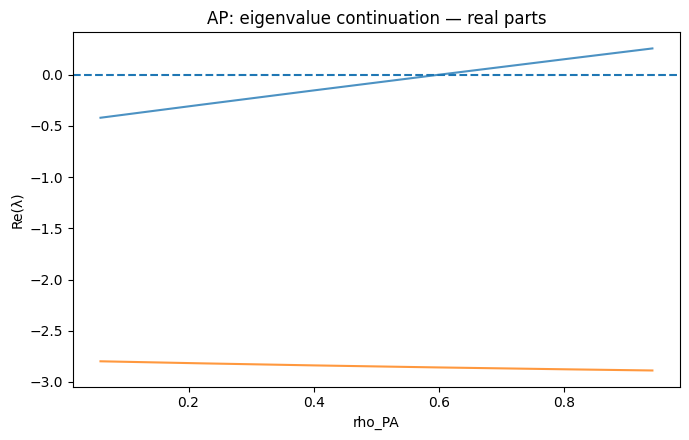

Saved figure: 20_AP_rho_PA_continuation_imag.[png/svg/pdf]


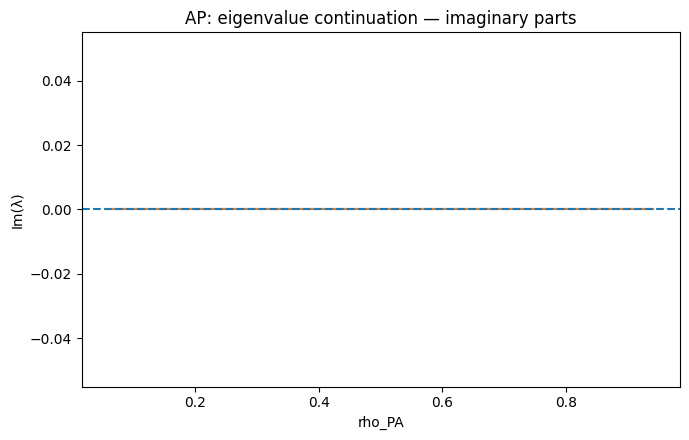

Saved table: 19_AP_e_LAP_A_continuation.csv
Saved figure: 19_AP_e_LAP_A_continuation_real.[png/svg/pdf]


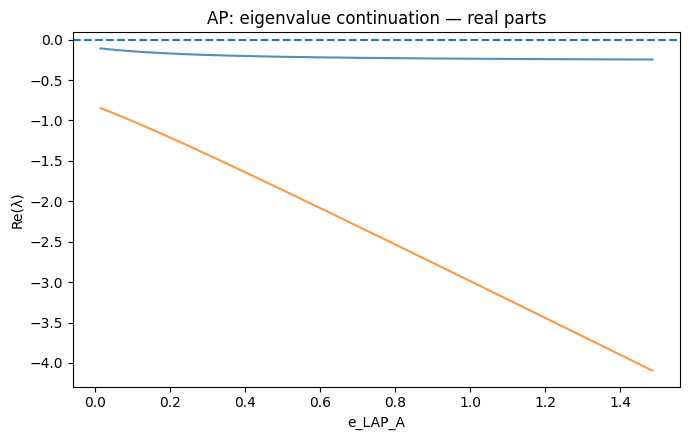

Saved figure: 20_AP_e_LAP_A_continuation_imag.[png/svg/pdf]


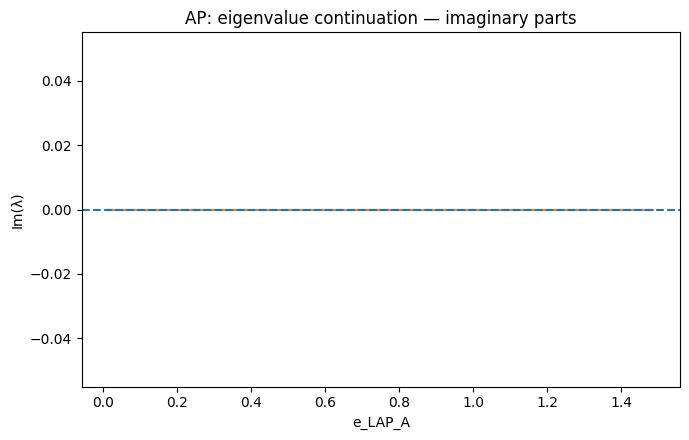

Saved table: 19_AP_e_LAP_P_continuation.csv
Saved figure: 19_AP_e_LAP_P_continuation_real.[png/svg/pdf]


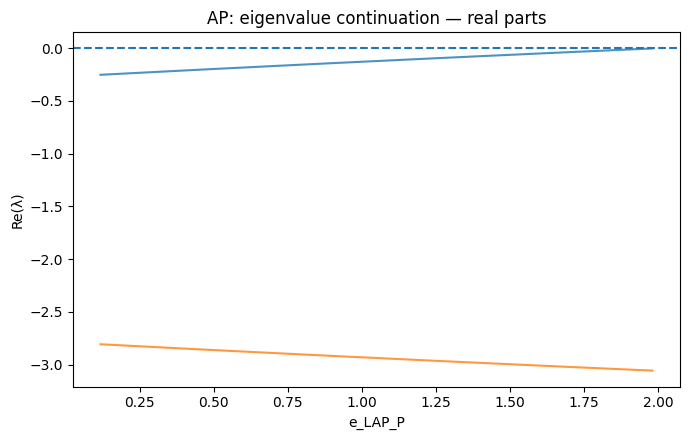

Saved figure: 20_AP_e_LAP_P_continuation_imag.[png/svg/pdf]


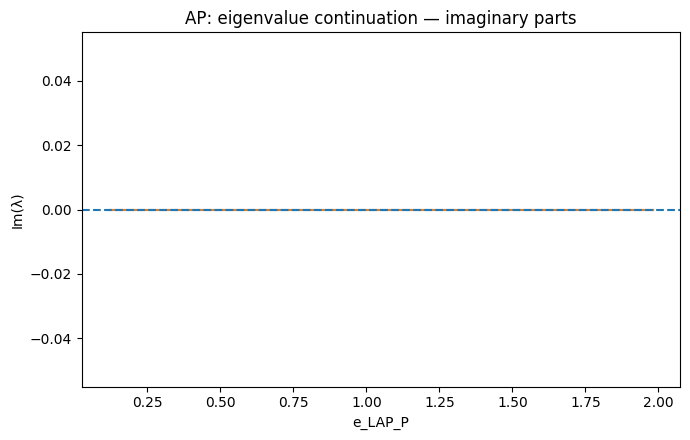

Saved table: 19_AP_e_LPA_A_continuation.csv
Saved figure: 19_AP_e_LPA_A_continuation_real.[png/svg/pdf]


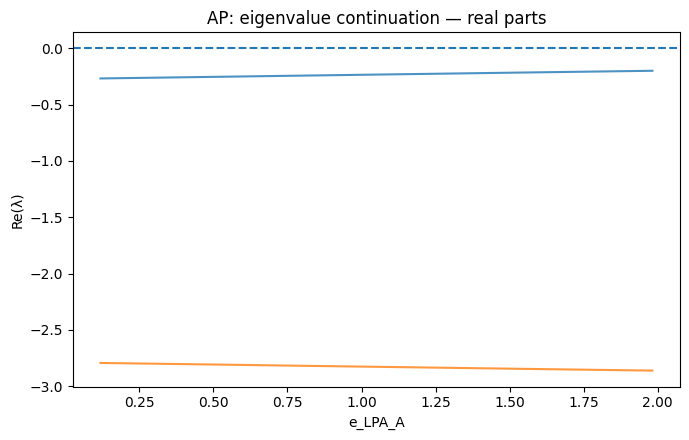

Saved figure: 20_AP_e_LPA_A_continuation_imag.[png/svg/pdf]


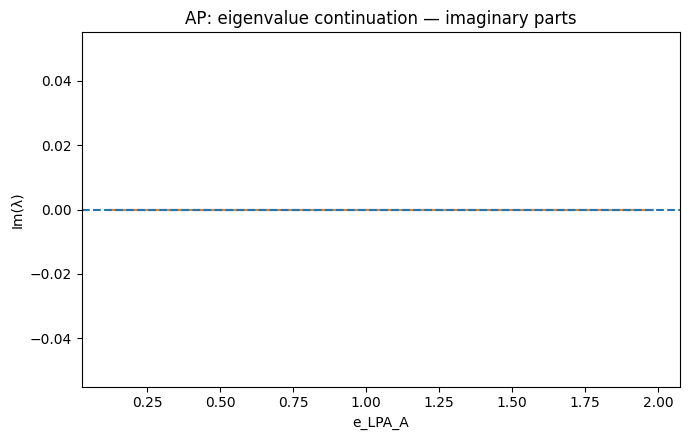

Saved table: 19_AP_e_LPA_P_continuation.csv
Saved figure: 19_AP_e_LPA_P_continuation_real.[png/svg/pdf]


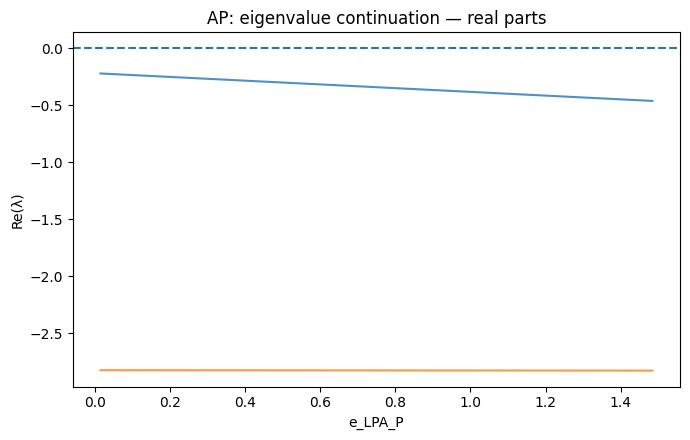

Saved figure: 20_AP_e_LPA_P_continuation_imag.[png/svg/pdf]


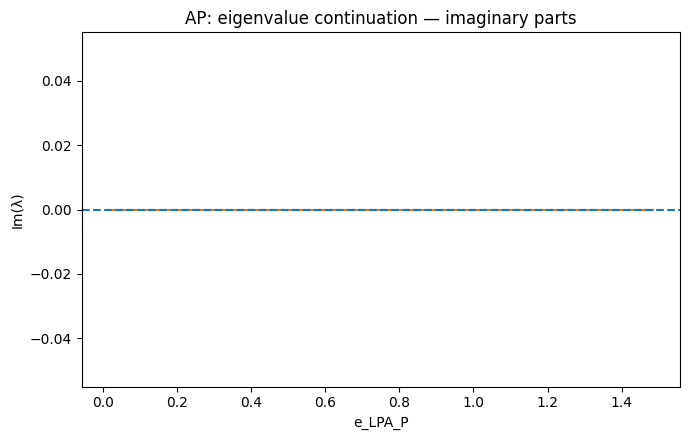

Saved table: 19_APC_alpha_A_continuation.csv
Saved figure: 19_APC_alpha_A_continuation_real.[png/svg/pdf]


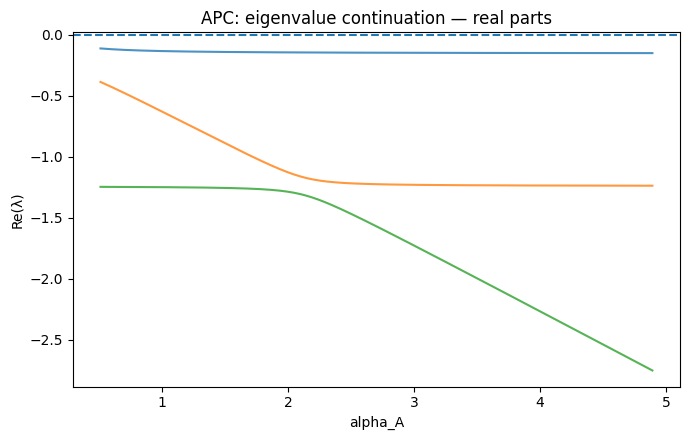

Saved figure: 20_APC_alpha_A_continuation_imag.[png/svg/pdf]


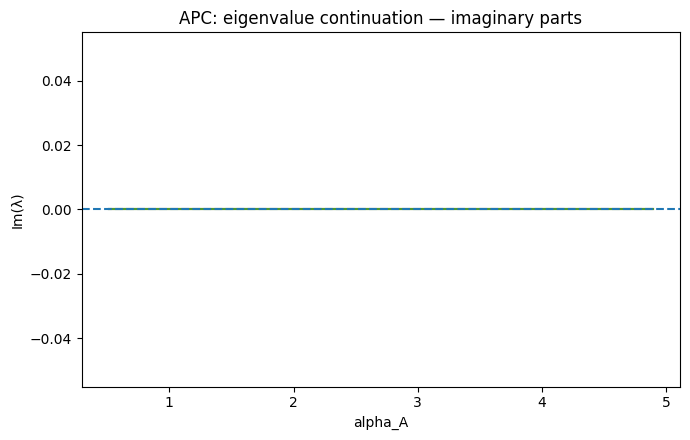

Saved table: 19_APC_alpha_P_continuation.csv
Saved figure: 19_APC_alpha_P_continuation_real.[png/svg/pdf]


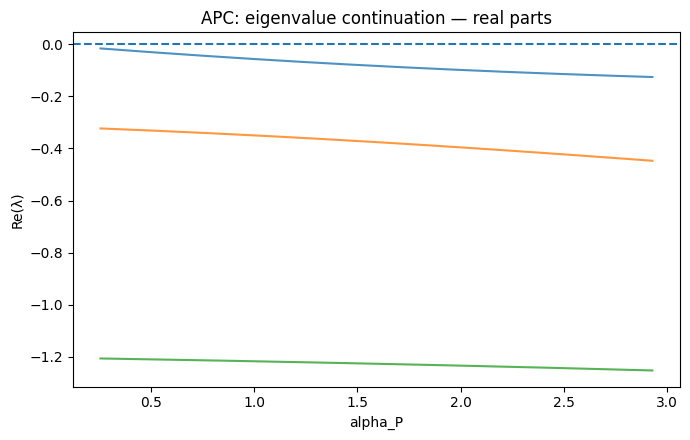

Saved figure: 20_APC_alpha_P_continuation_imag.[png/svg/pdf]


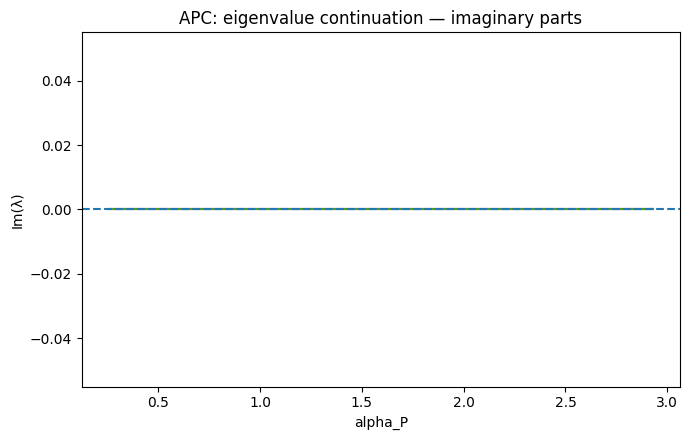

Saved table: 19_APC_e_GA_A_continuation.csv
Saved figure: 19_APC_e_GA_A_continuation_real.[png/svg/pdf]


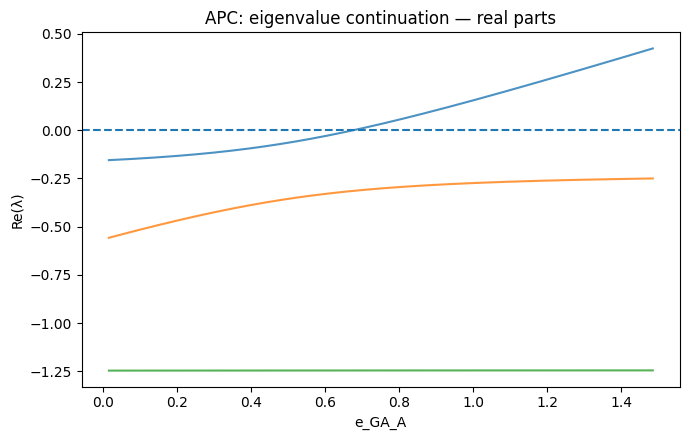

Saved figure: 20_APC_e_GA_A_continuation_imag.[png/svg/pdf]


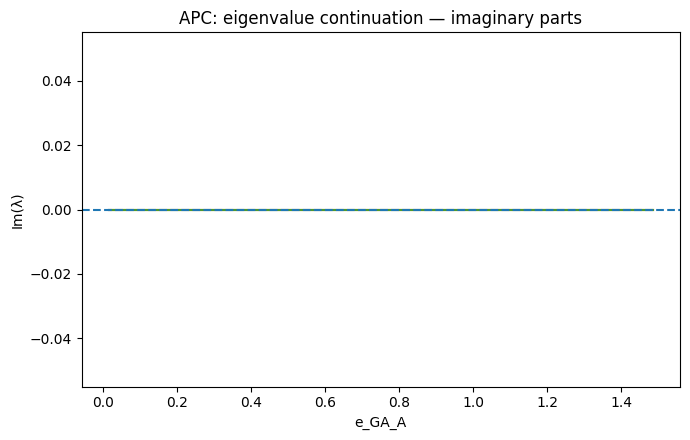

Saved table: 19_APC_e_LA0_A_continuation.csv
Saved figure: 19_APC_e_LA0_A_continuation_real.[png/svg/pdf]


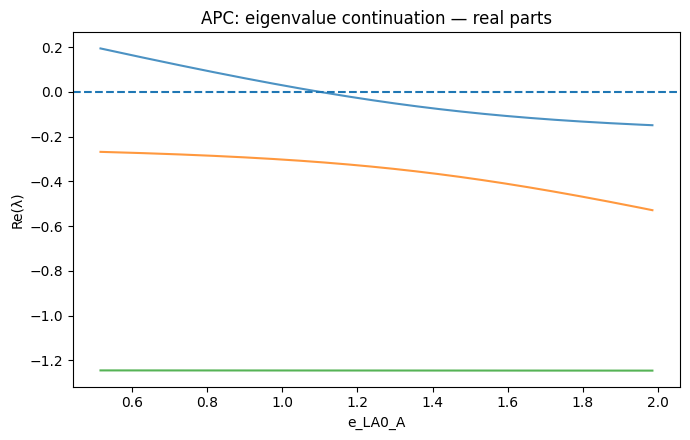

Saved figure: 20_APC_e_LA0_A_continuation_imag.[png/svg/pdf]


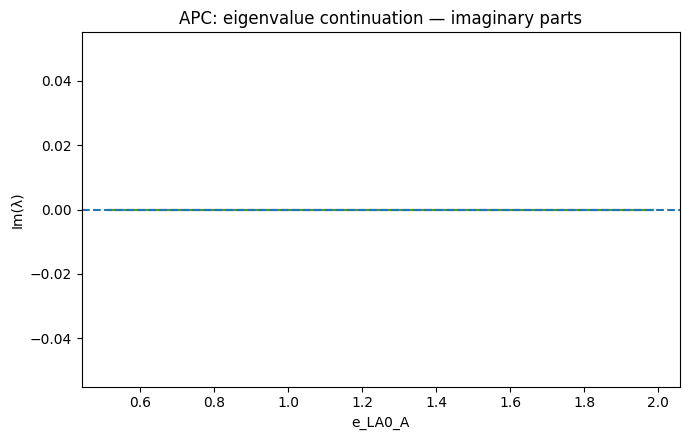

Saved table: 19_APC_e_GP_P_continuation.csv
Saved figure: 19_APC_e_GP_P_continuation_real.[png/svg/pdf]


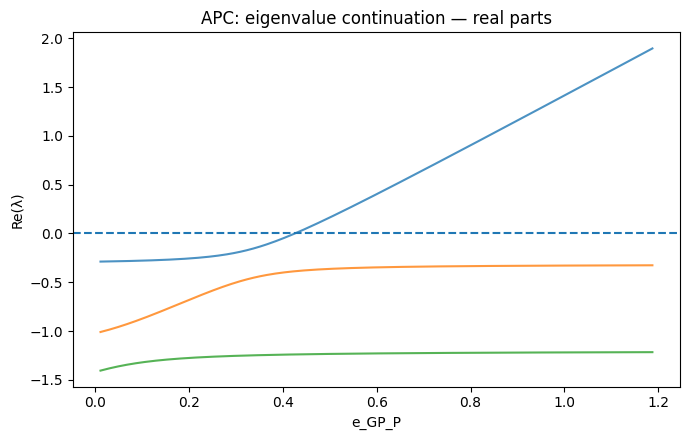

Saved figure: 20_APC_e_GP_P_continuation_imag.[png/svg/pdf]


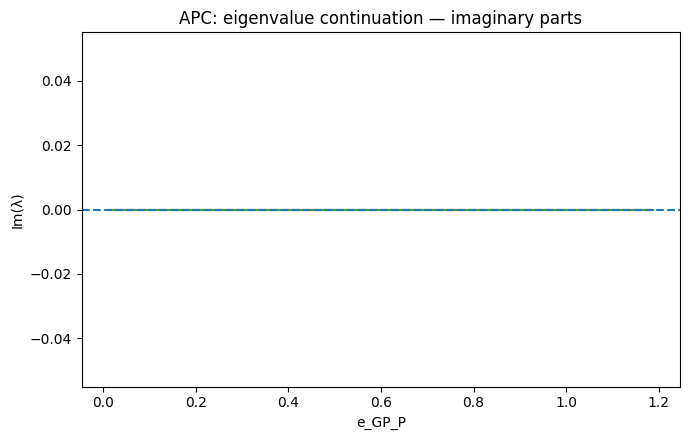

Saved table: 19_APC_e_LP0_P_continuation.csv
Saved figure: 19_APC_e_LP0_P_continuation_real.[png/svg/pdf]


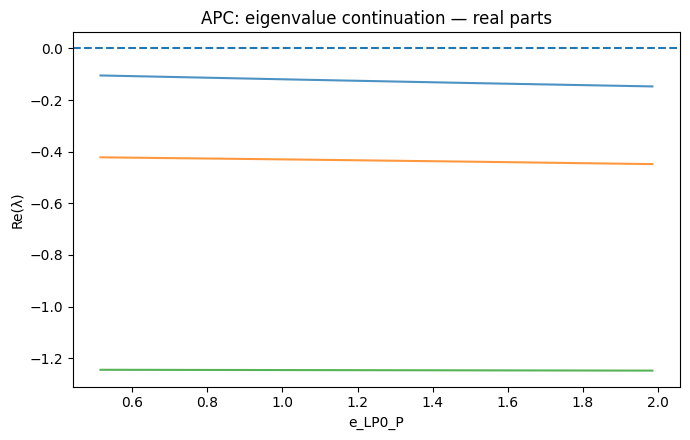

Saved figure: 20_APC_e_LP0_P_continuation_imag.[png/svg/pdf]


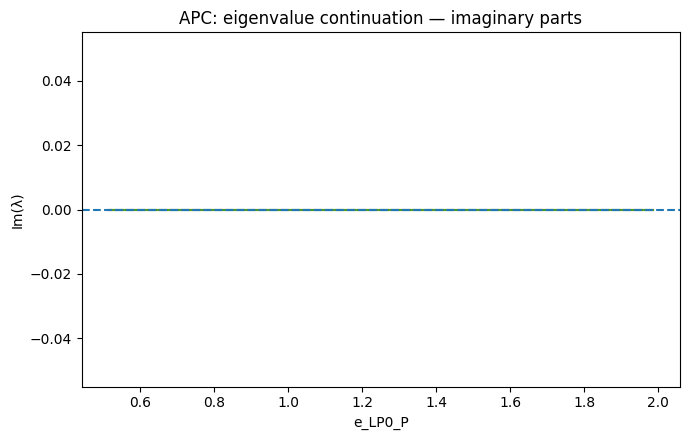

Saved table: 19_APC_rho_AP_continuation.csv
Saved figure: 19_APC_rho_AP_continuation_real.[png/svg/pdf]


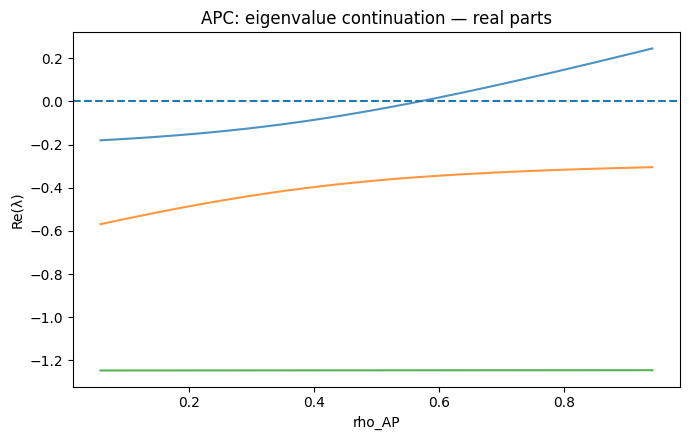

Saved figure: 20_APC_rho_AP_continuation_imag.[png/svg/pdf]


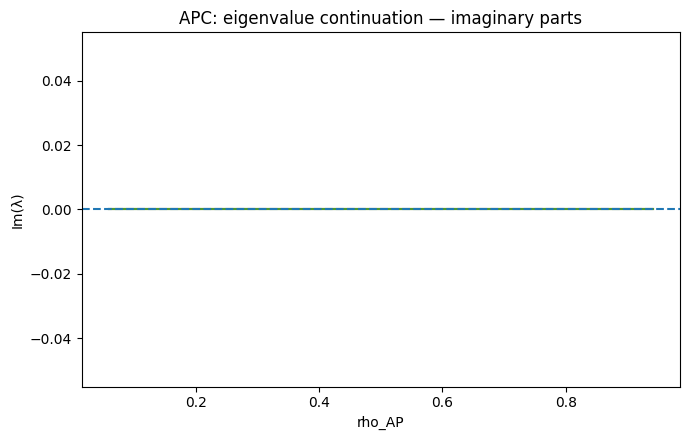

Saved table: 19_APC_rho_PA_continuation.csv
Saved figure: 19_APC_rho_PA_continuation_real.[png/svg/pdf]


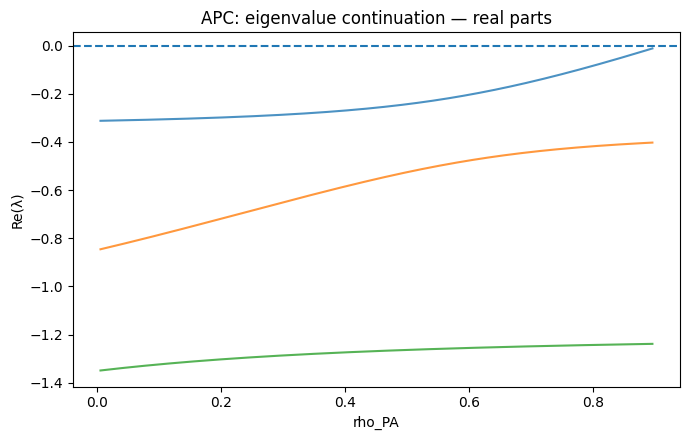

Saved figure: 20_APC_rho_PA_continuation_imag.[png/svg/pdf]


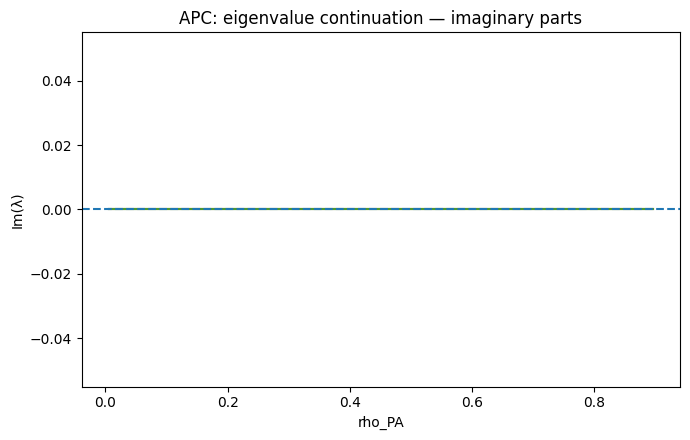

Saved table: 19_APC_rho_PC_continuation.csv
Saved figure: 19_APC_rho_PC_continuation_real.[png/svg/pdf]


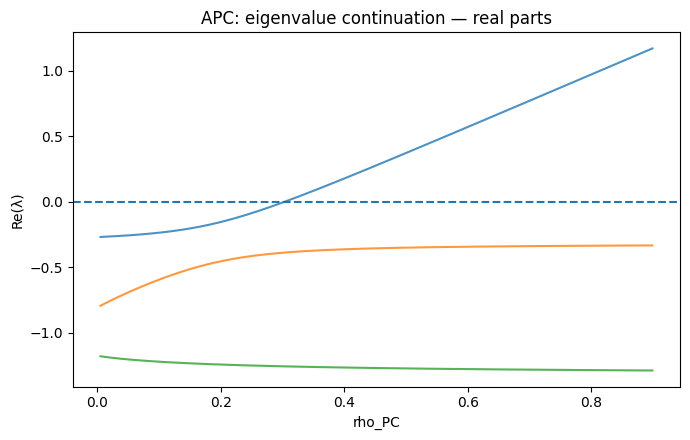

Saved figure: 20_APC_rho_PC_continuation_imag.[png/svg/pdf]


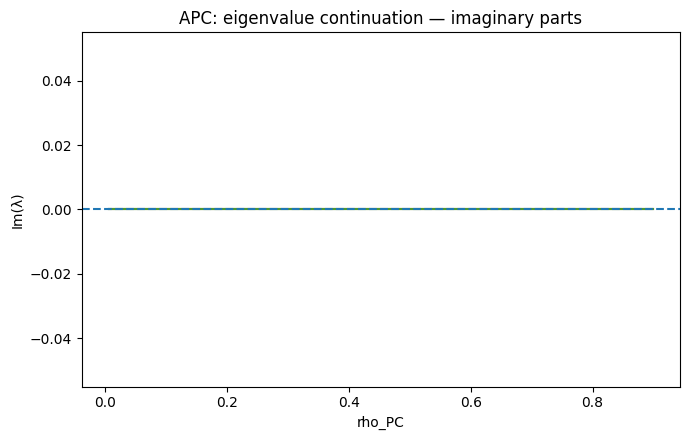

Saved table: 19_APC_rho_CP_continuation.csv
Saved figure: 19_APC_rho_CP_continuation_real.[png/svg/pdf]


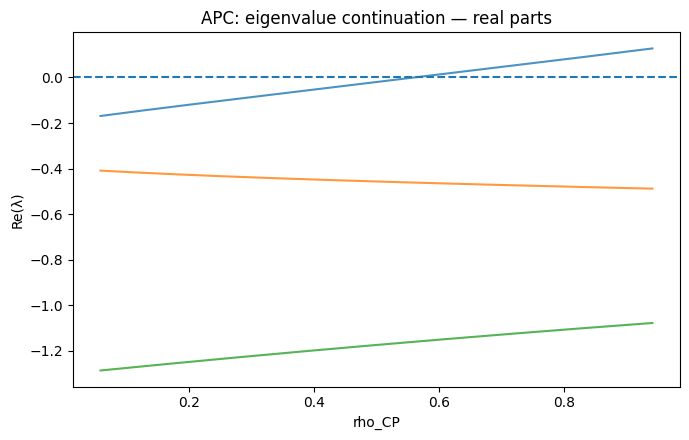

Saved figure: 20_APC_rho_CP_continuation_imag.[png/svg/pdf]


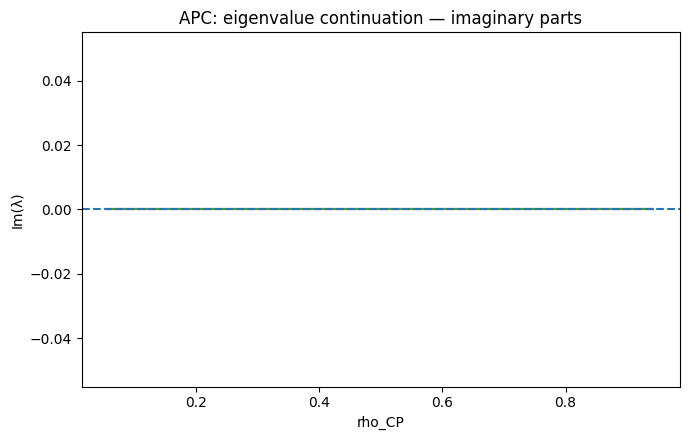

Saved table: 19_APC_e_LAP_A_continuation.csv
Saved figure: 19_APC_e_LAP_A_continuation_real.[png/svg/pdf]


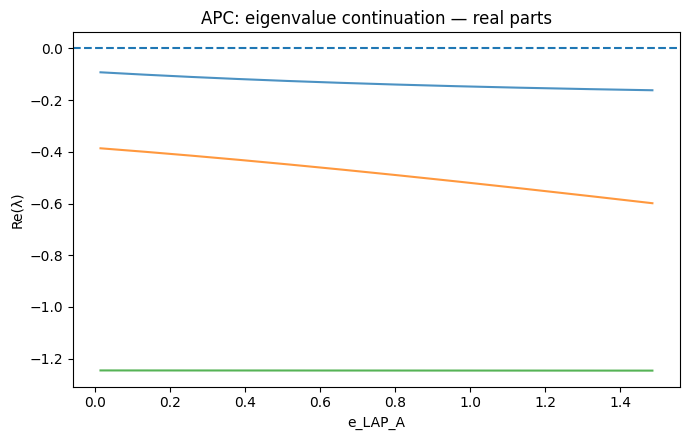

Saved figure: 20_APC_e_LAP_A_continuation_imag.[png/svg/pdf]


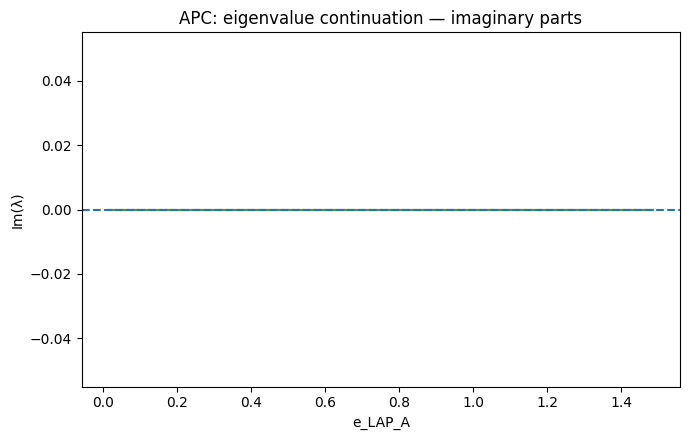

Saved table: 19_APC_e_LPA_P_continuation.csv
Saved figure: 19_APC_e_LPA_P_continuation_real.[png/svg/pdf]


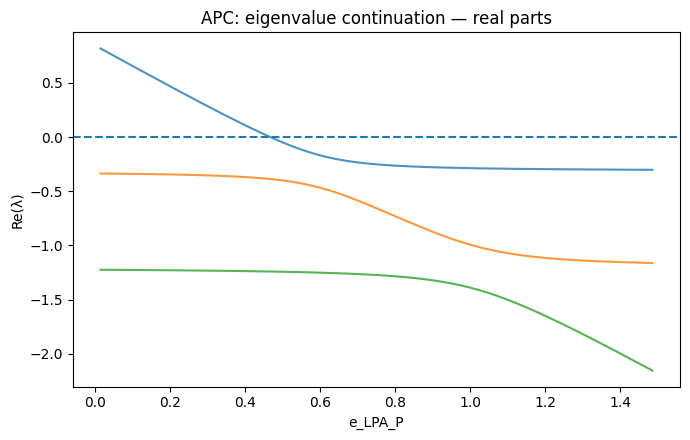

Saved figure: 20_APC_e_LPA_P_continuation_imag.[png/svg/pdf]


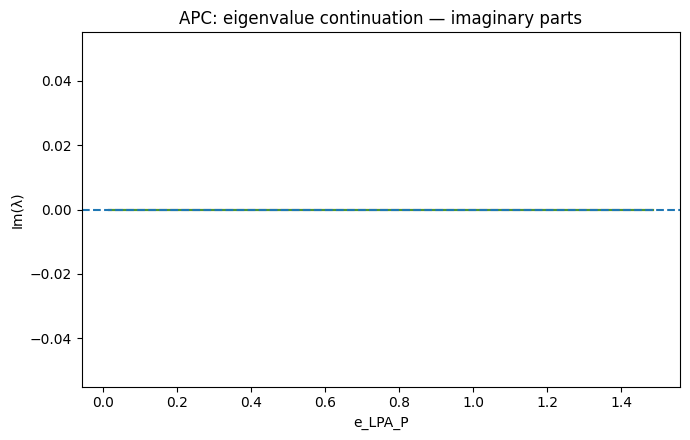

Saved table: 19_APC_e_LPC_P_continuation.csv
Saved figure: 19_APC_e_LPC_P_continuation_real.[png/svg/pdf]


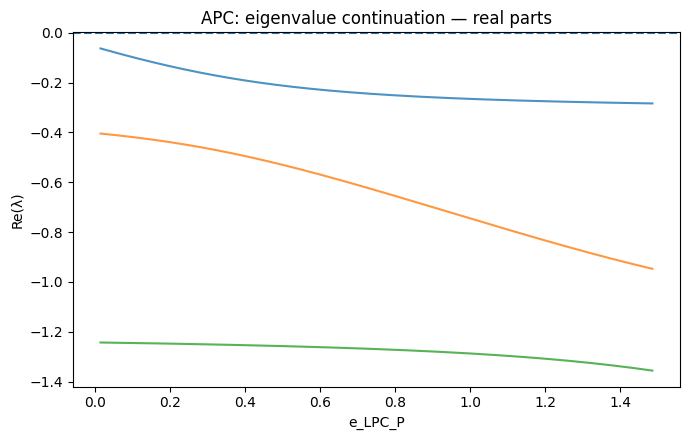

Saved figure: 20_APC_e_LPC_P_continuation_imag.[png/svg/pdf]


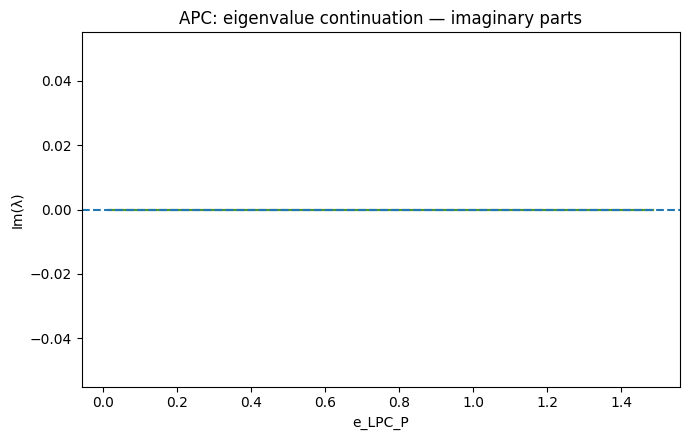

Saved table: 19_APC_e_LCP_C_continuation.csv
Saved figure: 19_APC_e_LCP_C_continuation_real.[png/svg/pdf]


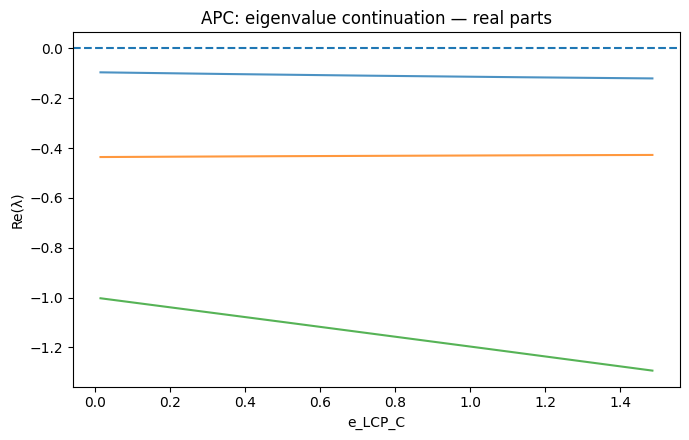

Saved figure: 20_APC_e_LCP_C_continuation_imag.[png/svg/pdf]


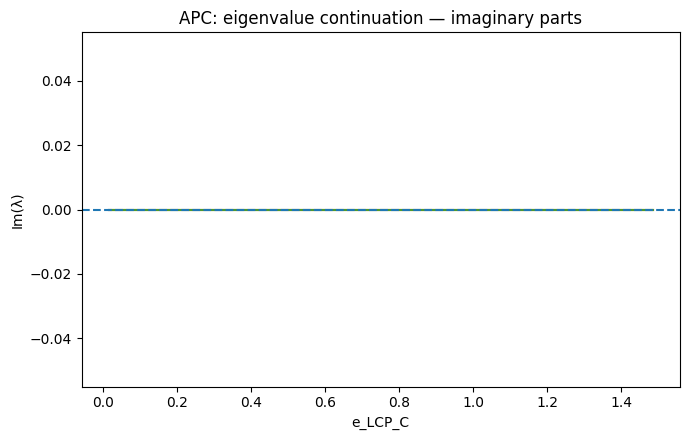

Saved table: 19_APC_e_LAP_P_continuation.csv
Saved figure: 19_APC_e_LAP_P_continuation_real.[png/svg/pdf]


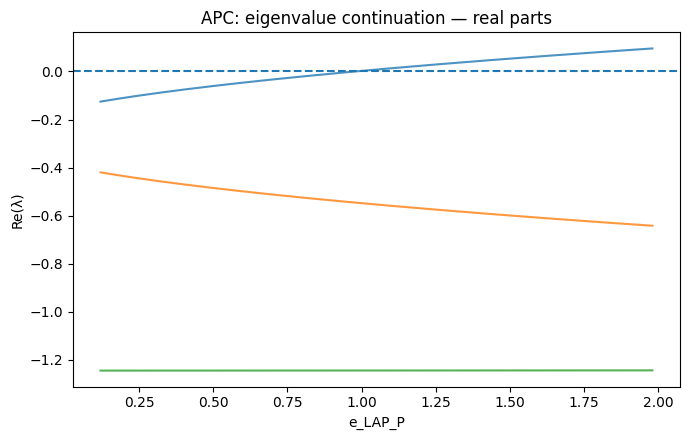

Saved figure: 20_APC_e_LAP_P_continuation_imag.[png/svg/pdf]


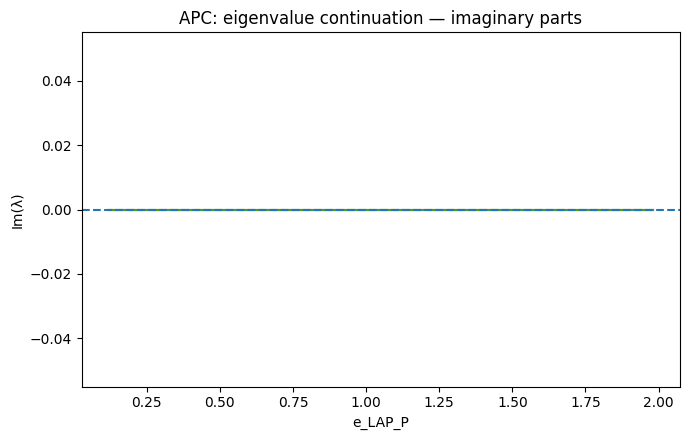

Saved table: 19_APC_e_LPA_A_continuation.csv
Saved figure: 19_APC_e_LPA_A_continuation_real.[png/svg/pdf]


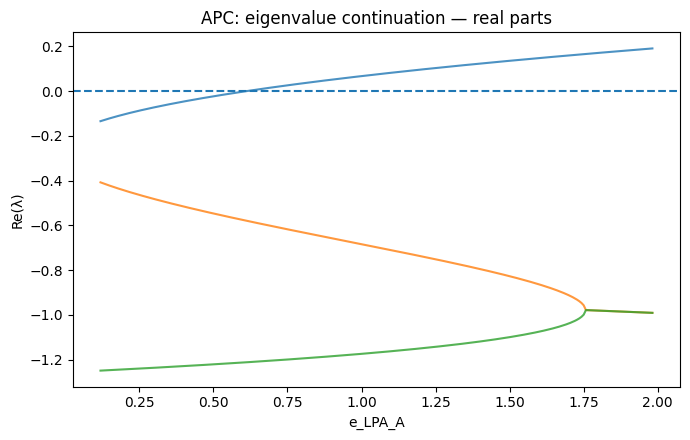

Saved figure: 20_APC_e_LPA_A_continuation_imag.[png/svg/pdf]


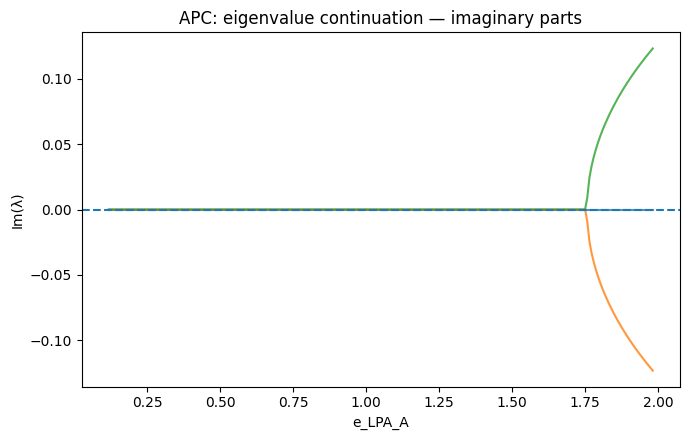

Saved table: 19_APC_e_LPC_C_continuation.csv
Saved figure: 19_APC_e_LPC_C_continuation_real.[png/svg/pdf]


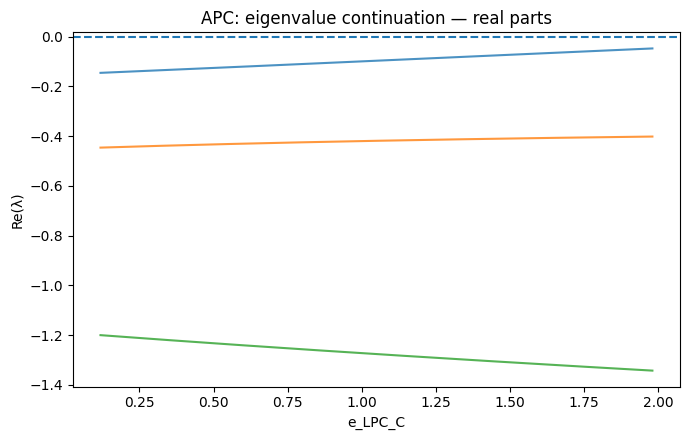

Saved figure: 20_APC_e_LPC_C_continuation_imag.[png/svg/pdf]


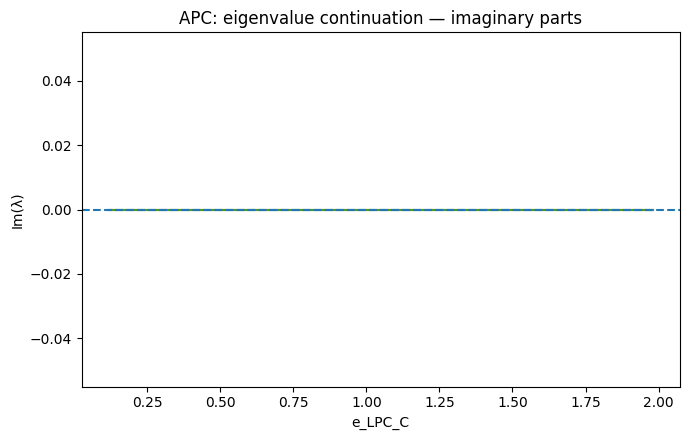

Saved table: 19_APC_e_LCP_P_continuation.csv
Saved figure: 19_APC_e_LCP_P_continuation_real.[png/svg/pdf]


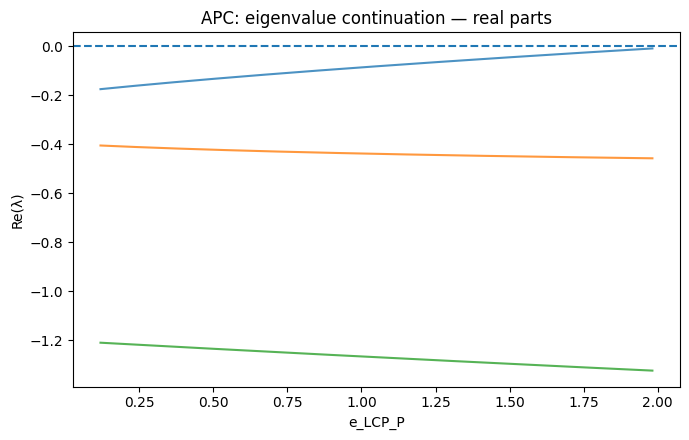

Saved figure: 20_APC_e_LCP_P_continuation_imag.[png/svg/pdf]


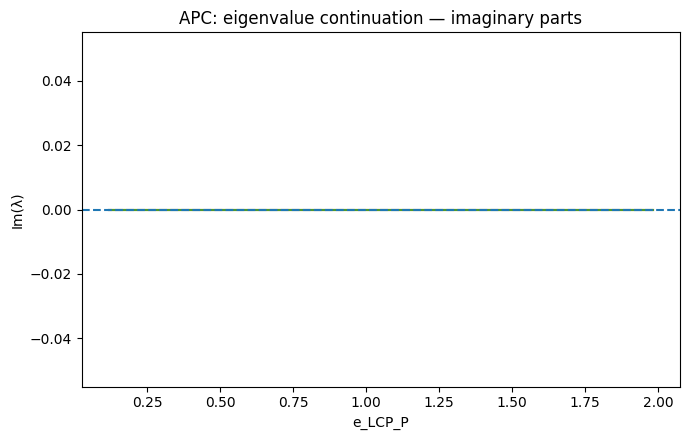

Saved table: 19_APC_e_GA_C_continuation.csv
Saved figure: 19_APC_e_GA_C_continuation_real.[png/svg/pdf]


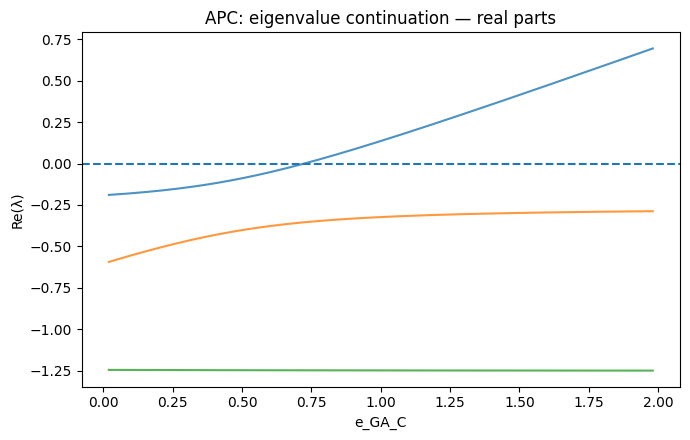

Saved figure: 20_APC_e_GA_C_continuation_imag.[png/svg/pdf]


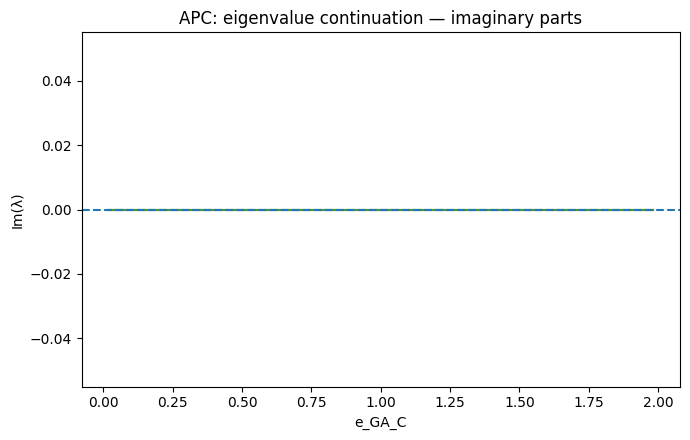

Saved table: 19_APC_e_GC_A_continuation.csv
Saved figure: 19_APC_e_GC_A_continuation_real.[png/svg/pdf]


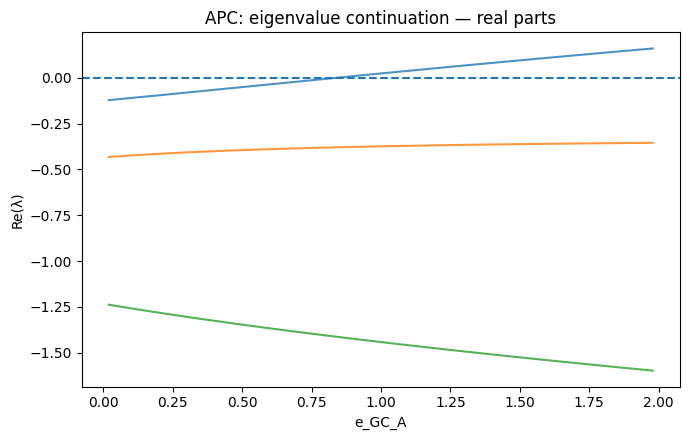

Saved figure: 20_APC_e_GC_A_continuation_imag.[png/svg/pdf]


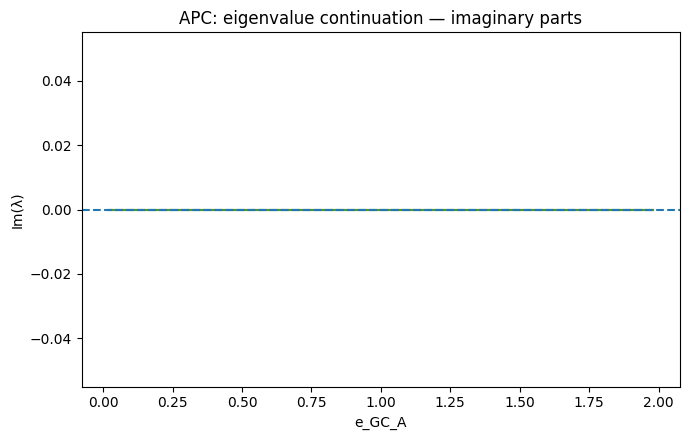

Saved table: 19_APC_e_GC_C_continuation.csv
Saved figure: 19_APC_e_GC_C_continuation_real.[png/svg/pdf]


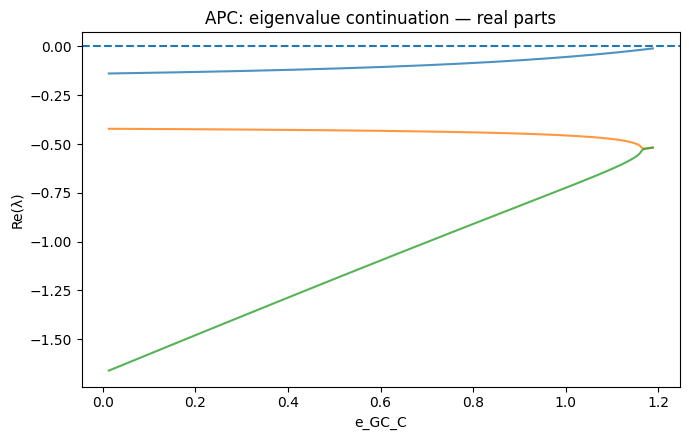

Saved figure: 20_APC_e_GC_C_continuation_imag.[png/svg/pdf]


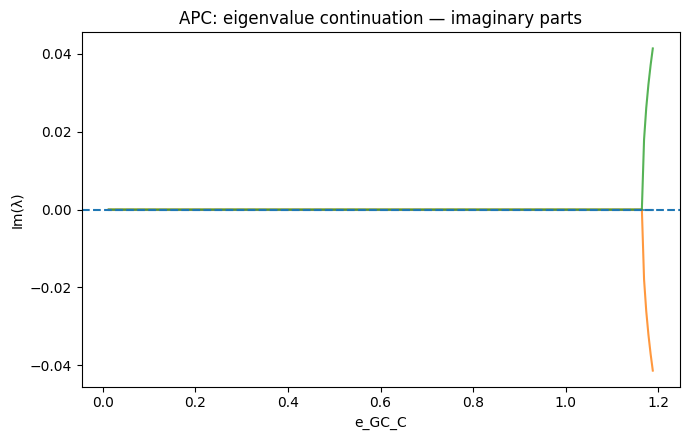

Saved table: 19_APC_e_LC0_C_continuation.csv
Saved figure: 19_APC_e_LC0_C_continuation_real.[png/svg/pdf]


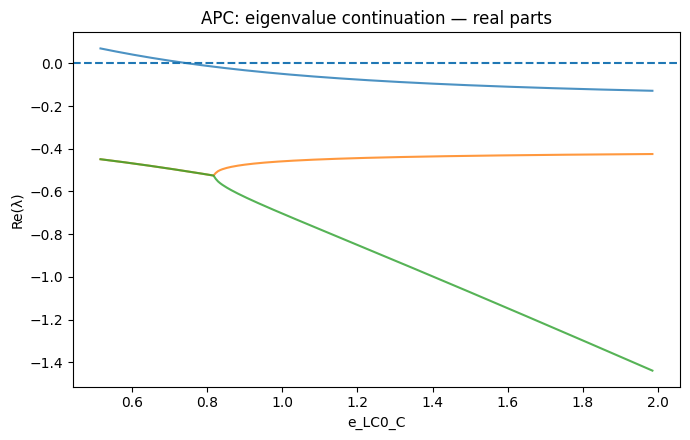

Saved figure: 20_APC_e_LC0_C_continuation_imag.[png/svg/pdf]


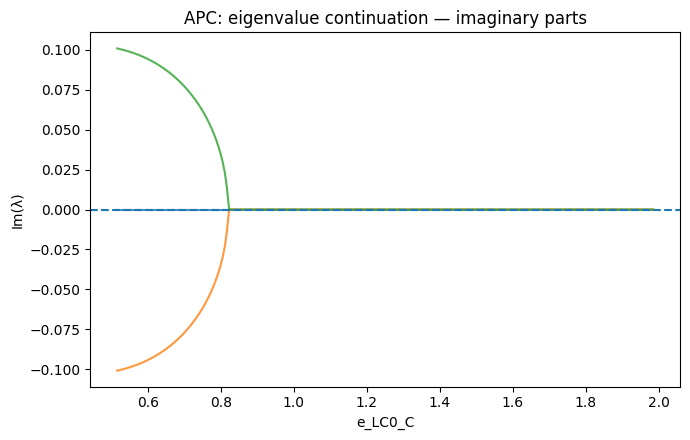

Saved table: 19_APH_alpha_A_continuation.csv
Saved figure: 19_APH_alpha_A_continuation_real.[png/svg/pdf]


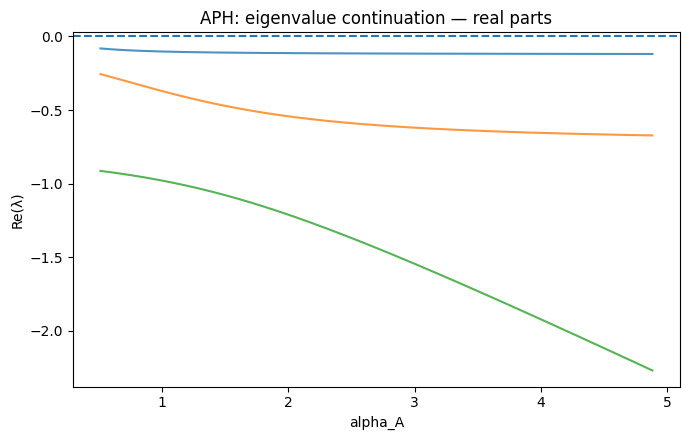

Saved figure: 20_APH_alpha_A_continuation_imag.[png/svg/pdf]


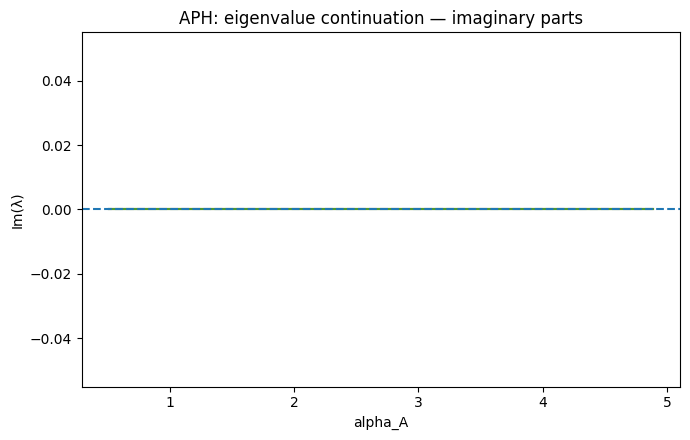

Saved table: 19_APH_alpha_P_continuation.csv
Saved figure: 19_APH_alpha_P_continuation_real.[png/svg/pdf]


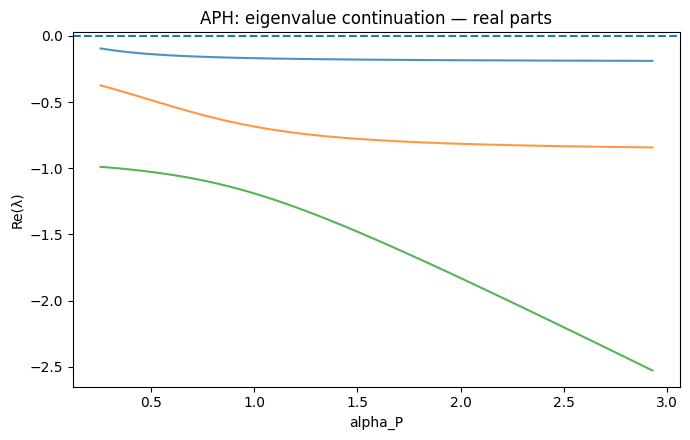

Saved figure: 20_APH_alpha_P_continuation_imag.[png/svg/pdf]


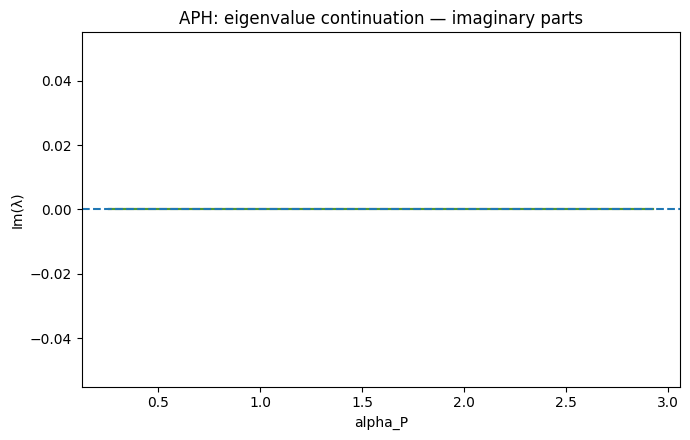

Saved table: 19_APH_alpha_H_continuation.csv
Saved figure: 19_APH_alpha_H_continuation_real.[png/svg/pdf]


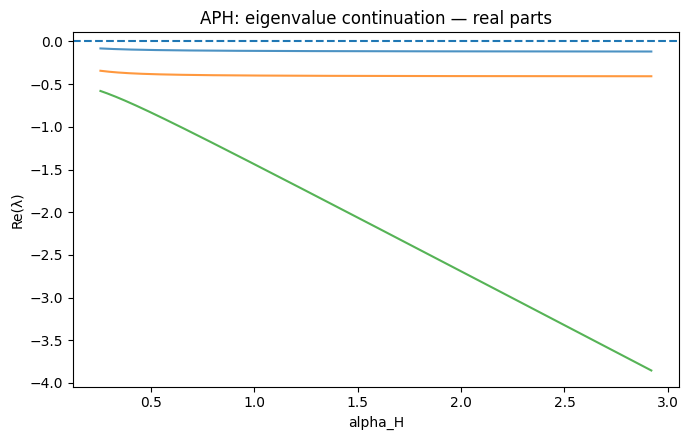

Saved figure: 20_APH_alpha_H_continuation_imag.[png/svg/pdf]


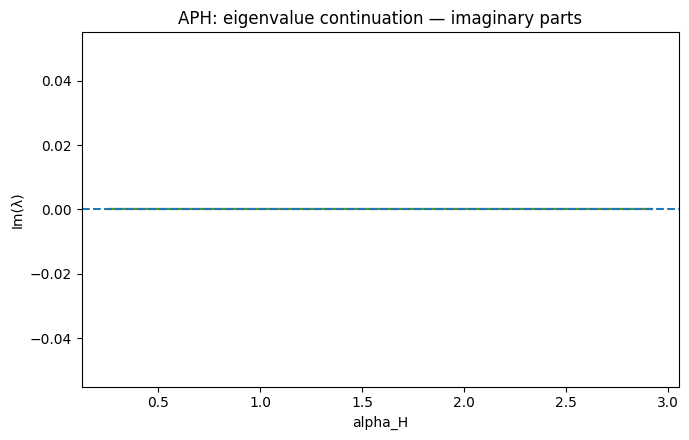

Saved table: 19_APH_e_GA_A_continuation.csv
Saved figure: 19_APH_e_GA_A_continuation_real.[png/svg/pdf]


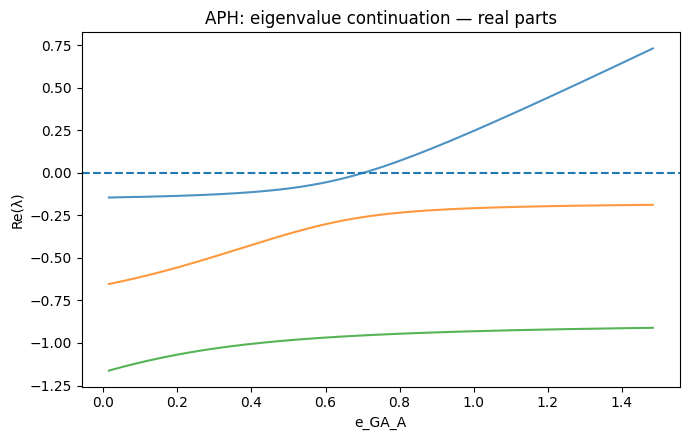

Saved figure: 20_APH_e_GA_A_continuation_imag.[png/svg/pdf]


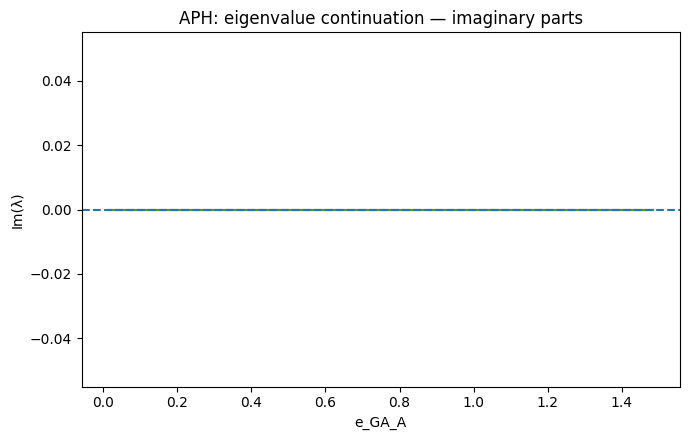

Saved table: 19_APH_e_LA0_A_continuation.csv
Saved figure: 19_APH_e_LA0_A_continuation_real.[png/svg/pdf]


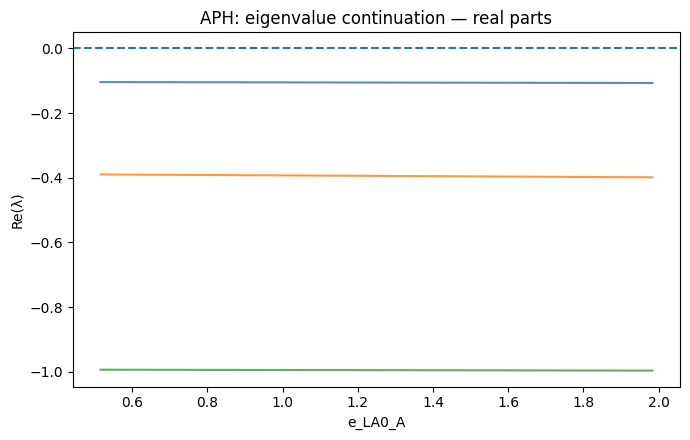

Saved figure: 20_APH_e_LA0_A_continuation_imag.[png/svg/pdf]


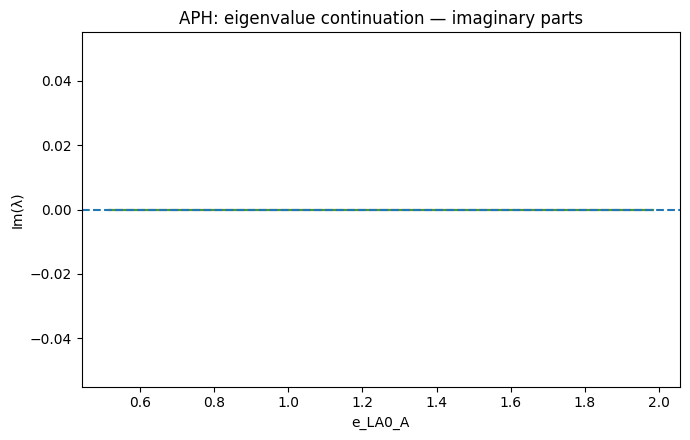

Saved table: 19_APH_e_GP_P_continuation.csv
Saved figure: 19_APH_e_GP_P_continuation_real.[png/svg/pdf]


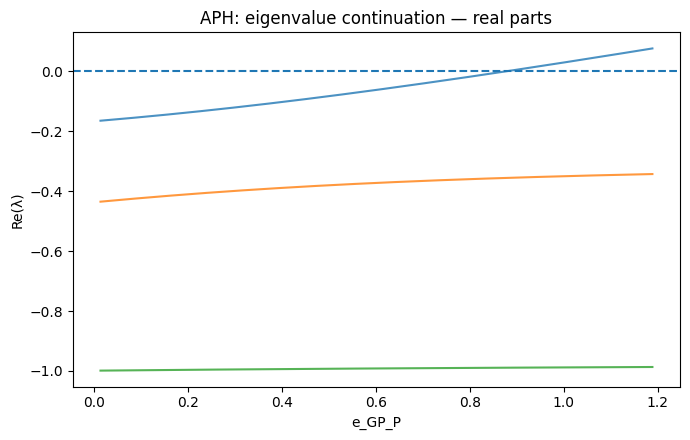

Saved figure: 20_APH_e_GP_P_continuation_imag.[png/svg/pdf]


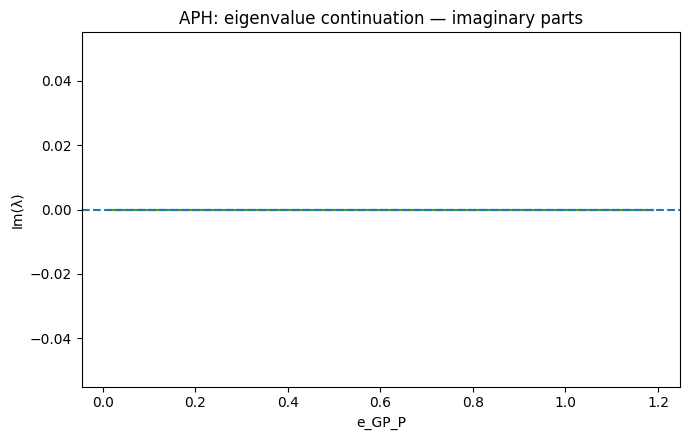

Saved table: 19_APH_e_LP0_P_continuation.csv
Saved figure: 19_APH_e_LP0_P_continuation_real.[png/svg/pdf]


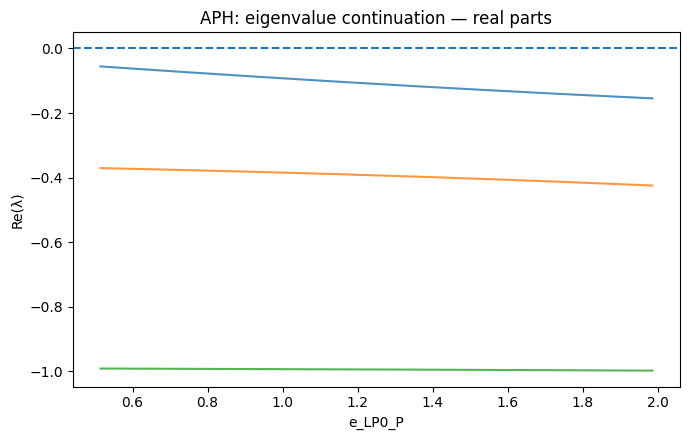

Saved figure: 20_APH_e_LP0_P_continuation_imag.[png/svg/pdf]


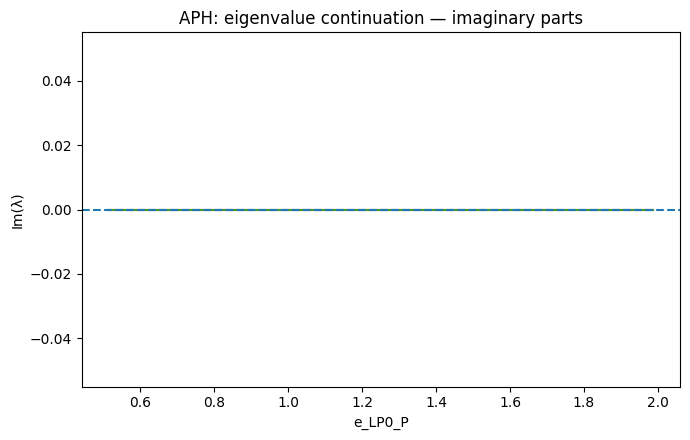

Saved table: 19_APH_rho_AP_continuation.csv
Saved figure: 19_APH_rho_AP_continuation_real.[png/svg/pdf]


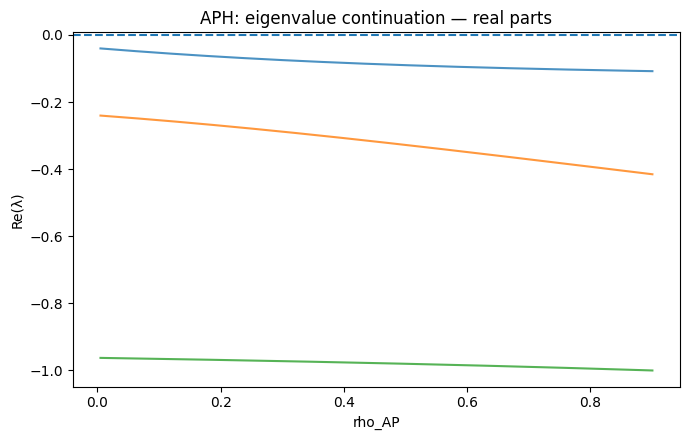

Saved figure: 20_APH_rho_AP_continuation_imag.[png/svg/pdf]


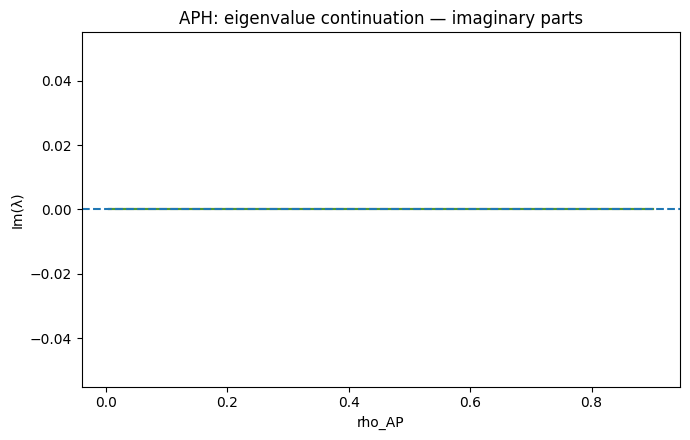

Saved table: 19_APH_rho_AH_continuation.csv
Saved figure: 19_APH_rho_AH_continuation_real.[png/svg/pdf]


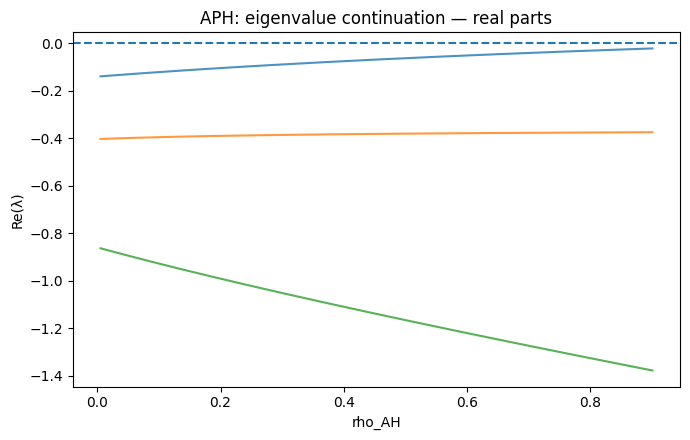

Saved figure: 20_APH_rho_AH_continuation_imag.[png/svg/pdf]


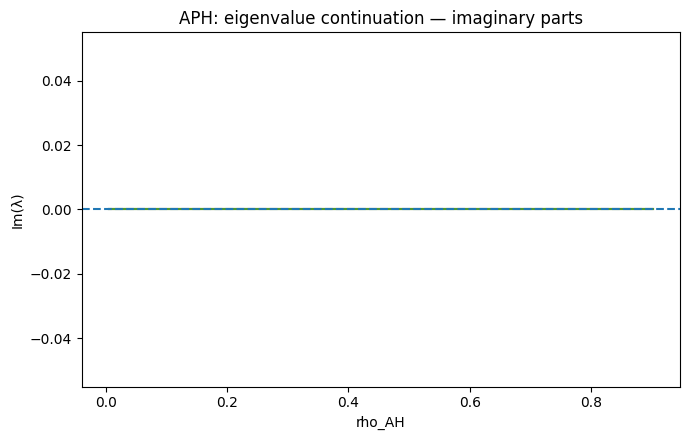

Saved table: 19_APH_rho_PA_continuation.csv
Saved figure: 19_APH_rho_PA_continuation_real.[png/svg/pdf]


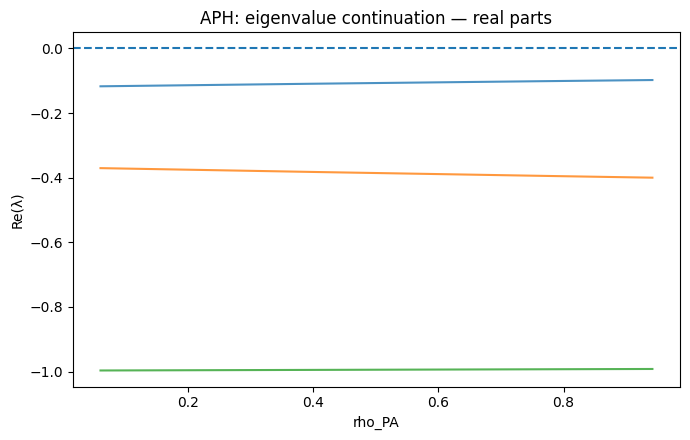

Saved figure: 20_APH_rho_PA_continuation_imag.[png/svg/pdf]


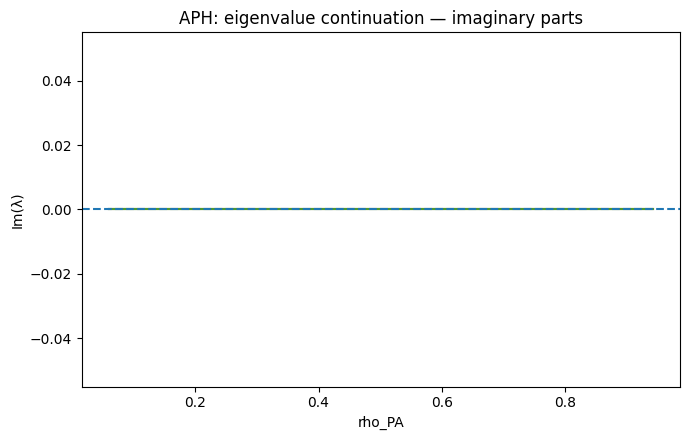

Saved table: 19_APH_rho_HA_continuation.csv
Saved figure: 19_APH_rho_HA_continuation_real.[png/svg/pdf]


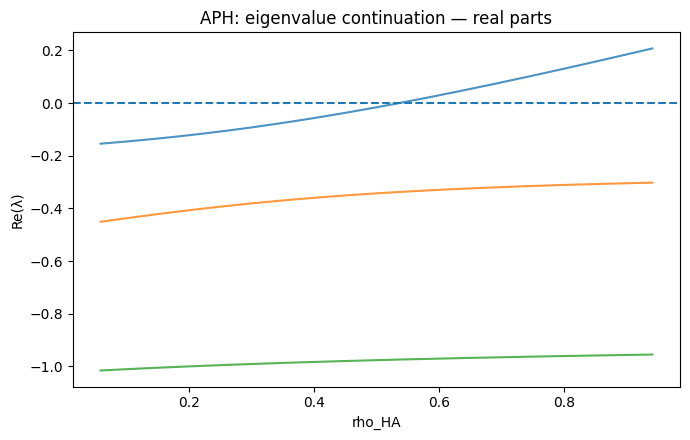

Saved figure: 20_APH_rho_HA_continuation_imag.[png/svg/pdf]


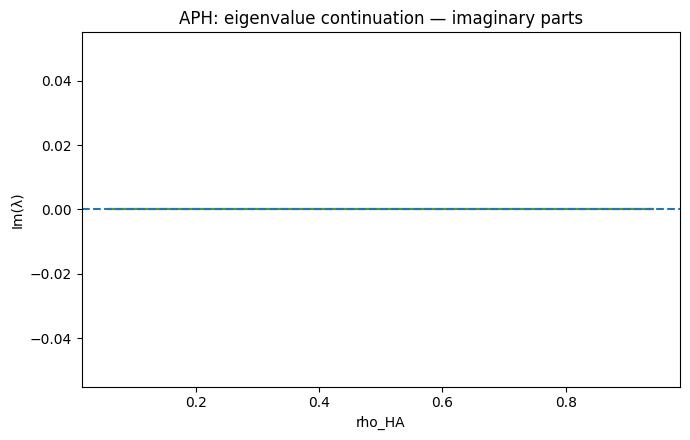

Saved table: 19_APH_e_LAP_A_continuation.csv
Saved figure: 19_APH_e_LAP_A_continuation_real.[png/svg/pdf]


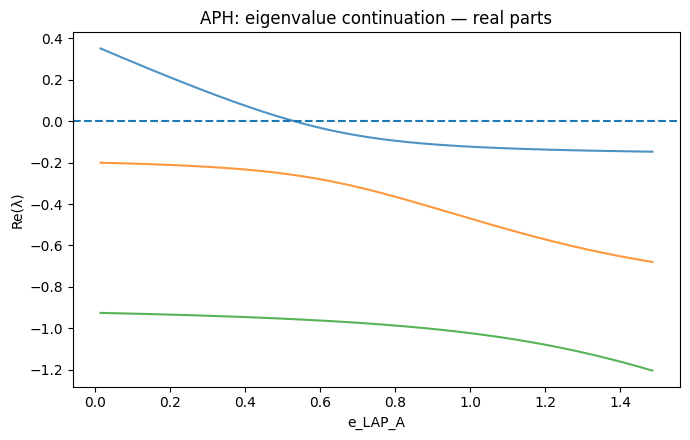

Saved figure: 20_APH_e_LAP_A_continuation_imag.[png/svg/pdf]


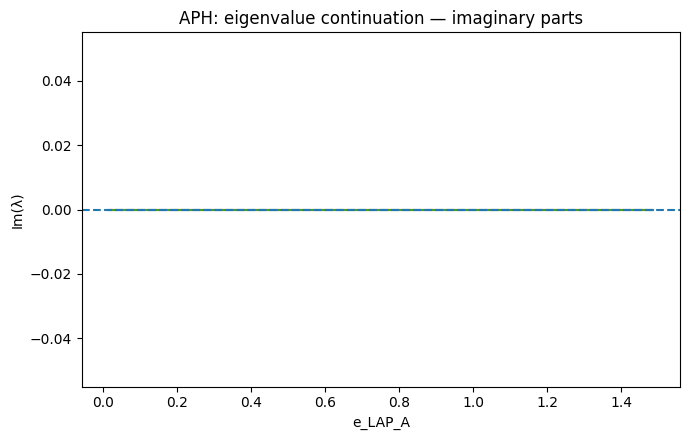

Saved table: 19_APH_e_LAH_A_continuation.csv
Saved figure: 19_APH_e_LAH_A_continuation_real.[png/svg/pdf]


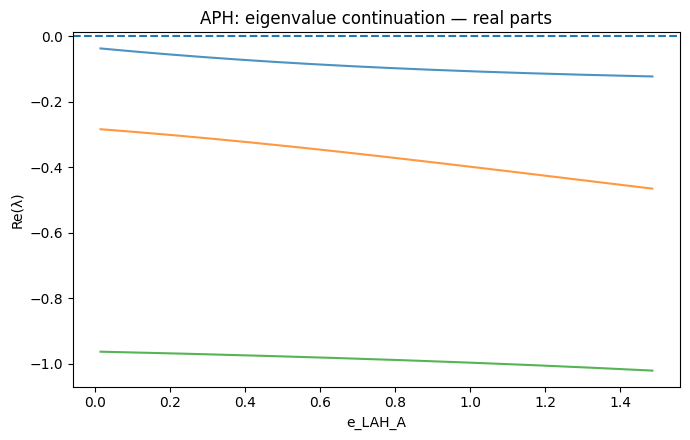

Saved figure: 20_APH_e_LAH_A_continuation_imag.[png/svg/pdf]


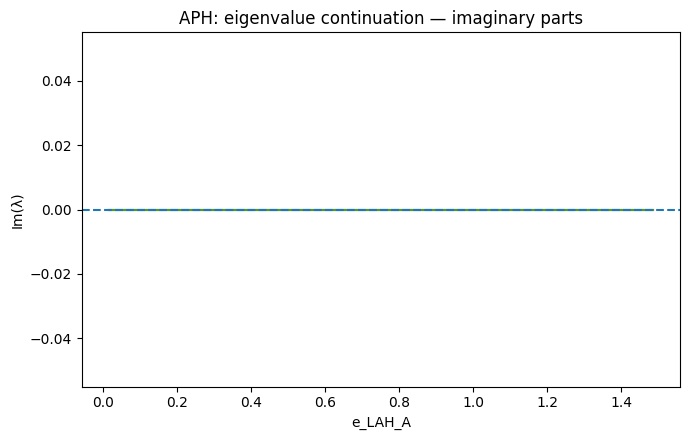

Saved table: 19_APH_e_LPA_P_continuation.csv
Saved figure: 19_APH_e_LPA_P_continuation_real.[png/svg/pdf]


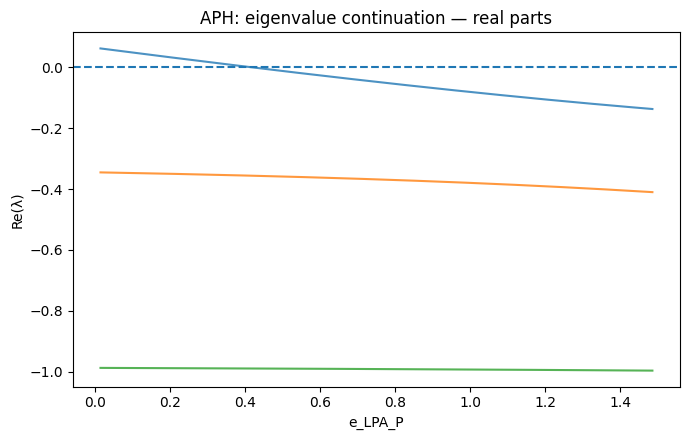

Saved figure: 20_APH_e_LPA_P_continuation_imag.[png/svg/pdf]


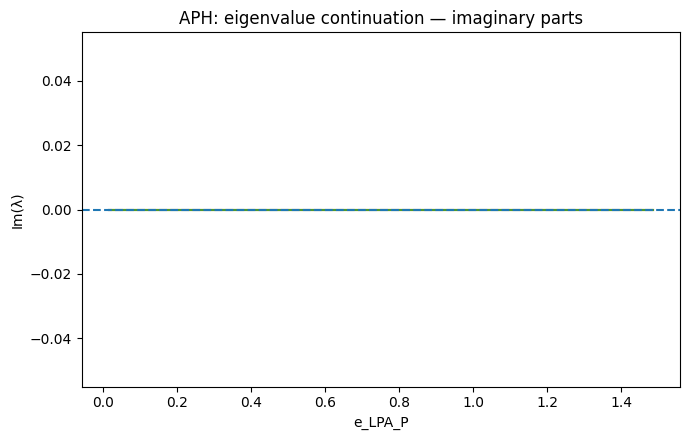

Saved table: 19_APH_e_LHA_H_continuation.csv
Saved figure: 19_APH_e_LHA_H_continuation_real.[png/svg/pdf]


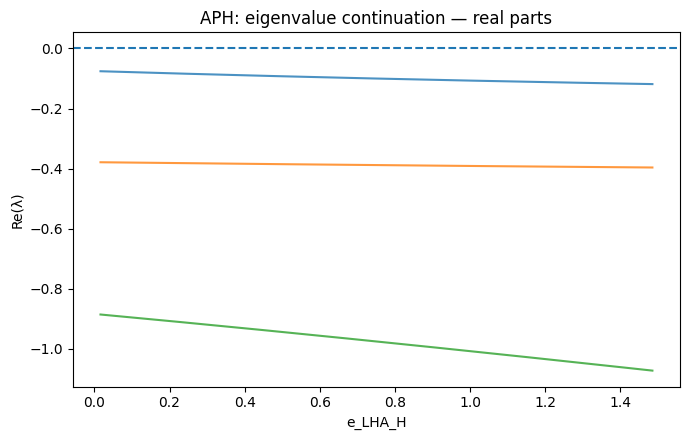

Saved figure: 20_APH_e_LHA_H_continuation_imag.[png/svg/pdf]


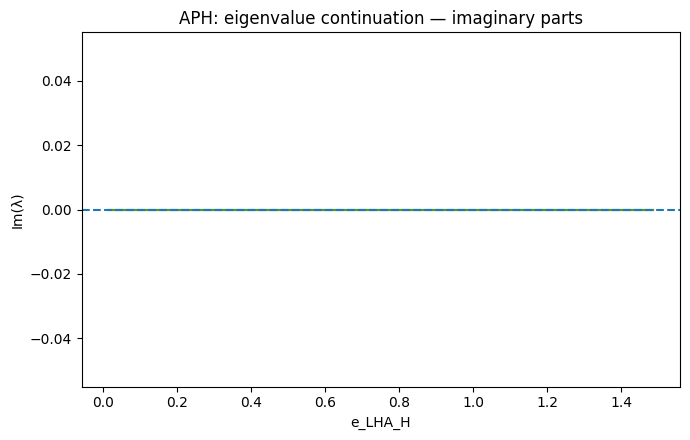

Saved table: 19_APH_e_LAP_P_continuation.csv
Saved figure: 19_APH_e_LAP_P_continuation_real.[png/svg/pdf]


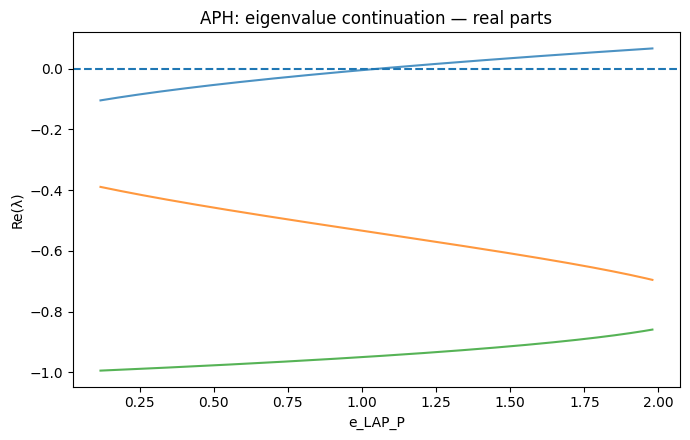

Saved figure: 20_APH_e_LAP_P_continuation_imag.[png/svg/pdf]


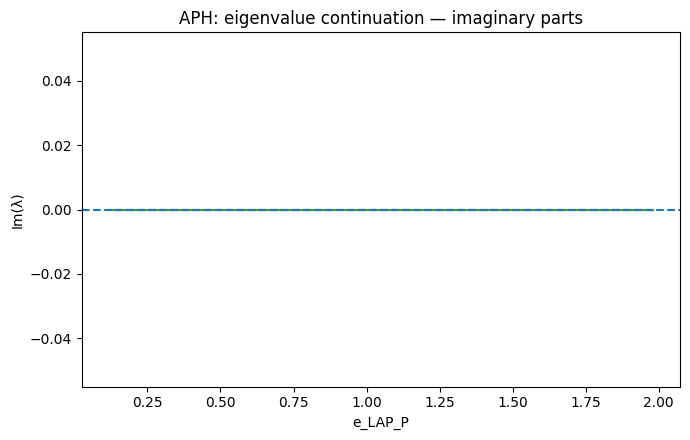

Saved table: 19_APH_e_LAH_H_continuation.csv
Saved figure: 19_APH_e_LAH_H_continuation_real.[png/svg/pdf]


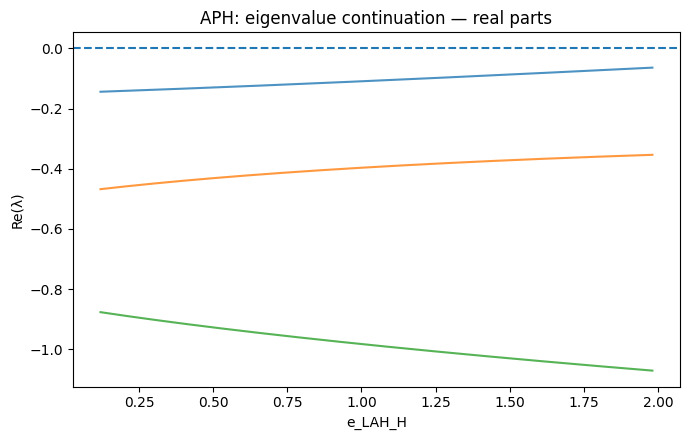

Saved figure: 20_APH_e_LAH_H_continuation_imag.[png/svg/pdf]


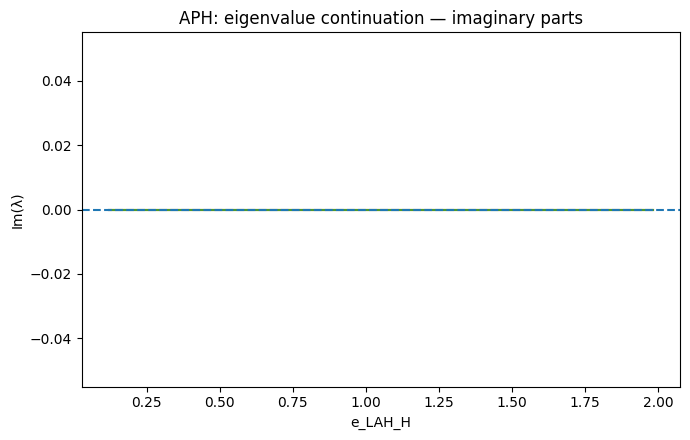

Saved table: 19_APH_e_LPA_A_continuation.csv
Saved figure: 19_APH_e_LPA_A_continuation_real.[png/svg/pdf]


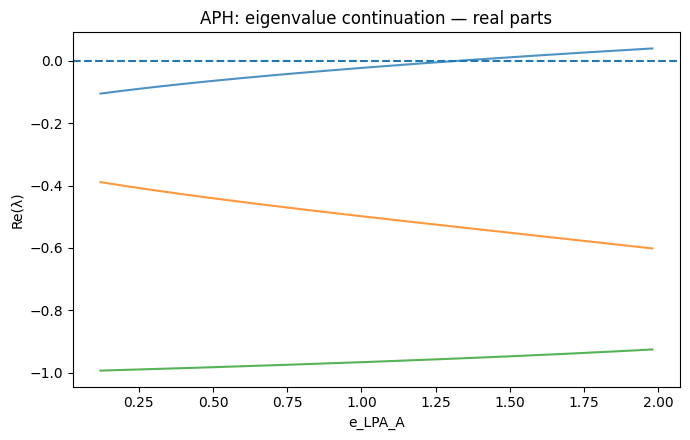

Saved figure: 20_APH_e_LPA_A_continuation_imag.[png/svg/pdf]


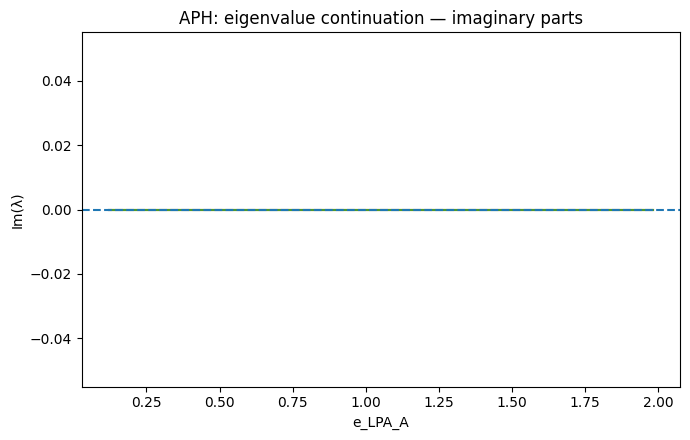

Saved table: 19_APH_e_LHA_A_continuation.csv
Saved figure: 19_APH_e_LHA_A_continuation_real.[png/svg/pdf]


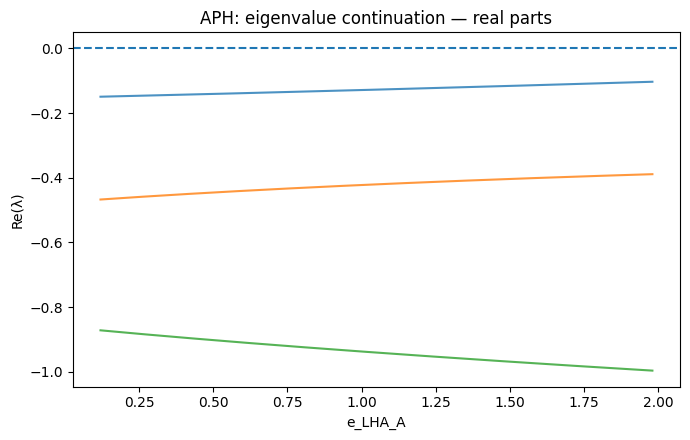

Saved figure: 20_APH_e_LHA_A_continuation_imag.[png/svg/pdf]


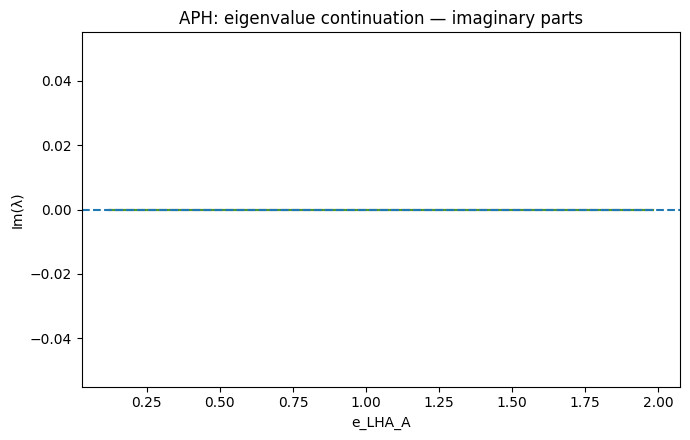

Saved table: 19_APH_e_GP_H_continuation.csv
Saved figure: 19_APH_e_GP_H_continuation_real.[png/svg/pdf]


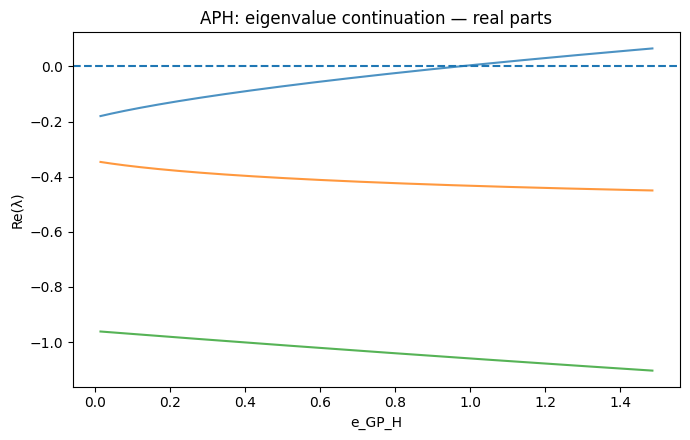

Saved figure: 20_APH_e_GP_H_continuation_imag.[png/svg/pdf]


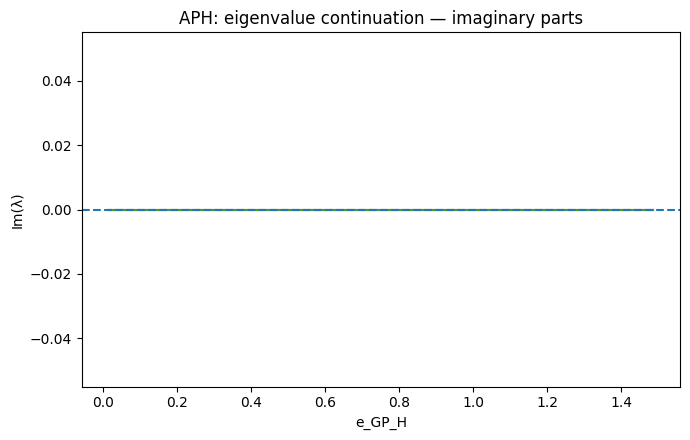

Saved table: 19_APH_e_GH_P_continuation.csv
Saved figure: 19_APH_e_GH_P_continuation_real.[png/svg/pdf]


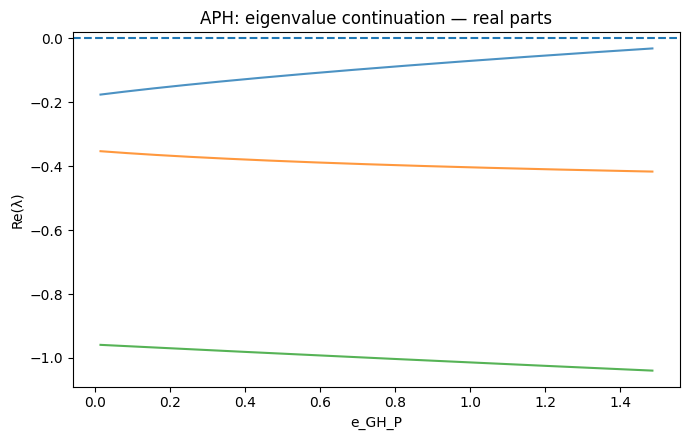

Saved figure: 20_APH_e_GH_P_continuation_imag.[png/svg/pdf]


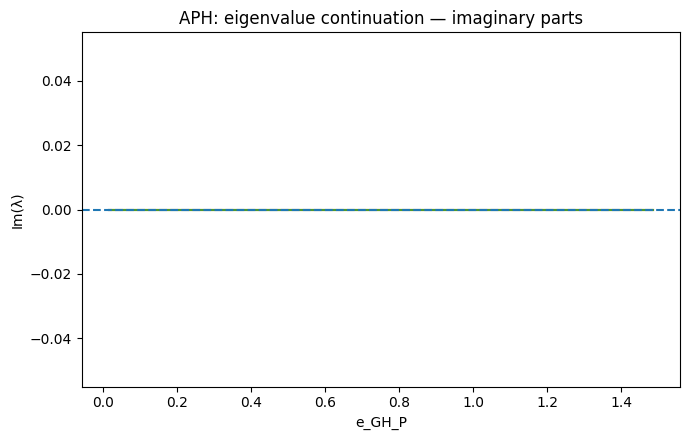

Saved table: 19_APH_e_GH_H_continuation.csv
Saved figure: 19_APH_e_GH_H_continuation_real.[png/svg/pdf]


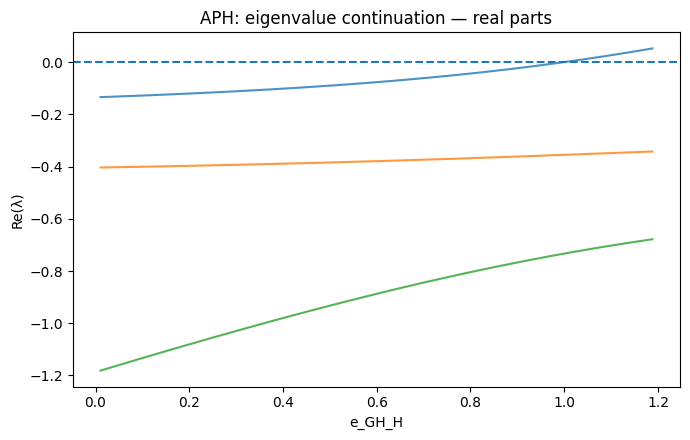

Saved figure: 20_APH_e_GH_H_continuation_imag.[png/svg/pdf]


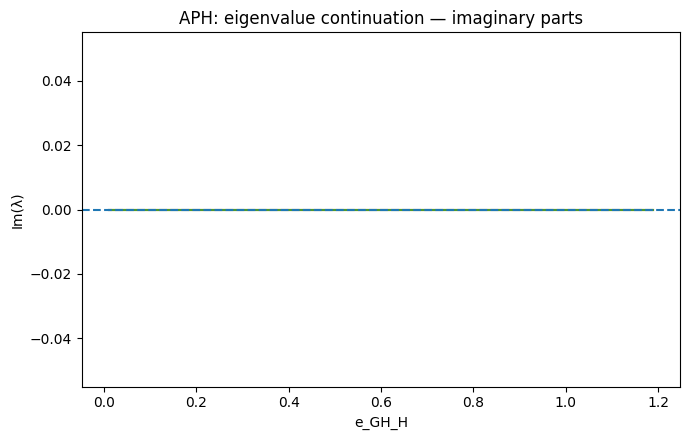

Saved table: 19_APH_e_LH0_H_continuation.csv
Saved figure: 19_APH_e_LH0_H_continuation_real.[png/svg/pdf]


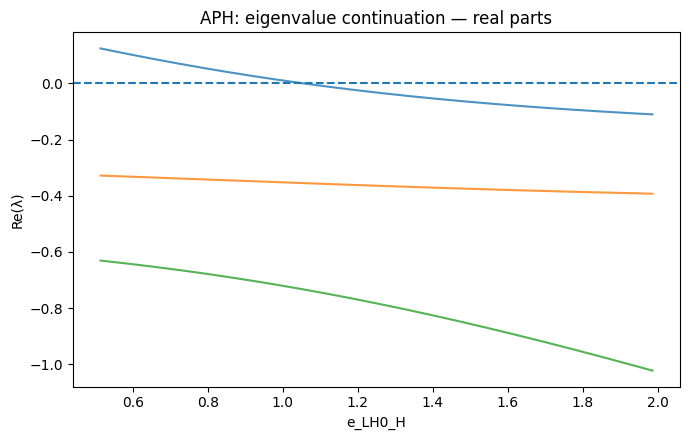

Saved figure: 20_APH_e_LH0_H_continuation_imag.[png/svg/pdf]


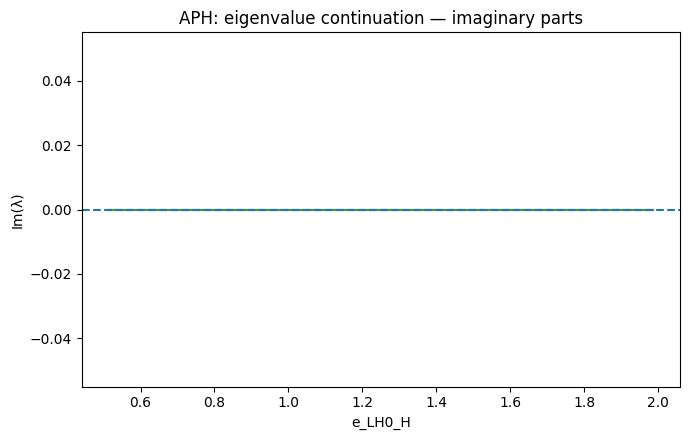

Saved table: 19_APHC_alpha_A_continuation.csv
Saved figure: 19_APHC_alpha_A_continuation_real.[png/svg/pdf]


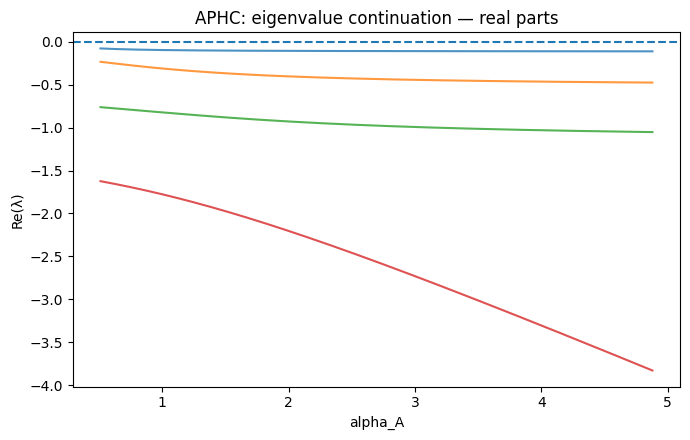

Saved figure: 20_APHC_alpha_A_continuation_imag.[png/svg/pdf]


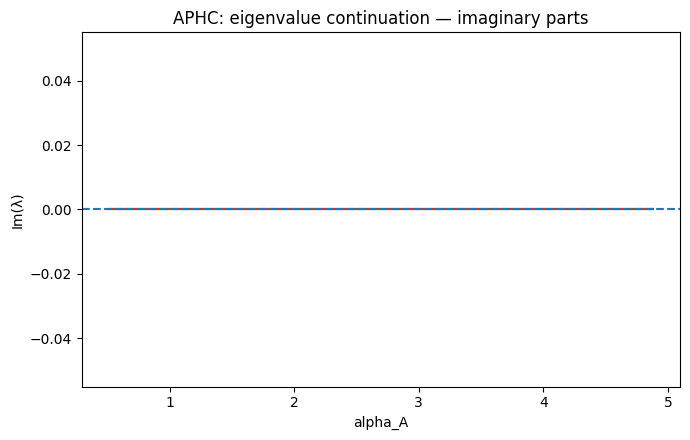

Saved table: 19_APHC_alpha_P_continuation.csv
Saved figure: 19_APHC_alpha_P_continuation_real.[png/svg/pdf]


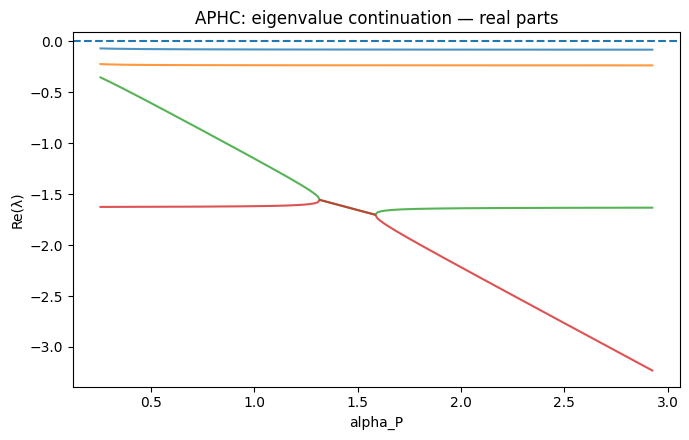

Saved figure: 20_APHC_alpha_P_continuation_imag.[png/svg/pdf]


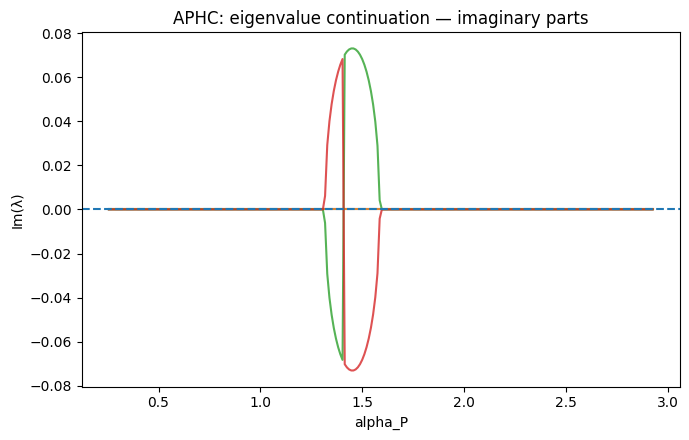

Saved table: 19_APHC_alpha_H_continuation.csv
Saved figure: 19_APHC_alpha_H_continuation_real.[png/svg/pdf]


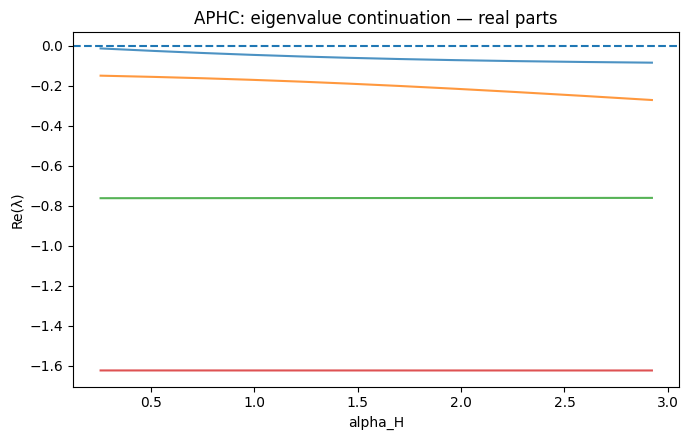

Saved figure: 20_APHC_alpha_H_continuation_imag.[png/svg/pdf]


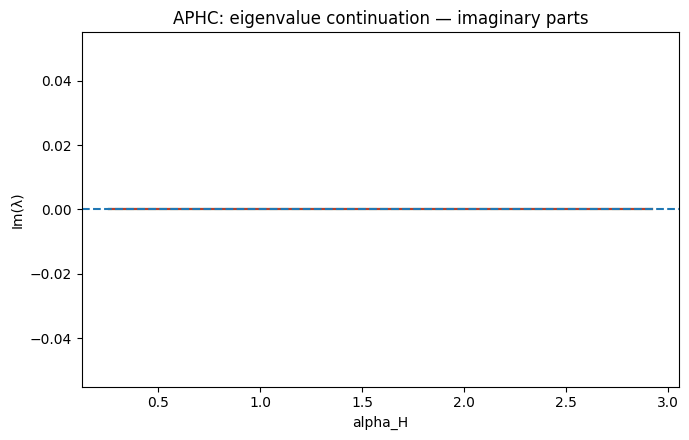

Saved table: 19_APHC_e_GA_A_continuation.csv
Saved figure: 19_APHC_e_GA_A_continuation_real.[png/svg/pdf]


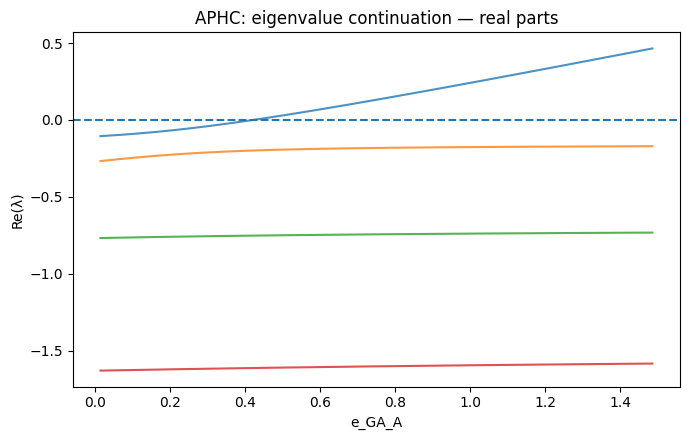

Saved figure: 20_APHC_e_GA_A_continuation_imag.[png/svg/pdf]


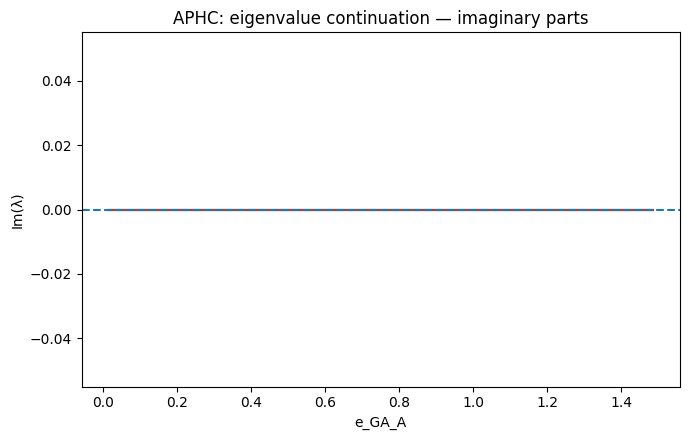

Saved table: 19_APHC_e_LA0_A_continuation.csv
Saved figure: 19_APHC_e_LA0_A_continuation_real.[png/svg/pdf]


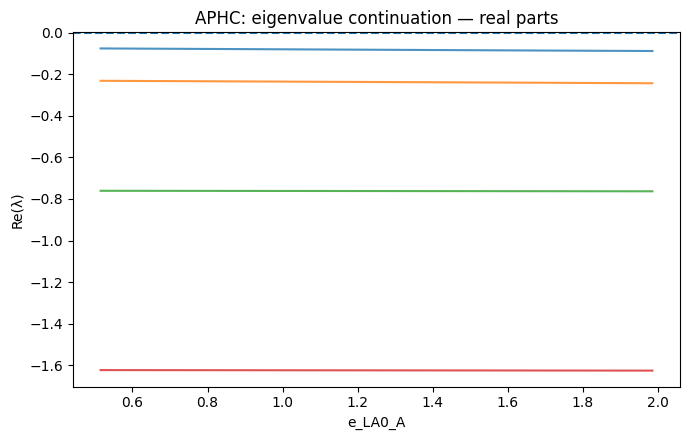

Saved figure: 20_APHC_e_LA0_A_continuation_imag.[png/svg/pdf]


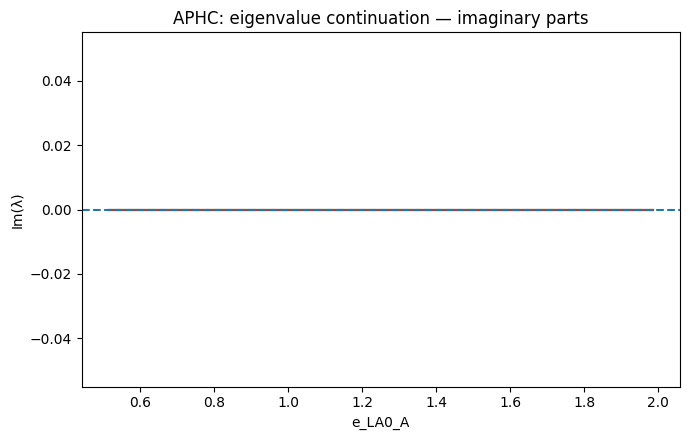

Saved table: 19_APHC_e_GP_P_continuation.csv
Saved figure: 19_APHC_e_GP_P_continuation_real.[png/svg/pdf]


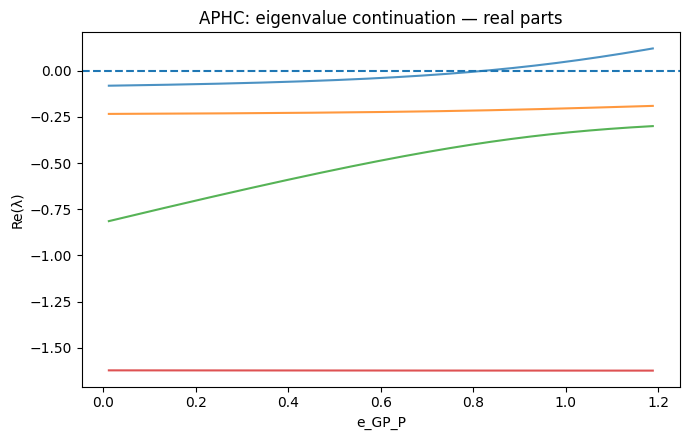

Saved figure: 20_APHC_e_GP_P_continuation_imag.[png/svg/pdf]


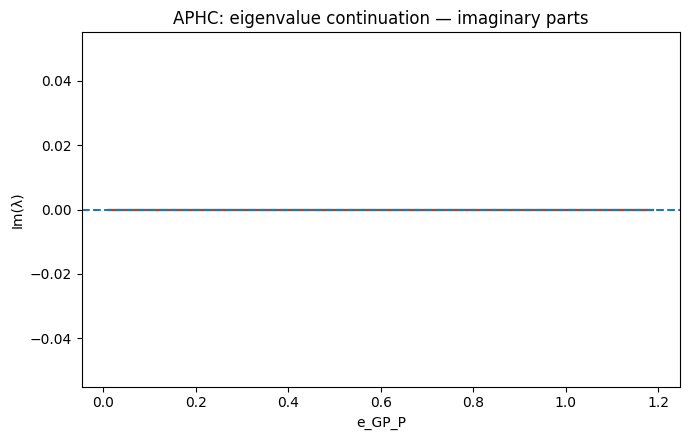

Saved table: 19_APHC_e_LP0_P_continuation.csv
Saved figure: 19_APHC_e_LP0_P_continuation_real.[png/svg/pdf]


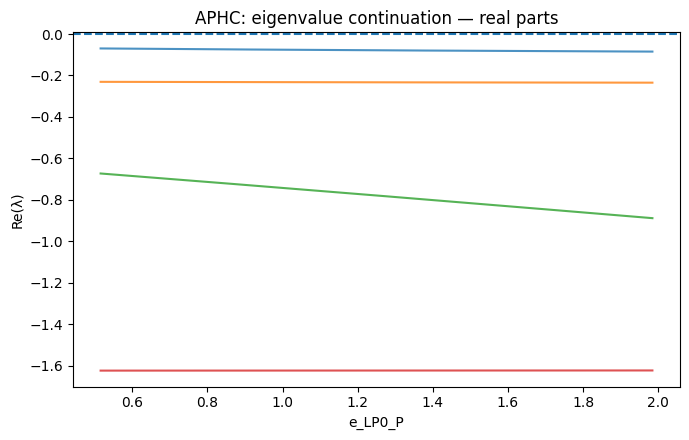

Saved figure: 20_APHC_e_LP0_P_continuation_imag.[png/svg/pdf]


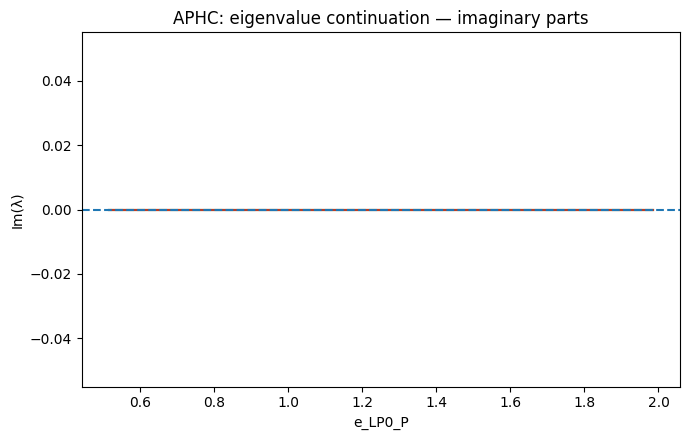

Saved table: 19_APHC_rho_AP_continuation.csv
Saved figure: 19_APHC_rho_AP_continuation_real.[png/svg/pdf]


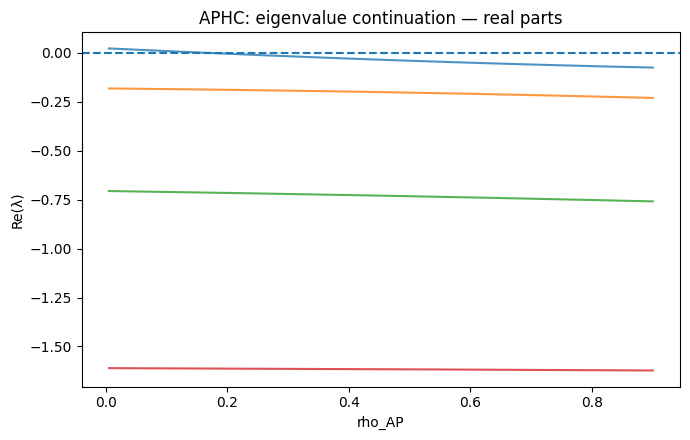

Saved figure: 20_APHC_rho_AP_continuation_imag.[png/svg/pdf]


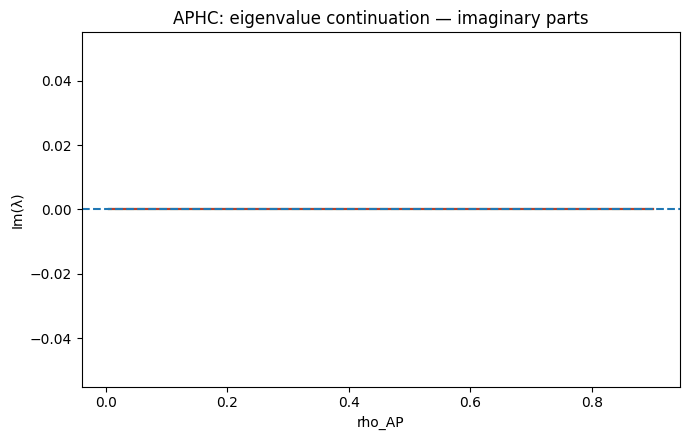

Saved table: 19_APHC_rho_AH_continuation.csv
Saved figure: 19_APHC_rho_AH_continuation_real.[png/svg/pdf]


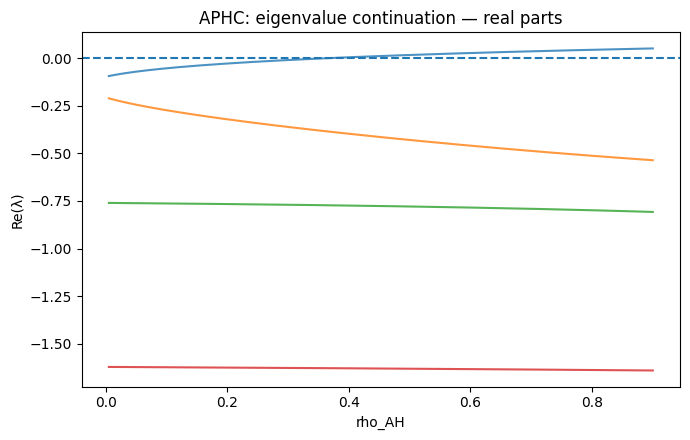

Saved figure: 20_APHC_rho_AH_continuation_imag.[png/svg/pdf]


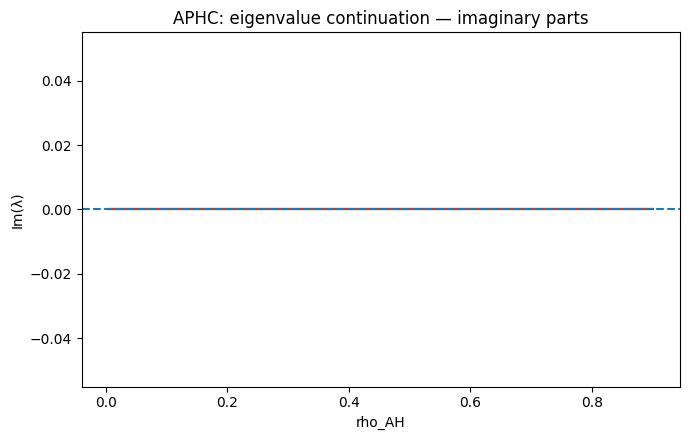

Saved table: 19_APHC_rho_PA_continuation.csv
Saved figure: 19_APHC_rho_PA_continuation_real.[png/svg/pdf]


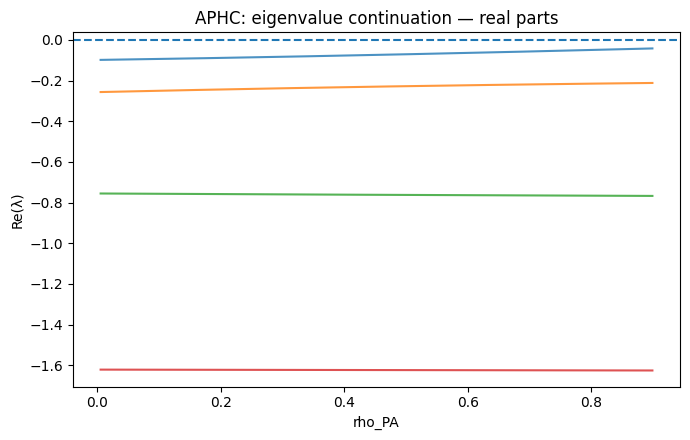

Saved figure: 20_APHC_rho_PA_continuation_imag.[png/svg/pdf]


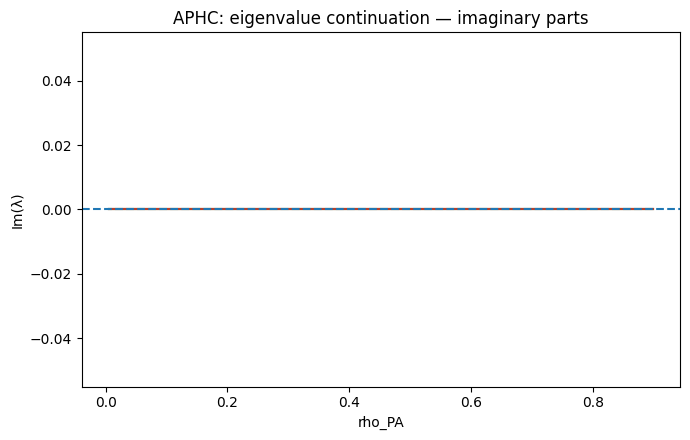

Saved table: 19_APHC_rho_PC_continuation.csv
Saved figure: 19_APHC_rho_PC_continuation_real.[png/svg/pdf]


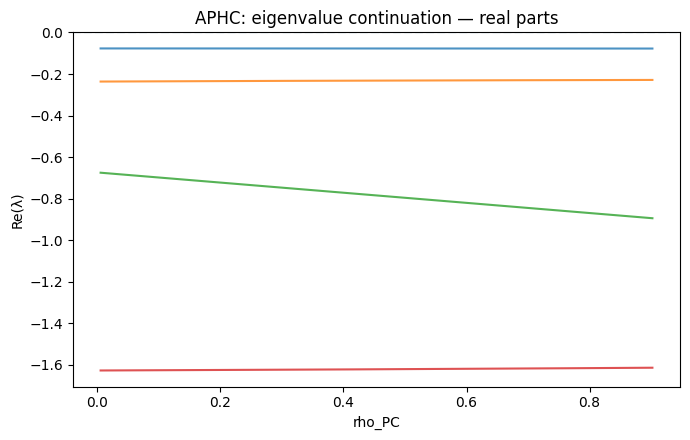

Saved figure: 20_APHC_rho_PC_continuation_imag.[png/svg/pdf]


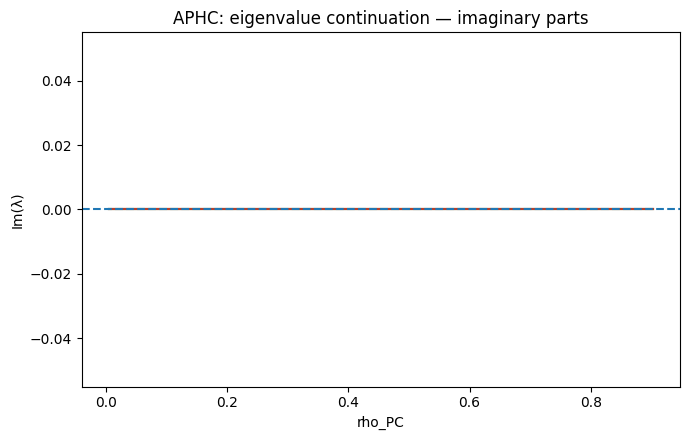

Saved table: 19_APHC_rho_HA_continuation.csv
Saved figure: 19_APHC_rho_HA_continuation_real.[png/svg/pdf]


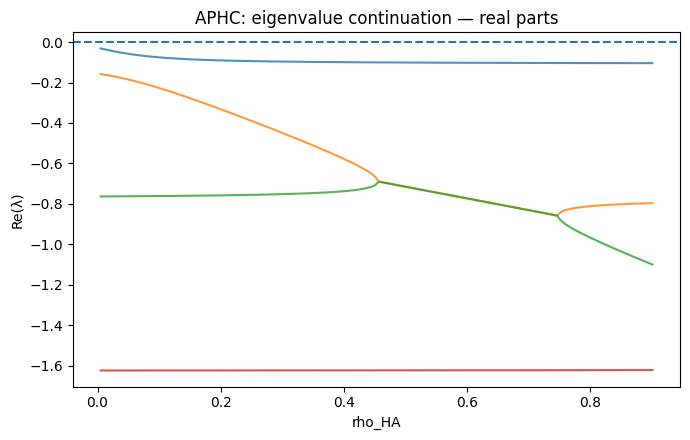

Saved figure: 20_APHC_rho_HA_continuation_imag.[png/svg/pdf]


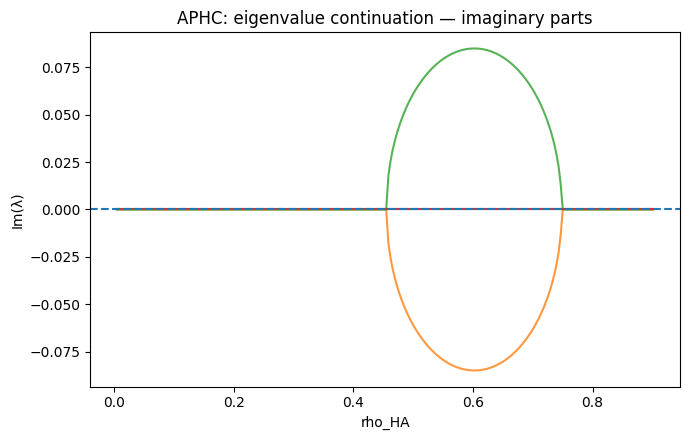

Saved table: 19_APHC_rho_HC_continuation.csv
Saved figure: 19_APHC_rho_HC_continuation_real.[png/svg/pdf]


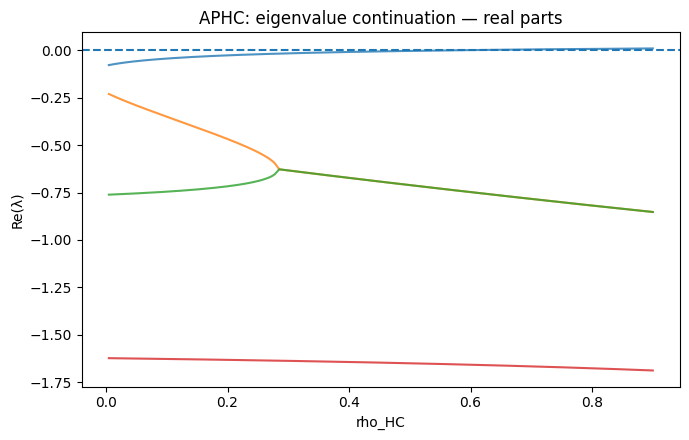

Saved figure: 20_APHC_rho_HC_continuation_imag.[png/svg/pdf]


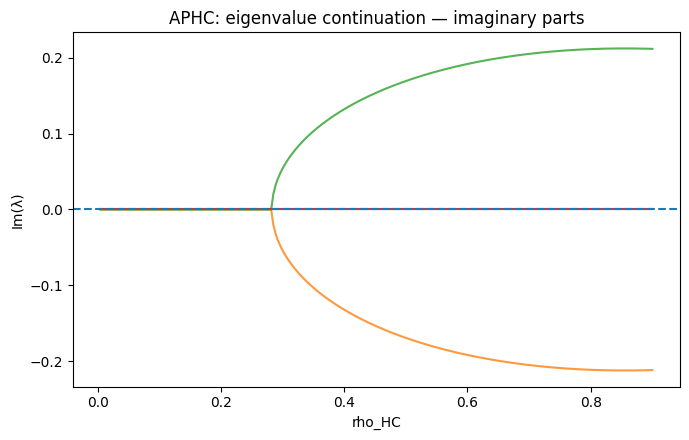

Saved table: 19_APHC_rho_CP_continuation.csv
Saved figure: 19_APHC_rho_CP_continuation_real.[png/svg/pdf]


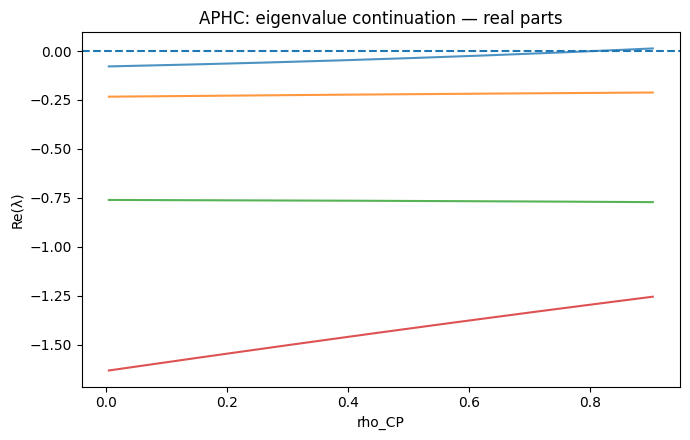

Saved figure: 20_APHC_rho_CP_continuation_imag.[png/svg/pdf]


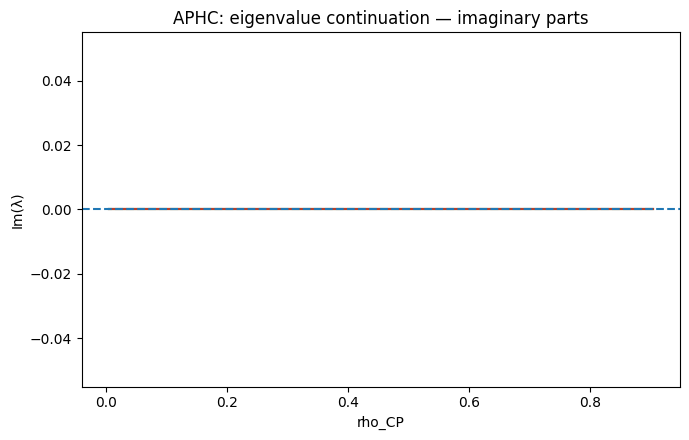

Saved table: 19_APHC_rho_CH_continuation.csv
Saved figure: 19_APHC_rho_CH_continuation_real.[png/svg/pdf]


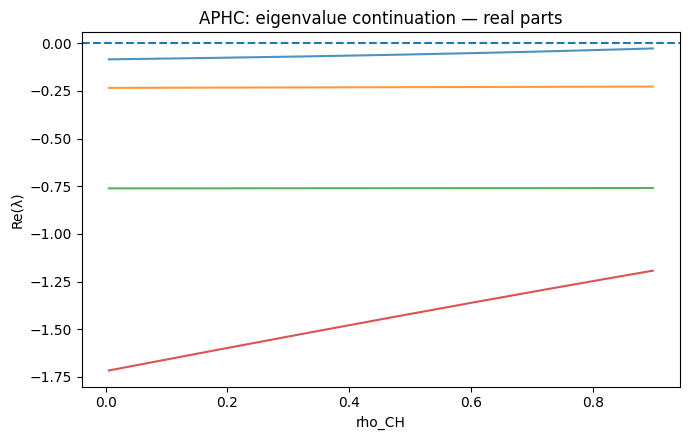

Saved figure: 20_APHC_rho_CH_continuation_imag.[png/svg/pdf]


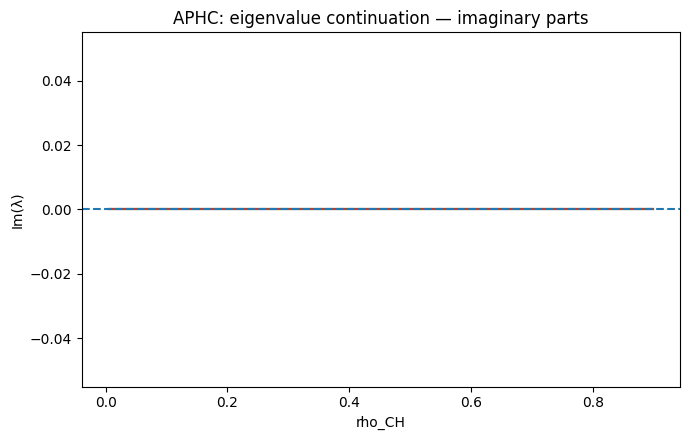

Saved table: 19_APHC_e_LAP_A_continuation.csv
Saved figure: 19_APHC_e_LAP_A_continuation_real.[png/svg/pdf]


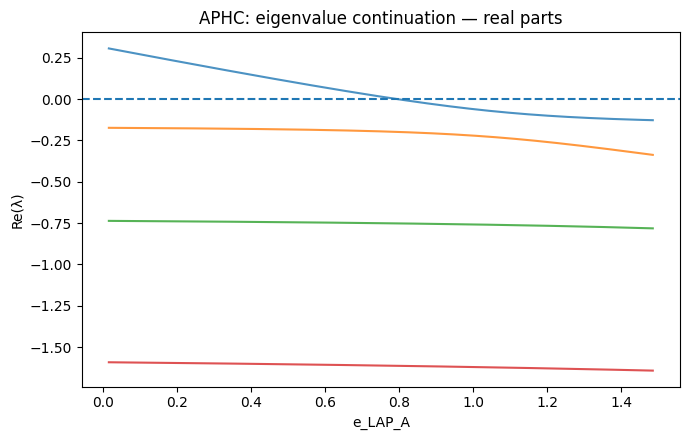

Saved figure: 20_APHC_e_LAP_A_continuation_imag.[png/svg/pdf]


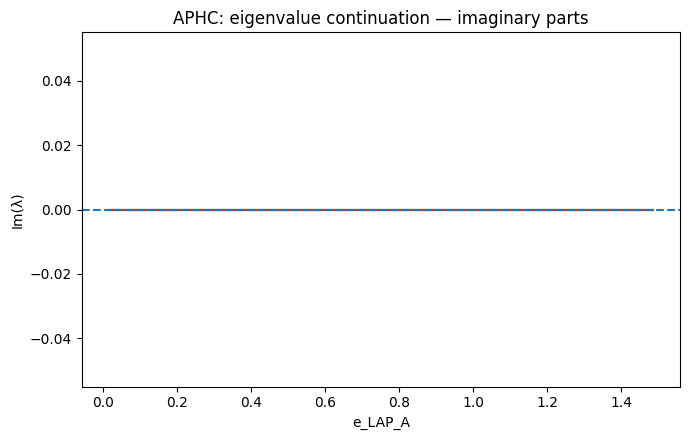

Saved table: 19_APHC_e_LAH_A_continuation.csv
Saved figure: 19_APHC_e_LAH_A_continuation_real.[png/svg/pdf]


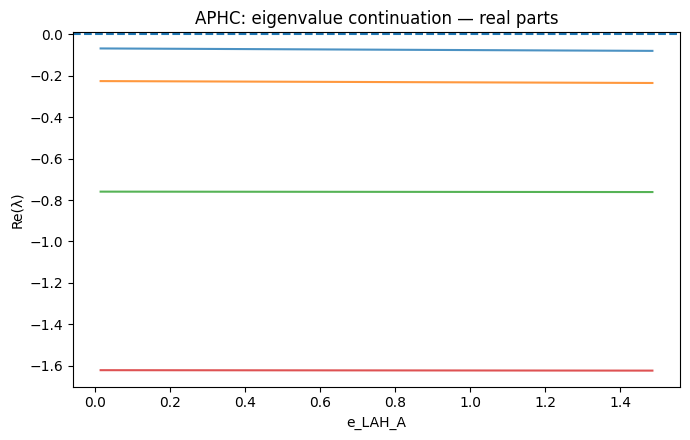

Saved figure: 20_APHC_e_LAH_A_continuation_imag.[png/svg/pdf]


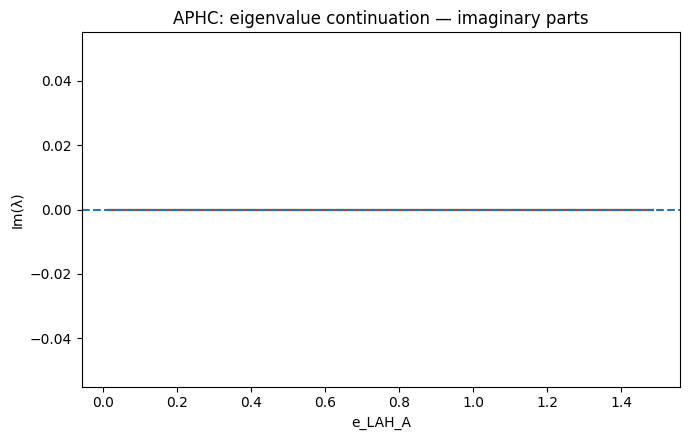

Saved table: 19_APHC_e_LPA_P_continuation.csv
Saved figure: 19_APHC_e_LPA_P_continuation_real.[png/svg/pdf]


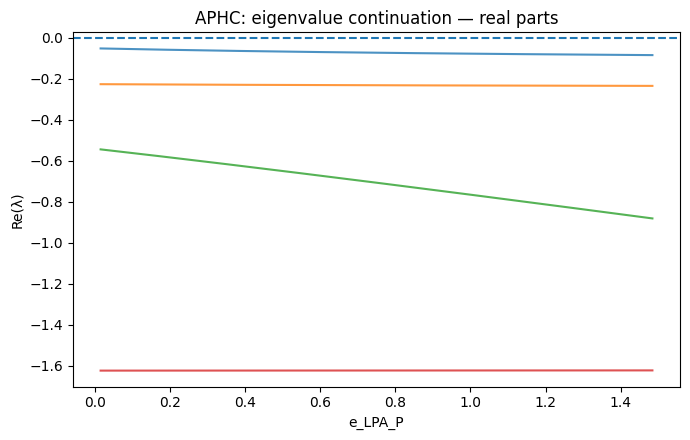

Saved figure: 20_APHC_e_LPA_P_continuation_imag.[png/svg/pdf]


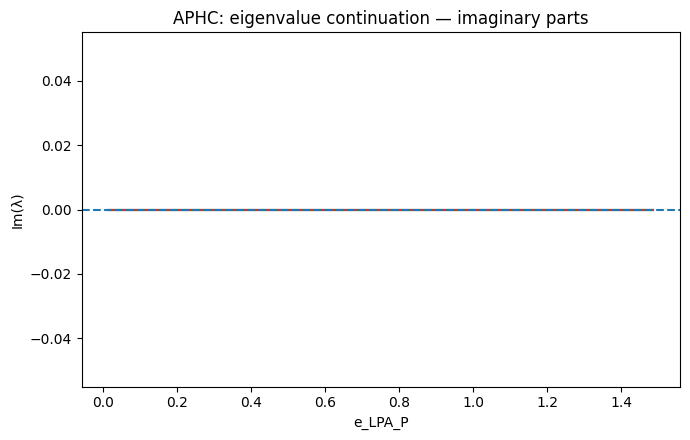

Saved table: 19_APHC_e_LPC_P_continuation.csv
Saved figure: 19_APHC_e_LPC_P_continuation_real.[png/svg/pdf]


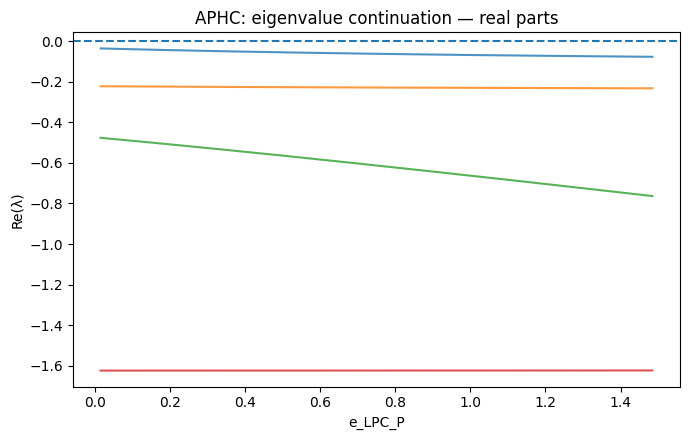

Saved figure: 20_APHC_e_LPC_P_continuation_imag.[png/svg/pdf]


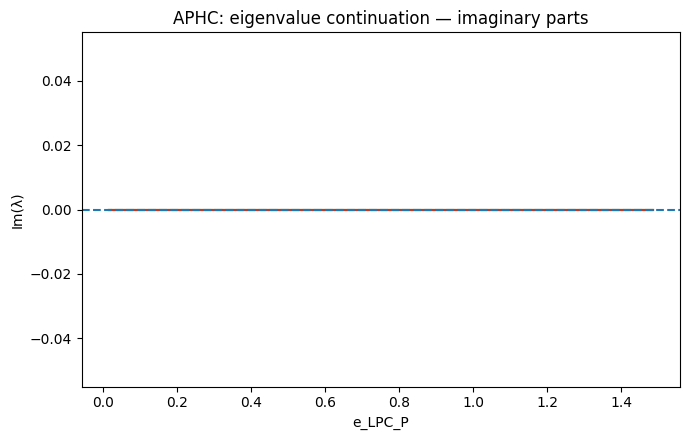

Saved table: 19_APHC_e_LHA_H_continuation.csv
Saved figure: 19_APHC_e_LHA_H_continuation_real.[png/svg/pdf]


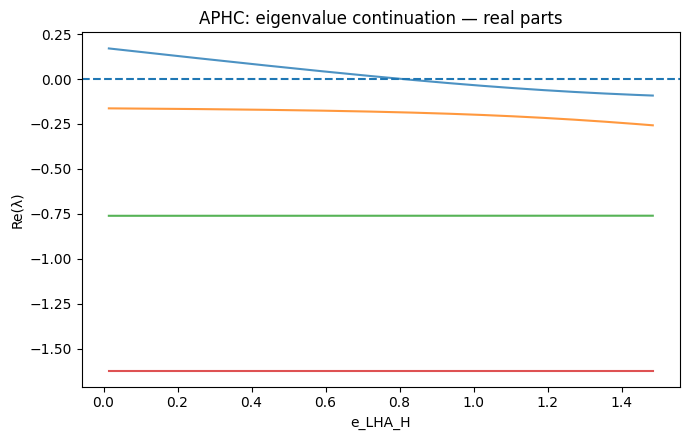

Saved figure: 20_APHC_e_LHA_H_continuation_imag.[png/svg/pdf]


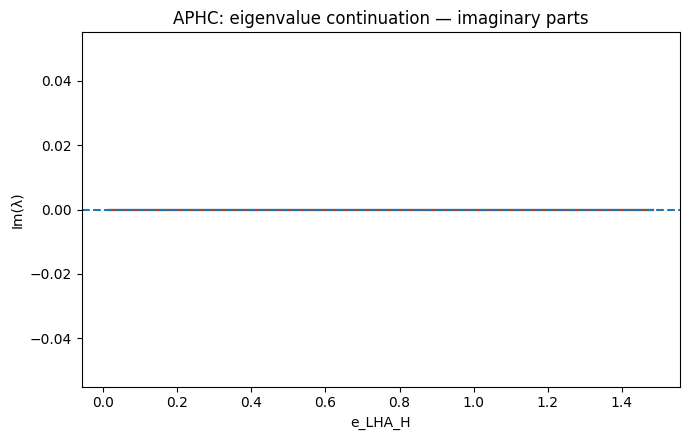

Saved table: 19_APHC_e_LHC_H_continuation.csv
Saved figure: 19_APHC_e_LHC_H_continuation_real.[png/svg/pdf]


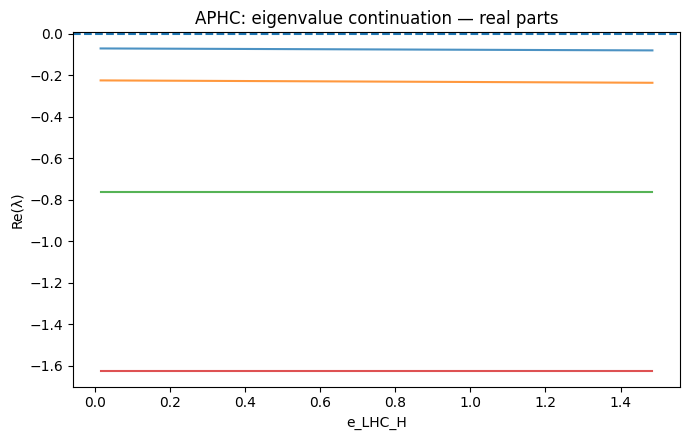

Saved figure: 20_APHC_e_LHC_H_continuation_imag.[png/svg/pdf]


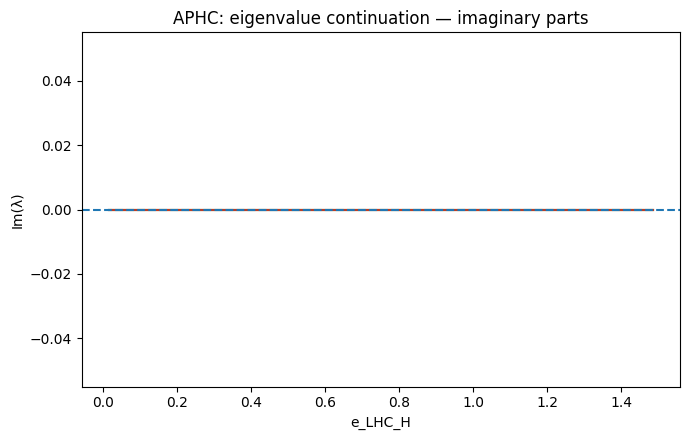

Saved table: 19_APHC_e_LCP_C_continuation.csv
Saved figure: 19_APHC_e_LCP_C_continuation_real.[png/svg/pdf]


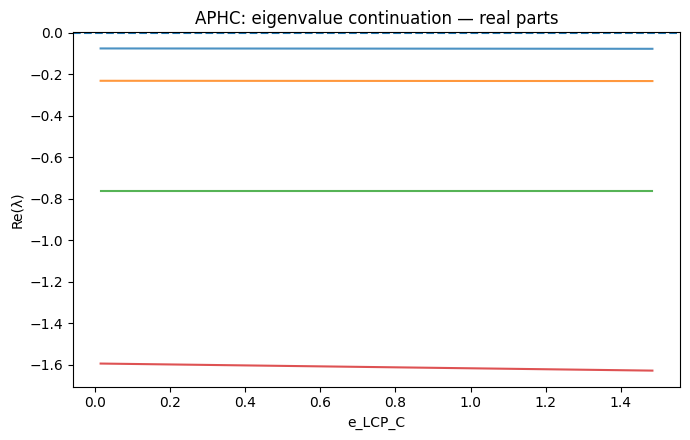

Saved figure: 20_APHC_e_LCP_C_continuation_imag.[png/svg/pdf]


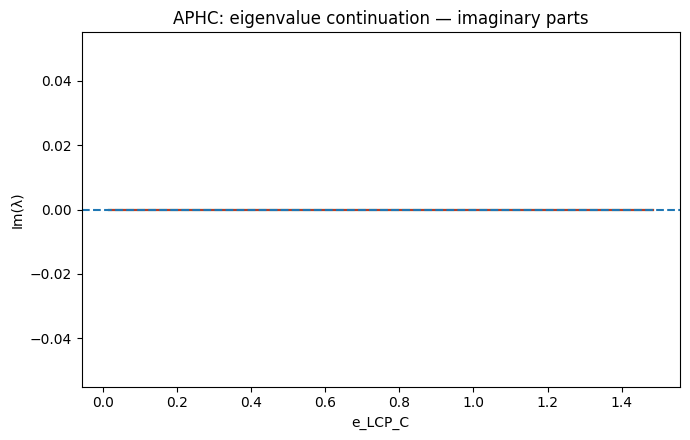

Saved table: 19_APHC_e_LCH_C_continuation.csv
Saved figure: 19_APHC_e_LCH_C_continuation_real.[png/svg/pdf]


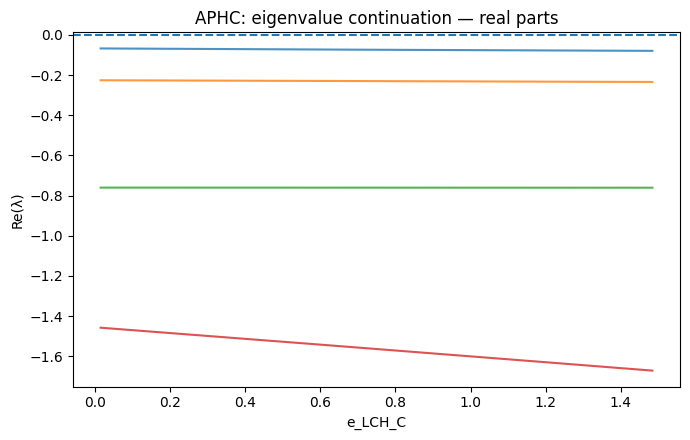

Saved figure: 20_APHC_e_LCH_C_continuation_imag.[png/svg/pdf]


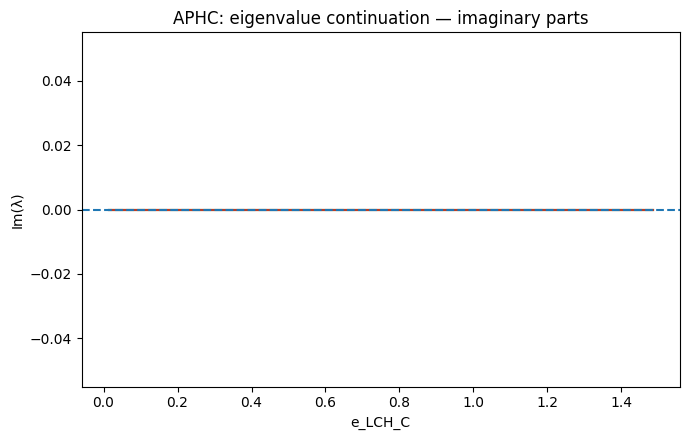

Saved table: 19_APHC_e_LAP_P_continuation.csv
Saved figure: 19_APHC_e_LAP_P_continuation_real.[png/svg/pdf]


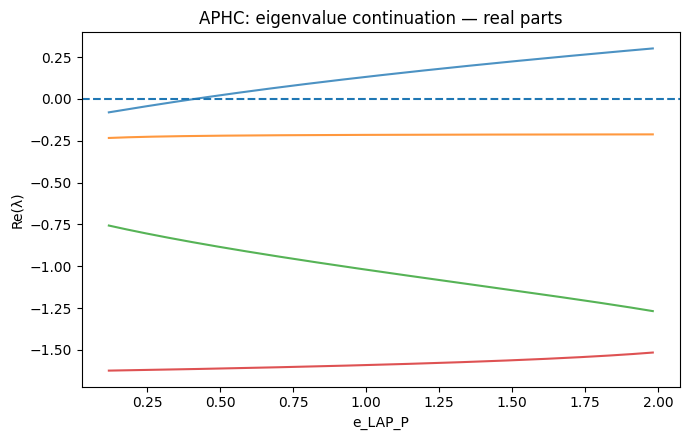

Saved figure: 20_APHC_e_LAP_P_continuation_imag.[png/svg/pdf]


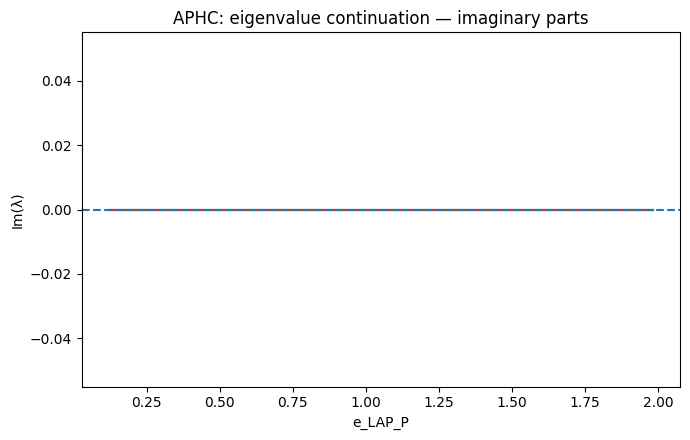

Saved table: 19_APHC_e_LAH_H_continuation.csv
Saved figure: 19_APHC_e_LAH_H_continuation_real.[png/svg/pdf]


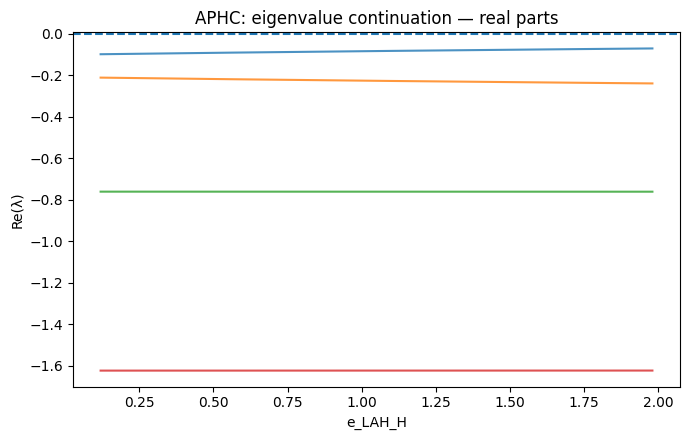

Saved figure: 20_APHC_e_LAH_H_continuation_imag.[png/svg/pdf]


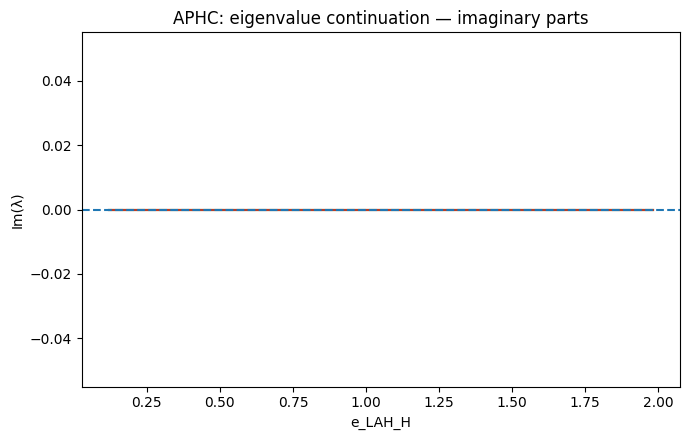

Saved table: 19_APHC_e_LPA_A_continuation.csv
Saved figure: 19_APHC_e_LPA_A_continuation_real.[png/svg/pdf]


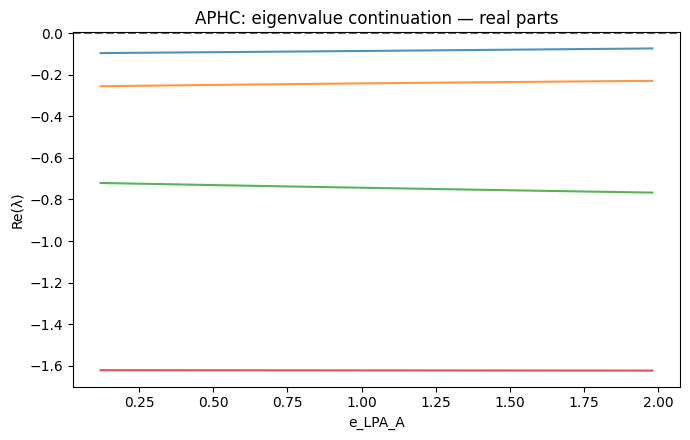

Saved figure: 20_APHC_e_LPA_A_continuation_imag.[png/svg/pdf]


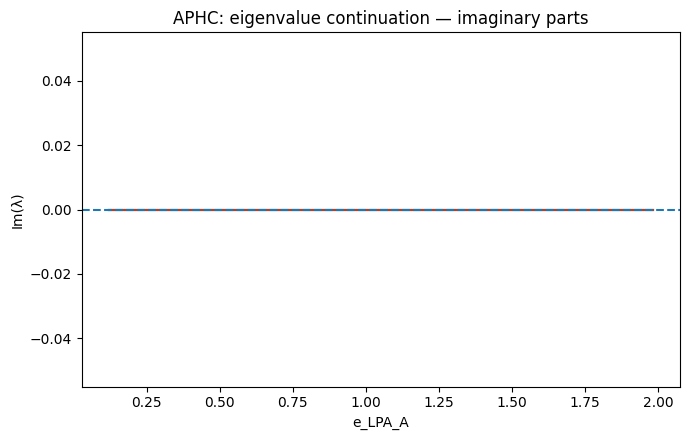

Saved table: 19_APHC_e_LPC_C_continuation.csv
Saved figure: 19_APHC_e_LPC_C_continuation_real.[png/svg/pdf]


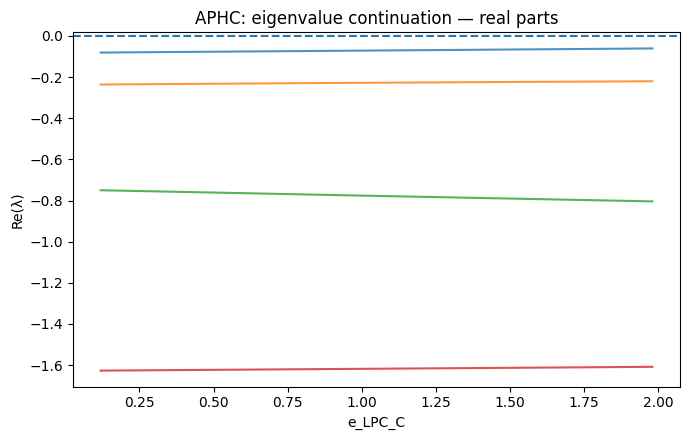

Saved figure: 20_APHC_e_LPC_C_continuation_imag.[png/svg/pdf]


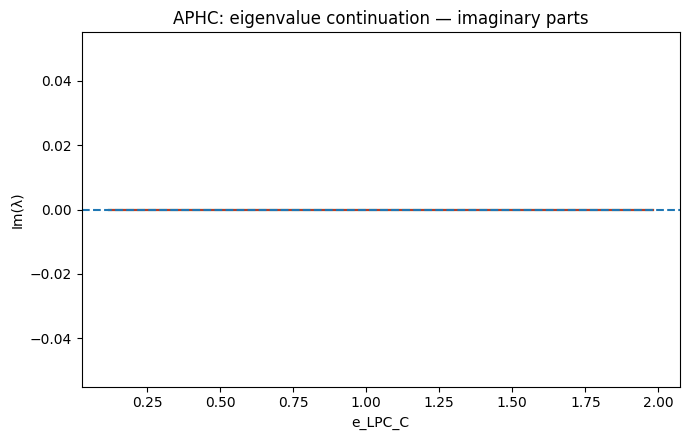

Saved table: 19_APHC_e_LHA_A_continuation.csv
Saved figure: 19_APHC_e_LHA_A_continuation_real.[png/svg/pdf]


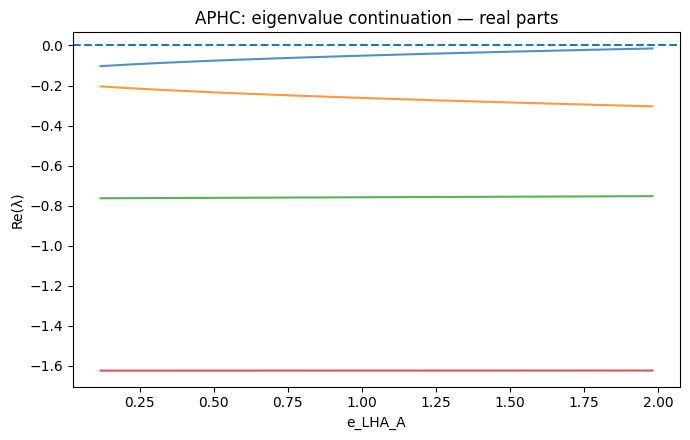

Saved figure: 20_APHC_e_LHA_A_continuation_imag.[png/svg/pdf]


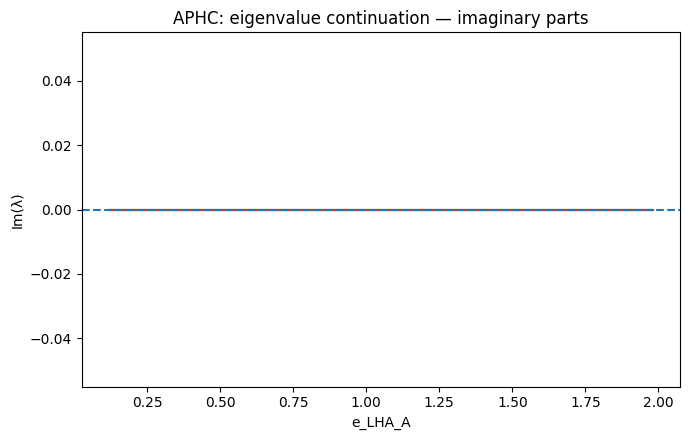

Saved table: 19_APHC_e_LHC_C_continuation.csv
Saved figure: 19_APHC_e_LHC_C_continuation_real.[png/svg/pdf]


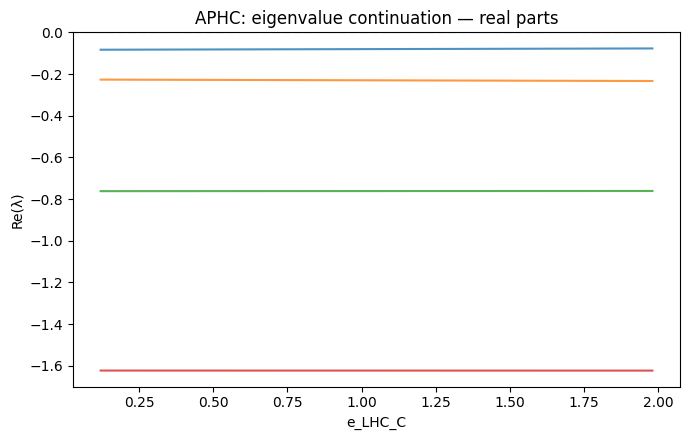

Saved figure: 20_APHC_e_LHC_C_continuation_imag.[png/svg/pdf]


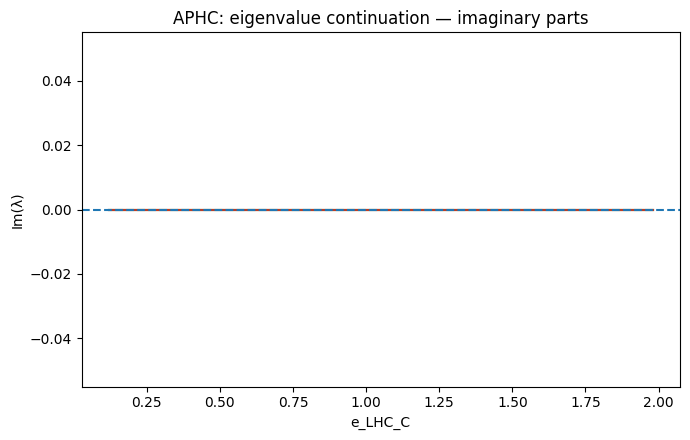

Saved table: 19_APHC_e_LCP_P_continuation.csv
Saved figure: 19_APHC_e_LCP_P_continuation_real.[png/svg/pdf]


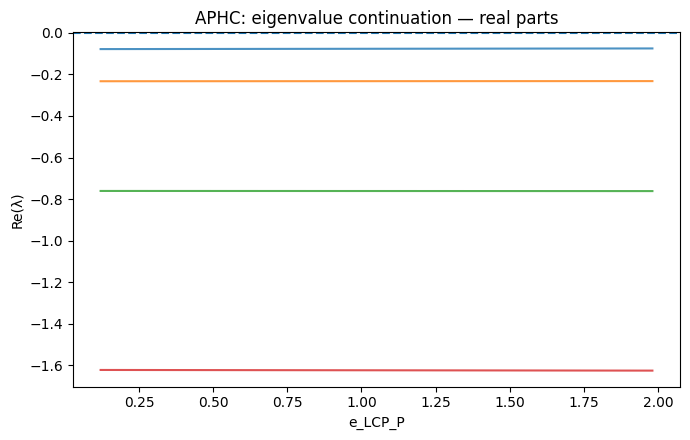

Saved figure: 20_APHC_e_LCP_P_continuation_imag.[png/svg/pdf]


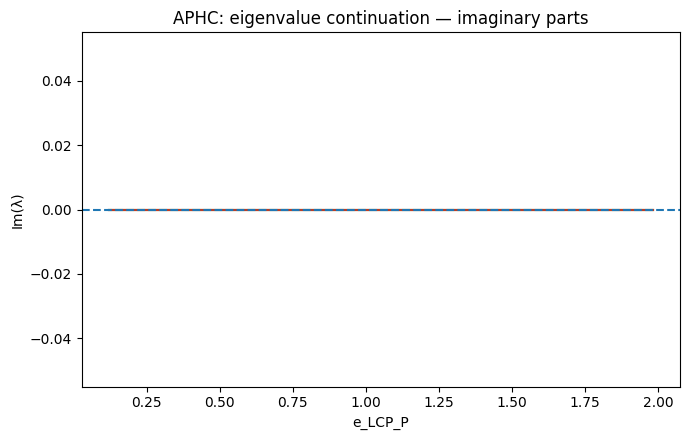

Saved table: 19_APHC_e_LCH_H_continuation.csv
Saved figure: 19_APHC_e_LCH_H_continuation_real.[png/svg/pdf]


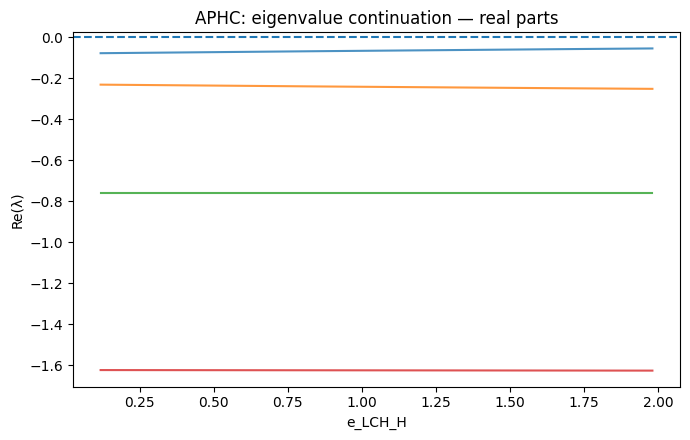

Saved figure: 20_APHC_e_LCH_H_continuation_imag.[png/svg/pdf]


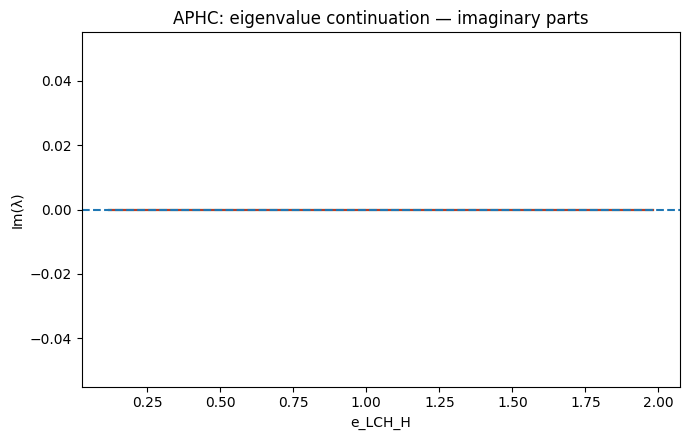

Saved table: 19_APHC_e_GA_C_continuation.csv
Saved figure: 19_APHC_e_GA_C_continuation_real.[png/svg/pdf]


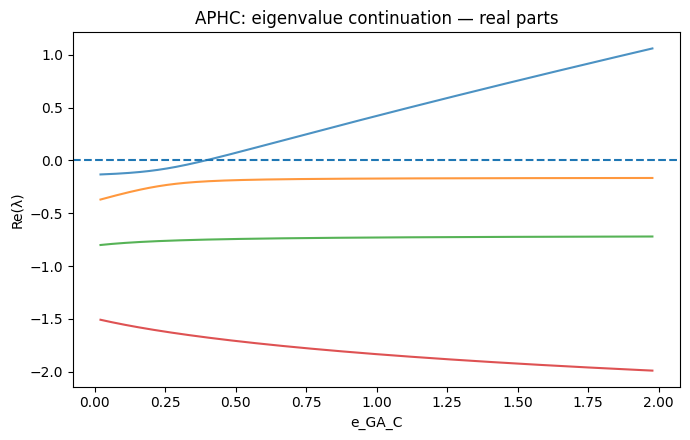

Saved figure: 20_APHC_e_GA_C_continuation_imag.[png/svg/pdf]


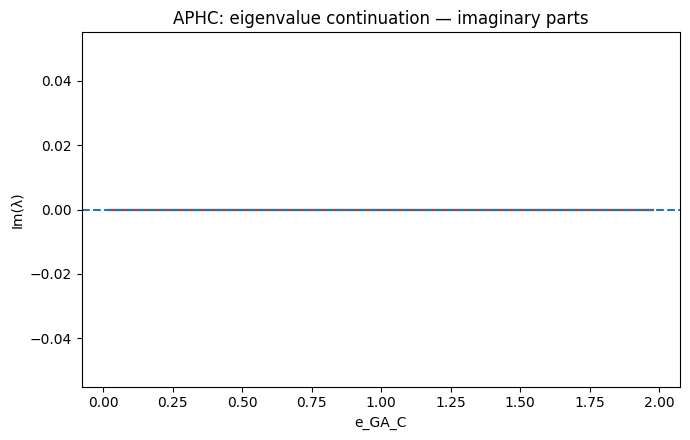

Saved table: 19_APHC_e_GP_H_continuation.csv
Saved figure: 19_APHC_e_GP_H_continuation_real.[png/svg/pdf]


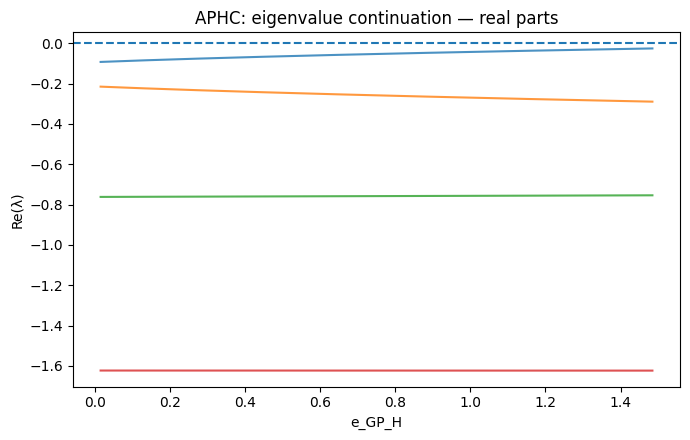

Saved figure: 20_APHC_e_GP_H_continuation_imag.[png/svg/pdf]


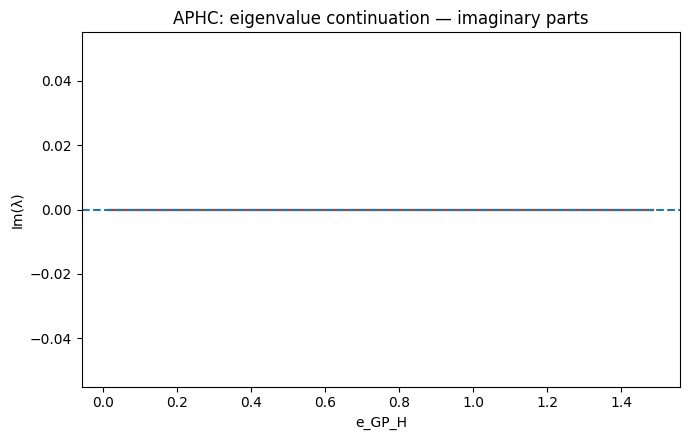

Saved table: 19_APHC_e_GH_P_continuation.csv
Saved figure: 19_APHC_e_GH_P_continuation_real.[png/svg/pdf]


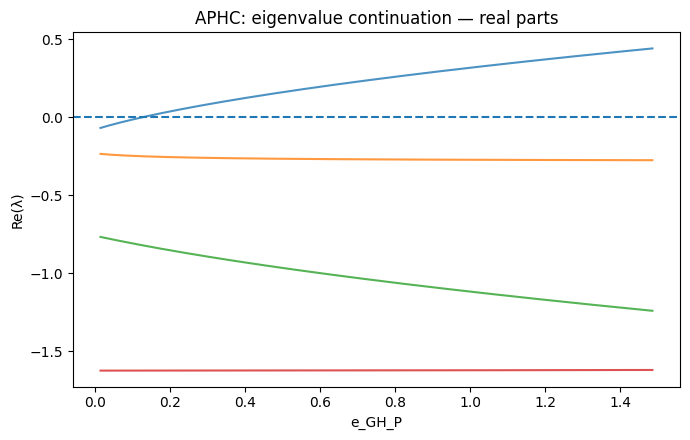

Saved figure: 20_APHC_e_GH_P_continuation_imag.[png/svg/pdf]


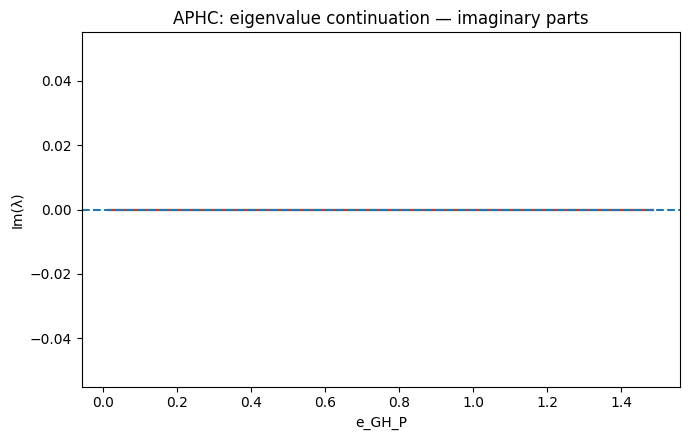

Saved table: 19_APHC_e_GH_H_continuation.csv
Saved figure: 19_APHC_e_GH_H_continuation_real.[png/svg/pdf]


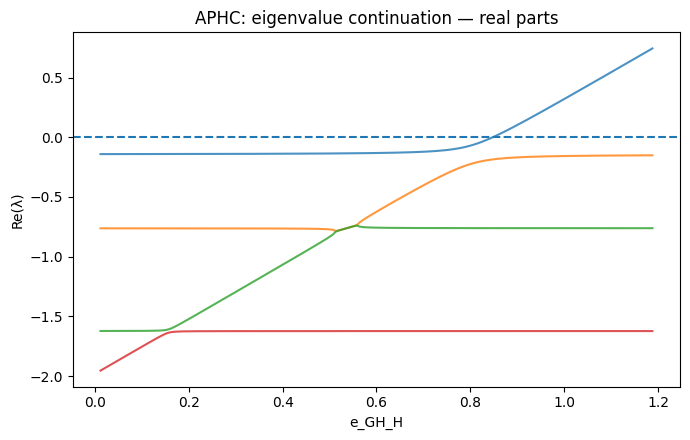

Saved figure: 20_APHC_e_GH_H_continuation_imag.[png/svg/pdf]


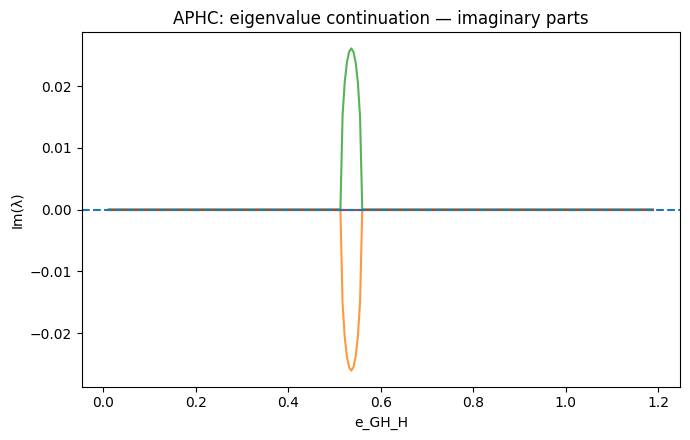

Saved table: 19_APHC_e_GC_A_continuation.csv
Saved figure: 19_APHC_e_GC_A_continuation_real.[png/svg/pdf]


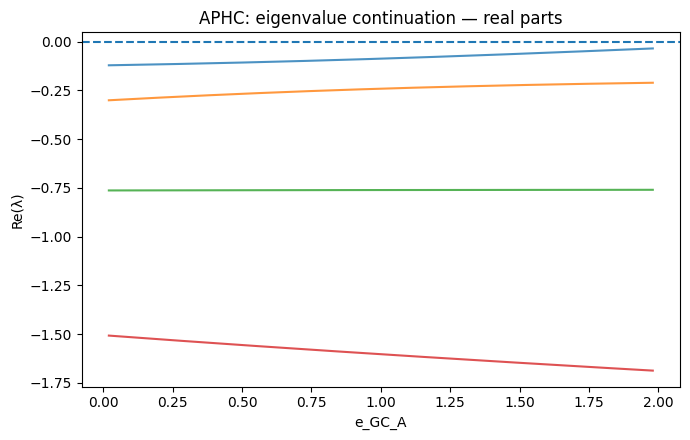

Saved figure: 20_APHC_e_GC_A_continuation_imag.[png/svg/pdf]


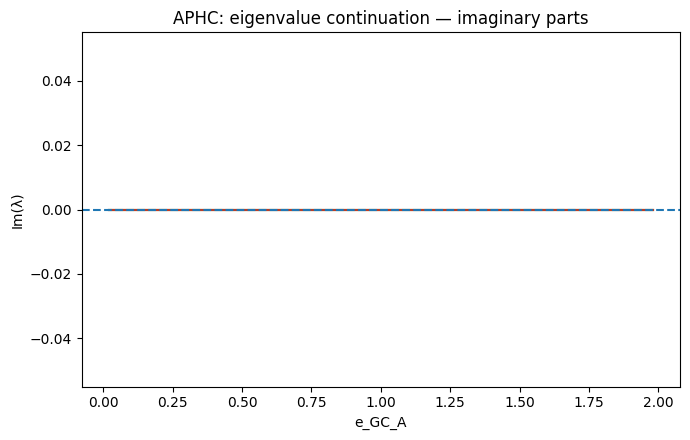

Saved table: 19_APHC_e_GC_C_continuation.csv
Saved figure: 19_APHC_e_GC_C_continuation_real.[png/svg/pdf]


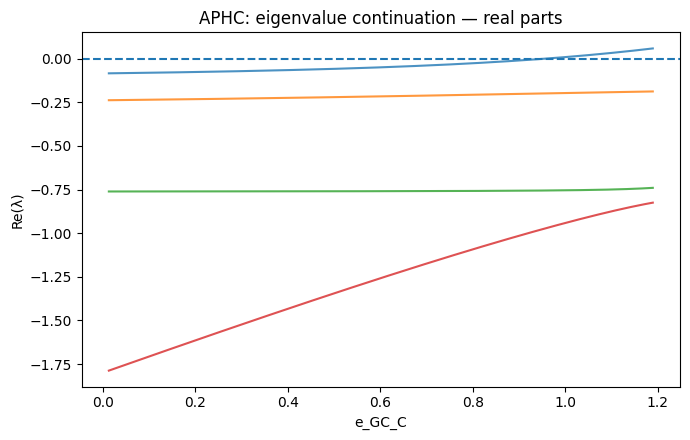

Saved figure: 20_APHC_e_GC_C_continuation_imag.[png/svg/pdf]


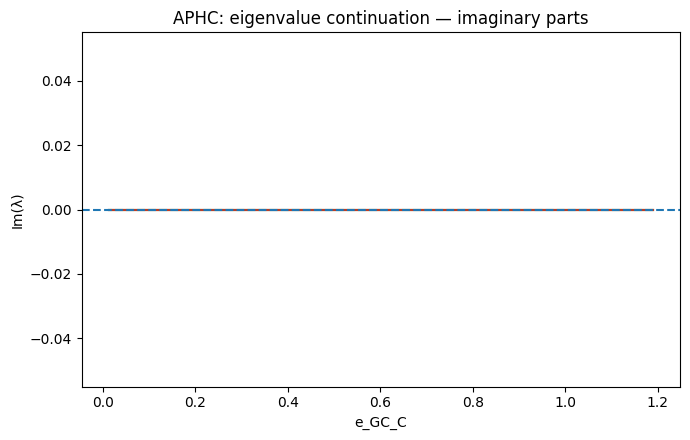

Saved table: 19_APHC_e_LH0_H_continuation.csv
Saved figure: 19_APHC_e_LH0_H_continuation_real.[png/svg/pdf]


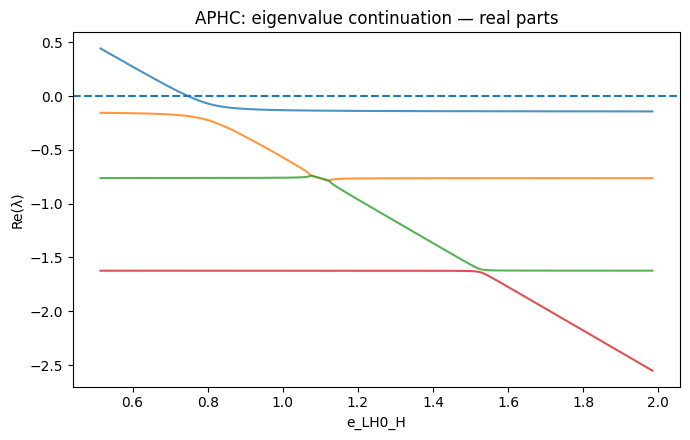

Saved figure: 20_APHC_e_LH0_H_continuation_imag.[png/svg/pdf]


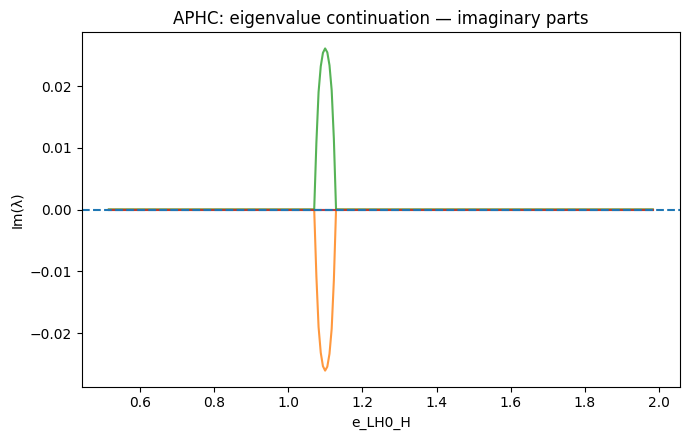

Saved table: 19_APHC_e_LC0_C_continuation.csv
Saved figure: 19_APHC_e_LC0_C_continuation_real.[png/svg/pdf]


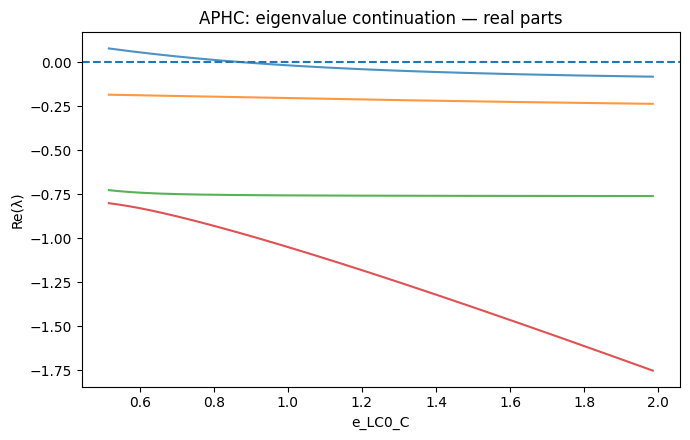

Saved figure: 20_APHC_e_LC0_C_continuation_imag.[png/svg/pdf]


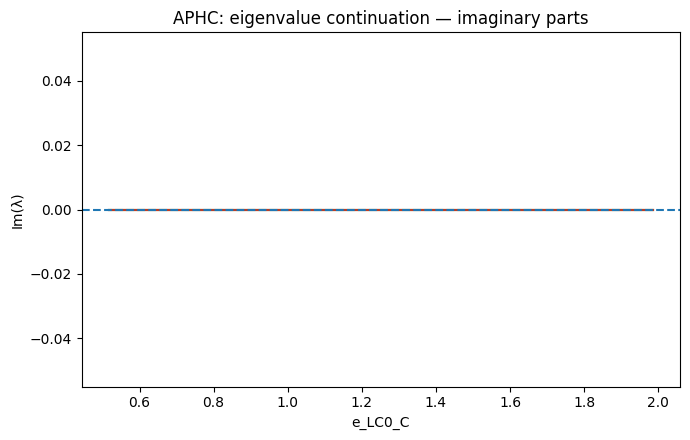

Saved table: 21_all_detected_local_bifurcation_boundaries.csv


,model,parameter,critical_value,critical_real,critical_imag,boundary_type,crossing_slope,hopf_omega,hopf_period
0,AP,e_GA_A,1.122462,3.430589e-14,0.0,zero_eigenvalue_boundary,1.499425,NaN,NaN
1,AP,e_GP_P,0.875841,-1.804112e-15,0.0,zero_eigenvalue_boundary,0.559954,NaN,NaN
2,AP,e_LP0_P,0.686213,-6.938894e-18,0.0,zero_eigenvalue_boundary,-0.395260,NaN,NaN
3,AP,rho_PA,0.599019,0.000000e+00,0.0,zero_eigenvalue_boundary,0.761118,NaN,NaN
4,APC,e_GA_A,0.675479,5.551115e-17,0.0,zero_eigenvalue_boundary,0.416497,NaN,NaN
5,APC,e_LA0_A,1.098492,-5.551115e-17,0.0,zero_eigenvalue_boundary,-0.283849,NaN,NaN
6,APC,e_GP_P,0.425543,2.053913e-15,0.0,zero_eigenvalue_boundary,2.058505,NaN,NaN
7,APC,rho_AP,0.568529,-5.551115e-17,0.0,zero_eigenvalue_boundary,0.573503,NaN,NaN
8,APC,rho_PC,0.303368,0.000000e+00,0.0,zero_eigenvalue_boundary,1.729402,NaN,NaN
9,APC,rho_CP,0.562561,-7.771561e-16,0.0,zero_eigenvalue_boundary,0.329911,NaN,NaN


In [27]:
all_bifurcations=[]
continuation_tables={}

for model,base in representatives.items():
    for param,vals in ensembles[model]["params"].items():
        vals=np.asarray(vals)
        if np.std(vals)==0:
            continue
        lo,hi=np.quantile(vals,[.01,.99])
        grid=np.linspace(lo,hi,250)
        df=continuation(model,base,param,grid)
        continuation_tables[(model,param)]=df
        save_table(df,f"19_{model}_{param}_continuation")
        cross=refine_crossings(model,base,param,grid)
        if len(cross):
            all_bifurcations.append(cross)
        # Plot every intermediate continuation, as requested.
        plot_continuation(df,model,param)

bifurcation_summary=(pd.concat(all_bifurcations,ignore_index=True)
                     if all_bifurcations else
                     pd.DataFrame(columns=["model","parameter","critical_value","boundary_type"]))
save_table(bifurcation_summary,"21_all_detected_local_bifurcation_boundaries")
bifurcation_summary

# 18. Critical-mode analysis at each detected boundary

At a detected local stability boundary, the critical eigenvector describes the state-space direction associated with the mode that loses stability.

For the critical eigenvalue \(\lambda_c\), the notebook calculates normalized absolute right-eigenvector components and left–right participation:

\[
\pi_i
\propto
|w_i v_i|.
\]

These quantities help identify whether the critical mode is dominated by Amygdala, mPFC, hippocampal, cortisol, or mixed dynamics.

Saved table: 22_critical_mode_participation.csv
Saved figure: 22_AP_e_GA_A_1.1225_critical_mode.[png/svg/pdf]


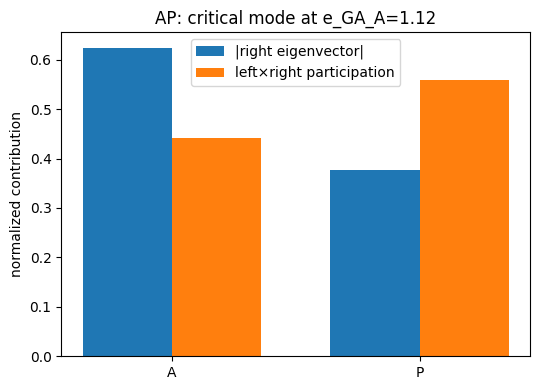

Saved figure: 22_AP_e_GP_P_0.87584_critical_mode.[png/svg/pdf]


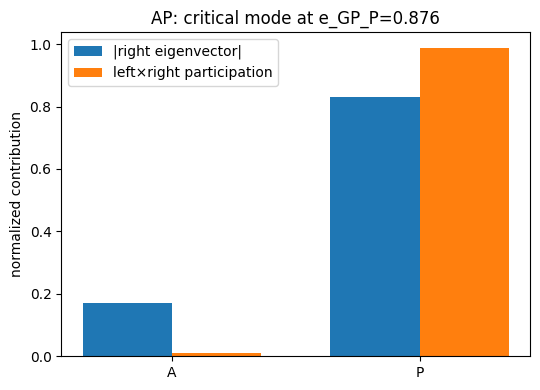

Saved figure: 22_AP_e_LP0_P_0.68621_critical_mode.[png/svg/pdf]


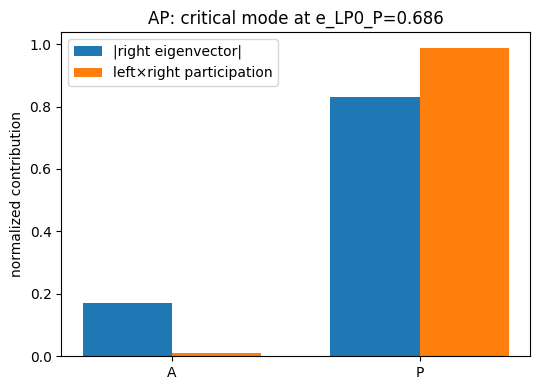

Saved figure: 22_AP_rho_PA_0.59902_critical_mode.[png/svg/pdf]


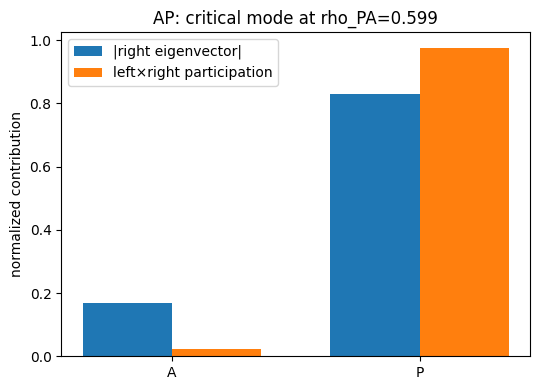

Saved figure: 22_APC_e_GA_A_0.67548_critical_mode.[png/svg/pdf]


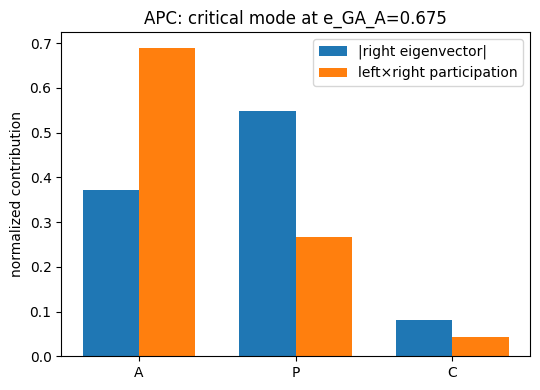

Saved figure: 22_APC_e_GA_C_0.72462_critical_mode.[png/svg/pdf]


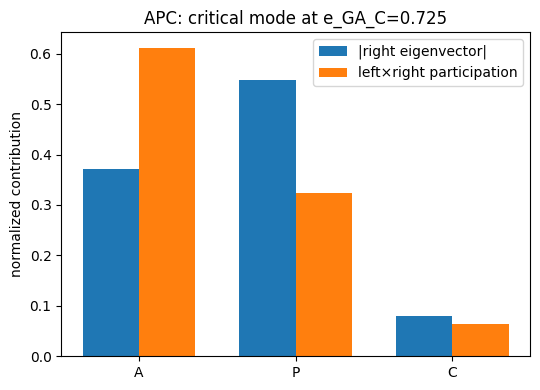

Saved figure: 22_APC_e_GC_A_0.83939_critical_mode.[png/svg/pdf]


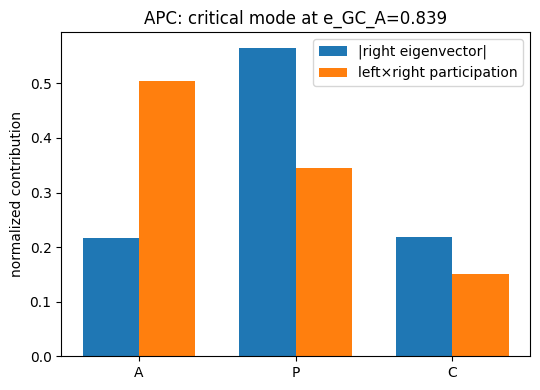

Saved figure: 22_APC_e_GP_P_0.42554_critical_mode.[png/svg/pdf]


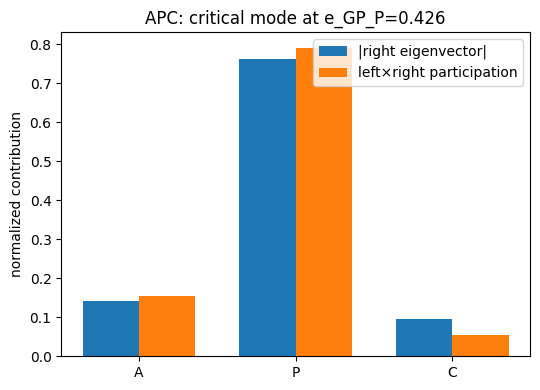

Saved figure: 22_APC_e_LA0_A_1.0985_critical_mode.[png/svg/pdf]


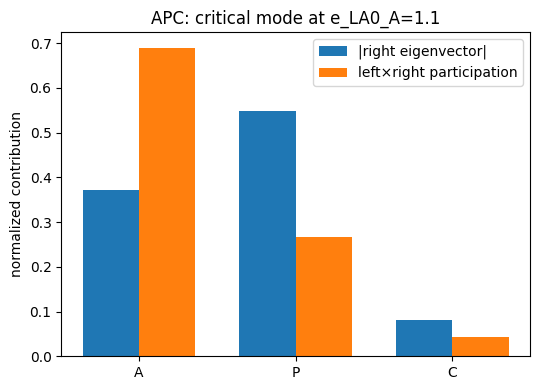

Saved figure: 22_APC_e_LAP_P_0.97725_critical_mode.[png/svg/pdf]


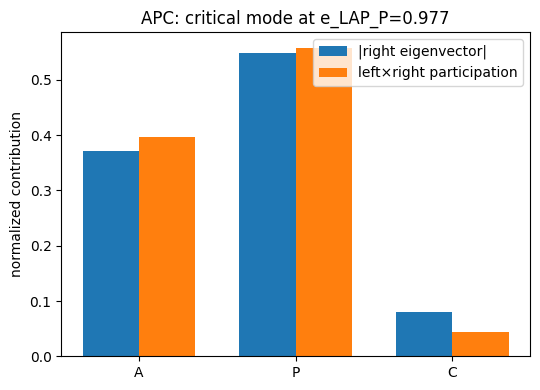

Saved figure: 22_APC_e_LC0_C_0.74784_critical_mode.[png/svg/pdf]


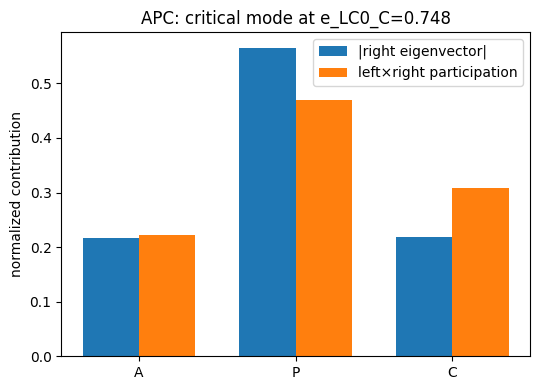

Saved figure: 22_APC_e_LPA_A_0.61359_critical_mode.[png/svg/pdf]


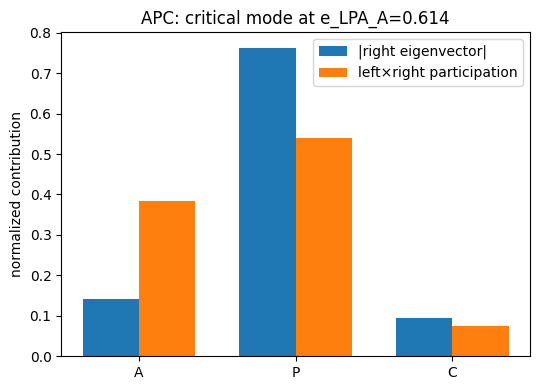

Saved figure: 22_APC_e_LPA_P_0.46772_critical_mode.[png/svg/pdf]


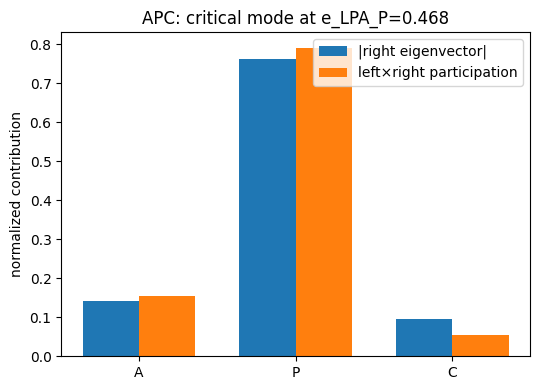

Saved figure: 22_APC_rho_AP_0.56853_critical_mode.[png/svg/pdf]


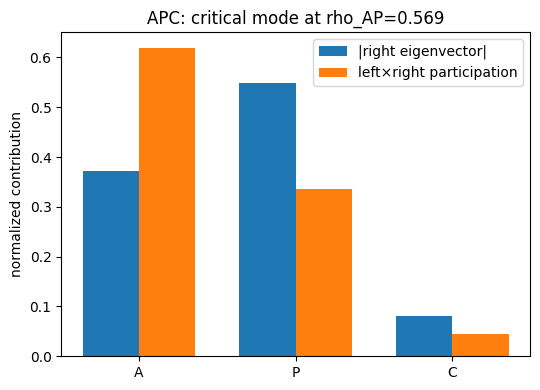

Saved figure: 22_APC_rho_CP_0.56256_critical_mode.[png/svg/pdf]


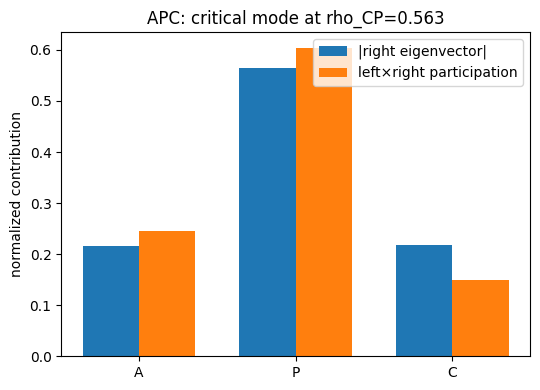

Saved figure: 22_APC_rho_PC_0.30337_critical_mode.[png/svg/pdf]


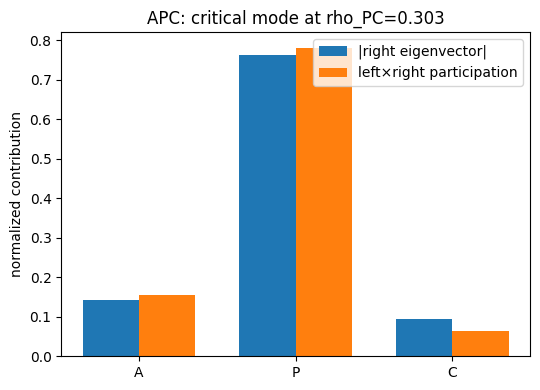

Saved figure: 22_APH_e_GA_A_0.70323_critical_mode.[png/svg/pdf]


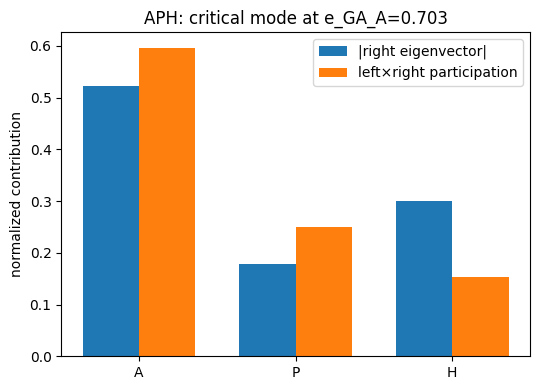

Saved figure: 22_APH_e_GH_H_0.99812_critical_mode.[png/svg/pdf]


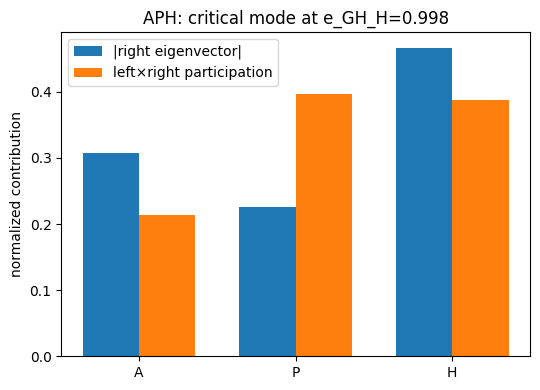

Saved figure: 22_APH_e_GP_H_0.96942_critical_mode.[png/svg/pdf]


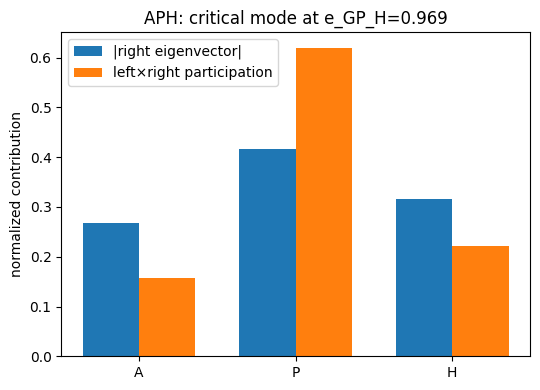

Saved figure: 22_APH_e_GP_P_0.87986_critical_mode.[png/svg/pdf]


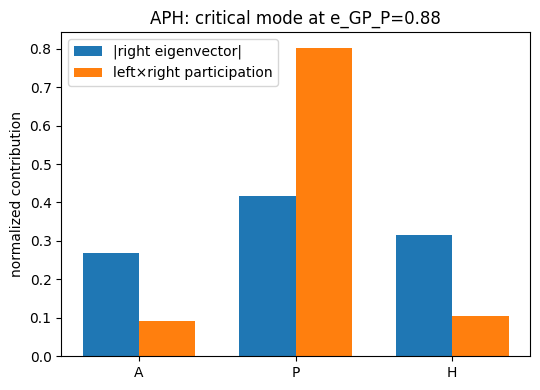

Saved figure: 22_APH_e_LAP_A_0.52986_critical_mode.[png/svg/pdf]


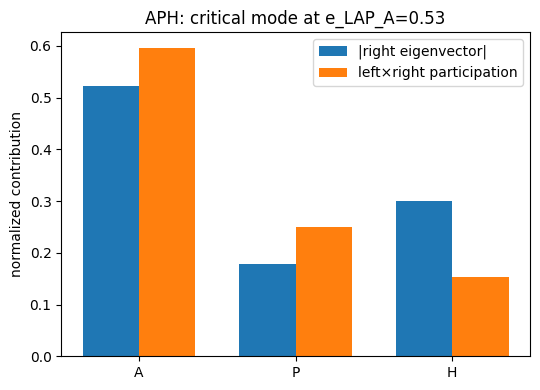

Saved figure: 22_APH_e_LAP_P_1.06_critical_mode.[png/svg/pdf]


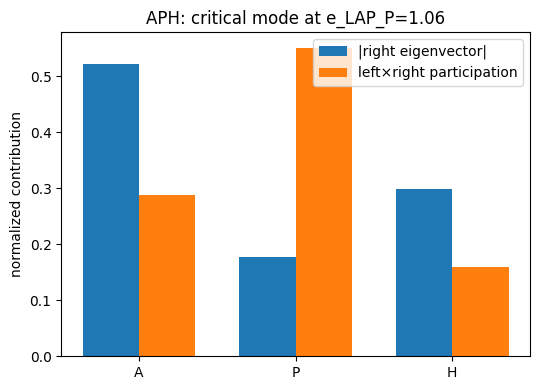

Saved figure: 22_APH_e_LH0_H_1.0572_critical_mode.[png/svg/pdf]


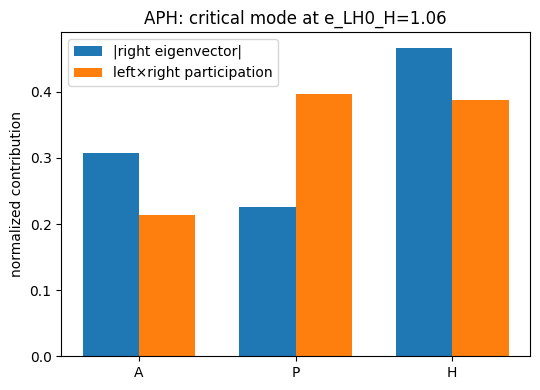

Saved figure: 22_APH_e_LPA_A_1.3223_critical_mode.[png/svg/pdf]


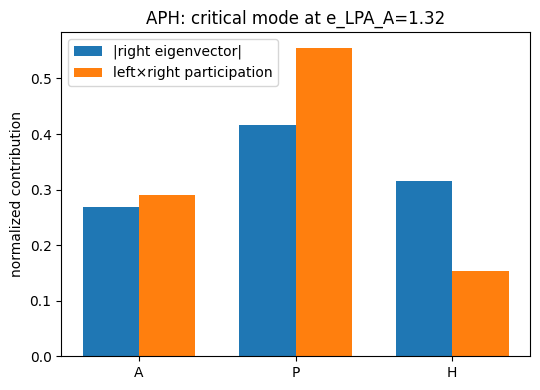

Saved figure: 22_APH_e_LPA_P_0.41679_critical_mode.[png/svg/pdf]


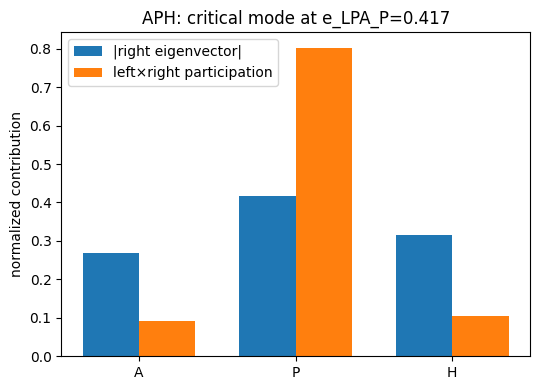

Saved figure: 22_APH_rho_HA_0.53676_critical_mode.[png/svg/pdf]


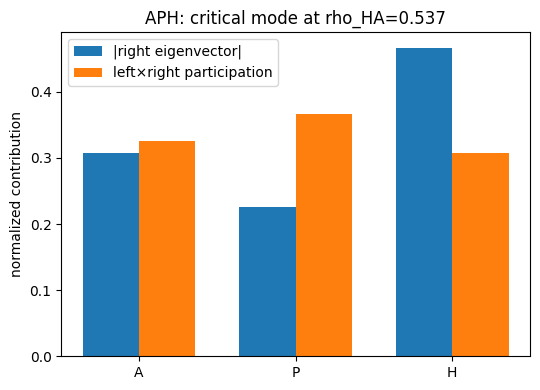

Saved figure: 22_APHC_e_GA_A_0.42096_critical_mode.[png/svg/pdf]


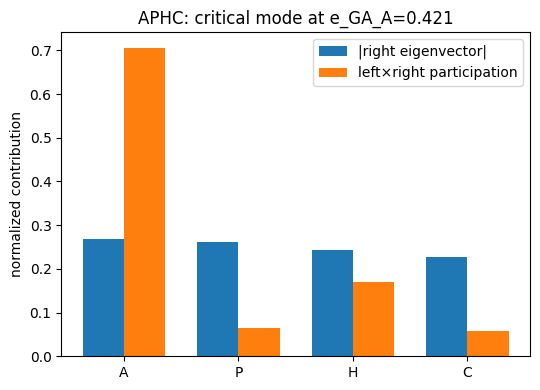

Saved figure: 22_APHC_e_GA_C_0.3937_critical_mode.[png/svg/pdf]


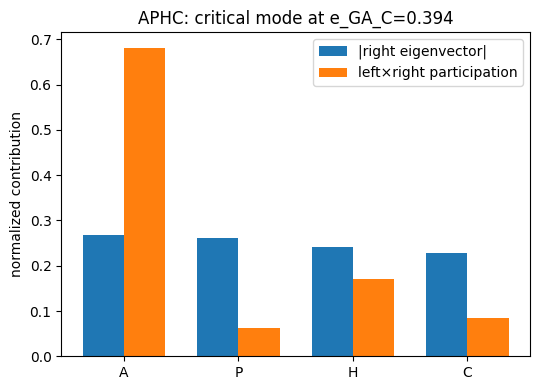

Saved figure: 22_APHC_e_GC_C_0.95672_critical_mode.[png/svg/pdf]


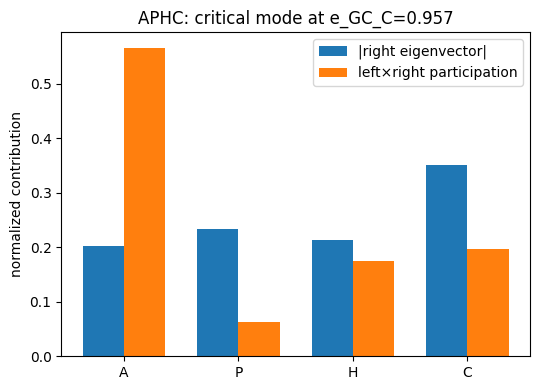

Saved figure: 22_APHC_e_GH_H_0.84779_critical_mode.[png/svg/pdf]


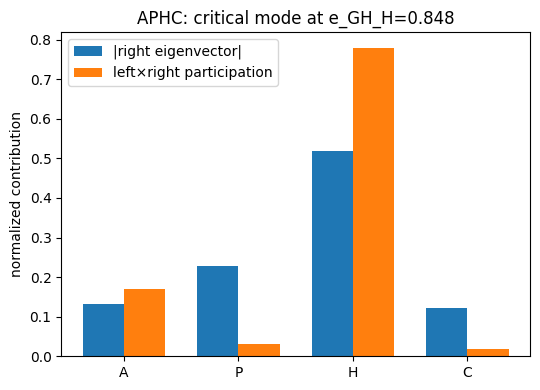

Saved figure: 22_APHC_e_GH_P_0.12786_critical_mode.[png/svg/pdf]


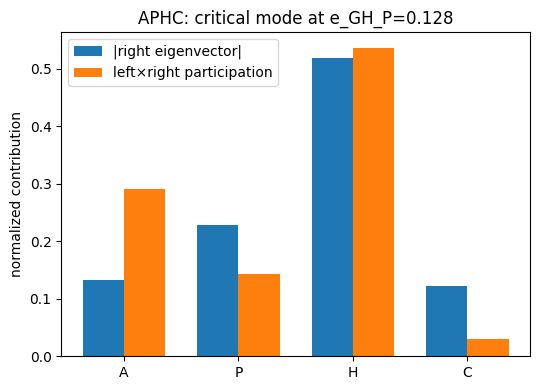

Saved figure: 22_APHC_e_GP_P_0.82328_critical_mode.[png/svg/pdf]


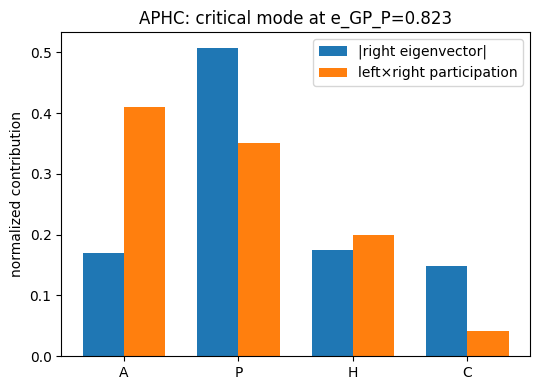

Saved figure: 22_APHC_e_LAP_A_0.79382_critical_mode.[png/svg/pdf]


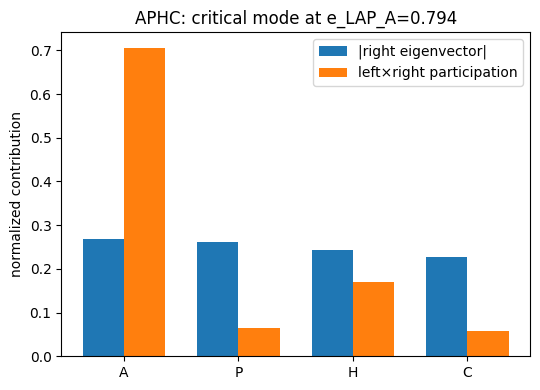

Saved figure: 22_APHC_e_LAP_P_0.41351_critical_mode.[png/svg/pdf]


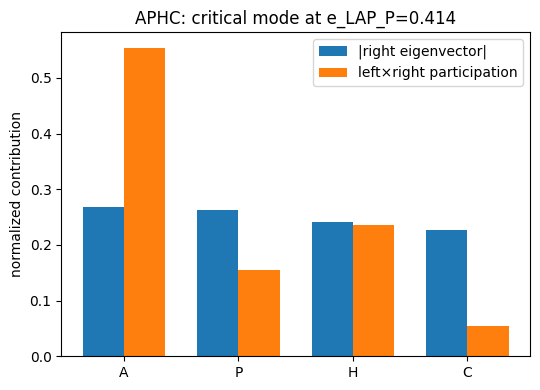

Saved figure: 22_APHC_e_LC0_C_0.8729_critical_mode.[png/svg/pdf]


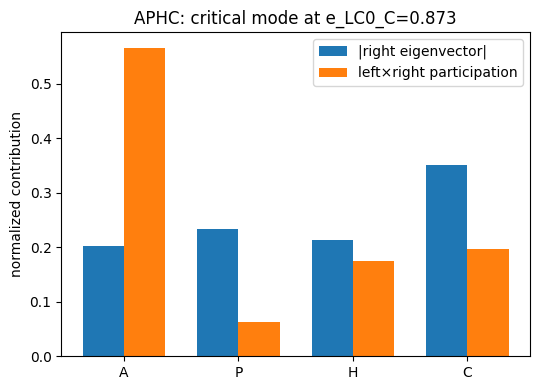

Saved figure: 22_APHC_e_LH0_H_0.74819_critical_mode.[png/svg/pdf]


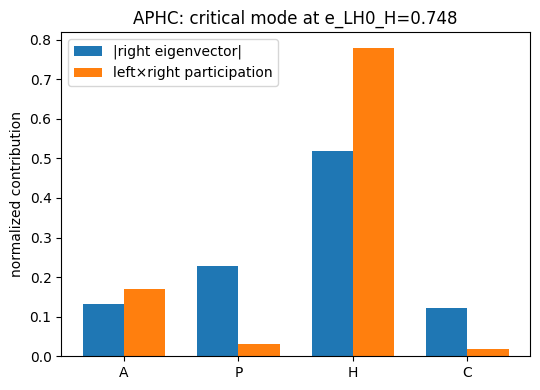

Saved figure: 22_APHC_e_LHA_H_0.80766_critical_mode.[png/svg/pdf]


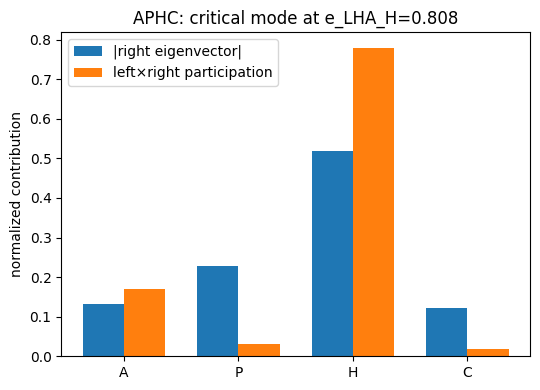

Saved figure: 22_APHC_rho_AH_0.35743_critical_mode.[png/svg/pdf]


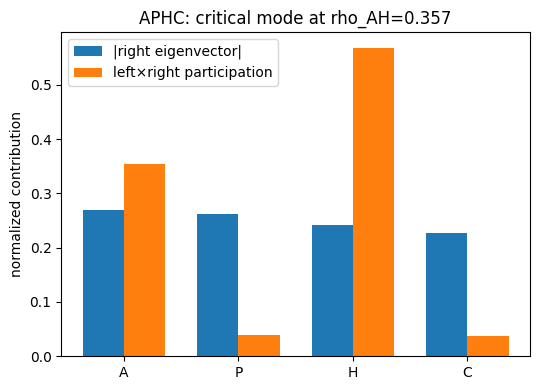

Saved figure: 22_APHC_rho_AP_0.16456_critical_mode.[png/svg/pdf]


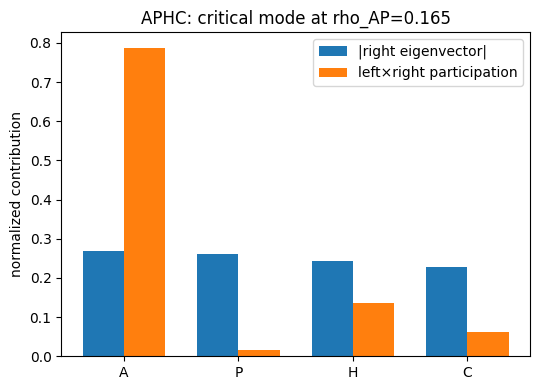

Saved figure: 22_APHC_rho_CP_0.80708_critical_mode.[png/svg/pdf]


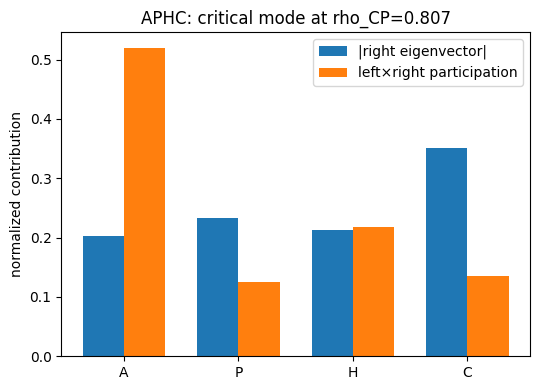

Saved figure: 22_APHC_rho_HC_0.57427_critical_mode.[png/svg/pdf]


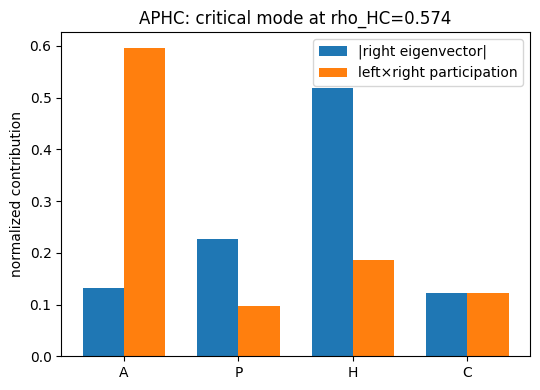

In [28]:
critical_mode_rows=[]

if len(bifurcation_summary):
    for _,r in bifurcation_summary.iterrows():
        model=r["model"]; param=r["parameter"]; x=r["critical_value"]
        J=J_at(model,representatives[model],param,x)
        evals,vr=linalg.eig(J,left=False,right=True)
        evals_l,vl=linalg.eig(J,left=True,right=False)
        k=np.argmax(evals.real)
        lam=evals[k]
        v=vr[:,k]
        # scipy left eigenvectors are columns corresponding to evals_l
        kl=np.argmin(np.abs(evals_l-lam))
        w=vl[:,kl]
        vabs=np.abs(v); vabs=vabs/vabs.sum()
        part=np.abs(np.conjugate(w)*v); part=part/part.sum()
        for i,state in enumerate(MODEL_STATES[model]):
            critical_mode_rows.append({
                "model":model,"parameter":param,"critical_value":x,
                "boundary_type":r["boundary_type"],"state":state,
                "right_eigenvector_abs_fraction":vabs[i],
                "left_right_participation":part[i]
            })

critical_modes=pd.DataFrame(critical_mode_rows)
save_table(critical_modes,"22_critical_mode_participation")

if len(critical_modes):
    for (model,param,x),g in critical_modes.groupby(["model","parameter","critical_value"]):
        fig,ax=plt.subplots(figsize=(5.5,4))
        xx=np.arange(len(g))
        ax.bar(xx-.18,g["right_eigenvector_abs_fraction"],width=.36,label="|right eigenvector|")
        ax.bar(xx+.18,g["left_right_participation"],width=.36,label="left×right participation")
        ax.set_xticks(xx,g["state"])
        ax.set_ylabel("normalized contribution")
        ax.set_title(f"{model}: critical mode at {param}={x:.3g}")
        ax.legend()
        finish_plot(f"22_{model}_{param}_{x:.5g}_critical_mode",fig)

# 19. Hopf-specific summary

For each Hopf candidate,

\[
\lambda_{1,2}\approx \pm i\omega.
\]

The notebook reports

\[
\omega=|\Im(\lambda_c)|
\]

and the corresponding linearized period

\[
T=\frac{2\pi}{\omega}.
\]

This period is expressed in the model's time units. If one turnover rate has been used to normalize time, conversion to physical units requires an empirical timescale.

Saved table: 23_Hopf_candidate_summary.csv
Saved figure: 23_Hopf_candidate_summary.[png/svg/pdf]


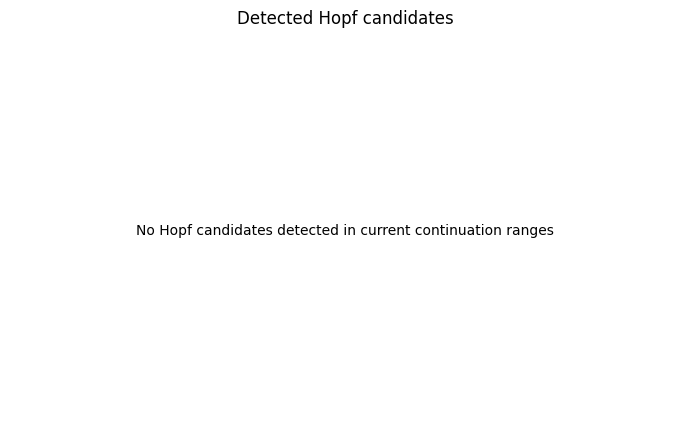

In [29]:
hopf = bifurcation_summary.query("boundary_type == 'Hopf_candidate'").copy() if len(bifurcation_summary) else pd.DataFrame()
save_table(hopf,"23_Hopf_candidate_summary")

fig,ax=plt.subplots(figsize=(7,4.5))
if len(hopf):
    labels=hopf["model"]+":"+hopf["parameter"]
    ax.scatter(hopf["critical_value"],hopf["hopf_omega"])
    for x,y,l in zip(hopf["critical_value"],hopf["hopf_omega"],labels):
        ax.annotate(l,(x,y),fontsize=8)
    ax.set_xlabel("critical parameter value")
    ax.set_ylabel("Hopf angular frequency ω")
else:
    ax.text(.5,.5,"No Hopf candidates detected in current continuation ranges",
            ha="center",va="center",transform=ax.transAxes)
    ax.set_axis_off()
ax.set_title("Detected Hopf candidates")
finish_plot("23_Hopf_candidate_summary",fig)

# 20. Two-parameter deterministic bifurcation/stability maps

The earlier two-parameter maps resampled all other parameters and estimated \(P_{\mathrm{stable}}(x,y)\).

Here, by contrast, all other parameters are held fixed at the representative stable realization. This gives a deterministic local stability diagram for a single generalized-model realization.

For every grid point the notebook stores:

- \(\lambda_{\max}\);
- whether the state is stable;
- imaginary part of the leading eigenvalue;
- a boundary class near \(\lambda_{\max}=0\).

The contour

\[
\lambda_{\max}(x,y)=0
\]

is the local stability boundary in the selected two-parameter plane.

Saved table: 24_AP_e_GA_A_x_e_GP_P_deterministic_bifurcation_map.csv
Saved figure: 24_AP_e_GA_A_x_e_GP_P_deterministic_bifurcation_map.[png/svg/pdf]


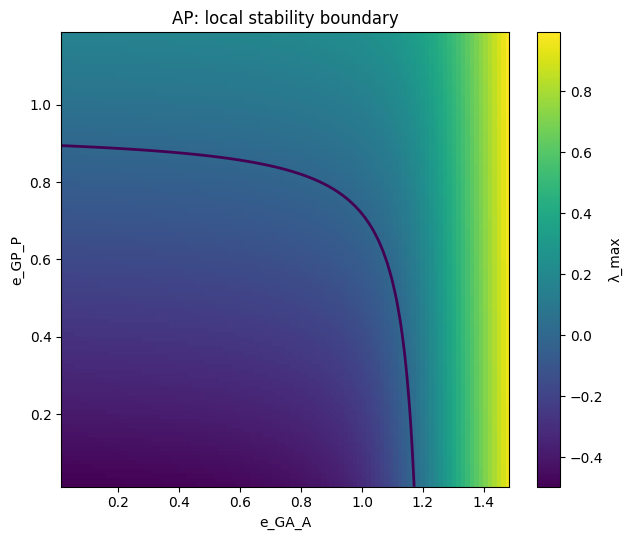

Saved figure: 25_AP_e_GA_A_x_e_GP_P_boundary_frequency_map.[png/svg/pdf]


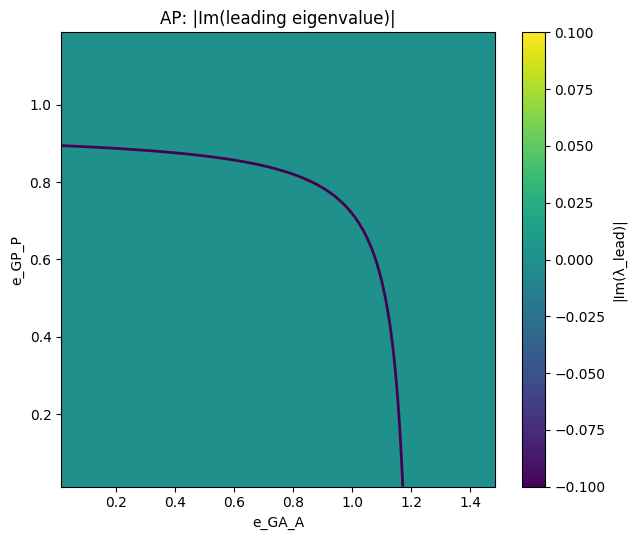

Saved table: 24_APC_e_GA_C_x_e_GA_A_deterministic_bifurcation_map.csv
Saved figure: 24_APC_e_GA_C_x_e_GA_A_deterministic_bifurcation_map.[png/svg/pdf]


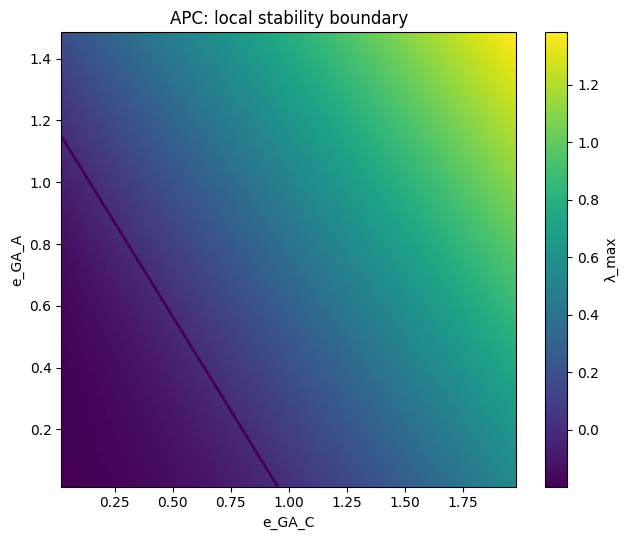

Saved figure: 25_APC_e_GA_C_x_e_GA_A_boundary_frequency_map.[png/svg/pdf]


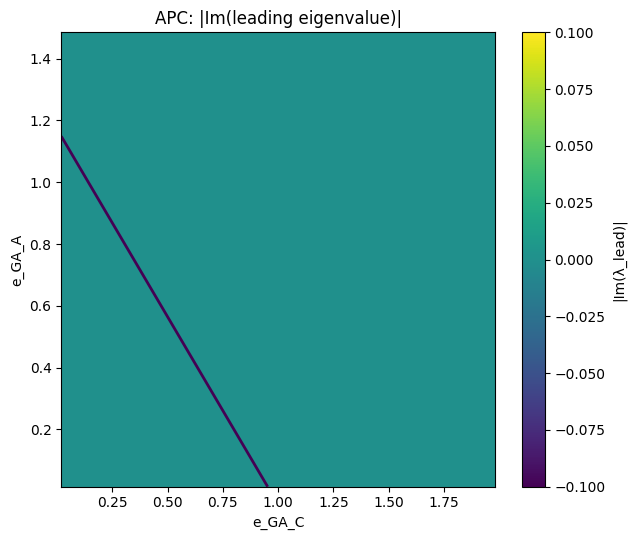

Saved table: 24_APH_e_GA_A_x_e_GH_P_deterministic_bifurcation_map.csv
Saved figure: 24_APH_e_GA_A_x_e_GH_P_deterministic_bifurcation_map.[png/svg/pdf]


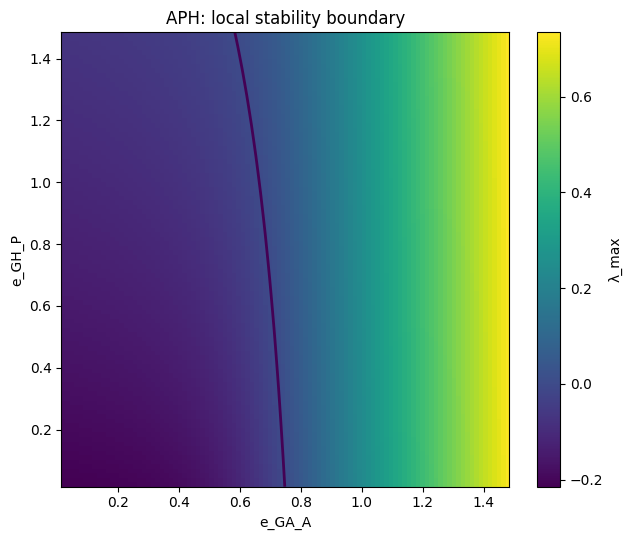

Saved figure: 25_APH_e_GA_A_x_e_GH_P_boundary_frequency_map.[png/svg/pdf]


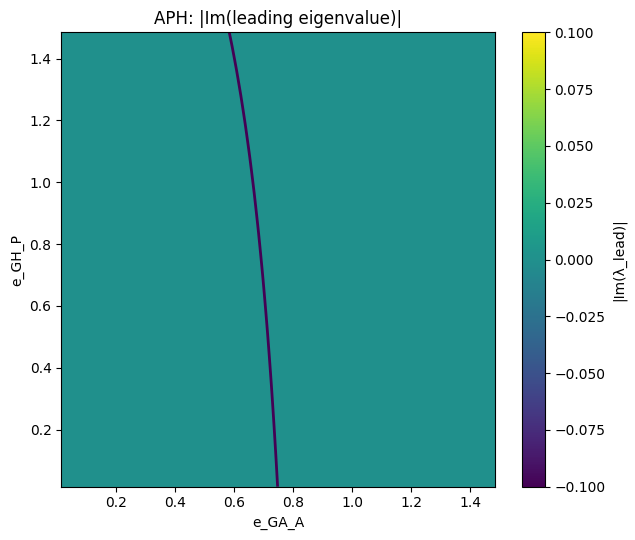

Saved table: 24_APHC_e_GA_C_x_e_GA_A_deterministic_bifurcation_map.csv
Saved figure: 24_APHC_e_GA_C_x_e_GA_A_deterministic_bifurcation_map.[png/svg/pdf]


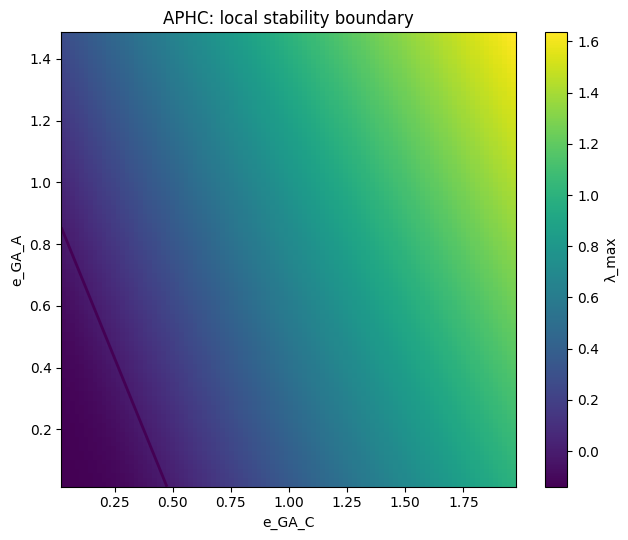

Saved figure: 25_APHC_e_GA_C_x_e_GA_A_boundary_frequency_map.[png/svg/pdf]


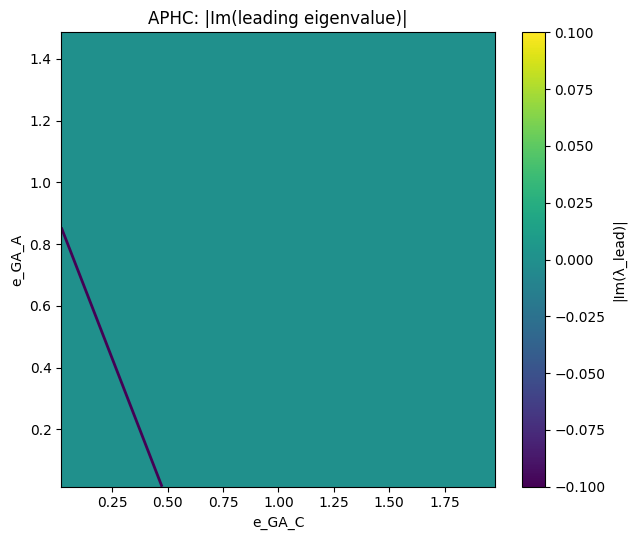

In [30]:
def deterministic_2d_map(model,base,px,gx,py,gy):
    rows=[]
    for y in gy:
        for x in gx:
            p=single_param_dict_to_arrays(base,1)
            p[px][:]=x; p[py][:]=y
            J=BUILDERS[model](p)[0]
            eig=np.linalg.eigvals(J)
            k=np.argmax(eig.real)
            lead=eig[k]
            rows.append({px:x,py:y,"leading_real":lead.real,
                         "leading_imag":lead.imag,
                         "stable":int(lead.real<0)})
    return pd.DataFrame(rows)

det_maps={}
for model in BUILDERS:
    # Use two parameters with strongest univariate stability association.
    top=association_tables[model]["parameter"].head(2).tolist()
    if len(top)<2: continue
    px,py=top
    vx=ensembles[model]["params"][px]; vy=ensembles[model]["params"][py]
    gx=np.linspace(np.quantile(vx,.01),np.quantile(vx,.99),100)
    gy=np.linspace(np.quantile(vy,.01),np.quantile(vy,.99),100)
    df=deterministic_2d_map(model,representatives[model],px,gx,py,gy)
    det_maps[model]=(px,py,df)
    save_table(df,f"24_{model}_{px}_x_{py}_deterministic_bifurcation_map")

    Z=df.pivot(index=py,columns=px,values="leading_real")
    fig,ax=plt.subplots(figsize=(6.5,5.5))
    im=ax.imshow(Z.values,origin="lower",aspect="auto",
                 extent=[Z.columns.min(),Z.columns.max(),Z.index.min(),Z.index.max()])
    ax.contour(Z.columns,Z.index,Z.values,levels=[0],linewidths=2)
    ax.set_xlabel(px); ax.set_ylabel(py)
    ax.set_title(f"{model}: local stability boundary")
    fig.colorbar(im,ax=ax,label="λ_max")
    finish_plot(f"24_{model}_{px}_x_{py}_deterministic_bifurcation_map",fig)

    I=df.pivot(index=py,columns=px,values="leading_imag")
    fig,ax=plt.subplots(figsize=(6.5,5.5))
    im=ax.imshow(np.abs(I.values),origin="lower",aspect="auto",
                 extent=[I.columns.min(),I.columns.max(),I.index.min(),I.index.max()])
    ax.contour(Z.columns,Z.index,Z.values,levels=[0],linewidths=2)
    ax.set_xlabel(px); ax.set_ylabel(py)
    ax.set_title(f"{model}: |Im(leading eigenvalue)|")
    fig.colorbar(im,ax=ax,label="|Im(λ_lead)|")
    finish_plot(f"25_{model}_{px}_x_{py}_boundary_frequency_map",fig)

# 21. Distance to a local stability boundary

For a stable representative parameter set, a useful robustness measure is the smallest one-dimensional parameter change required to reach a detected local stability boundary.

For parameter \(p\),

\[
d_p
=
\frac{|p_{\mathrm{crit}}-p_0|}
{\text{prior range of }p}.
\]

This is a dimensionless, prior-scaled distance. It is not a global shortest distance in the full parameter space, but it identifies locally fragile directions under one-at-a-time parameter changes.

Saved table: 26_distance_to_local_stability_boundary.csv
Saved figure: 26_distance_to_local_stability_boundary.[png/svg/pdf]


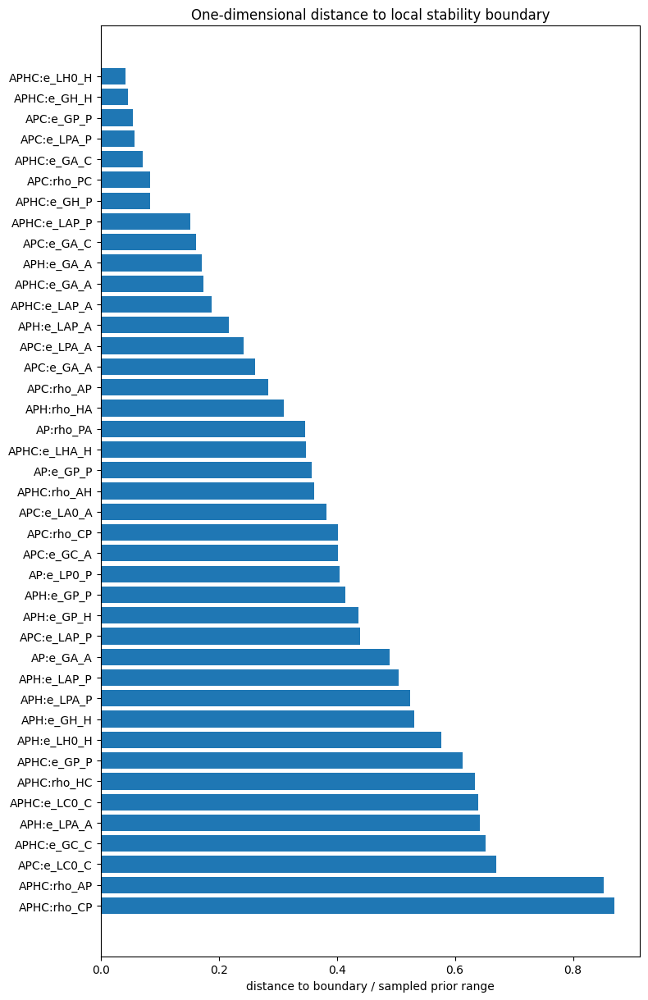

In [31]:
distance_rows=[]
if len(bifurcation_summary):
    for _,r in bifurcation_summary.iterrows():
        model=r["model"]; par=r["parameter"]; crit=r["critical_value"]
        base=representatives[model][par]
        vals=ensembles[model]["params"][par]
        prange=np.quantile(vals,.99)-np.quantile(vals,.01)
        distance_rows.append({
            "model":model,"parameter":par,"base_value":base,
            "critical_value":crit,"absolute_distance":abs(crit-base),
            "prior_scaled_distance":abs(crit-base)/prange if prange>0 else np.nan,
            "boundary_type":r["boundary_type"]
        })
distance_df=pd.DataFrame(distance_rows)
save_table(distance_df,"26_distance_to_local_stability_boundary")

fig,ax=plt.subplots(figsize=(8,max(4,.3*max(1,len(distance_df)))))
if len(distance_df):
    d=distance_df.sort_values("prior_scaled_distance",ascending=False)
    labels=d["model"]+":"+d["parameter"]
    ax.barh(labels,d["prior_scaled_distance"])
    ax.set_xlabel("distance to boundary / sampled prior range")
else:
    ax.text(.5,.5,"No one-parameter boundaries detected",ha="center",va="center",transform=ax.transAxes)
    ax.set_axis_off()
ax.set_title("One-dimensional distance to local stability boundary")
finish_plot("26_distance_to_local_stability_boundary",fig)

# 22. Characteristic-polynomial / Routh–Hurwitz diagnostics

For an \(n\)-state system, write the characteristic polynomial as

\[
\det(\lambda I-J)
=
\lambda^n+a_1\lambda^{n-1}+\cdots+a_n.
\]

For the 2-state model, stability requires

\[
a_1>0,\qquad a_2>0,
\]

which is equivalent to negative trace and positive determinant.

For the 3-state models, the Routh–Hurwitz conditions are

\[
a_1>0,\qquad
a_2>0,\qquad
a_3>0,\qquad
a_1a_2>a_3.
\]

The equality

\[
a_1a_2=a_3
\]

is associated with a Hopf boundary when the remaining non-degeneracy conditions hold.

For the 4-state model, the notebook exports the polynomial coefficients and uses numerical eigenvalues as the primary stability criterion. This avoids obscuring the analysis with a long symbolic expression while preserving all coefficients for subsequent analytical work.

Saved table: 27_characteristic_polynomial_Routh_Hurwitz_diagnostics.csv
Saved figure: 27_APC_Routh_Hurwitz_Hopf_plane.[png/svg/pdf]


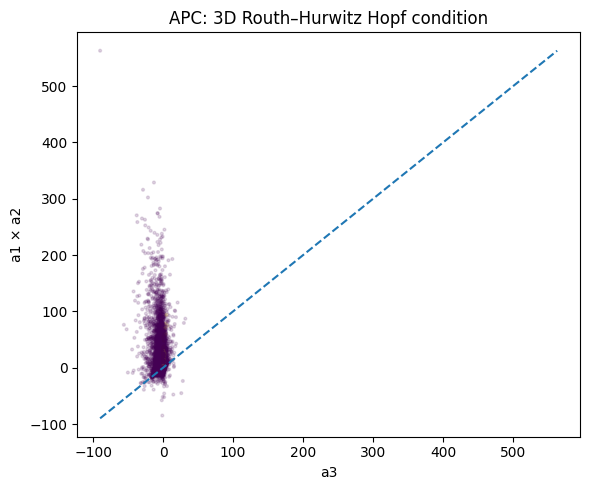

Saved figure: 27_APH_Routh_Hurwitz_Hopf_plane.[png/svg/pdf]


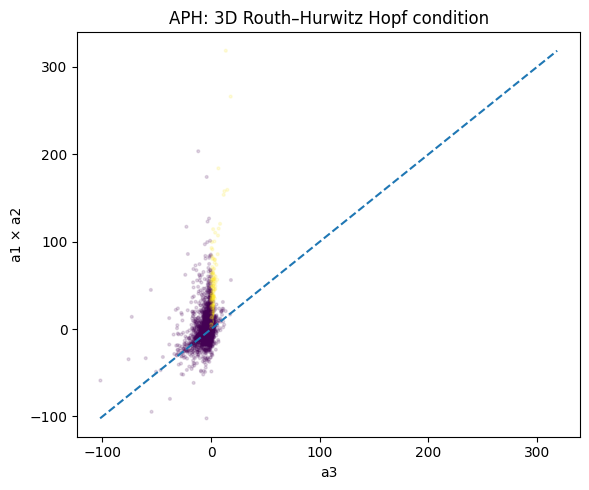

In [32]:
rh_rows=[]
for model,d in ensembles.items():
    # cap for file size / speed
    for i,J in enumerate(d["J"][:min(20000,len(d["J"]))]):
        coeff=np.poly(J).real  # [1,a1,...,an]
        row={"model":model,"sample_index":i,"stable":int(d["res"]["stable"][i])}
        for k,a in enumerate(coeff[1:],1):
            row[f"a{k}"]=a
        if len(coeff)==3:
            row["RH_margin_2D_a1"]=coeff[1]
            row["RH_margin_2D_a2"]=coeff[2]
        elif len(coeff)==4:
            a1,a2,a3=coeff[1:]
            row["RH_a1a2_minus_a3"]=a1*a2-a3
        rh_rows.append(row)
rh=pd.DataFrame(rh_rows)
save_table(rh,"27_characteristic_polynomial_Routh_Hurwitz_diagnostics")

for model in ["APC","APH"]:
    g=rh[rh.model==model]
    if len(g):
        fig,ax=plt.subplots(figsize=(6,5))
        ax.scatter(g["a3"],g["a1"]*g["a2"],s=4,alpha=.15,c=g["stable"])
        lo=min(g["a3"].min(),(g["a1"]*g["a2"]).min())
        hi=max(g["a3"].max(),(g["a1"]*g["a2"]).max())
        ax.plot([lo,hi],[lo,hi],linestyle="--")
        ax.set_xlabel("a3")
        ax.set_ylabel("a1 × a2")
        ax.set_title(f"{model}: 3D Routh–Hurwitz Hopf condition")
        finish_plot(f"27_{model}_Routh_Hurwitz_Hopf_plane",fig)

# 23. Prior-sensitivity analysis

A GSKM ensemble result is conditional on the sampled generalized-parameter ranges. To test robustness, the notebook repeats the stability screen after contracting or expanding all non-branching elasticity ranges around their sampled medians.

This does **not** create a biologically labelled “resilience regime.” It is a methodological sensitivity analysis asking how strongly conclusions depend on prior width.

The output should be interpreted as:

\[
\text{robust conclusion}
\Rightarrow
\text{qualitatively similar result across reasonable prior widths}.
\]

Saved table: 28_prior_width_sensitivity.csv
Saved figure: 28_prior_width_sensitivity.[png/svg/pdf]


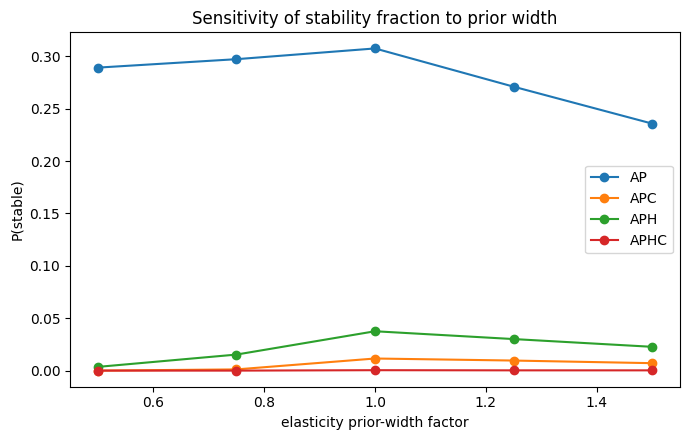

In [33]:
def prior_width_transform(params, factor):
    q={}
    for k,v in params.items():
        v=np.asarray(v)
        # Branches and turnover rates are left unchanged in this simple diagnostic.
        if k.startswith("e_"):
            med=np.median(v)
            lo,hi=v.min(),v.max()
            new_lo=max(0, med-factor*(med-lo))
            new_hi=med+factor*(hi-med)
            # preserve ranks approximately via min-max mapping
            if hi>lo:
                z=(v-lo)/(hi-lo)
                q[k]=new_lo+z*(new_hi-new_lo)
            else:
                q[k]=v.copy()
        else:
            q[k]=v.copy()
    return q

prior_sens_rows=[]
for model in BUILDERS:
    base_sample=sample_params(model,20_000,SEED+900)
    for factor in [0.5,0.75,1.0,1.25,1.5]:
        p=prior_width_transform(base_sample,factor)
        res=analyze_jacobians(BUILDERS[model](p))
        k=res["stable"].sum(); n=len(res["stable"])
        lo,hi=wilson_ci(int(k),n)
        prior_sens_rows.append({"model":model,"elasticity_width_factor":factor,
                                "P_stable":k/n,"CI95_low":lo,"CI95_high":hi})
prior_sens=pd.DataFrame(prior_sens_rows)
save_table(prior_sens,"28_prior_width_sensitivity")

fig,ax=plt.subplots(figsize=(7,4.5))
for model,g in prior_sens.groupby("model"):
    ax.plot(g["elasticity_width_factor"],g["P_stable"],marker="o",label=model)
ax.set_xlabel("elasticity prior-width factor")
ax.set_ylabel("P(stable)")
ax.set_title("Sensitivity of stability fraction to prior width")
ax.legend()
finish_plot("28_prior_width_sensitivity",fig)

# 24. Bootstrap uncertainty for parameter–stability associations

The Monte Carlo ensemble itself is finite. To quantify sampling uncertainty of the point-biserial association, bootstrap resampling is used.

For each bootstrap replicate, sample ensemble rows with replacement and recompute

\[
r_{\mathrm{pb}}(p_i,s).
\]

The 2.5th and 97.5th percentiles form a non-parametric 95% bootstrap interval.

Saved table: 29_bootstrap_parameter_stability_associations.csv
Saved figure: 29_bootstrap_parameter_stability_associations.[png/svg/pdf]


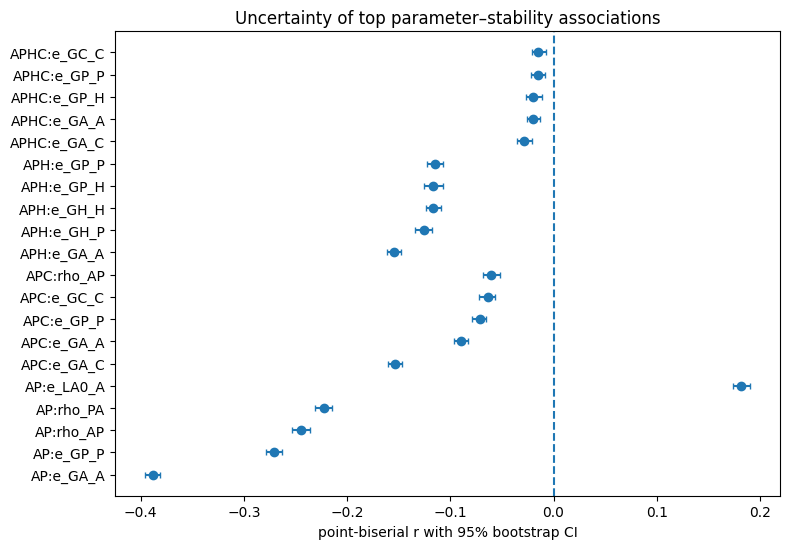

In [34]:
def bootstrap_top_associations(model, top_n=5, B=BOOT_N, seed=321):
    d=ensembles[model]
    pars=association_tables[model]["parameter"].head(top_n).tolist()
    y=d["res"]["stable"].astype(int)
    n=len(y)
    r=np.random.default_rng(seed)
    rows=[]
    for par in pars:
        x=d["params"][par]
        vals=[]
        for b in range(B):
            idx=r.integers(0,n,n)
            if np.std(x[idx])==0 or np.std(y[idx])==0:
                continue
            vals.append(stats.pointbiserialr(y[idx],x[idx]).statistic)
        rows.append({
            "model":model,"parameter":par,
            "r_observed":stats.pointbiserialr(y,x).statistic,
            "bootstrap_low":np.quantile(vals,.025),
            "bootstrap_high":np.quantile(vals,.975),
            "B_valid":len(vals)
        })
    return pd.DataFrame(rows)

boot_tabs=[]
for model in BUILDERS:
    bt=bootstrap_top_associations(model)
    boot_tabs.append(bt)
boot=pd.concat(boot_tabs,ignore_index=True)
save_table(boot,"29_bootstrap_parameter_stability_associations")

fig,ax=plt.subplots(figsize=(8,max(5,.28*len(boot))))
labels=boot["model"]+":"+boot["parameter"]
x=boot["r_observed"]
err=np.vstack([x-boot["bootstrap_low"],boot["bootstrap_high"]-x])
ax.errorbar(x,labels,xerr=err,fmt="o",capsize=2)
ax.axvline(0,linestyle="--")
ax.set_xlabel("point-biserial r with 95% bootstrap CI")
ax.set_title("Uncertainty of top parameter–stability associations")
finish_plot("29_bootstrap_parameter_stability_associations",fig)

# 25. Pairwise parameter dependence within stable versus unstable ensembles

Even when parameters are sampled independently, conditioning on stability can induce dependencies: stable realizations may require compensatory combinations.

For each model, the notebook computes Pearson correlation matrices separately for stable and unstable subsets and plots

\[
\Delta R
=
R_{\mathrm{stable}}-R_{\mathrm{unstable}}.
\]

This is an exploratory way to identify parameter combinations that jointly define the stable region.

Saved table: 30_AP_stable_parameter_correlations.csv
Saved table: 30_AP_unstable_parameter_correlations.csv
Saved table: 30_AP_delta_parameter_correlations.csv
Saved figure: 30_AP_stable_vs_unstable_parameter_correlation_difference.[png/svg/pdf]


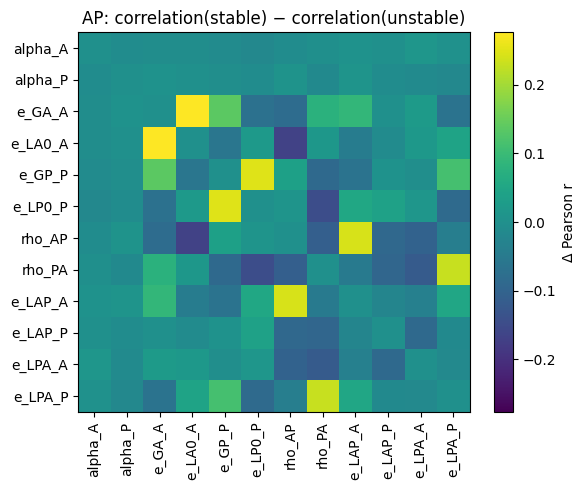

Saved table: 30_APC_stable_parameter_correlations.csv
Saved table: 30_APC_unstable_parameter_correlations.csv
Saved table: 30_APC_delta_parameter_correlations.csv
Saved figure: 30_APC_stable_vs_unstable_parameter_correlation_difference.[png/svg/pdf]


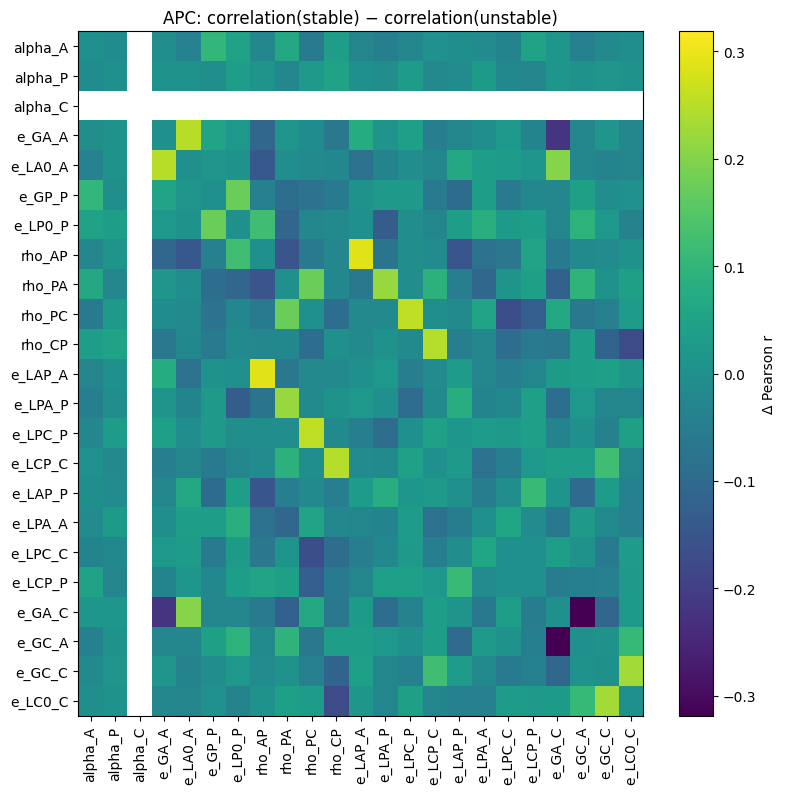

Saved table: 30_APH_stable_parameter_correlations.csv
Saved table: 30_APH_unstable_parameter_correlations.csv
Saved table: 30_APH_delta_parameter_correlations.csv
Saved figure: 30_APH_stable_vs_unstable_parameter_correlation_difference.[png/svg/pdf]


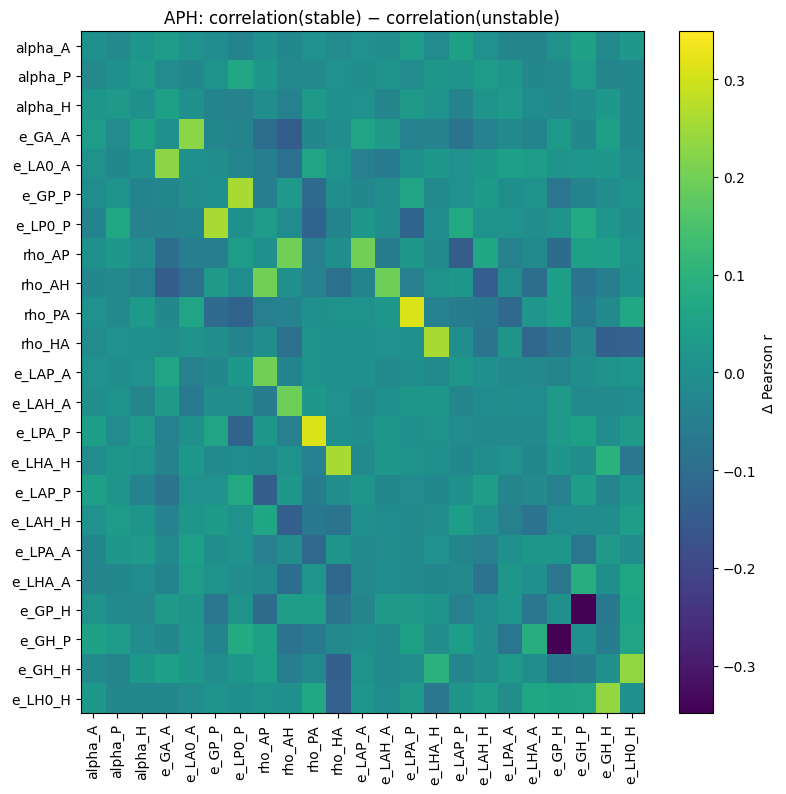

Saved table: 30_APHC_stable_parameter_correlations.csv
Saved table: 30_APHC_unstable_parameter_correlations.csv
Saved table: 30_APHC_delta_parameter_correlations.csv
Saved figure: 30_APHC_stable_vs_unstable_parameter_correlation_difference.[png/svg/pdf]


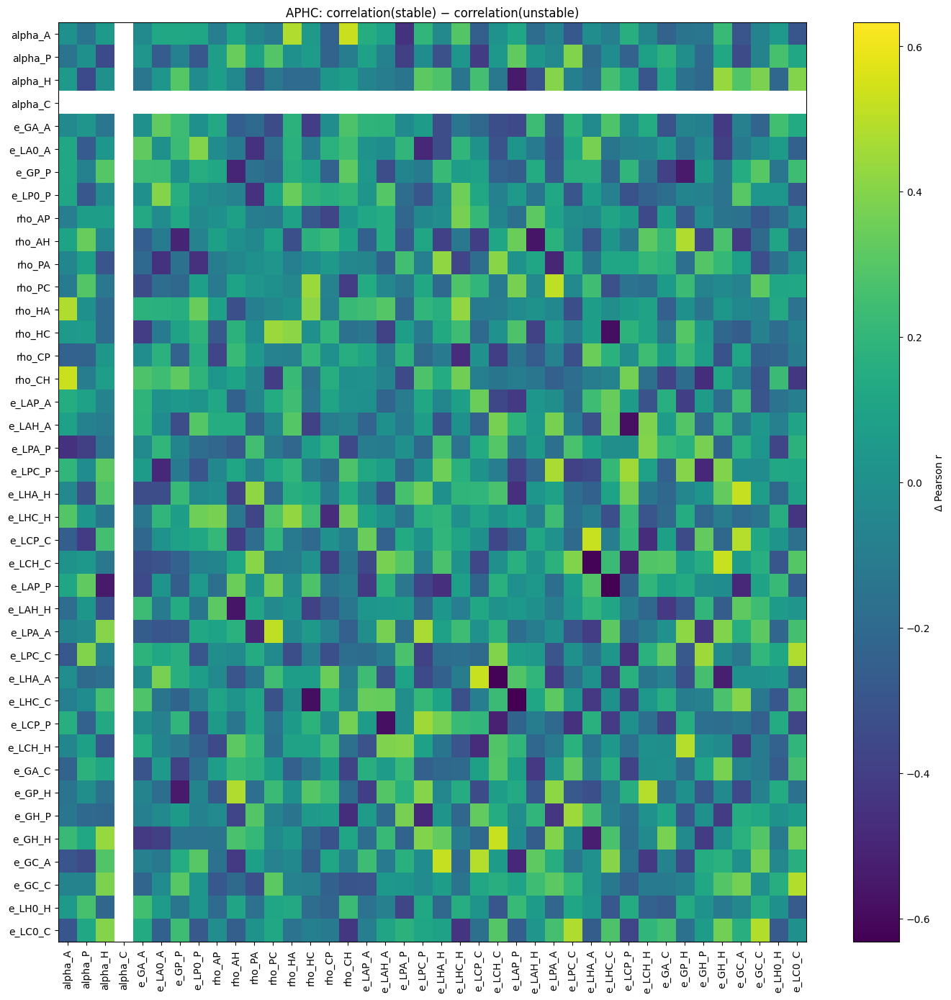

In [35]:
for model,d in ensembles.items():
    X=params_to_frame(d["params"])
    stable=d["res"]["stable"]
    if stable.sum()<3 or (~stable).sum()<3:
        continue
    Rs=X[stable].corr()
    Ru=X[~stable].corr()
    D=Rs-Ru
    save_table(Rs.reset_index(),f"30_{model}_stable_parameter_correlations")
    save_table(Ru.reset_index(),f"30_{model}_unstable_parameter_correlations")
    save_table(D.reset_index(),f"30_{model}_delta_parameter_correlations")

    fig,ax=plt.subplots(figsize=(max(6,.35*len(D)),max(5,.35*len(D))))
    im=ax.imshow(D.values,aspect="auto",vmin=-np.nanmax(np.abs(D.values)),
                 vmax=np.nanmax(np.abs(D.values)))
    ax.set_xticks(range(len(D)),D.columns,rotation=90)
    ax.set_yticks(range(len(D)),D.index)
    ax.set_title(f"{model}: correlation(stable) − correlation(unstable)")
    fig.colorbar(im,ax=ax,label="Δ Pearson r")
    finish_plot(f"30_{model}_stable_vs_unstable_parameter_correlation_difference",fig)

# 26. Recovery-time distributions

For stable systems, the dominant asymptotic linear recovery time is

\[
\tau_{\mathrm{dom}}=-\frac{1}{\lambda_{\max}}.
\]

As \(\lambda_{\max}\rightarrow0^{-}\), this timescale diverges, which is the local linear signature of **critical slowing down**.

The plot is shown on a logarithmic axis because recovery times can span orders of magnitude near a stability boundary.

Saved figure: 31_recovery_time_distributions.[png/svg/pdf]


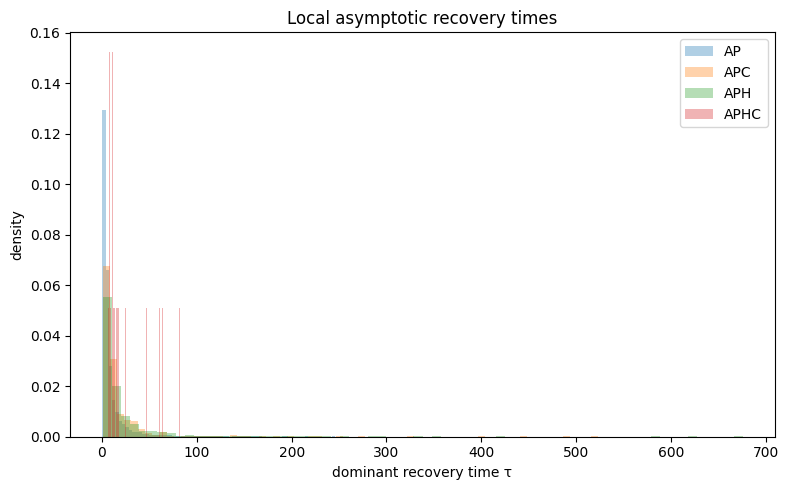

Saved table: 31_recovery_time_summary.csv


In [36]:
fig,ax=plt.subplots(figsize=(8,5))
recovery_summary=[]
for model,d in ensembles.items():
    t=d["res"]["recovery_time"]
    t=t[np.isfinite(t)]
    if len(t):
        cap=np.quantile(t,.99)
        ax.hist(t[t<=cap],bins=70,density=True,alpha=.35,label=model)
        recovery_summary.append({
            "model":model,"N_stable":len(t),"median_tau":np.median(t),
            "q25_tau":np.quantile(t,.25),"q75_tau":np.quantile(t,.75),
            "q95_tau":np.quantile(t,.95)
        })
ax.set_xlabel("dominant recovery time τ")
ax.set_ylabel("density")
ax.set_title("Local asymptotic recovery times")
ax.legend()
finish_plot("31_recovery_time_distributions",fig)
recovery_summary=pd.DataFrame(recovery_summary)
save_table(recovery_summary,"31_recovery_time_summary")

# 27. Relationship between stability margin and press sensitivity

Local stability and perturbation resistance are related but not identical.

For stable samples, compare

\[
-\lambda_{\max}
\]

with

\[
\|J^{-1}\|_2.
\]

The first describes the asymptotic stability margin of the dominant eigenmode. The second measures the maximum linear amplification of a persistent input into a steady-state displacement.

A Spearman correlation is reported because both quantities can be strongly non-Gaussian.

Saved figure: 32_AP_stability_margin_vs_press_amplification.[png/svg/pdf]


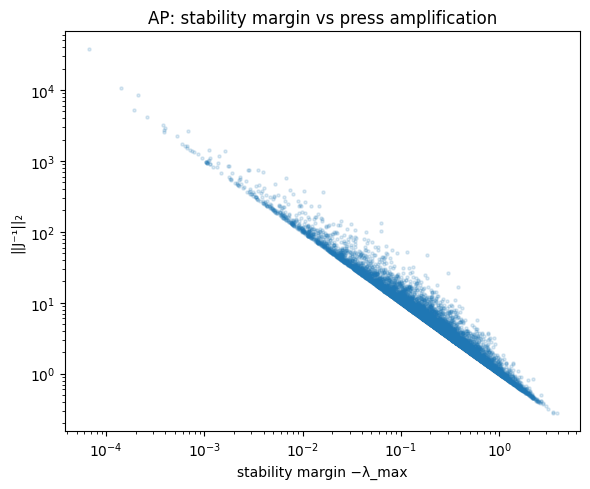

Saved figure: 32_APC_stability_margin_vs_press_amplification.[png/svg/pdf]


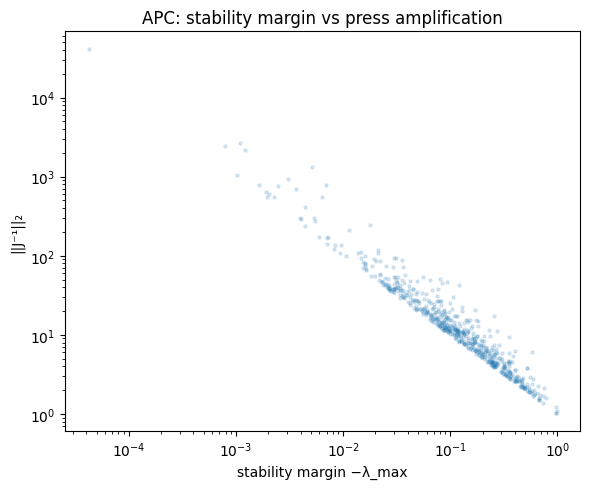

Saved figure: 32_APH_stability_margin_vs_press_amplification.[png/svg/pdf]


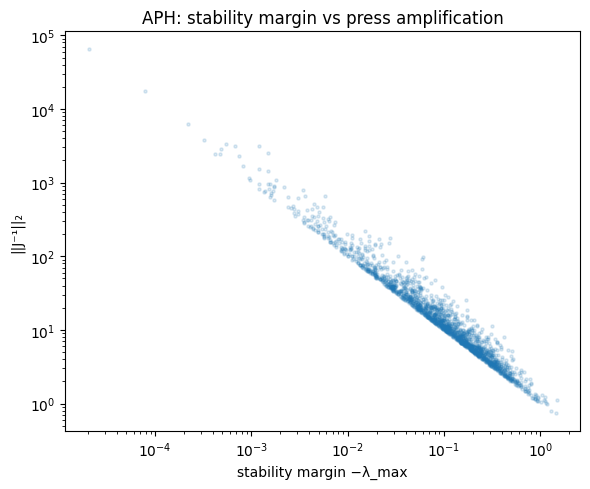

Saved figure: 32_APHC_stability_margin_vs_press_amplification.[png/svg/pdf]


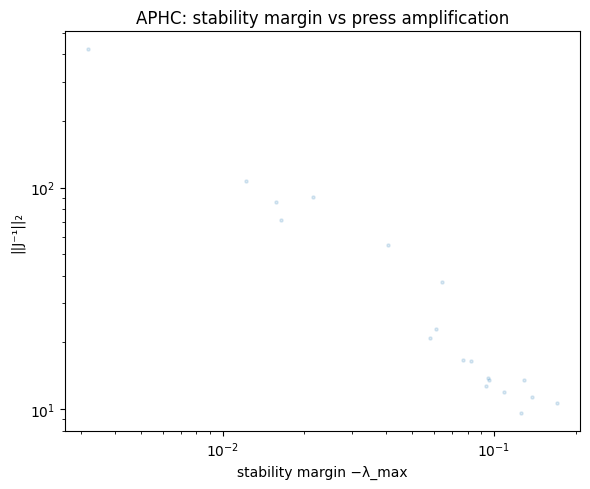

Saved table: 32_stability_margin_vs_press_amplification_stats.csv


,model,N,spearman_rho,p,q_BH
0,AP,10000,-0.985157,0.000000e+00,0.000000e+00
1,APC,597,-0.968604,0.000000e+00,0.000000e+00
2,APH,1889,-0.978181,0.000000e+00,0.000000e+00
3,APHC,19,-0.954386,2.367672e-10,2.367672e-10


In [37]:
margin_press_rows=[]
for model,d in ensembles.items():
    idx=np.where(d["res"]["stable"])[0][:10000]
    x=[]; y=[]
    for i in idx:
        try:
            invnorm=np.linalg.norm(np.linalg.inv(d["J"][i]),2)
        except np.linalg.LinAlgError:
            continue
        x.append(-d["res"]["leading_real"][i])
        y.append(invnorm)
    x=np.asarray(x); y=np.asarray(y)
    if len(x):
        rho,pv=stats.spearmanr(x,y)
        margin_press_rows.append({"model":model,"N":len(x),"spearman_rho":rho,"p":pv})
        fig,ax=plt.subplots(figsize=(6,5))
        ax.scatter(x,y,s=5,alpha=.15)
        ax.set_xscale("log"); ax.set_yscale("log")
        ax.set_xlabel("stability margin −λ_max")
        ax.set_ylabel("||J⁻¹||₂")
        ax.set_title(f"{model}: stability margin vs press amplification")
        finish_plot(f"32_{model}_stability_margin_vs_press_amplification",fig)

margin_press=pd.DataFrame(margin_press_rows)
margin_press["q_BH"]=fdr_bh(margin_press["p"].to_numpy()) if len(margin_press) else []
save_table(margin_press,"32_stability_margin_vs_press_amplification_stats")
margin_press

# 28. Model-comparison summary without ranking

The models answer different biological questions, so the notebook does not declare one architecture “best” from its stability fraction.

Instead, it exports a descriptive comparison containing:

- dimensionality;
- sampled stable fraction;
- median stability margin;
- stable recovery timescale;
- fraction of stable samples that are locally reactive;
- median press amplification.

These quantities should be interpreted within each model's structural assumptions and priors.

In [38]:
comparison=[]
for model,d in ensembles.items():
    stable=d["res"]["stable"]
    w,_=nonnormal_metrics(d["J"])
    idx=np.where(stable)[0][:10000]
    invnorm=[]
    for i in idx:
        try: invnorm.append(np.linalg.norm(np.linalg.inv(d["J"][i]),2))
        except: pass
    comparison.append({
        "model":model,
        "states":"-".join(MODEL_STATES[model]),
        "n_states":len(MODEL_STATES[model]),
        "P_stable":stable.mean(),
        "median_lambda_max":np.median(d["res"]["leading_real"]),
        "median_tau_stable":np.nanmedian(d["res"]["recovery_time"]),
        "fraction_stable_reactive":np.mean(w[stable]>0) if stable.any() else np.nan,
        "median_inverse_J_norm_stable":np.median(invnorm) if invnorm else np.nan,
    })
comparison=pd.DataFrame(comparison)
save_table(comparison,"33_model_descriptive_comparison")
comparison

Saved table: 33_model_descriptive_comparison.csv


,model,states,n_states,P_stable,median_lambda_max,median_tau_stable,fraction_stable_reactive,median_inverse_J_norm_stable
0,AP,A-P,2,0.30656,0.256126,4.261338,0.219337,4.799826
1,APC,A-P-C,3,0.01194,1.885528,8.535746,0.551089,11.388159
2,APH,A-P-H,3,0.03778,0.804106,9.598187,0.533616,12.099007
3,APHC,A-P-H-C,4,0.00038,2.210712,12.967455,1.000000,16.692661


# 29. Optional high-resolution final run

The analyses above use Colab-friendly defaults. For final figures, increase:

```python
MAIN_N = 200_000
SWEEP_N = 5_000
MAP_N = 1_000
BOOT_N = 2_000
```

and rerun the notebook from the beginning.

For particularly small stable regions in the 4-state model, a larger `MAIN_N` may be necessary to obtain enough stable realizations for stable-subset statistics.

Do not increase sample size as a substitute for improving the biological prior ranges: Monte Carlo precision and biological plausibility are separate issues.

# 30. Interpretation checklist

## What the notebook can support

A result can be phrased in terms of:

- local stability of an unspecified positive steady state;
- generalized parameters associated with stable versus unstable realizations;
- local stability margin;
- dominant local recovery timescale;
- persistent-perturbation sensitivity;
- transient reactivity/non-normality;
- local zero-eigenvalue or Hopf stability boundaries;
- critical-mode composition;
- interactions among generalized parameters;
- robustness of conclusions to exploratory prior ranges.

## What should not be claimed directly

The analyses do **not** by themselves establish:

- that a model is biologically “resilient” or “vulnerable”;
- the actual location of the biological steady state;
- a full nonlinear stress/recovery trajectory;
- that a zero-eigenvalue crossing is specifically saddle-node, transcritical, or pitchfork;
- whether a Hopf bifurcation is supercritical or subcritical;
- empirical parameter values unless they are later constrained by data;
- causal biological effects from parameter–stability correlations.

A suitable framing is:

> **The GSKM identifies structural and local dynamical conditions that support or undermine stable and perturbation-resistant regulation.**

# 31. Output manifest

This final cell scans the current working directory and writes a manifest of all generated analysis outputs. This makes transfer into a repository straightforward later.

In [39]:
files=[]
for p in sorted(OUTPUT_DIR.iterdir()):
    if p.is_file() and p.suffix.lower() in {".csv",".png",".svg",".pdf",".json"}:
        files.append({"filename":p.name,"suffix":p.suffix.lower(),"size_bytes":p.stat().st_size})
manifest=pd.DataFrame(files)
save_table(manifest,"99_output_manifest")
manifest

Saved table: 99_output_manifest.csv


,filename,suffix,size_bytes
0,01_one_node_analytic_stability.csv,.csv,105
1,01_one_node_eigenvalue_map.pdf,.pdf,562044
2,01_one_node_eigenvalue_map.png,.png,156129
3,01_one_node_eigenvalue_map.svg,.svg,7551368
4,02_APC_parameter_prior_summary.csv,.csv,3402
...,...,...,...
1151,32_AP_stability_margin_vs_press_amplification.pdf,.pdf,168909
1152,32_AP_stability_margin_vs_press_amplification.png,.png,223031
1153,32_AP_stability_margin_vs_press_amplification.svg,.svg,1532915
1154,32_stability_margin_vs_press_amplification_sta...,.csv,211
